<a href="https://colab.research.google.com/github/JhonathanOrtiz/Reinforcement-Learning-DQN/blob/master/DQN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, BatchNormalization, ReLU, Flatten
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.utils import to_categorical
import matplotlib.pyplot as plt
import keras

def q_network():
  model = Sequential()

  model.add(Conv2D(
      filters=3,
      kernel_size=3,
      strides=2,
      padding='same',
      input_shape=((env.observation_space.shape)),
      activation='relu'
       
  ))

  model.add(Conv2D(
      filters=16,
      kernel_size=3,
      strides=2,
      padding='same',
      activation='relu'    
  ))

  model.add(Conv2D(
      filters=32,
      kernel_size=3,
      strides=2,
      padding='same', 
      activation='relu'     
  ))


  model.add(ReLU())

  model.add(Flatten())

  model.add(Dense(256, activation='relu'))
  model.add(Dense(
        env.action_space.n, 
        name='Output',
        kernel_initializer='random_uniform',
        
        activation='softmax')
       )
  
  optimizer = Adam(0.00025)
  
  model.compile(
          optimizer=optimizer, 
          loss=MeanSquaredError(), 
          metrics=['acc'])
  

      
  return model

Using TensorFlow backend.


In [0]:
from numpy import argmax
from random import random

def get_action_and_value_epsilon_greedy(q_values):

  if random() < EPSILON:

    action, action_q_value = get_random_action_and_value(q_values)
  
  else:
    action, action_q_value = get_best_action_and_value(q_values)

  return action, action_q_value

def get_random_action_and_value(q_values):

    action = env.action_space.sample()

    q_value_action = q_values[action]

    return action, q_value_action

def get_best_action_and_value(q_values):

    action = argmax(q_values)

    q_value_action = q_values[action]

    return action, q_value_action



In [0]:
from keras.utils import to_categorical
from numpy import expand_dims, argmax
import gym
from skimage.color import  rgb2gray

def reward_from_greedy_episode(network, render=False):

  envoirement = gym.make('SpaceInvaders-v0')
  obs = envoirement.reset()
  obs = normalize_frame(obs)
  total_rew = 0
  don = False

  while not don:

    obs = expand_dims(obs, axis=0)
    q_values = network.predict(obs)[0]
    action = argmax(q_values)

    new_obs, rew, don, _ = envoirement.step(action)
    
    new_obs = normalize_frame(new_obs)
    total_rew += rew
    obs = new_obs
  
  if render:
    envoirement.render()

  return total_rew






In [0]:
from collections import deque, namedtuple
from random import sample
from numpy import array
import numpy as np
class memory_reply:

  def __init__(self, length):

    self.memory_buffer = deque([], maxlen=length)
    self.memory_vector = namedtuple('memory_vector', field_names=[
                                                                 'actual_state',
                                                                 'action',
                                                                 'next_state',
                                                                 'reward',
                                                                 'done'
                                                                
    ])

  def memorize(self, state, action, new_state, reward, done):

    vector = self.memory_vector(
        actual_state=state,
        action=action,
        next_state=new_state,
        reward=reward,
        done=done
    )

    self.memory_buffer.append(vector)

  def reset(self):

    self.memory_buffer.clear()

  def memory_size(self):
    return len(self.memory_buffer)

  def get_bacth(self, batch_size):

    if batch_size > len(self.memory_buffer):

      raise Exception('You request {} and there are {} instaces in memory'.format(batch_size, len(self.memory_buffer)))
    
    mem_batch = namedtuple(
            'mem_batch',
            field_names = ['actual_states', 'actions', 'next_states', 'rewards', 'dones']
        )
        
        # Tomamos de la memoria un número aleatorio n de instancias
        
    instances = sample(self.memory_buffer, batch_size)

    actual_state_sample = array([instance.actual_state for instance in instances])  # Array con los estados actuales
    action_sample = array([instance.action for instance in instances]) # Array con las acciones realizadas en esos estados
    next_state_sample = array([instance.next_state for instance in instances]) # Array con los estados alcanzados
    reward_sample = array([instance.reward for instance in instances]) # Array con las recompensas obtenidas
    done_sample = array([instance.done for instance in instances]) # Array True/False si el episodio ha terminado

    batch = mem_batch(
            actual_states = actual_state_sample, 
            actions = action_sample, 
            next_states = next_state_sample, 
            rewards = reward_sample, 
            dones = done_sample)
    return batch    

In [0]:
from skimage.color import rgb2gray

def normalize_frame(frame):

  normalized_frame = frame / 255
  return normalized_frame



We are in the epoc:  1 Epsilon:  1
Epoch 1/32
128/128 [==============================] - 0s 2ms/step - loss: 0.5200 - acc: 0.0078
Epoch 2/32
128/128 [==============================] - 0s 529us/step - loss: 0.5198 - acc: 0.1094
Epoch 3/32
128/128 [==============================] - 0s 531us/step - loss: 0.5196 - acc: 0.1094
Epoch 4/32
128/128 [==============================] - 0s 533us/step - loss: 0.5194 - acc: 0.1094
Epoch 5/32
128/128 [==============================] - 0s 517us/step - loss: 0.5192 - acc: 0.1094
Epoch 6/32
128/128 [==============================] - 0s 522us/step - loss: 0.5190 - acc: 0.1094
Epoch 7/32
128/128 [==============================] - 0s 536us/step - loss: 0.5187 - acc: 0.1094
Epoch 8/32
128/128 [==============================] - 0s 534us/step - loss: 0.5183 - acc: 0.1094
Epoch 9/32
128/128 [==============================] - 0s 526us/step - loss: 0.5180 - acc: 0.1094
Epoch 10/32
128/128 [==============================] - 0s 537us/step - loss: 0.5175 - acc: 0.1

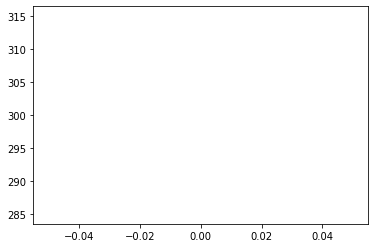

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.5159 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 535us/step - loss: 0.5138 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 0.5122 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 564us/step - loss: 0.5115 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.5109 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 545us/step - loss: 0.5099 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.5089 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 542us/step - loss: 0.5084 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.5083 - acc: 0.5625
Epoch 10/32
128/128 [==============================] - 0s 549us/step - loss: 0.5082 - acc: 0.5000
Epoch 11/32
128/128 [========

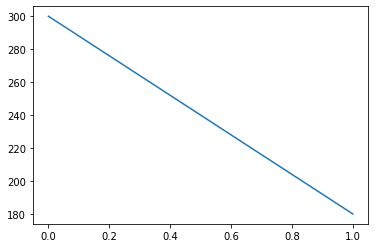

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.7741 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.7698 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 0.7696 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.7689 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 0.7645 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.7618 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.7610 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.7592 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.7565 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.7547 - acc: 0.8750
Epoch 11/32
128/128 [========

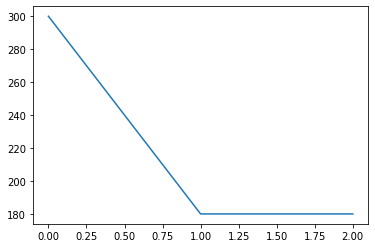

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.0318 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.0317 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0317 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0317 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0314 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.0311 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 623us/step - loss: 0.0308 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.0306 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0302 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.0299 - acc: 0.8906
Epoch 11/32
128/128 [========

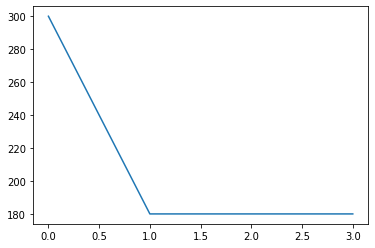

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 1.3525 - acc: 0.7812
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.3518 - acc: 0.7500
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.3517 - acc: 0.6562
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.3516 - acc: 0.6484
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 1.3509 - acc: 0.6953
Epoch 6/32
128/128 [==============================] - 0s 620us/step - loss: 1.3504 - acc: 0.7266
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.3502 - acc: 0.7109
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 1.3499 - acc: 0.6641
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.3494 - acc: 0.7188
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.3491 - acc: 0.7266
Epoch 11/32
128/128 [========

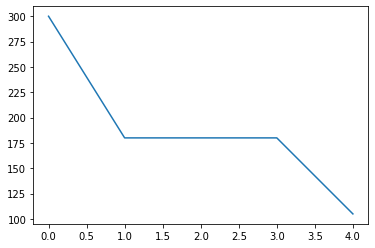

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.0016 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.0015 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.0015 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0015 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.0015 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.0015 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 585us/step - loss: 0.0015 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 0.0015 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.0015 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0015 - acc: 0.8438
Epoch 11/32
128/128 [========

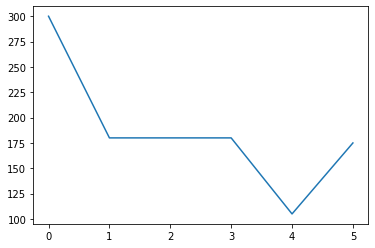

Epoch 1/32
128/128 [==============================] - 0s 563us/step - loss: 1.9427 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 1.9099 - acc: 0.5703
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.9063 - acc: 0.5703
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 1.9163 - acc: 0.5703
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.9180 - acc: 0.5703
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 1.9137 - acc: 0.5703
Epoch 7/32
128/128 [==============================] - 0s 582us/step - loss: 1.9012 - acc: 0.5703
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 1.8825 - acc: 0.5703
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 1.8788 - acc: 0.5859
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 1.8860 - acc: 0.6875
Epoch 11/32
128/128 [========

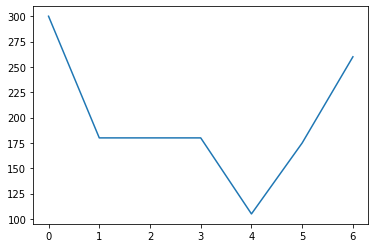

Epoch 1/32
128/128 [==============================] - 0s 491us/step - loss: 0.5847 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 482us/step - loss: 0.5848 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 485us/step - loss: 0.5849 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 488us/step - loss: 0.5849 - acc: 0.5469
Epoch 5/32
128/128 [==============================] - 0s 487us/step - loss: 0.5849 - acc: 0.5547
Epoch 6/32
128/128 [==============================] - 0s 501us/step - loss: 0.5846 - acc: 0.5469
Epoch 7/32
128/128 [==============================] - 0s 516us/step - loss: 0.5843 - acc: 0.5547
Epoch 8/32
128/128 [==============================] - 0s 513us/step - loss: 0.5840 - acc: 0.5625
Epoch 9/32
128/128 [==============================] - 0s 494us/step - loss: 0.5836 - acc: 0.5625
Epoch 10/32
128/128 [==============================] - 0s 494us/step - loss: 0.5833 - acc: 0.5547
Epoch 11/32
128/128 [========

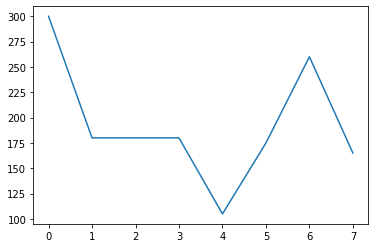

Epoch 1/32
128/128 [==============================] - 0s 481us/step - loss: 1.3377 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 484us/step - loss: 1.3318 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 488us/step - loss: 1.3222 - acc: 0.7656
Epoch 4/32
128/128 [==============================] - 0s 497us/step - loss: 1.3126 - acc: 0.6797
Epoch 5/32
128/128 [==============================] - 0s 512us/step - loss: 1.3089 - acc: 0.6172
Epoch 6/32
128/128 [==============================] - 0s 505us/step - loss: 1.3103 - acc: 0.5938
Epoch 7/32
128/128 [==============================] - 0s 513us/step - loss: 1.3110 - acc: 0.5938
Epoch 8/32
128/128 [==============================] - 0s 509us/step - loss: 1.3081 - acc: 0.6016
Epoch 9/32
128/128 [==============================] - 0s 500us/step - loss: 1.3025 - acc: 0.6719
Epoch 10/32
128/128 [==============================] - 0s 493us/step - loss: 1.2965 - acc: 0.7422
Epoch 11/32
128/128 [========

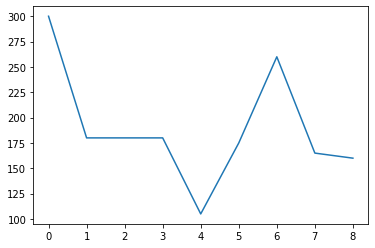

Epoch 1/32
128/128 [==============================] - 0s 488us/step - loss: 3.3498 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 508us/step - loss: 3.3268 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 490us/step - loss: 3.3035 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 497us/step - loss: 3.2966 - acc: 0.7266
Epoch 5/32
128/128 [==============================] - 0s 499us/step - loss: 3.2995 - acc: 0.6484
Epoch 6/32
128/128 [==============================] - 0s 482us/step - loss: 3.3041 - acc: 0.6094
Epoch 7/32
128/128 [==============================] - 0s 499us/step - loss: 3.3063 - acc: 0.5703
Epoch 8/32
128/128 [==============================] - 0s 507us/step - loss: 3.3051 - acc: 0.5703
Epoch 9/32
128/128 [==============================] - 0s 491us/step - loss: 3.3012 - acc: 0.6406
Epoch 10/32
128/128 [==============================] - 0s 485us/step - loss: 3.2963 - acc: 0.6875
Epoch 11/32
128/128 [========

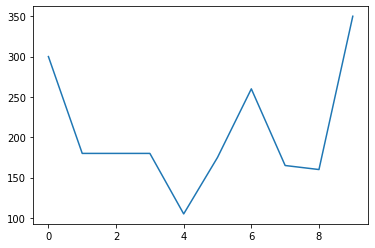

Epoch 1/32
128/128 [==============================] - 0s 503us/step - loss: 0.5780 - acc: 0.9844
Epoch 2/32
128/128 [==============================] - 0s 490us/step - loss: 0.5764 - acc: 0.9766
Epoch 3/32
128/128 [==============================] - 0s 503us/step - loss: 0.5728 - acc: 0.9688
Epoch 4/32
128/128 [==============================] - 0s 511us/step - loss: 0.5687 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 514us/step - loss: 0.5656 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 506us/step - loss: 0.5642 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 513us/step - loss: 0.5640 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 517us/step - loss: 0.5642 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 508us/step - loss: 0.5643 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 508us/step - loss: 0.5639 - acc: 0.8125
Epoch 11/32
128/128 [========

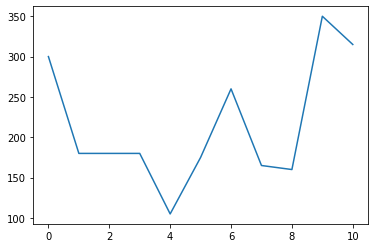

Epoch 1/32
128/128 [==============================] - 0s 490us/step - loss: 0.8113 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 506us/step - loss: 0.8113 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 493us/step - loss: 0.8113 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 487us/step - loss: 0.8113 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 500us/step - loss: 0.8112 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 503us/step - loss: 0.8112 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 498us/step - loss: 0.8112 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 495us/step - loss: 0.8112 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 501us/step - loss: 0.8111 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 491us/step - loss: 0.8111 - acc: 0.8984
Epoch 11/32
128/128 [========

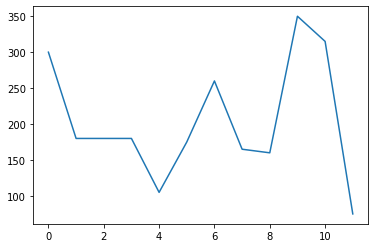

Epoch 1/32
128/128 [==============================] - 0s 492us/step - loss: 0.9264 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 507us/step - loss: 0.9243 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 504us/step - loss: 0.9208 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 510us/step - loss: 0.9165 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 494us/step - loss: 0.9123 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 506us/step - loss: 0.9092 - acc: 0.7500
Epoch 7/32
128/128 [==============================] - 0s 517us/step - loss: 0.9077 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 503us/step - loss: 0.9069 - acc: 0.7188
Epoch 9/32
128/128 [==============================] - 0s 486us/step - loss: 0.9054 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 488us/step - loss: 0.9030 - acc: 0.7422
Epoch 11/32
128/128 [========

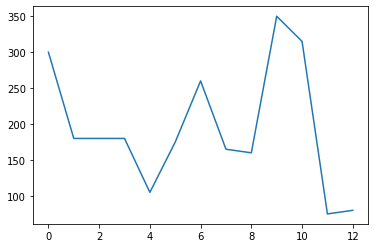

Epoch 1/32
128/128 [==============================] - 0s 486us/step - loss: 0.1332 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 508us/step - loss: 0.1332 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 502us/step - loss: 0.1331 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 500us/step - loss: 0.1331 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 495us/step - loss: 0.1331 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 524us/step - loss: 0.1330 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 506us/step - loss: 0.1330 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 488us/step - loss: 0.1329 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 486us/step - loss: 0.1329 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 493us/step - loss: 0.1328 - acc: 0.8750
Epoch 11/32
128/128 [========

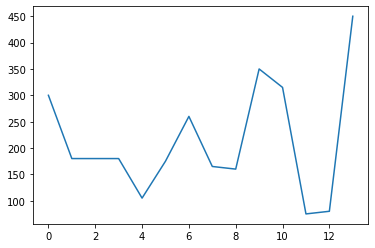

Epoch 1/32
128/128 [==============================] - 0s 495us/step - loss: 0.1629 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 503us/step - loss: 0.1629 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 494us/step - loss: 0.1628 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 497us/step - loss: 0.1628 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 505us/step - loss: 0.1628 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 503us/step - loss: 0.1628 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 499us/step - loss: 0.1628 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 497us/step - loss: 0.1627 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 492us/step - loss: 0.1627 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 512us/step - loss: 0.1627 - acc: 0.8125
Epoch 11/32
128/128 [========

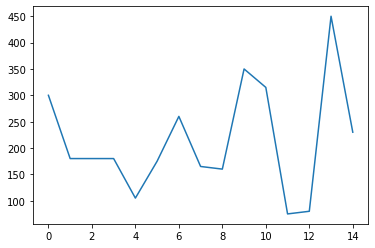

Epoch 1/32
128/128 [==============================] - 0s 486us/step - loss: 1.0983 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 492us/step - loss: 1.0981 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 500us/step - loss: 1.0979 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 497us/step - loss: 1.0976 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 496us/step - loss: 1.0974 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 506us/step - loss: 1.0972 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 501us/step - loss: 1.0971 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 486us/step - loss: 1.0971 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 493us/step - loss: 1.0970 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 498us/step - loss: 1.0969 - acc: 0.8359
Epoch 11/32
128/128 [========

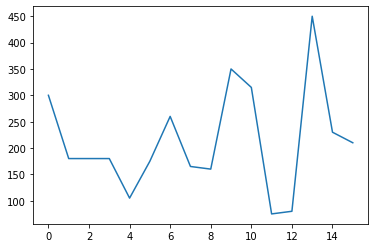

Epoch 1/32
128/128 [==============================] - 0s 488us/step - loss: 3.4272 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 508us/step - loss: 3.4258 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 496us/step - loss: 3.4242 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 492us/step - loss: 3.4233 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 499us/step - loss: 3.4231 - acc: 0.7500
Epoch 6/32
128/128 [==============================] - 0s 494us/step - loss: 3.4231 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 510us/step - loss: 3.4229 - acc: 0.7266
Epoch 8/32
128/128 [==============================] - 0s 486us/step - loss: 3.4222 - acc: 0.7188
Epoch 9/32
128/128 [==============================] - 0s 506us/step - loss: 3.4214 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 501us/step - loss: 3.4207 - acc: 0.7734
Epoch 11/32
128/128 [========

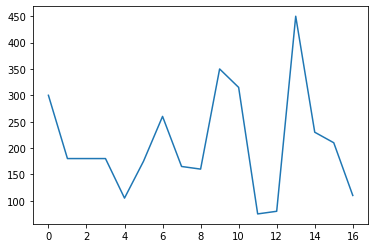

Epoch 1/32
128/128 [==============================] - 0s 482us/step - loss: 1.3498 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 499us/step - loss: 1.3440 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 502us/step - loss: 1.3391 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 499us/step - loss: 1.3380 - acc: 0.7422
Epoch 5/32
128/128 [==============================] - 0s 493us/step - loss: 1.3387 - acc: 0.7109
Epoch 6/32
128/128 [==============================] - 0s 497us/step - loss: 1.3386 - acc: 0.7109
Epoch 7/32
128/128 [==============================] - 0s 493us/step - loss: 1.3370 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 513us/step - loss: 1.3348 - acc: 0.7344
Epoch 9/32
128/128 [==============================] - 0s 503us/step - loss: 1.3332 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 505us/step - loss: 1.3323 - acc: 0.8828
Epoch 11/32
128/128 [========

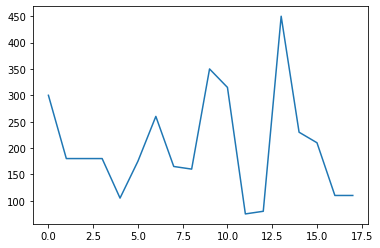

Epoch 1/32
128/128 [==============================] - 0s 489us/step - loss: 1.2918 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 509us/step - loss: 1.2827 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 493us/step - loss: 1.2721 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 479us/step - loss: 1.2675 - acc: 0.7656
Epoch 5/32
128/128 [==============================] - 0s 499us/step - loss: 1.2677 - acc: 0.7188
Epoch 6/32
128/128 [==============================] - 0s 494us/step - loss: 1.2679 - acc: 0.7109
Epoch 7/32
128/128 [==============================] - 0s 507us/step - loss: 1.2658 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 495us/step - loss: 1.2623 - acc: 0.7578
Epoch 9/32
128/128 [==============================] - 0s 491us/step - loss: 1.2592 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 484us/step - loss: 1.2576 - acc: 0.8672
Epoch 11/32
128/128 [========

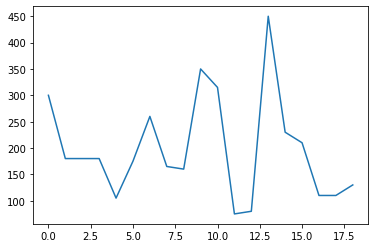

Epoch 1/32
128/128 [==============================] - 0s 495us/step - loss: 0.2637 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 497us/step - loss: 0.2631 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 497us/step - loss: 0.2617 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 503us/step - loss: 0.2597 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 503us/step - loss: 0.2574 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 497us/step - loss: 0.2554 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 510us/step - loss: 0.2542 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 511us/step - loss: 0.2536 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 502us/step - loss: 0.2533 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 503us/step - loss: 0.2530 - acc: 0.8047
Epoch 11/32
128/128 [========

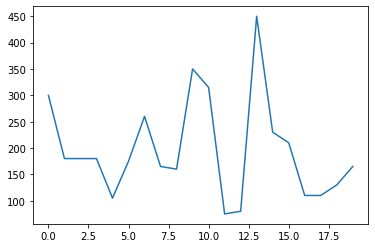

We are in the epoc:  2 Epsilon:  0.95
Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.5179 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 0.5179 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.5179 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.5179 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.5179 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.5179 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.5178 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.5178 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.5178 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.5177 - acc

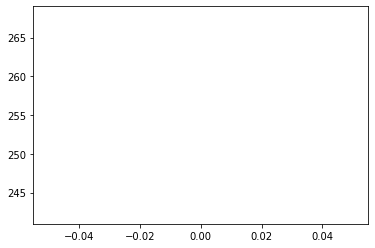

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 2.1716 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 2.1587 - acc: 0.7812
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 2.1410 - acc: 0.6719
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 2.1272 - acc: 0.6406
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 2.1210 - acc: 0.6250
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 2.1201 - acc: 0.6172
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 2.1206 - acc: 0.6250
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 2.1205 - acc: 0.6250
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 2.1190 - acc: 0.6172
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 2.1158 - acc: 0.6250
Epoch 11/32
128/128 [========

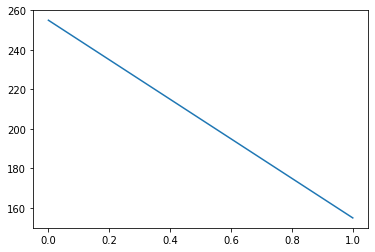

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.1408 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.1400 - acc: 0.7969
Epoch 3/32
128/128 [==============================] - 0s 585us/step - loss: 0.1388 - acc: 0.7656
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.1374 - acc: 0.7188
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.1362 - acc: 0.7188
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.1351 - acc: 0.6875
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.1342 - acc: 0.6719
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.1334 - acc: 0.6719
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.1324 - acc: 0.6719
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.1313 - acc: 0.6719
Epoch 11/32
128/128 [========

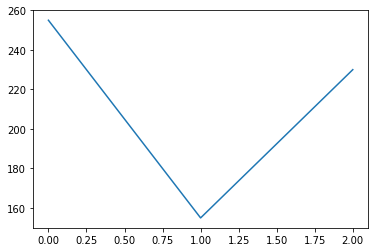

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.8151 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.8120 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.8066 - acc: 0.7422
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.7997 - acc: 0.7031
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.7937 - acc: 0.6562
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.7908 - acc: 0.6406
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.7903 - acc: 0.6250
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.7895 - acc: 0.6250
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.7870 - acc: 0.6172
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.7831 - acc: 0.6328
Epoch 11/32
128/128 [========

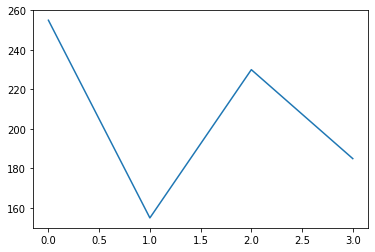

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 1.4660 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 1.4565 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 1.4483 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.4454 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 1.4455 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 1.4463 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.4466 - acc: 0.7656
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 1.4462 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.4451 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 1.4435 - acc: 0.8281
Epoch 11/32
128/128 [========

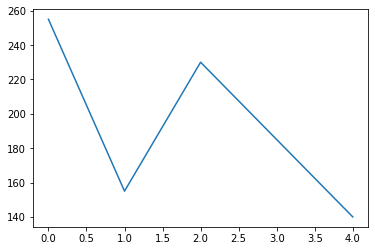

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0034 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.0035 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.0035 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.0036 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 0.0036 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0035 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0034 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.0033 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0033 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.0032 - acc: 0.8906
Epoch 11/32
128/128 [========

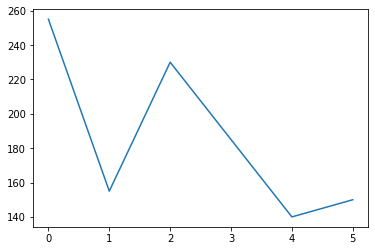

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.7359 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.7347 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 0.7333 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.7323 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 0.7316 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 0.7312 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.7309 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.7307 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.7304 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.7302 - acc: 0.8828
Epoch 11/32
128/128 [========

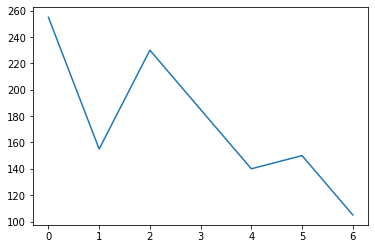

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.0029 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0029 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.0028 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0028 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0028 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0028 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.0028 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0028 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.0027 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.0027 - acc: 0.9062
Epoch 11/32
128/128 [========

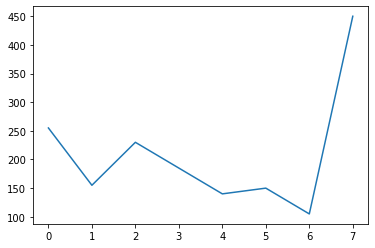

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.0023 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0023 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.0023 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.0023 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.0023 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0022 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.0022 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.0022 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.0021 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 0.0021 - acc: 0.9141
Epoch 11/32
128/128 [========

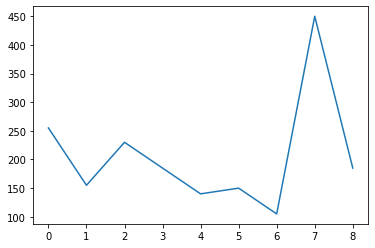

Epoch 1/32
128/128 [==============================] - 0s 561us/step - loss: 0.0029 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.0029 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.0029 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0028 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.0028 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 616us/step - loss: 0.0028 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.0027 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.0027 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 0.0026 - acc: 0.9609
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.0026 - acc: 0.9531
Epoch 11/32
128/128 [========

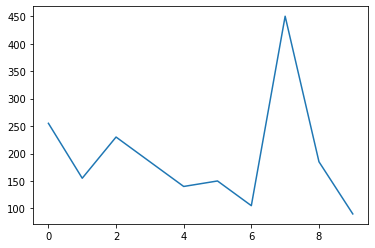

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.5454 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.5453 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.5453 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.5453 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.5453 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.5453 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.5452 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.5452 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.5452 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.5452 - acc: 0.9062
Epoch 11/32
128/128 [========

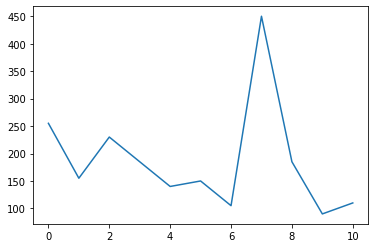

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 0.0016 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 581us/step - loss: 0.0016 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 583us/step - loss: 0.0016 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 0.0016 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.0016 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.0016 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.0015 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0015 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 622us/step - loss: 0.0015 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0015 - acc: 0.8359
Epoch 11/32
128/128 [========

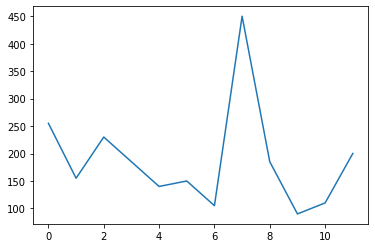

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.0016 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0016 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.0016 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.0016 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.0015 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.0015 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0015 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.0015 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.0014 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 0.0014 - acc: 0.8125
Epoch 11/32
128/128 [========

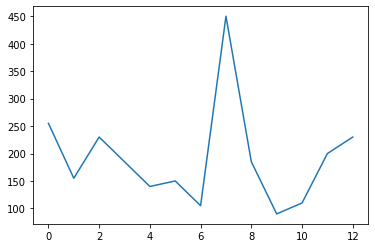

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.1976 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 1.1974 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 1.1970 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 1.1966 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.1963 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.1960 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 1.1958 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 1.1957 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 1.1955 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.1954 - acc: 0.8281
Epoch 11/32
128/128 [========

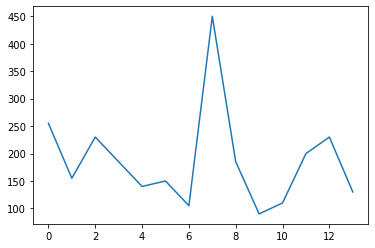

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 1.6294 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.6220 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.6131 - acc: 0.7500
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 1.6098 - acc: 0.6562
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 1.6099 - acc: 0.6172
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 1.6082 - acc: 0.6250
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.6044 - acc: 0.6484
Epoch 8/32
128/128 [==============================] - 0s 619us/step - loss: 1.6012 - acc: 0.6953
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 1.6001 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 1.6000 - acc: 0.7578
Epoch 11/32
128/128 [========

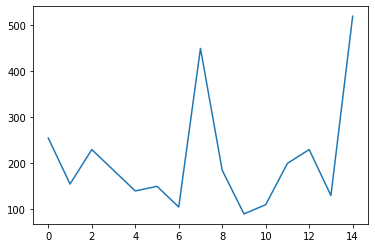

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.4213 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.4208 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.4200 - acc: 0.7891
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.4190 - acc: 0.7578
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.4183 - acc: 0.7031
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.4178 - acc: 0.6641
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.4175 - acc: 0.6484
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.4170 - acc: 0.6484
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.4161 - acc: 0.6719
Epoch 10/32
128/128 [==============================] - 0s 582us/step - loss: 0.4150 - acc: 0.6953
Epoch 11/32
128/128 [========

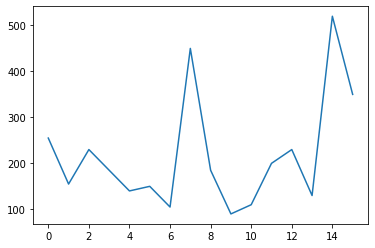

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 2.3332 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 2.3315 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 2.3297 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 2.3289 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 2.3288 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 2.3288 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 2.3285 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 2.3280 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 2.3277 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 2.3275 - acc: 0.8047
Epoch 11/32
128/128 [========

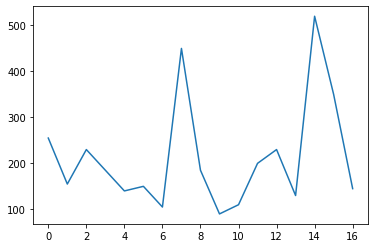

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 1.3280 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 1.3271 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.3258 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 1.3249 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 1.3245 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.3243 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 1.3241 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 1.3239 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 1.3236 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.3234 - acc: 0.8281
Epoch 11/32
128/128 [========

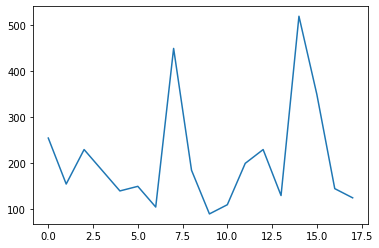

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.0044 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0044 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.0043 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 0.0043 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.0042 - acc: 0.9688
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.0042 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.0042 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.0041 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0041 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 619us/step - loss: 0.0041 - acc: 0.9297
Epoch 11/32
128/128 [========

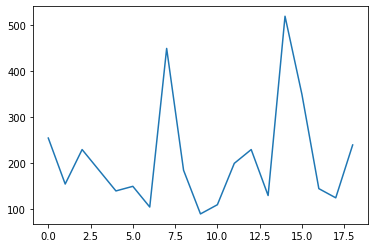

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 1.8431 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 1.8363 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 1.8311 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.8294 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 1.8291 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 1.8286 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 1.8276 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 1.8261 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.8245 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.8230 - acc: 0.8203
Epoch 11/32
128/128 [========

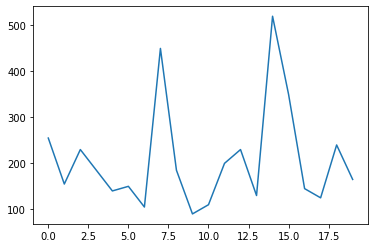

We are in the epoc:  3 Epsilon:  0.9025
Epoch 1/32
128/128 [==============================] - 0s 605us/step - loss: 3.3560 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 3.3552 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 3.3540 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 3.3531 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 3.3525 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 3.3520 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 3.3515 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 3.3509 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 3.3504 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 3.3501 - a

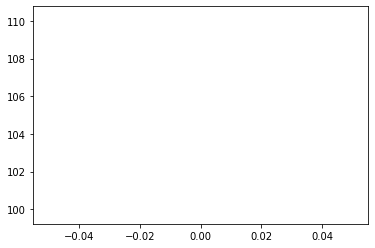

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.3277 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.3264 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.3240 - acc: 0.7734
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.3208 - acc: 0.7500
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 0.3176 - acc: 0.7422
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.3150 - acc: 0.7266
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.3124 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.3098 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.3072 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.3054 - acc: 0.8047
Epoch 11/32
128/128 [========

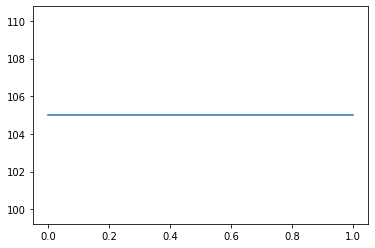

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.1296 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.1296 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 616us/step - loss: 0.1296 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.1296 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 616us/step - loss: 0.1295 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.1295 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.1295 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.1294 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.1294 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.1294 - acc: 0.8984
Epoch 11/32
128/128 [========

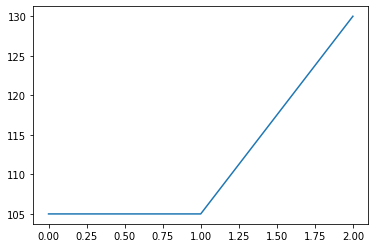

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0010 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 9.9471e-04 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 9.6667e-04 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 619us/step - loss: 9.4313e-04 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 9.2814e-04 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 9.1799e-04 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 9.0777e-04 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 8.9632e-04 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 8.8407e-04 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 8.7227e-04 - acc: 

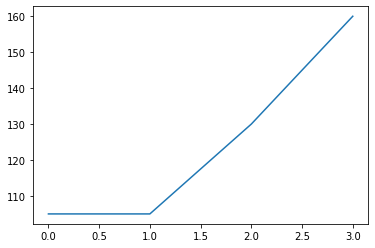

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.8062 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.8062 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 619us/step - loss: 0.8062 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.8061 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 616us/step - loss: 0.8061 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.8061 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.8061 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.8060 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 619us/step - loss: 0.8060 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.8060 - acc: 0.8672
Epoch 11/32
128/128 [========

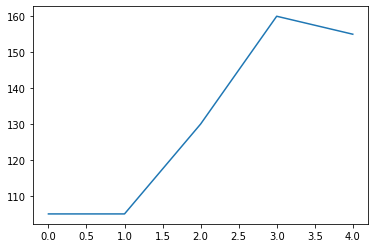

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 1.4563 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 1.4501 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 1.4449 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 1.4444 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 1.4463 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 1.4473 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 1.4462 - acc: 0.7656
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.4437 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 1.4415 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.4405 - acc: 0.8750
Epoch 11/32
128/128 [========

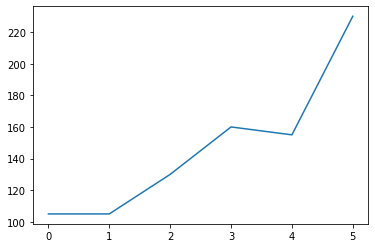

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.0036 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.0036 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0036 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.0035 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 580us/step - loss: 0.0035 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.0035 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 0.0035 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.0035 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0034 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.0034 - acc: 0.8984
Epoch 11/32
128/128 [========

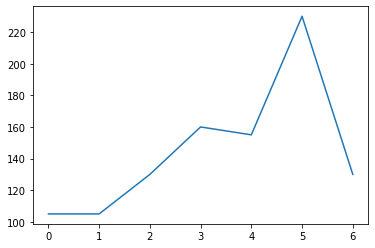

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.6083 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.6083 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.6083 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.6082 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.6082 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.6082 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.6081 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.6081 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.6081 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.6080 - acc: 0.8828
Epoch 11/32
128/128 [========

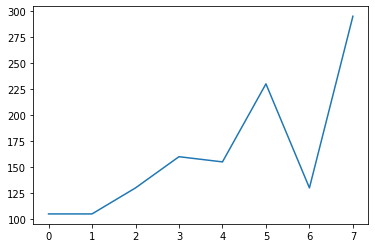

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0025 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 0.0024 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0024 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.0023 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.0023 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.0023 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 585us/step - loss: 0.0023 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.0023 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.0023 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.0023 - acc: 0.8672
Epoch 11/32
128/128 [========

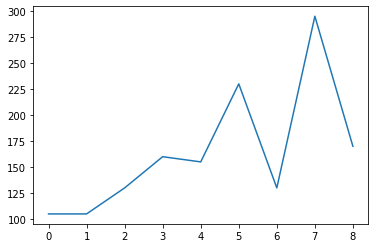

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.2904 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.2904 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.2903 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.2903 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.2903 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.2903 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.2902 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.2902 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 624us/step - loss: 0.2902 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.2902 - acc: 0.8906
Epoch 11/32
128/128 [========

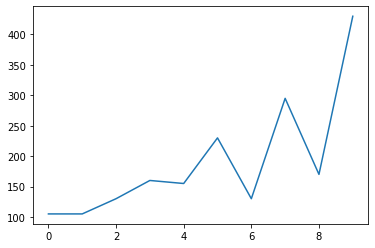

Epoch 1/32
128/128 [==============================] - 0s 607us/step - loss: 0.7412 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.7409 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.7405 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.7401 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.7398 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.7396 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.7394 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.7394 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.7393 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.7392 - acc: 0.8281
Epoch 11/32
128/128 [========

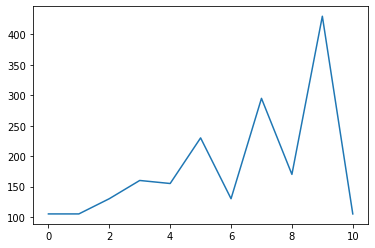

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.0015 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 580us/step - loss: 0.0015 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0015 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.0014 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.0014 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0014 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.0014 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.0014 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 627us/step - loss: 0.0014 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.0014 - acc: 0.8438
Epoch 11/32
128/128 [========

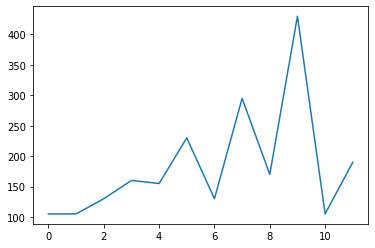

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.2938 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.2927 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.2912 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.2900 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.2892 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.2889 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.2888 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.2887 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 583us/step - loss: 0.2885 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.2882 - acc: 0.8047
Epoch 11/32
128/128 [========

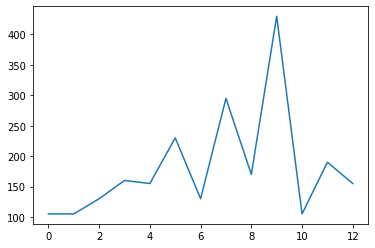

Epoch 1/32
128/128 [==============================] - 0s 617us/step - loss: 0.0672 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.0666 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.0654 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.0639 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0626 - acc: 0.7891
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0616 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 0.0608 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.0602 - acc: 0.7266
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.0596 - acc: 0.7109
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.0590 - acc: 0.7188
Epoch 11/32
128/128 [========

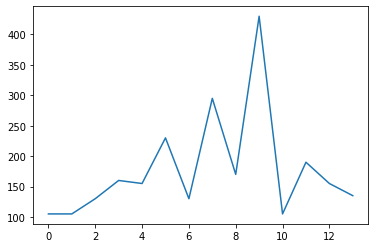

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.2925 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.2925 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.2925 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.2924 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.2924 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.2924 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.2923 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.2923 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.2923 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.2922 - acc: 0.8516
Epoch 11/32
128/128 [========

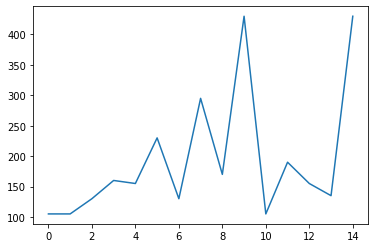

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.3219 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.3219 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.3218 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.3218 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.3217 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.3216 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.3216 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.3215 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.3215 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.3214 - acc: 0.7891
Epoch 11/32
128/128 [========

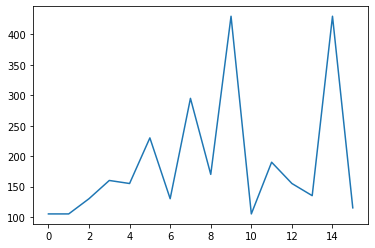

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.9372 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.9371 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.9371 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.9371 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.9370 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.9370 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.9370 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.9370 - acc: 0.7578
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.9369 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.9369 - acc: 0.7578
Epoch 11/32
128/128 [========

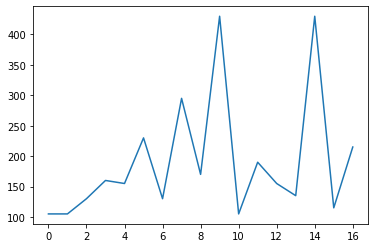

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.8405 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.8403 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.8400 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.8397 - acc: 0.7266
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.8394 - acc: 0.6719
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.8392 - acc: 0.6641
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 0.8390 - acc: 0.6328
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.8389 - acc: 0.6328
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.8386 - acc: 0.6562
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.8383 - acc: 0.6719
Epoch 11/32
128/128 [========

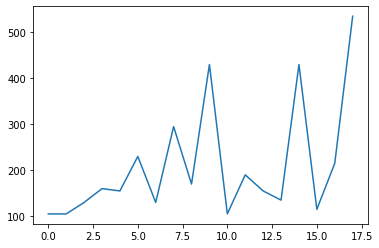

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.0021 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.0021 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.0021 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 0.0020 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0020 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.0020 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.0020 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0020 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.0020 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.0020 - acc: 0.8203
Epoch 11/32
128/128 [========

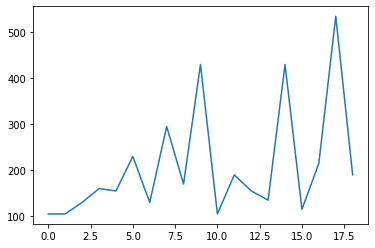

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.6693 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.6690 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.6686 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.6680 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 624us/step - loss: 0.6675 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.6671 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.6670 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.6668 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.6666 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 622us/step - loss: 0.6661 - acc: 0.8516
Epoch 11/32
128/128 [========

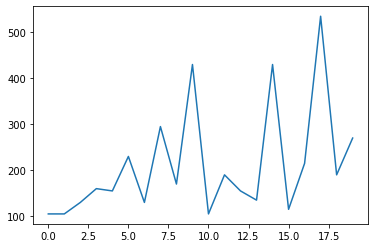

We are in the epoc:  4 Epsilon:  0.857375
Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.6484 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.6461 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.6423 - acc: 0.7734
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 0.6377 - acc: 0.5781
Epoch 5/32
128/128 [==============================] - 0s 619us/step - loss: 0.6345 - acc: 0.4141
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.6335 - acc: 0.3516
Epoch 7/32
128/128 [==============================] - 0s 617us/step - loss: 0.6315 - acc: 0.3438
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.6273 - acc: 0.4453
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.6233 - acc: 0.6484
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.6212 -

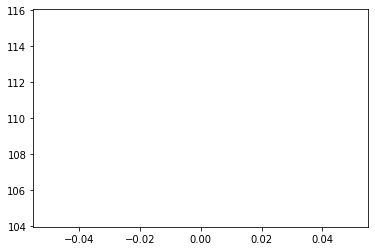

Epoch 1/32
128/128 [==============================] - 0s 608us/step - loss: 0.0958 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.0958 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0958 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.0957 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.0956 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0954 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0953 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.0952 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.0951 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.0950 - acc: 0.8516
Epoch 11/32
128/128 [========

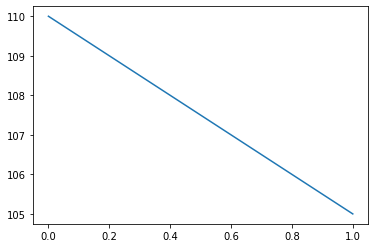

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.1568 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.1543 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.1511 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.1491 - acc: 0.7891
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.1487 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.1486 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.1483 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.1477 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.1471 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.1467 - acc: 0.8281
Epoch 11/32
128/128 [========

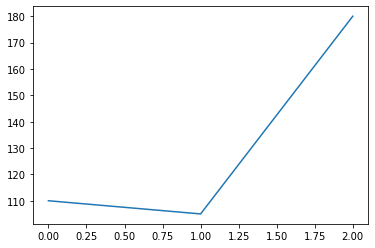

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 1.9725 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.9490 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 1.9293 - acc: 0.7422
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.9313 - acc: 0.6250
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.9372 - acc: 0.6094
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 1.9389 - acc: 0.6094
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.9352 - acc: 0.6328
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 1.9294 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 617us/step - loss: 1.9250 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 1.9231 - acc: 0.8359
Epoch 11/32
128/128 [========

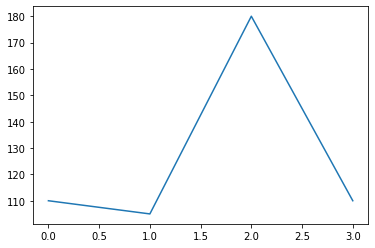

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.7037 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.7006 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 585us/step - loss: 0.6978 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.6964 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.6961 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.6963 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.6964 - acc: 0.7891
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.6964 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.6961 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 0.6956 - acc: 0.7891
Epoch 11/32
128/128 [========

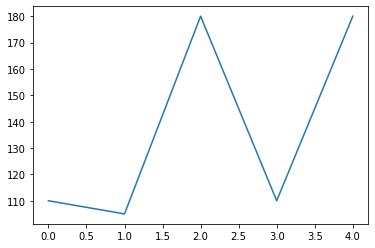

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 1.9728 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 1.9728 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 1.9727 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 619us/step - loss: 1.9727 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 1.9726 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.9726 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 1.9726 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 1.9725 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.9725 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.9724 - acc: 0.8438
Epoch 11/32
128/128 [========

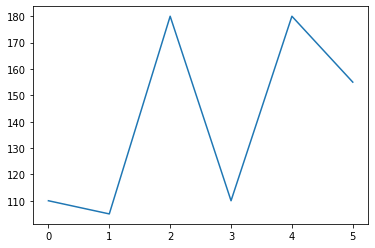

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 2.1176 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 2.1149 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 2.1116 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 2.1090 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 2.1067 - acc: 0.7500
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 2.1033 - acc: 0.7500
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 2.0962 - acc: 0.7578
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 2.0809 - acc: 0.7656
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 2.0636 - acc: 0.7266
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 2.0569 - acc: 0.6719
Epoch 11/32
128/128 [========

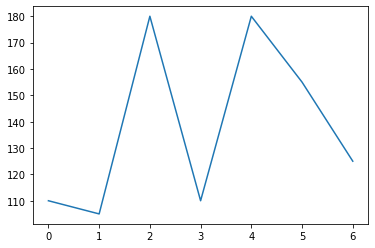

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.0057 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.0056 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0056 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.0056 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.0055 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.0055 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0055 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.0055 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.0055 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.0055 - acc: 0.8438
Epoch 11/32
128/128 [========

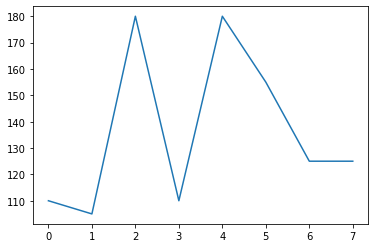

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 1.7992 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.7864 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 1.7749 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.7702 - acc: 0.7266
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 1.7692 - acc: 0.6016
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 1.7693 - acc: 0.5781
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 1.7694 - acc: 0.5703
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 1.7687 - acc: 0.5703
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 1.7670 - acc: 0.6328
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 1.7651 - acc: 0.6797
Epoch 11/32
128/128 [========

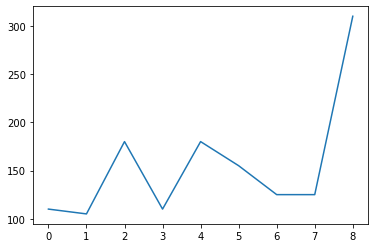

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.8147 - acc: 0.9922
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.8147 - acc: 0.9766
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.8147 - acc: 0.9766
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.8147 - acc: 0.9688
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.8147 - acc: 0.9688
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.8146 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.8145 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.8145 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.8144 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 0.8143 - acc: 0.9141
Epoch 11/32
128/128 [========

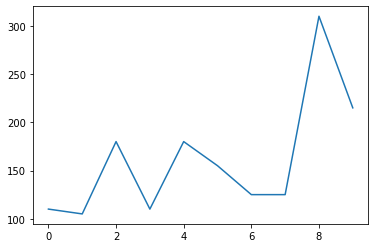

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 1.1978 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.1977 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 1.1974 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 1.1972 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 1.1969 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.1968 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 1.1967 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.1967 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 1.1966 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 1.1966 - acc: 0.8828
Epoch 11/32
128/128 [========

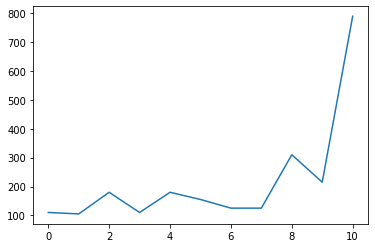

Epoch 1/32
128/128 [==============================] - 0s 567us/step - loss: 0.1676 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.1673 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1669 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.1664 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 0.1661 - acc: 0.7500
Epoch 6/32
128/128 [==============================] - 0s 582us/step - loss: 0.1659 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 580us/step - loss: 0.1658 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 619us/step - loss: 0.1655 - acc: 0.7422
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.1651 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.1646 - acc: 0.7734
Epoch 11/32
128/128 [========

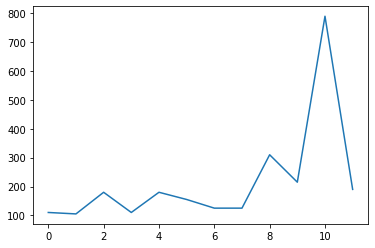

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.0999 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.0999 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.0999 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.0998 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 581us/step - loss: 1.0998 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 1.0997 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 1.0997 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 1.0996 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 1.0996 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.0996 - acc: 0.9219
Epoch 11/32
128/128 [========

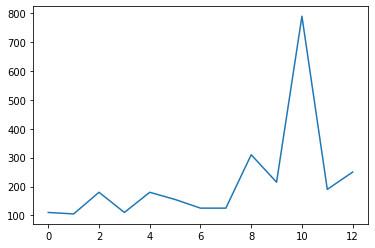

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.8111 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.8111 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 623us/step - loss: 0.8110 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.8110 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 618us/step - loss: 0.8109 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.8109 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.8108 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.8108 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 0.8107 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.8106 - acc: 0.9453
Epoch 11/32
128/128 [========

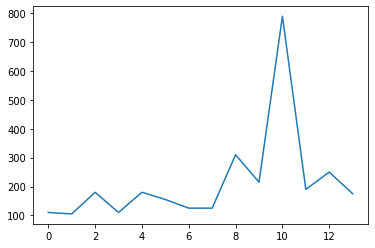

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.8130 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.8130 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.8130 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.8130 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.8130 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.8129 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 625us/step - loss: 0.8129 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.8129 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.8129 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.8129 - acc: 0.9062
Epoch 11/32
128/128 [========

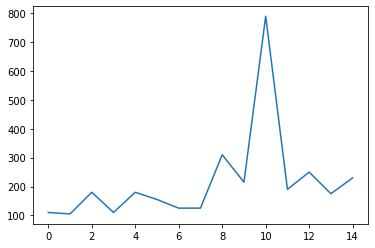

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 1.4571 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.4569 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 1.4568 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 1.4566 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.4565 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 1.4563 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 1.4562 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.4560 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 1.4559 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 618us/step - loss: 1.4557 - acc: 0.8828
Epoch 11/32
128/128 [========

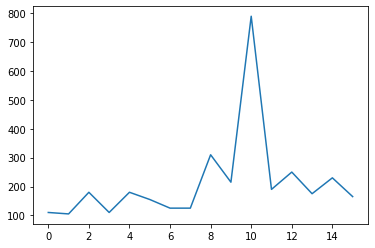

Epoch 1/32
128/128 [==============================] - 0s 573us/step - loss: 0.6786 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.6783 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.6780 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.6776 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.6773 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.6771 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.6769 - acc: 0.7734
Epoch 8/32
128/128 [==============================] - 0s 583us/step - loss: 0.6766 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.6762 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.6758 - acc: 0.8438
Epoch 11/32
128/128 [========

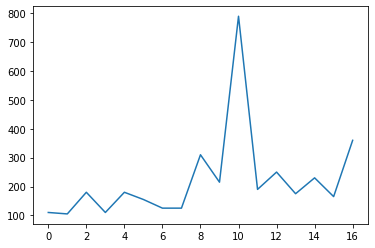

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 3.1415 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 581us/step - loss: 3.1359 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 3.1267 - acc: 0.7031
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 3.1172 - acc: 0.6328
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 3.1124 - acc: 0.5938
Epoch 6/32
128/128 [==============================] - 0s 586us/step - loss: 3.1105 - acc: 0.5703
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 3.1077 - acc: 0.5703
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 3.1029 - acc: 0.5938
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 3.0980 - acc: 0.6250
Epoch 10/32
128/128 [==============================] - 0s 623us/step - loss: 3.0948 - acc: 0.7188
Epoch 11/32
128/128 [========

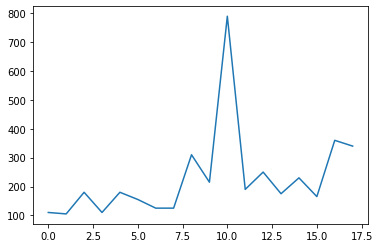

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.3452 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 1.3448 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 1.3445 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 1.3443 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 630us/step - loss: 1.3442 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 1.3442 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 1.3443 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 623us/step - loss: 1.3442 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.3442 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.3440 - acc: 0.8984
Epoch 11/32
128/128 [========

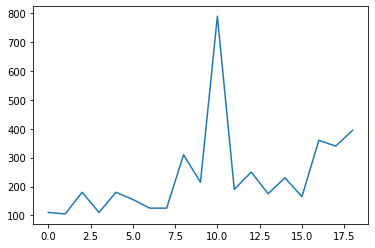

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.0372 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0368 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.0362 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0355 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.0349 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0344 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0341 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0337 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 577us/step - loss: 0.0333 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 582us/step - loss: 0.0329 - acc: 0.8594
Epoch 11/32
128/128 [========

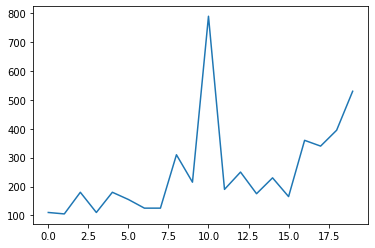

We are in the epoc:  5 Epsilon:  0.81450625
Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0331 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0331 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.0330 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0330 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0329 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 615us/step - loss: 0.0329 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.0329 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.0329 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0328 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.0328

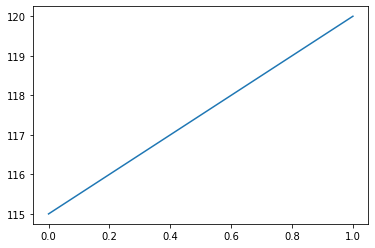

Epoch 1/32
128/128 [==============================] - 0s 601us/step - loss: 1.2226 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 1.2087 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.2040 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.2046 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.2063 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 1.2075 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.2077 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 1.2073 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 1.2064 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 1.2055 - acc: 0.8203
Epoch 11/32
128/128 [========

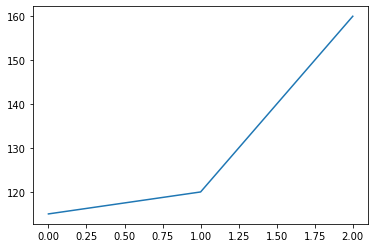

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.3248 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 1.3246 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 1.3245 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 1.3244 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 1.3243 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 1.3243 - acc: 0.9688
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 1.3243 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 618us/step - loss: 1.3242 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 1.3242 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 1.3242 - acc: 0.9609
Epoch 11/32
128/128 [========

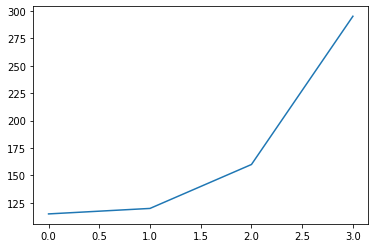

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 1.0666 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 1.0655 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 1.0636 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.0613 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.0591 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 1.0576 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 1.0569 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.0563 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.0556 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 1.0547 - acc: 0.8203
Epoch 11/32
128/128 [========

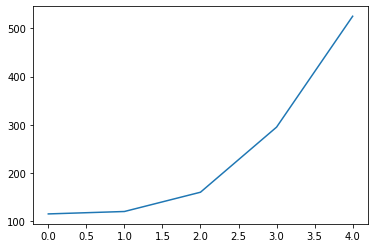

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.2938 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.2937 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.2937 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.2937 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.2936 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.2936 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.2936 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.2936 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.2935 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.2935 - acc: 0.8984
Epoch 11/32
128/128 [========

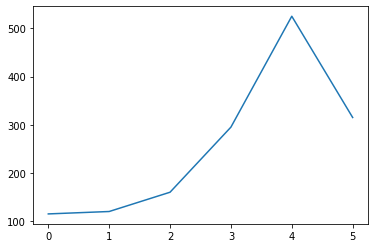

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 2.0035 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 2.0033 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 2.0029 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 2.0027 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 2.0025 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 2.0024 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 2.0023 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 2.0023 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 2.0022 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 2.0022 - acc: 0.8984
Epoch 11/32
128/128 [========

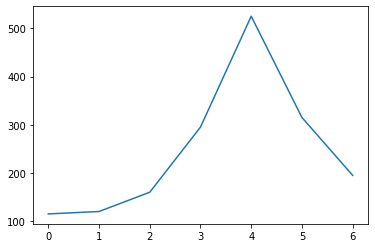

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.2890 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.2886 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.2881 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 629us/step - loss: 0.2877 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.2874 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.2872 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.2871 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.2870 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.2868 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 0.2867 - acc: 0.9141
Epoch 11/32
128/128 [========

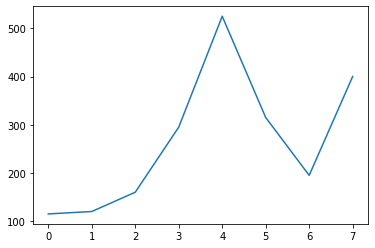

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0337 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.0337 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.0337 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.0336 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.0336 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 612us/step - loss: 0.0336 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.0336 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.0336 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.0336 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.0336 - acc: 0.8594
Epoch 11/32
128/128 [========

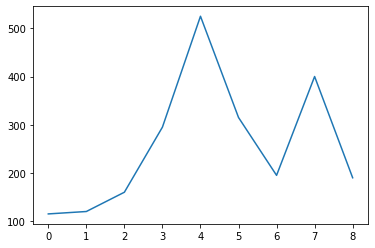

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.4507 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.4506 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.4506 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.4506 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.4506 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.4505 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.4505 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.4505 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 0.4504 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 621us/step - loss: 0.4504 - acc: 0.9062
Epoch 11/32
128/128 [========

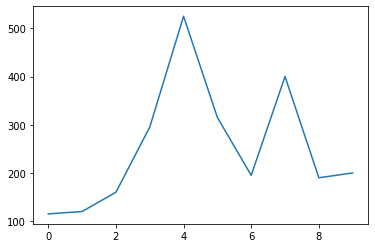

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.0337 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.0337 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 0.0336 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0336 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.0336 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0336 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.0335 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.0335 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.0335 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 617us/step - loss: 0.0335 - acc: 0.8672
Epoch 11/32
128/128 [========

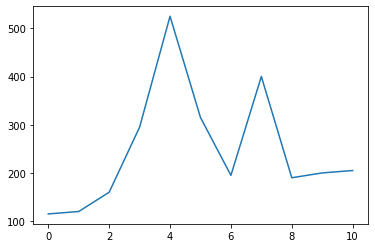

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.5163 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 620us/step - loss: 0.5162 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 0.5161 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.5160 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.5159 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 577us/step - loss: 0.5159 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 583us/step - loss: 0.5158 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.5158 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.5158 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.5158 - acc: 0.8828
Epoch 11/32
128/128 [========

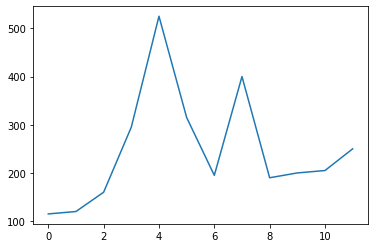

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0336 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0335 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.0333 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 0.0331 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.0330 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.0329 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.0328 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.0327 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.0326 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.0325 - acc: 0.8906
Epoch 11/32
128/128 [========

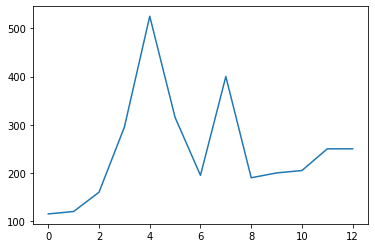

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.2880 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.2879 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 583us/step - loss: 0.2879 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 579us/step - loss: 0.2878 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.2878 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.2878 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.2878 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.2878 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.2877 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.2877 - acc: 0.8516
Epoch 11/32
128/128 [========

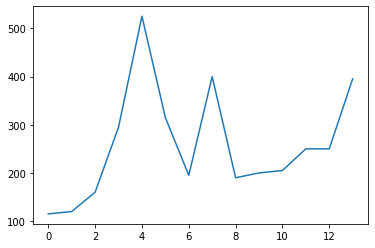

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.4503 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.4501 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.4497 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.4492 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.4488 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.4484 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.4481 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.4479 - acc: 0.6953
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.4476 - acc: 0.6875
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 0.4472 - acc: 0.7266
Epoch 11/32
128/128 [========

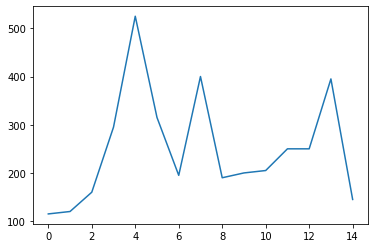

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.4196 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.4196 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.4196 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.4196 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.4196 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 582us/step - loss: 0.4195 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.4195 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.4195 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 572us/step - loss: 0.4195 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 578us/step - loss: 0.4194 - acc: 0.8438
Epoch 11/32
128/128 [========

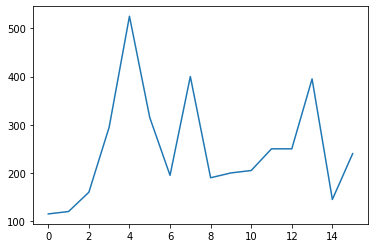

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 1.0981 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 1.0981 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.0981 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 1.0980 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 1.0980 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.0980 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 1.0979 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 1.0979 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 578us/step - loss: 1.0979 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 582us/step - loss: 1.0979 - acc: 0.8984
Epoch 11/32
128/128 [========

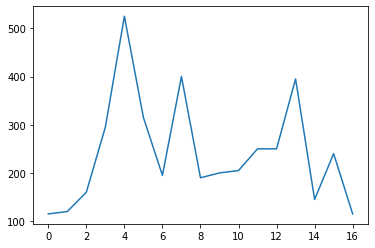

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 1.7476 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 1.7443 - acc: 0.7891
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 1.7382 - acc: 0.7344
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.7305 - acc: 0.6641
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.7237 - acc: 0.6641
Epoch 6/32
128/128 [==============================] - 0s 580us/step - loss: 1.7203 - acc: 0.6406
Epoch 7/32
128/128 [==============================] - 0s 583us/step - loss: 1.7196 - acc: 0.5781
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 1.7186 - acc: 0.6016
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 1.7162 - acc: 0.6172
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 1.7129 - acc: 0.6250
Epoch 11/32
128/128 [========

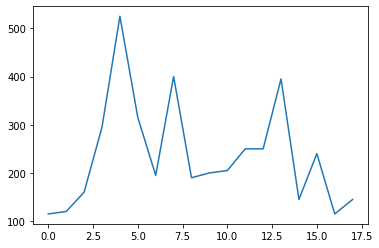

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0059 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.0059 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.0059 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0059 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0058 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.0058 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.0057 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.0057 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0057 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0057 - acc: 0.8203
Epoch 11/32
128/128 [========

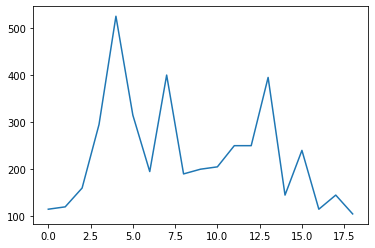

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.3314 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 621us/step - loss: 0.3289 - acc: 0.9766
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.3229 - acc: 0.9688
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.3134 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 628us/step - loss: 0.3067 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.3053 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.3059 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.3065 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.3069 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.3069 - acc: 0.8438
Epoch 11/32
128/128 [========

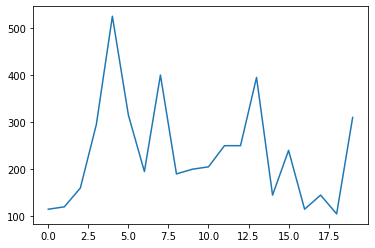

We are in the epoc:  6 Epsilon:  0.7737809375
Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.6864 - acc: 0.7734
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 1.6723 - acc: 0.7891
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 1.6523 - acc: 0.7891
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 1.6385 - acc: 0.7656
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.6355 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 1.6374 - acc: 0.6953
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.6394 - acc: 0.6875
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 1.6398 - acc: 0.6953
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 1.6384 - acc: 0.7031
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.63

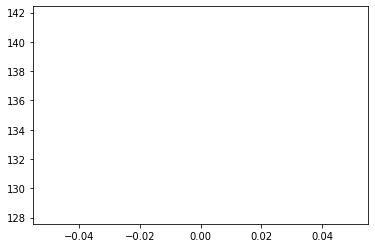

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.6223 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 1.6193 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.6170 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 1.6157 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 1.6153 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 1.6152 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.6152 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 1.6153 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.6153 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 1.6152 - acc: 0.8281
Epoch 11/32
128/128 [========

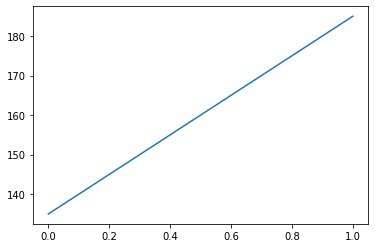

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.8110 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.8110 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.8110 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.8110 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.8109 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.8109 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.8109 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.8108 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.8108 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.8108 - acc: 0.8125
Epoch 11/32
128/128 [========

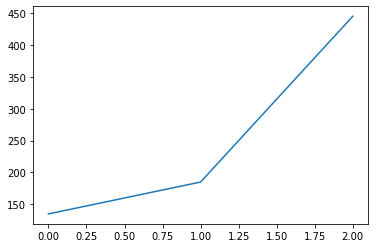

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.0658 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0656 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.0654 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0651 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.0648 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.0646 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.0644 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.0642 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.0641 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0640 - acc: 0.8125
Epoch 11/32
128/128 [========

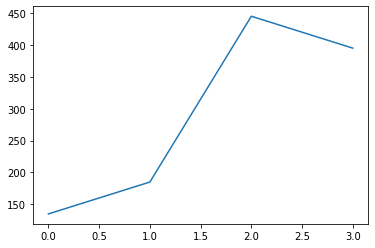

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.0339 - acc: 0.7734
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0338 - acc: 0.7734
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.0335 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.0332 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.0328 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.0324 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.0319 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 581us/step - loss: 0.0314 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.0308 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.0303 - acc: 0.7500
Epoch 11/32
128/128 [========

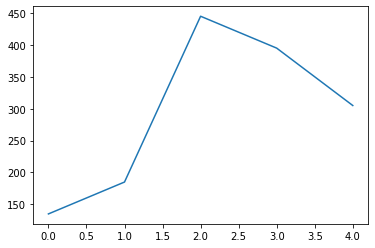

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.3056 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 619us/step - loss: 1.3051 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.3043 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 1.3033 - acc: 0.7500
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 1.3019 - acc: 0.7109
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.3005 - acc: 0.6875
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.2990 - acc: 0.6328
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 1.2977 - acc: 0.5938
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 1.2966 - acc: 0.5625
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 1.2957 - acc: 0.5469
Epoch 11/32
128/128 [========

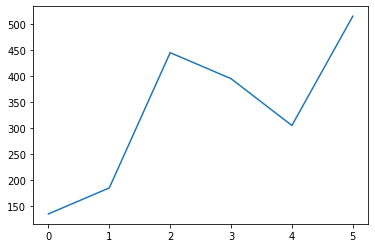

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.4188 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.4188 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.4188 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.4188 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.4187 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.4187 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.4187 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.4186 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.4186 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.4186 - acc: 0.8438
Epoch 11/32
128/128 [========

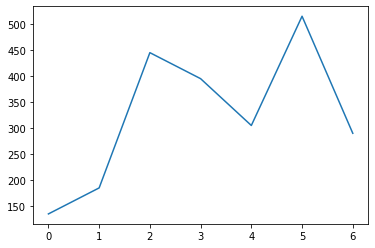

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.0013 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.0013 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.0012 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0012 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.0011 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.0010 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 9.6123e-04 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 8.9971e-04 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 8.4775e-04 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 8.0644e-04 - acc: 0.8906
Epoch 11/32
1

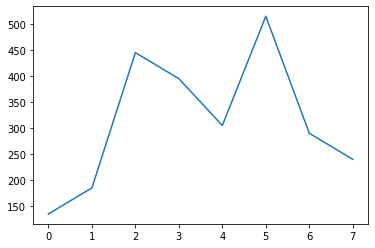

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.4224 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.4222 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.4219 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.4215 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.4210 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 621us/step - loss: 0.4205 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.4198 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.4192 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.4185 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 0.4178 - acc: 0.7812
Epoch 11/32
128/128 [========

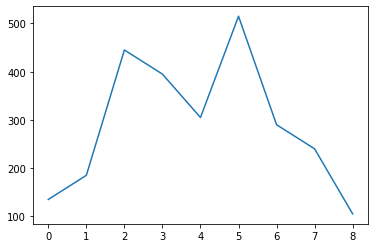

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.3406 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 584us/step - loss: 1.3339 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 1.3224 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 1.3092 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 580us/step - loss: 1.2986 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.2930 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 1.2916 - acc: 0.7891
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 1.2919 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 1.2927 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.2934 - acc: 0.7656
Epoch 11/32
128/128 [========

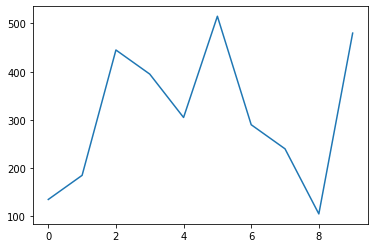

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 1.0001 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.9945 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.9889 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.9859 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.9850 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 0.9850 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.9853 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.9856 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.9857 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.9857 - acc: 0.7656
Epoch 11/32
128/128 [========

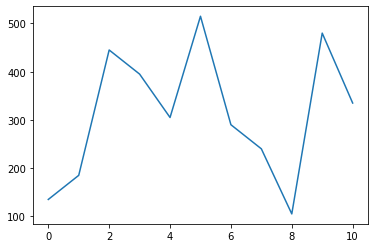

Epoch 1/32
128/128 [==============================] - 0s 611us/step - loss: 0.1593 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.1592 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.1591 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 0.1590 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 580us/step - loss: 0.1589 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 583us/step - loss: 0.1589 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.1588 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.1588 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 585us/step - loss: 0.1587 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 0.1587 - acc: 0.8438
Epoch 11/32
128/128 [========

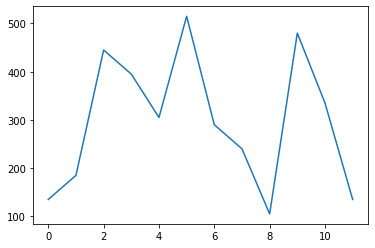

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.0021 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0021 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.0021 - acc: 0.7812
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.0020 - acc: 0.7891
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.0020 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 626us/step - loss: 0.0020 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 0.0020 - acc: 0.7734
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.0019 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0019 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.0019 - acc: 0.7734
Epoch 11/32
128/128 [========

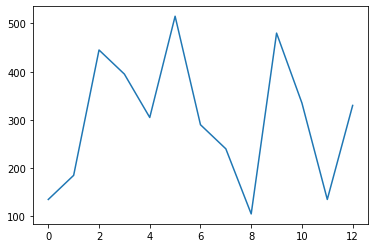

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.8390 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.8388 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.8384 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.8381 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.8379 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.8377 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.8376 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.8375 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.8374 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.8374 - acc: 0.8281
Epoch 11/32
128/128 [========

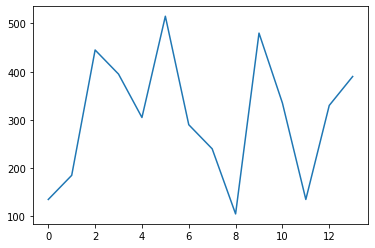

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.0968 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.0962 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0952 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.0939 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0926 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.0915 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.0907 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.0902 - acc: 0.6953
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.0899 - acc: 0.6797
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.0896 - acc: 0.6797
Epoch 11/32
128/128 [========

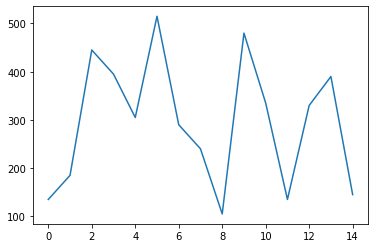

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 0.2999 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.2998 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.2996 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.2994 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 629us/step - loss: 0.2992 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.2990 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.2989 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.2988 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.2987 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 0.2986 - acc: 0.9062
Epoch 11/32
128/128 [========

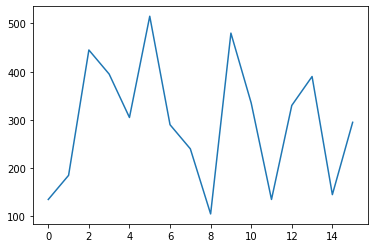

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.0341 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.0341 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0341 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 0.0340 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0340 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0340 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.0339 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0339 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.0339 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.0338 - acc: 0.9062
Epoch 11/32
128/128 [========

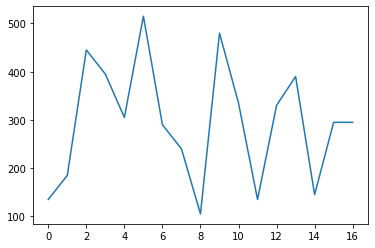

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 2.1663 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 2.1624 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 2.1550 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 2.1441 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 2.1316 - acc: 0.7500
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 2.1218 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 2.1165 - acc: 0.6797
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 2.1147 - acc: 0.6641
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 2.1143 - acc: 0.6562
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 2.1139 - acc: 0.6641
Epoch 11/32
128/128 [========

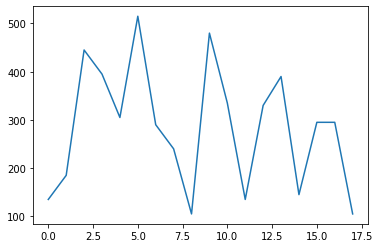

Epoch 1/32
128/128 [==============================] - 0s 511us/step - loss: 0.7794 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 488us/step - loss: 0.7740 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 509us/step - loss: 0.7669 - acc: 0.6953
Epoch 4/32
128/128 [==============================] - 0s 495us/step - loss: 0.7622 - acc: 0.6172
Epoch 5/32
128/128 [==============================] - 0s 503us/step - loss: 0.7606 - acc: 0.5859
Epoch 6/32
128/128 [==============================] - 0s 498us/step - loss: 0.7583 - acc: 0.6016
Epoch 7/32
128/128 [==============================] - 0s 511us/step - loss: 0.7549 - acc: 0.6562
Epoch 8/32
128/128 [==============================] - 0s 501us/step - loss: 0.7527 - acc: 0.7109
Epoch 9/32
128/128 [==============================] - 0s 506us/step - loss: 0.7522 - acc: 0.6719
Epoch 10/32
128/128 [==============================] - 0s 501us/step - loss: 0.7516 - acc: 0.6562
Epoch 11/32
128/128 [========

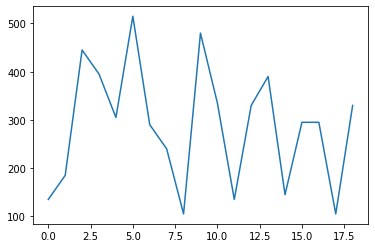

Epoch 1/32
128/128 [==============================] - 0s 503us/step - loss: 0.2928 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 498us/step - loss: 0.2928 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 491us/step - loss: 0.2927 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 500us/step - loss: 0.2927 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 500us/step - loss: 0.2926 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 502us/step - loss: 0.2926 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 502us/step - loss: 0.2925 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 508us/step - loss: 0.2924 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 513us/step - loss: 0.2923 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 498us/step - loss: 0.2922 - acc: 0.8672
Epoch 11/32
128/128 [========

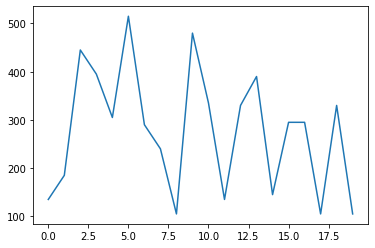

We are in the epoc:  7 Epsilon:  0.735091890625
Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.1292 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.1292 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.1291 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.1290 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.1290 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.1289 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 617us/step - loss: 0.1289 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.1288 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.1288 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 0.

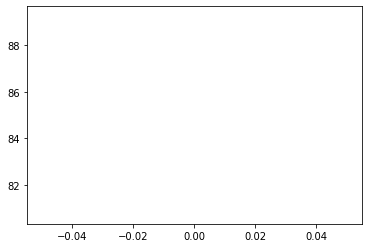

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 1.8463 - acc: 0.6641
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.8380 - acc: 0.7031
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.8261 - acc: 0.6094
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 1.8167 - acc: 0.5391
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.8115 - acc: 0.5312
Epoch 6/32
128/128 [==============================] - 0s 586us/step - loss: 1.8075 - acc: 0.5469
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.8047 - acc: 0.5859
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 1.8039 - acc: 0.5703
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 1.8031 - acc: 0.5469
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 1.8012 - acc: 0.5625
Epoch 11/32
128/128 [========

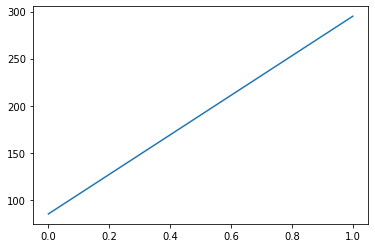

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 1.2332 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.2290 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 1.2216 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 1.2123 - acc: 0.7422
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 1.2043 - acc: 0.6875
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 1.2005 - acc: 0.6484
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.2008 - acc: 0.6016
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.2021 - acc: 0.6016
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 1.2019 - acc: 0.6094
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.1999 - acc: 0.6875
Epoch 11/32
128/128 [========

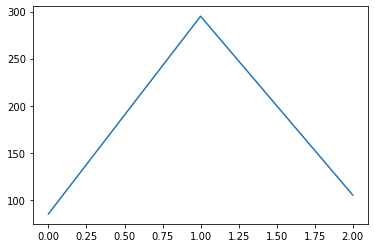

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.5177 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.5176 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.5176 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.5175 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.5175 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 583us/step - loss: 0.5175 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.5175 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 572us/step - loss: 0.5175 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 576us/step - loss: 0.5175 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 575us/step - loss: 0.5174 - acc: 0.8750
Epoch 11/32
128/128 [========

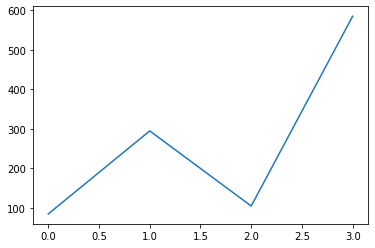

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.1310 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.1301 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 624us/step - loss: 0.1285 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 0.1264 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.1241 - acc: 0.7188
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.1220 - acc: 0.6953
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.1205 - acc: 0.6953
Epoch 8/32
128/128 [==============================] - 0s 618us/step - loss: 0.1195 - acc: 0.6953
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.1187 - acc: 0.7031
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.1180 - acc: 0.7109
Epoch 11/32
128/128 [========

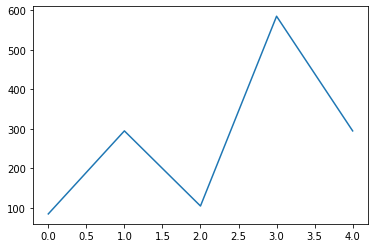

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.7999 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.7854 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.7746 - acc: 0.7891
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.7734 - acc: 0.7500
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.7750 - acc: 0.7266
Epoch 6/32
128/128 [==============================] - 0s 626us/step - loss: 0.7764 - acc: 0.7031
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.7767 - acc: 0.7031
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.7759 - acc: 0.7109
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.7745 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.7730 - acc: 0.8203
Epoch 11/32
128/128 [========

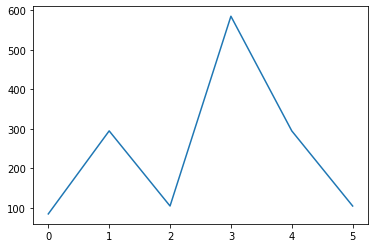

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.0036 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.0036 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0036 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0036 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.0036 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.0036 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 0.0035 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.0035 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0035 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.0034 - acc: 0.9141
Epoch 11/32
128/128 [========

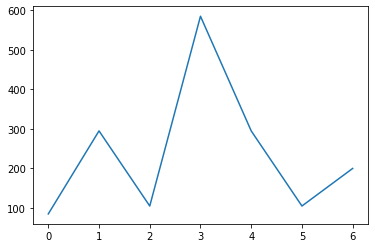

Epoch 1/32
128/128 [==============================] - 0s 485us/step - loss: 0.1621 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.1619 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.1617 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.1614 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.1612 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.1611 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.1610 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.1610 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.1609 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.1609 - acc: 0.8906
Epoch 11/32
128/128 [========

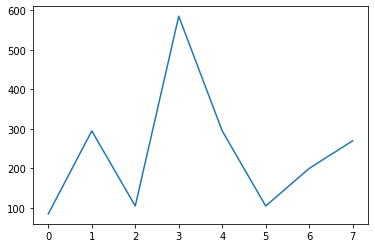

Epoch 1/32
128/128 [==============================] - 0s 552us/step - loss: 0.5181 - acc: 0.7969
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 0.5180 - acc: 0.7969
Epoch 3/32
128/128 [==============================] - 0s 569us/step - loss: 0.5180 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 576us/step - loss: 0.5180 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 564us/step - loss: 0.5180 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 575us/step - loss: 0.5179 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 581us/step - loss: 0.5179 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.5179 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 577us/step - loss: 0.5179 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.5179 - acc: 0.8359
Epoch 11/32
128/128 [========

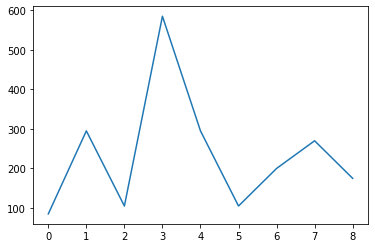

Epoch 1/32
128/128 [==============================] - 0s 565us/step - loss: 52.1880 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 501us/step - loss: 52.1018 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 495us/step - loss: 51.9971 - acc: 0.7031
Epoch 4/32
128/128 [==============================] - 0s 494us/step - loss: 51.9398 - acc: 0.6641
Epoch 5/32
128/128 [==============================] - 0s 502us/step - loss: 51.9314 - acc: 0.5938
Epoch 6/32
128/128 [==============================] - 0s 493us/step - loss: 51.9378 - acc: 0.5703
Epoch 7/32
128/128 [==============================] - 0s 487us/step - loss: 51.9431 - acc: 0.5547
Epoch 8/32
128/128 [==============================] - 0s 496us/step - loss: 51.9439 - acc: 0.5703
Epoch 9/32
128/128 [==============================] - 0s 487us/step - loss: 51.9400 - acc: 0.6172
Epoch 10/32
128/128 [==============================] - 0s 488us/step - loss: 51.9350 - acc: 0.6641
Epoch 11/32
128/128

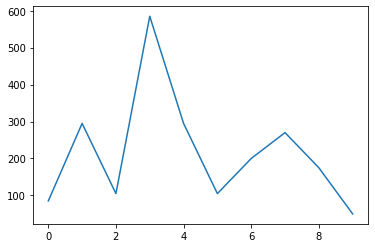

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.5805 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.5793 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.5769 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.5741 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.5715 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.5693 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.5677 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.5666 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.5661 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 0.5658 - acc: 0.7578
Epoch 11/32
128/128 [========

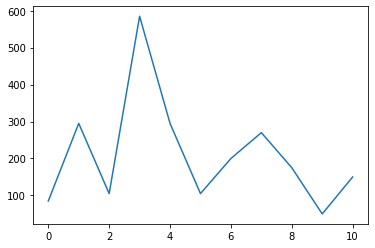

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.2632 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 0.2626 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.2617 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.2605 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 581us/step - loss: 0.2590 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 578us/step - loss: 0.2575 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.2558 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.2542 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.2525 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.2508 - acc: 0.7969
Epoch 11/32
128/128 [========

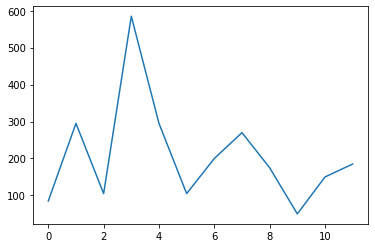

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.0041 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0040 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.0040 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0040 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0039 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0039 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.0038 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 617us/step - loss: 0.0038 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.0037 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.0037 - acc: 0.8906
Epoch 11/32
128/128 [========

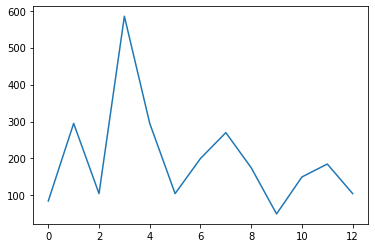

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.5853 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.5850 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.5846 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.5840 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.5832 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 580us/step - loss: 0.5822 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 579us/step - loss: 0.5810 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.5799 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.5790 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.5783 - acc: 0.8438
Epoch 11/32
128/128 [========

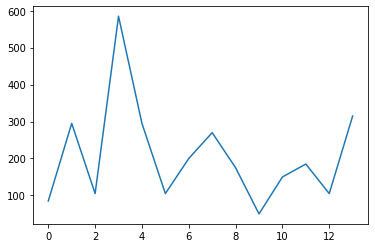

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.6425 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.6425 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.6424 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.6424 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.6424 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.6423 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 623us/step - loss: 0.6423 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.6423 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.6422 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.6422 - acc: 0.9453
Epoch 11/32
128/128 [========

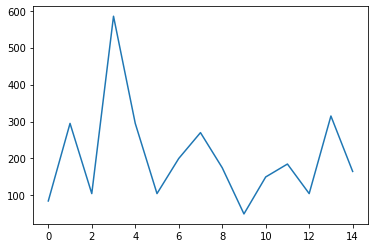

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0032 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0031 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.0031 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.0031 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0031 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.0030 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.0030 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.0030 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.0030 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.0029 - acc: 0.9141
Epoch 11/32
128/128 [========

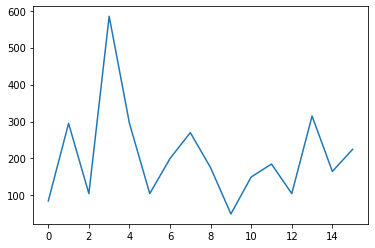

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 2.2851 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 2.2840 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 2.2831 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 2.2828 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 2.2827 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 2.2827 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 2.2827 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 2.2826 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 2.2825 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 2.2824 - acc: 0.8750
Epoch 11/32
128/128 [========

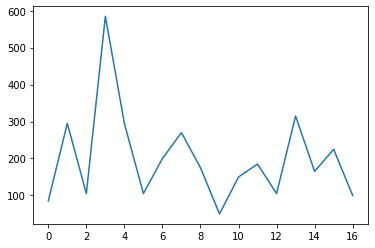

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.7038 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.7028 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 578us/step - loss: 0.7012 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.6994 - acc: 0.7812
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.6978 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.6963 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.6950 - acc: 0.7266
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.6939 - acc: 0.7266
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.6929 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.6920 - acc: 0.7500
Epoch 11/32
128/128 [========

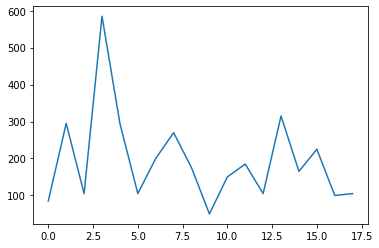

Epoch 1/32
128/128 [==============================] - 0s 568us/step - loss: 0.0353 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 0.0353 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.0353 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0352 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.0352 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0351 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.0350 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0349 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0348 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.0348 - acc: 0.9141
Epoch 11/32
128/128 [========

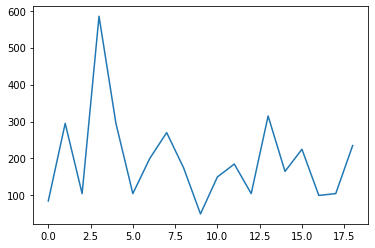

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.6452 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 584us/step - loss: 0.6452 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.6452 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.6451 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.6451 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.6451 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 0.6450 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 616us/step - loss: 0.6450 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.6450 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 633us/step - loss: 0.6449 - acc: 0.8594
Epoch 11/32
128/128 [========

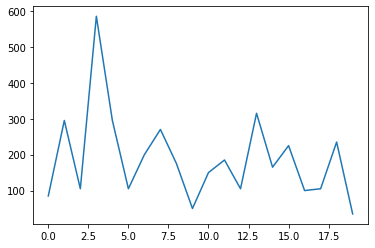

We are in the epoc:  8 Epsilon:  0.6983372960937501
Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.5514 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.5509 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.5502 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.5495 - acc: 0.7812
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.5488 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.5481 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.5476 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.5472 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.5468 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss

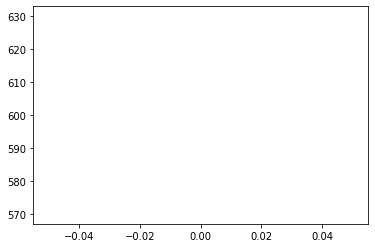

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.5164 - acc: 0.7891
Epoch 2/32
128/128 [==============================] - 0s 575us/step - loss: 0.5163 - acc: 0.7734
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.5163 - acc: 0.7734
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.5163 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 0.5163 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5163 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.5163 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.5162 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.5162 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.5162 - acc: 0.8281
Epoch 11/32
128/128 [========

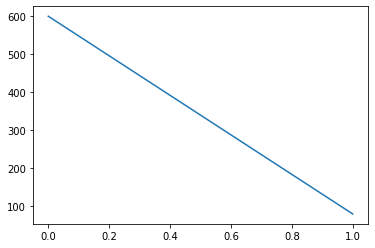

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.1049 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 1.0972 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.0867 - acc: 0.6953
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 1.0798 - acc: 0.6484
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 1.0785 - acc: 0.6406
Epoch 6/32
128/128 [==============================] - 0s 612us/step - loss: 1.0790 - acc: 0.6484
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 1.0782 - acc: 0.6641
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 1.0757 - acc: 0.6641
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 1.0731 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.0717 - acc: 0.8281
Epoch 11/32
128/128 [========

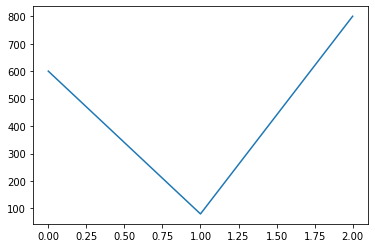

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.2911 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.2911 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 0.2911 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.2911 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 583us/step - loss: 0.2911 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.2911 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.2910 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.2909 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 581us/step - loss: 0.2909 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.2909 - acc: 0.8906
Epoch 11/32
128/128 [========

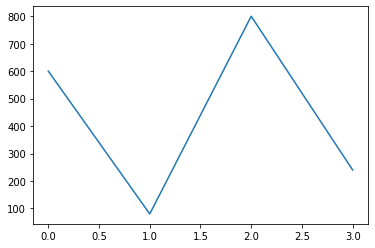

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 1.0489 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 585us/step - loss: 1.0461 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 1.0416 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 1.0363 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 1.0318 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 1.0290 - acc: 0.7656
Epoch 7/32
128/128 [==============================] - 0s 639us/step - loss: 1.0278 - acc: 0.7031
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 1.0274 - acc: 0.6797
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.0270 - acc: 0.7109
Epoch 10/32
128/128 [==============================] - 0s 621us/step - loss: 1.0262 - acc: 0.7500
Epoch 11/32
128/128 [========

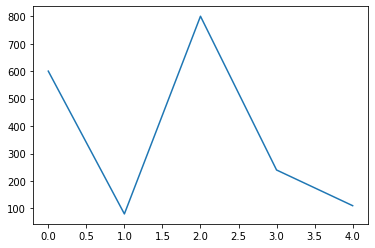

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 2.0967 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 2.0896 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 2.0777 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 2.0666 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 2.0606 - acc: 0.7031
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 2.0587 - acc: 0.6484
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 2.0573 - acc: 0.6484
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 2.0552 - acc: 0.6719
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 2.0527 - acc: 0.6953
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 2.0509 - acc: 0.7578
Epoch 11/32
128/128 [========

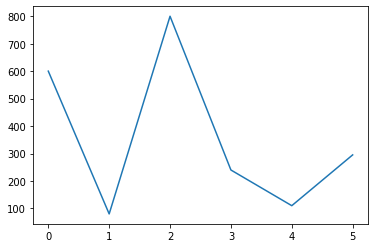

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.0031 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 0.0030 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0030 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.0030 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0030 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 613us/step - loss: 0.0029 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 617us/step - loss: 0.0028 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0027 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 620us/step - loss: 0.0026 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0025 - acc: 0.8516
Epoch 11/32
128/128 [========

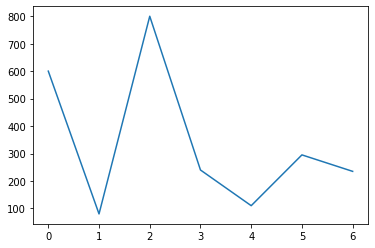

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0358 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.0356 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 582us/step - loss: 0.0353 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0349 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0346 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.0343 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.0340 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.0338 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 583us/step - loss: 0.0336 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.0335 - acc: 0.8047
Epoch 11/32
128/128 [========

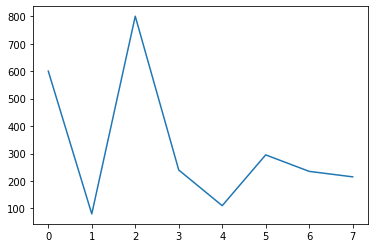

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.0661 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 0.0658 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.0654 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0648 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 0.0644 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0641 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.0638 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 617us/step - loss: 0.0637 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 625us/step - loss: 0.0635 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.0634 - acc: 0.8047
Epoch 11/32
128/128 [========

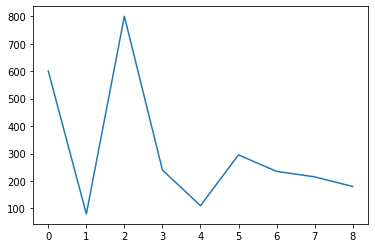

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.9570 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.9536 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.9479 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 575us/step - loss: 0.9439 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.9429 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.9432 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.9436 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.9438 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.9440 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.9439 - acc: 0.8438
Epoch 11/32
128/128 [========

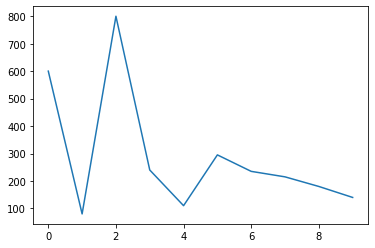

Epoch 1/32
128/128 [==============================] - 0s 568us/step - loss: 0.1297 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.1297 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.1296 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.1296 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.1296 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.1296 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.1296 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.1296 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.1296 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.1296 - acc: 0.8594
Epoch 11/32
128/128 [========

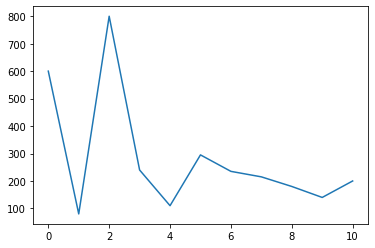

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.3563 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 578us/step - loss: 0.3550 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 579us/step - loss: 0.3528 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.3500 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.3472 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.3447 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.3427 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.3413 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.3404 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.3397 - acc: 0.7812
Epoch 11/32
128/128 [========

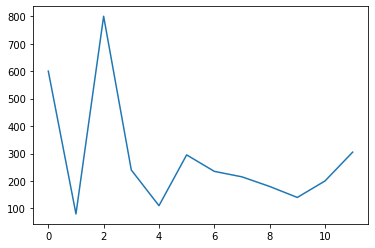

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 1.0265 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 1.0219 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 1.0075 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.9810 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.9684 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 586us/step - loss: 0.9665 - acc: 0.7422
Epoch 7/32
128/128 [==============================] - 0s 583us/step - loss: 0.9663 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.9667 - acc: 0.7266
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.9671 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.9674 - acc: 0.7422
Epoch 11/32
128/128 [========

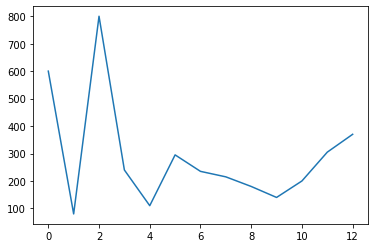

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 1.4081 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 1.4054 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 1.4004 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 1.3931 - acc: 0.7344
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.3838 - acc: 0.5781
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.3738 - acc: 0.5156
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 1.3658 - acc: 0.5078
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 1.3616 - acc: 0.5000
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 1.3593 - acc: 0.5000
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.3565 - acc: 0.4922
Epoch 11/32
128/128 [========

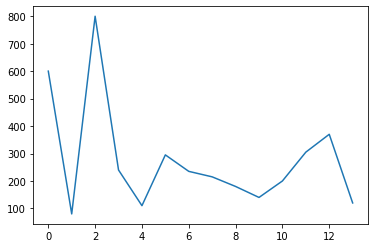

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.3600 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.3578 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.3545 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.3511 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.3484 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.3469 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.3463 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.3462 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.3461 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.3458 - acc: 0.8047
Epoch 11/32
128/128 [========

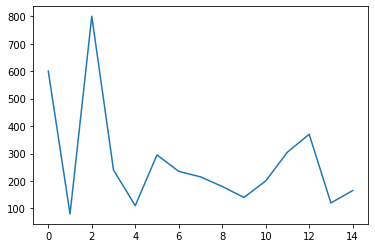

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.0078 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0078 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 0.0077 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0077 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.0076 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.0076 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0075 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.0074 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.0073 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.0072 - acc: 0.9219
Epoch 11/32
128/128 [========

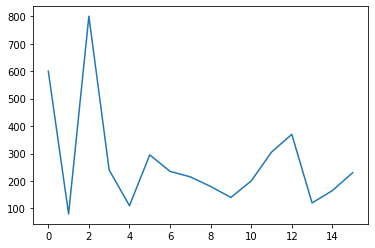

Epoch 1/32
128/128 [==============================] - 0s 569us/step - loss: 0.5226 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.5225 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.5225 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.5224 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.5223 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5222 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.5221 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.5220 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.5219 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.5218 - acc: 0.9062
Epoch 11/32
128/128 [========

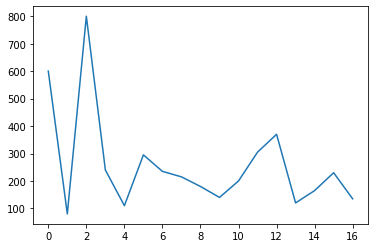

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.9706 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 579us/step - loss: 0.9661 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 573us/step - loss: 0.9590 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.9509 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.9433 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.9379 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.9352 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.9340 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.9337 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.9335 - acc: 0.7734
Epoch 11/32
128/128 [========

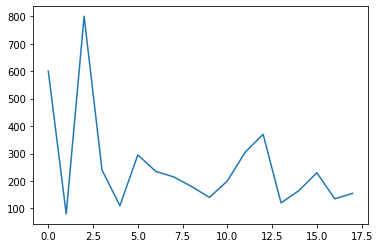

Epoch 1/32
128/128 [==============================] - 0s 606us/step - loss: 0.5875 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.5843 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.5789 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.5723 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.5660 - acc: 0.7188
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.5613 - acc: 0.6797
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.5582 - acc: 0.6641
Epoch 8/32
128/128 [==============================] - 0s 580us/step - loss: 0.5561 - acc: 0.6641
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.5545 - acc: 0.6953
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.5531 - acc: 0.6953
Epoch 11/32
128/128 [========

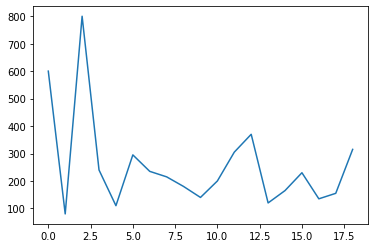

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.0656 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.0646 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.0632 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.0618 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.0609 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.0603 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.0600 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.0597 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0593 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.0589 - acc: 0.8203
Epoch 11/32
128/128 [========

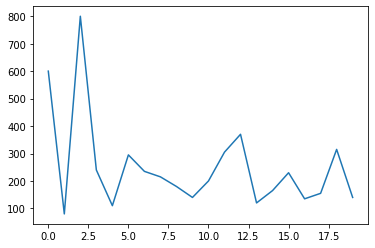

We are in the epoc:  9 Epsilon:  0.6634204312890626
Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 1.3082 - acc: 0.7734
Epoch 2/32
128/128 [==============================] - 0s 581us/step - loss: 1.3050 - acc: 0.7734
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 1.3027 - acc: 0.7812
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 1.3017 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.3013 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 1.3012 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.3012 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 1.3012 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 1.3011 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss

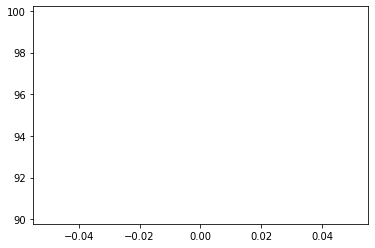

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.1915 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.1915 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1914 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.1914 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 0.1913 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 580us/step - loss: 0.1913 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.1912 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.1912 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.1911 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.1911 - acc: 0.9297
Epoch 11/32
128/128 [========

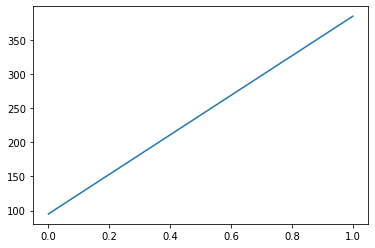

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.5794 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 583us/step - loss: 0.5794 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.5794 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.5794 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 615us/step - loss: 0.5793 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 0.5793 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.5793 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.5793 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.5793 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.5793 - acc: 0.8984
Epoch 11/32
128/128 [========

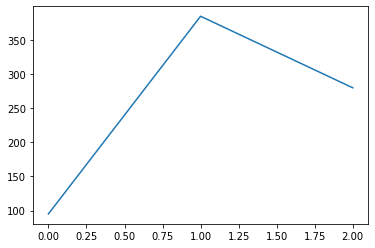

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.1612 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.1598 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.1579 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.1562 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.1551 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.1544 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.1538 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 617us/step - loss: 0.1531 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.1525 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.1518 - acc: 0.8672
Epoch 11/32
128/128 [========

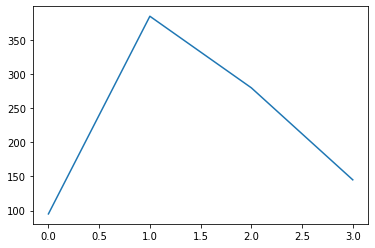

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 1.2999 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 577us/step - loss: 1.2939 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 1.2844 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 575us/step - loss: 1.2757 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 582us/step - loss: 1.2707 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.2691 - acc: 0.7422
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 1.2690 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 1.2690 - acc: 0.7266
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.2685 - acc: 0.7188
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 1.2674 - acc: 0.7422
Epoch 11/32
128/128 [========

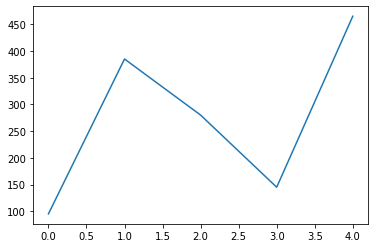

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.2921 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 0.2921 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.2920 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.2920 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.2920 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.2919 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.2919 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.2918 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.2918 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.2918 - acc: 0.8906
Epoch 11/32
128/128 [========

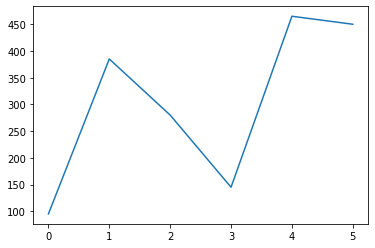

Epoch 1/32
128/128 [==============================] - 0s 601us/step - loss: 2.1525 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 2.1483 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 2.1411 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 2.1328 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 2.1268 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 2.1239 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 2.1230 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 2.1229 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 620us/step - loss: 2.1231 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 2.1233 - acc: 0.8672
Epoch 11/32
128/128 [========

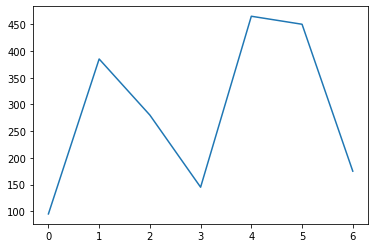

Epoch 1/32
128/128 [==============================] - 0s 605us/step - loss: 1.4563 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 1.4550 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 1.4533 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.4521 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 1.4515 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.4512 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 1.4512 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 1.4512 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.4511 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 1.4510 - acc: 0.8281
Epoch 11/32
128/128 [========

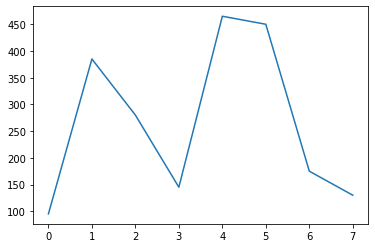

Epoch 1/32
128/128 [==============================] - 0s 566us/step - loss: 0.2909 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 0.2909 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.2909 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.2908 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.2908 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 573us/step - loss: 0.2907 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.2907 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.2906 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.2906 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.2906 - acc: 0.8594
Epoch 11/32
128/128 [========

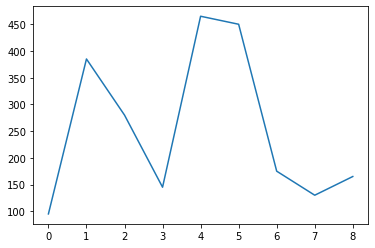

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.7637 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.7623 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.7597 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.7555 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.7501 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.7442 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.7389 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.7344 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 0.7304 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.7271 - acc: 0.7891
Epoch 11/32
128/128 [========

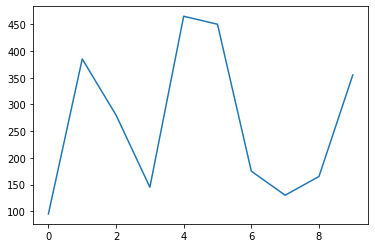

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 1.4770 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.4635 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.4463 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 1.4378 - acc: 0.7578
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.4367 - acc: 0.7266
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 1.4373 - acc: 0.7109
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 1.4376 - acc: 0.7109
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 1.4374 - acc: 0.6797
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 1.4369 - acc: 0.6953
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 1.4363 - acc: 0.7109
Epoch 11/32
128/128 [========

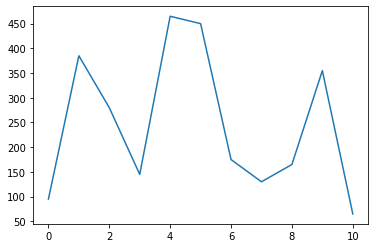

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0357 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.0357 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.0356 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 0.0356 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0356 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0356 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.0356 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.0355 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0355 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.0355 - acc: 0.8984
Epoch 11/32
128/128 [========

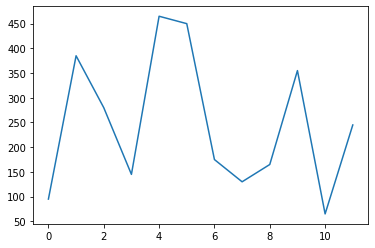

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.5187 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 585us/step - loss: 0.5187 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.5187 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.5186 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 0.5186 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.5186 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 622us/step - loss: 0.5185 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.5185 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.5185 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 622us/step - loss: 0.5185 - acc: 0.9453
Epoch 11/32
128/128 [========

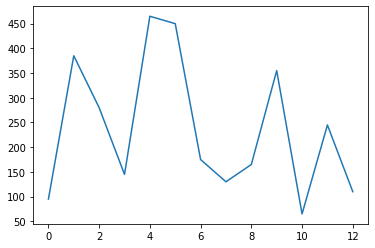

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 1.8811 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 580us/step - loss: 1.8746 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 577us/step - loss: 1.8637 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 1.8514 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 1.8395 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 1.8302 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.8245 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 1.8223 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.8223 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 1.8230 - acc: 0.7422
Epoch 11/32
128/128 [========

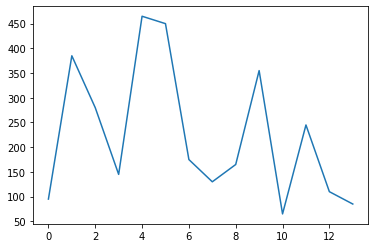

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.0346 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0346 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0346 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 621us/step - loss: 0.0345 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.0345 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.0344 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0343 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 616us/step - loss: 0.0342 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.0341 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.0340 - acc: 0.9375
Epoch 11/32
128/128 [========

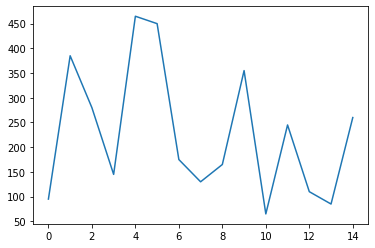

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.0655 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0654 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0654 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.0653 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0652 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.0651 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.0650 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.0650 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0649 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.0648 - acc: 0.9453
Epoch 11/32
128/128 [========

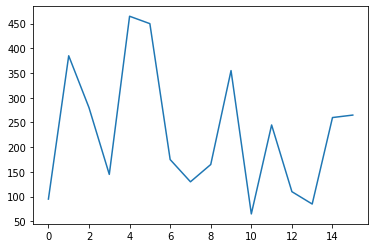

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0068 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0068 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.0068 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0067 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.0067 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.0066 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.0066 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.0065 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 585us/step - loss: 0.0065 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.0064 - acc: 0.8906
Epoch 11/32
128/128 [========

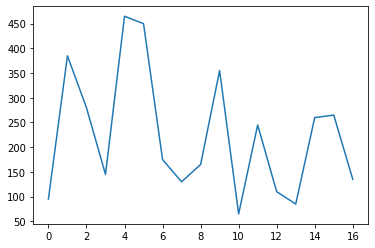

Epoch 1/32
128/128 [==============================] - 0s 563us/step - loss: 0.5796 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 580us/step - loss: 0.5796 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.5795 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.5794 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.5794 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.5793 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.5792 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.5791 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.5791 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 0.5790 - acc: 0.8438
Epoch 11/32
128/128 [========

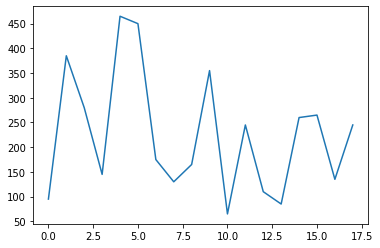

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.7455 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.7437 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.7408 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 579us/step - loss: 0.7370 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.7325 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.7277 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.7227 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.7180 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 623us/step - loss: 0.7137 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 628us/step - loss: 0.7098 - acc: 0.7891
Epoch 11/32
128/128 [========

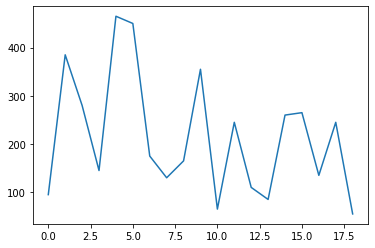

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.5203 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.5203 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.5202 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.5201 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.5200 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.5199 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 0.5199 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 582us/step - loss: 0.5198 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.5197 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.5197 - acc: 0.8516
Epoch 11/32
128/128 [========

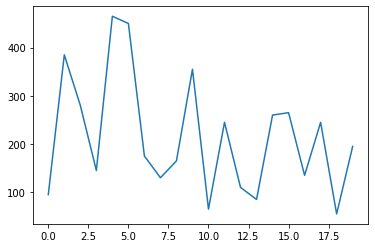

We are in the epoc:  10 Epsilon:  0.6302494097246094
Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.7756 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.7709 - acc: 0.7969
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.7648 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.7607 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.7591 - acc: 0.7578
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 0.7587 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.7583 - acc: 0.7656
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.7574 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.7564 - acc: 0.7500
Epoch 10/32
128/128 [==============================] - 0s 604us/step - los

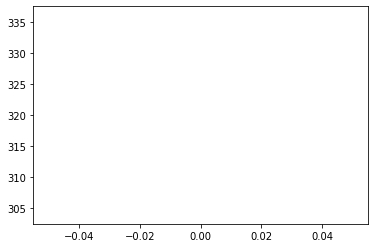

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 1.6153 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.6111 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 1.6037 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 1.5946 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.5859 - acc: 0.7891
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.5793 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 1.5755 - acc: 0.7031
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 1.5736 - acc: 0.6875
Epoch 9/32
128/128 [==============================] - 0s 577us/step - loss: 1.5727 - acc: 0.6797
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 1.5721 - acc: 0.6875
Epoch 11/32
128/128 [========

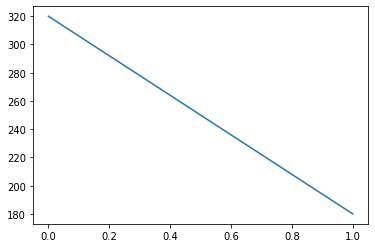

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.8465 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.8425 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.8358 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.8284 - acc: 0.7891
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.8225 - acc: 0.6875
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.8191 - acc: 0.6094
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.8175 - acc: 0.5938
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.8166 - acc: 0.5859
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.8154 - acc: 0.5938
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.8137 - acc: 0.6406
Epoch 11/32
128/128 [========

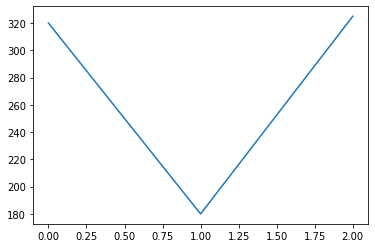

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 1.1347 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 1.1286 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 1.1191 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 1.1106 - acc: 0.7891
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 1.1064 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.1058 - acc: 0.7656
Epoch 7/32
128/128 [==============================] - 0s 619us/step - loss: 1.1065 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 1.1070 - acc: 0.7344
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.1067 - acc: 0.7344
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.1057 - acc: 0.7344
Epoch 11/32
128/128 [========

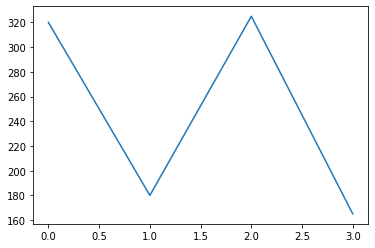

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.9328 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.9323 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.9314 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.9303 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.9291 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 586us/step - loss: 0.9279 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.9269 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.9260 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 621us/step - loss: 0.9253 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.9247 - acc: 0.8594
Epoch 11/32
128/128 [========

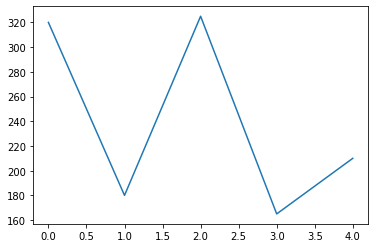

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.2043 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 585us/step - loss: 1.1972 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.1862 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 1.1757 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 1.1687 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.1652 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 1.1637 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 1.1629 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 623us/step - loss: 1.1621 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 1.1613 - acc: 0.8672
Epoch 11/32
128/128 [========

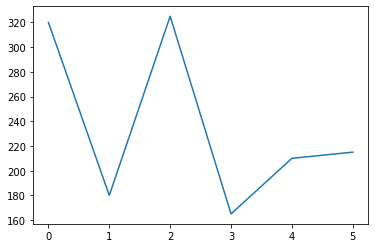

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.0361 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.0360 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0360 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.0359 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0358 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0357 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.0356 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.0356 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.0355 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.0354 - acc: 0.9297
Epoch 11/32
128/128 [========

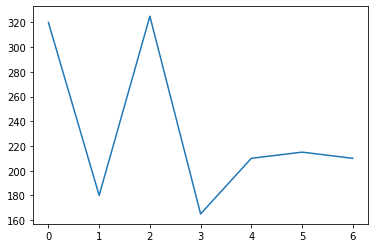

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.0038 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0038 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0038 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0037 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.0037 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.0036 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.0035 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0035 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 578us/step - loss: 0.0034 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.0034 - acc: 0.9141
Epoch 11/32
128/128 [========

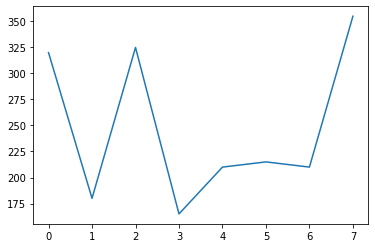

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0023 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.0023 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0023 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0022 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.0022 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.0021 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.0021 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.0020 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.0020 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.0020 - acc: 0.9141
Epoch 11/32
128/128 [========

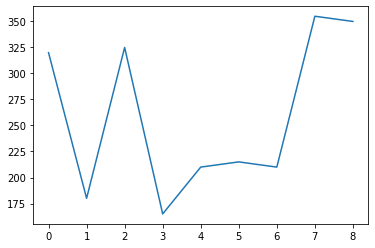

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.9382 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 1.9302 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.9197 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 1.9114 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.9064 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 615us/step - loss: 1.9029 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.8998 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.8966 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 1.8935 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.8911 - acc: 0.7422
Epoch 11/32
128/128 [========

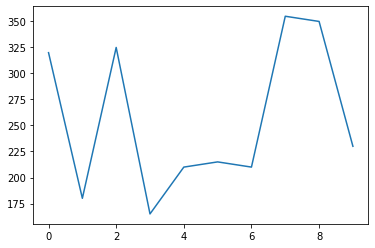

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 2.0302 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 2.0236 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 2.0164 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 569us/step - loss: 2.0118 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 582us/step - loss: 2.0099 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 2.0092 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 2.0084 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 2.0072 - acc: 0.7344
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 2.0056 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 2.0037 - acc: 0.7812
Epoch 11/32
128/128 [========

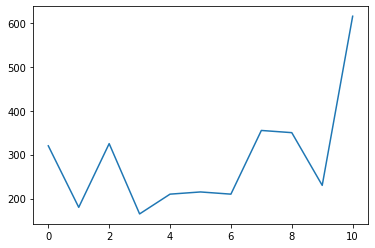

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0099 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0099 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 0.0101 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 631us/step - loss: 0.0102 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.0103 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0103 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.0102 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0100 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.0099 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.0097 - acc: 0.8984
Epoch 11/32
128/128 [========

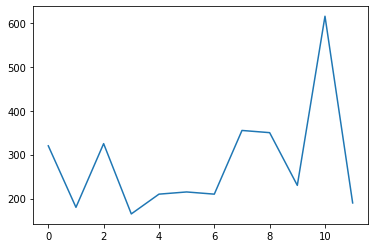

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.4859 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.4844 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.4819 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.4787 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.4754 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.4723 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.4699 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.4683 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.4672 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.4665 - acc: 0.8750
Epoch 11/32
128/128 [========

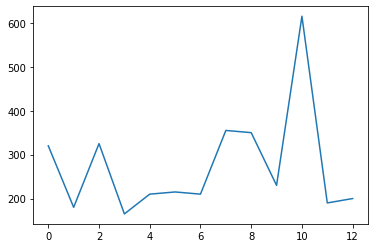

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0359 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0355 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 0.0349 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 0.0342 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0335 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.0329 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.0325 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.0320 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.0315 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 580us/step - loss: 0.0310 - acc: 0.9375
Epoch 11/32
128/128 [========

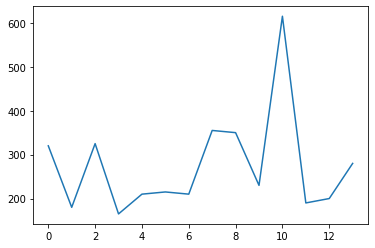

Epoch 1/32
128/128 [==============================] - 0s 560us/step - loss: 0.0356 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 624us/step - loss: 0.0356 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0355 - acc: 0.9688
Epoch 4/32
128/128 [==============================] - 0s 625us/step - loss: 0.0354 - acc: 0.9688
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0354 - acc: 0.9688
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.0353 - acc: 0.9688
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.0352 - acc: 0.9688
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.0351 - acc: 0.9688
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.0350 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.0350 - acc: 0.9688
Epoch 11/32
128/128 [========

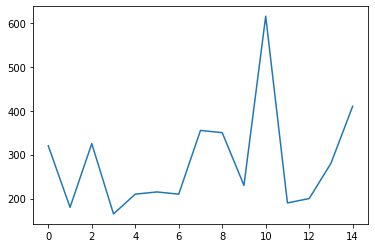

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.1997 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.1988 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.1976 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 1.1966 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 1.1959 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 1.1957 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 1.1956 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 1.1956 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 576us/step - loss: 1.1955 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 582us/step - loss: 1.1954 - acc: 0.8828
Epoch 11/32
128/128 [========

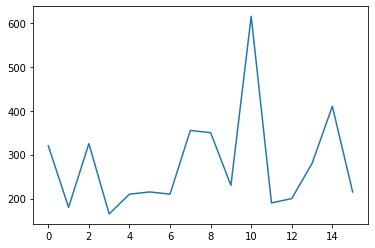

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 2.6405 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 2.6266 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 2.6062 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 2.5875 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 2.5770 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 2.5738 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 2.5738 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 2.5744 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 2.5746 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 2.5742 - acc: 0.8516
Epoch 11/32
128/128 [========

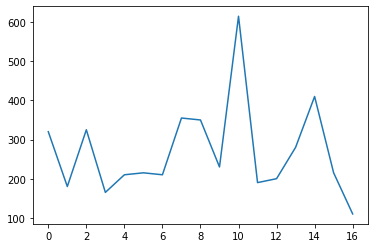

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.5465 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.5464 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.5462 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.5461 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.5459 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5458 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 0.5457 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.5456 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.5456 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.5455 - acc: 0.8828
Epoch 11/32
128/128 [========

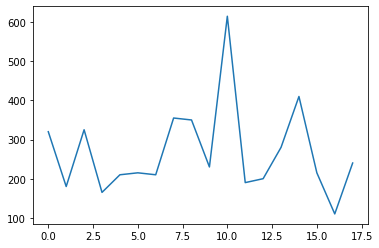

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.8093 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.8092 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.8090 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 0.8088 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.8086 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.8084 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.8083 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.8081 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.8080 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.8079 - acc: 0.8672
Epoch 11/32
128/128 [========

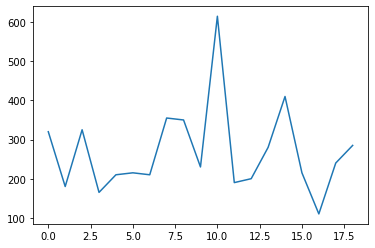

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 2.4639 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 2.4609 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 2.4558 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 2.4492 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 2.4416 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 2.4337 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 2.4262 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 2.4201 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 2.4162 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 2.4143 - acc: 0.7891
Epoch 11/32
128/128 [========

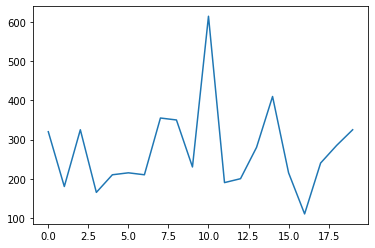

We are in the epoc:  11 Epsilon:  0.5987369392383789
Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.1295 - acc: 0.9844
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.1294 - acc: 0.9844
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.1293 - acc: 0.9766
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.1293 - acc: 0.9766
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.1292 - acc: 0.9766
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.1292 - acc: 0.9766
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.1292 - acc: 0.9766
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.1292 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.1291 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 590us/step - los

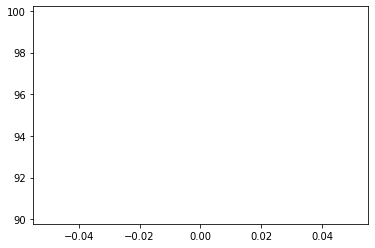

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.6845 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.6723 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 0.6635 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.6624 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.6625 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.6613 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 0.6594 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.6580 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.6570 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.6563 - acc: 0.8516
Epoch 11/32
128/128 [========

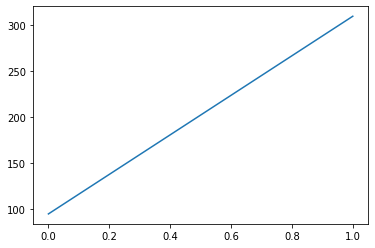

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.6442 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.6424 - acc: 0.9844
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.6404 - acc: 0.9922
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.6391 - acc: 0.9844
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.6385 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.6382 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.6380 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.6379 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.6378 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.6378 - acc: 0.9531
Epoch 11/32
128/128 [========

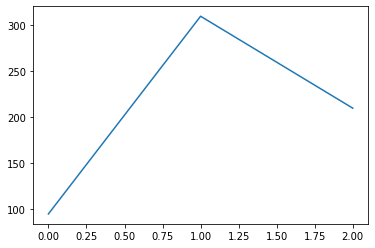

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.5124 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.5122 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.5118 - acc: 0.9688
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.5115 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.5114 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.5114 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.5113 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.5113 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.5111 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.5110 - acc: 0.9375
Epoch 11/32
128/128 [========

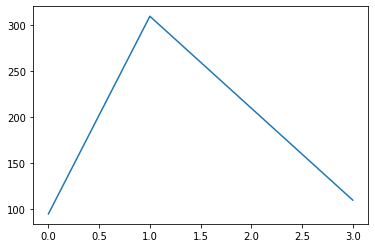

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.2914 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.2914 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.2913 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.2913 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.2913 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.2912 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.2912 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.2912 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.2911 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.2911 - acc: 0.9297
Epoch 11/32
128/128 [========

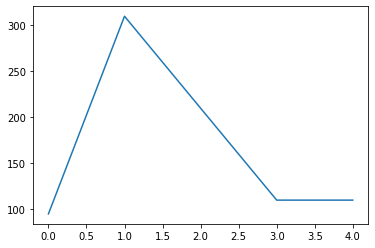

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 1.1283 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 1.1223 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.1185 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 1.1175 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 1.1177 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 612us/step - loss: 1.1182 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.1185 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 1.1185 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.1180 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.1174 - acc: 0.8672
Epoch 11/32
128/128 [========

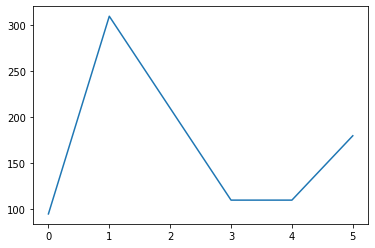

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.0324 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.0324 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.0323 - acc: 0.9688
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.0323 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.0323 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0323 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 0.0322 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.0322 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0322 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0322 - acc: 0.9531
Epoch 11/32
128/128 [========

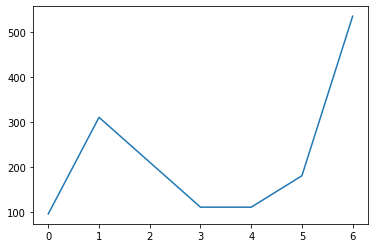

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 52.1868 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 52.1832 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 52.1807 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 52.1794 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 52.1786 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 52.1780 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 52.1775 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 52.1772 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 52.1770 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 52.1768 - acc: 0.8828
Epoch 11/32
128/128

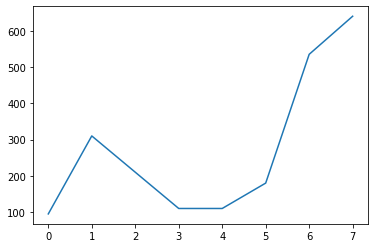

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 1.6788 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 1.6773 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 1.6752 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 1.6736 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 1.6727 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 1.6724 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.6723 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.6724 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 1.6723 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 1.6722 - acc: 0.8516
Epoch 11/32
128/128 [========

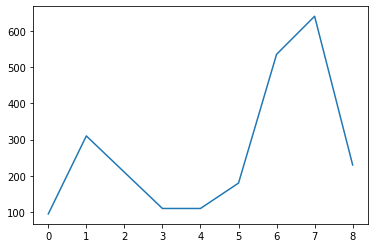

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 1.4607 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 619us/step - loss: 1.4586 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.4556 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 1.4529 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 1.4512 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 1.4503 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 1.4498 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.4493 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.4487 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 1.4481 - acc: 0.8672
Epoch 11/32
128/128 [========

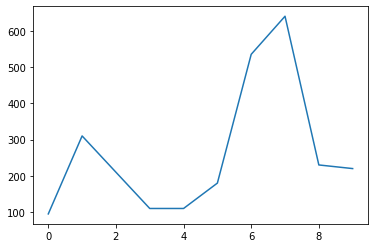

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0023 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0023 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0022 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.0022 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.0022 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0022 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.0022 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.0021 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 0.0021 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.0021 - acc: 0.9375
Epoch 11/32
128/128 [========

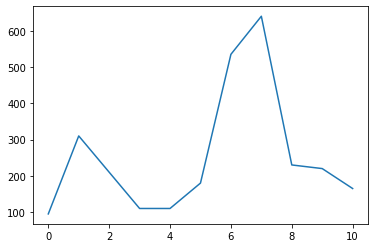

Epoch 1/32
128/128 [==============================] - 0s 566us/step - loss: 0.0327 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0327 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0326 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.0326 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.0326 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0325 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.0325 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0325 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.0324 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0324 - acc: 0.9375
Epoch 11/32
128/128 [========

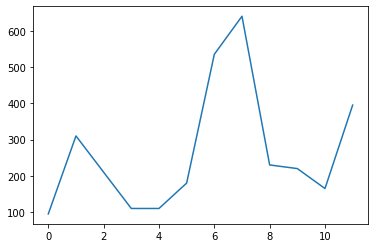

Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 1.2957 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.2945 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 1.2931 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 1.2916 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.2902 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 1.2889 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 1.2878 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 1.2869 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 1.2863 - acc: 0.8281
Epoch 11/32
128/128 [==============================] - 0s 603us/step - loss: 1.2857 - acc: 0.8281
Epoch 12/32
128/128 [=======

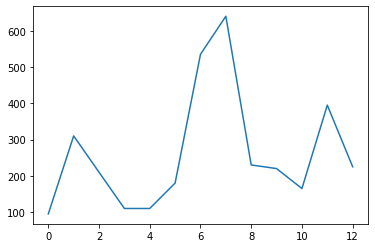

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.0023 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.0023 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 613us/step - loss: 0.0022 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.0022 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.0022 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.0021 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.0021 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 0.0020 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0020 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.0019 - acc: 0.9375
Epoch 11/32
128/128 [========

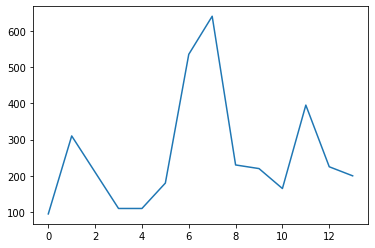

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.1600 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.1600 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.1600 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.1600 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.1600 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 0.1599 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.1599 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.1599 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.1599 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.1598 - acc: 0.9375
Epoch 11/32
128/128 [========

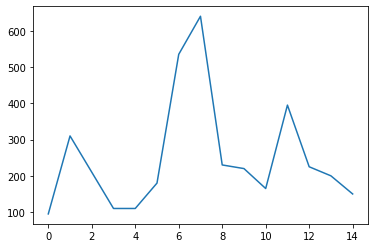

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.1288 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.1288 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1288 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.1288 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.1287 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 583us/step - loss: 0.1287 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 578us/step - loss: 0.1287 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.1287 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.1286 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.1286 - acc: 0.9141
Epoch 11/32
128/128 [========

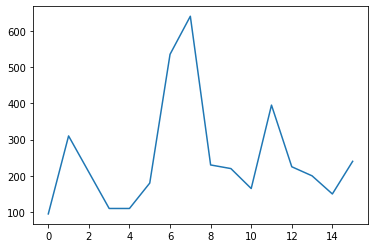

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 1.3289 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.3251 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 1.3187 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 1.3111 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 580us/step - loss: 1.3038 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 582us/step - loss: 1.2977 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.2931 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 1.2902 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.2884 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 1.2874 - acc: 0.8438
Epoch 11/32
128/128 [========

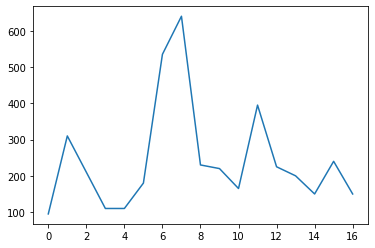

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.0320 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0318 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.0313 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.0307 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.0303 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 579us/step - loss: 0.0299 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.0297 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.0296 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.0296 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 0.0295 - acc: 0.9062
Epoch 11/32
128/128 [========

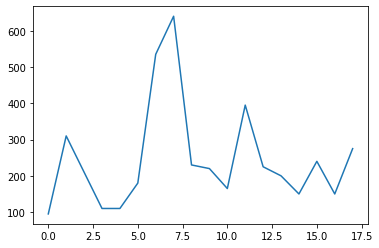

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.1817 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 1.1731 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 1.1572 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 1.1415 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 1.1341 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.1328 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 1.1333 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 1.1340 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 623us/step - loss: 1.1343 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 1.1341 - acc: 0.8281
Epoch 11/32
128/128 [========

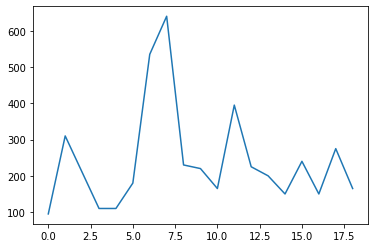

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.0349 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0347 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.0343 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.0339 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.0334 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.0330 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.0326 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 0.0324 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.0321 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.0319 - acc: 0.8047
Epoch 11/32
128/128 [========

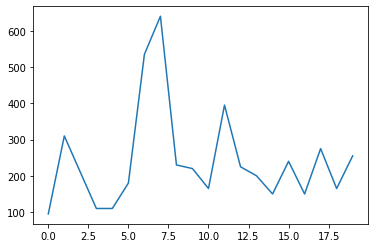

We are in the epoc:  12 Epsilon:  0.56880009227646
Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 1.3900 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 1.3884 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 569us/step - loss: 1.3857 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 575us/step - loss: 1.3821 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.3784 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 579us/step - loss: 1.3752 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.3733 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 1.3722 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 583us/step - loss: 1.3718 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss:

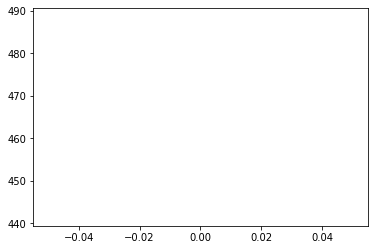

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 1.2174 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 1.2133 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.2077 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.2024 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 1.1985 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.1962 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 1.1950 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 619us/step - loss: 1.1944 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 1.1941 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 1.1941 - acc: 0.9375
Epoch 11/32
128/128 [========

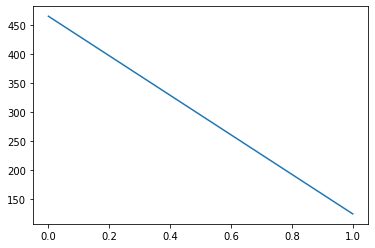

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.3893 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.3876 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.3846 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.3807 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.3761 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.3718 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.3686 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.3667 - acc: 0.7188
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.3656 - acc: 0.7031
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.3649 - acc: 0.7109
Epoch 11/32
128/128 [========

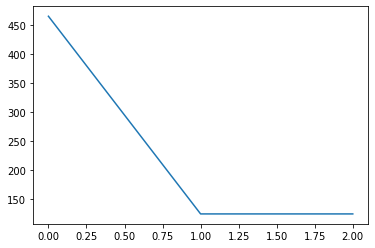

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.2802 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.2788 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.2769 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.2745 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.2719 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.2688 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.2647 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.2596 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.2549 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.2523 - acc: 0.8750
Epoch 11/32
128/128 [========

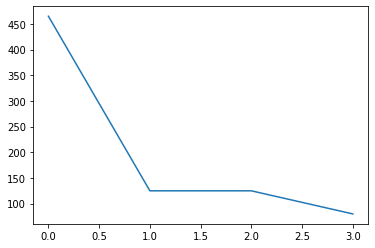

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0638 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0636 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0631 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0627 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0623 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.0620 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0618 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.0616 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.0615 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0613 - acc: 0.8984
Epoch 11/32
128/128 [========

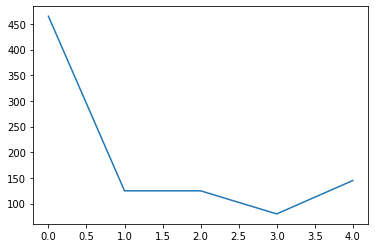

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.1300 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.1298 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.1295 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.1292 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.1289 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.1286 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.1284 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.1282 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.1281 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.1279 - acc: 0.8750
Epoch 11/32
128/128 [========

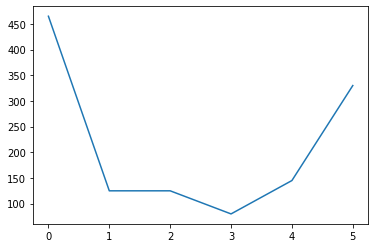

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.5209 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.5186 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 614us/step - loss: 0.5147 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.5098 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.5052 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.5020 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.5004 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.4997 - acc: 0.7188
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.4992 - acc: 0.7109
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.4984 - acc: 0.7266
Epoch 11/32
128/128 [========

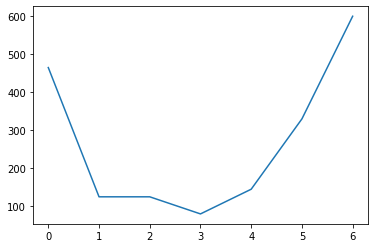

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.8783 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.8756 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.8718 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.8683 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.8655 - acc: 0.7422
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.8637 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.8627 - acc: 0.7266
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.8619 - acc: 0.7188
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.8610 - acc: 0.7188
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.8599 - acc: 0.7500
Epoch 11/32
128/128 [========

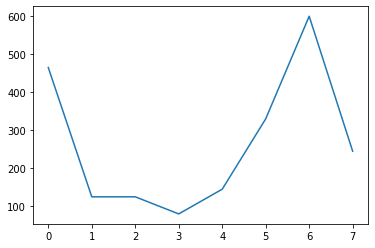

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.9692 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.9687 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.9679 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.9671 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.9665 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.9661 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.9657 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.9654 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 578us/step - loss: 0.9651 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 583us/step - loss: 0.9648 - acc: 0.8984
Epoch 11/32
128/128 [========

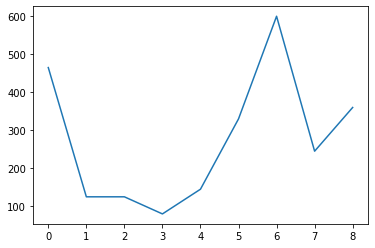

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.9973 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.9969 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 580us/step - loss: 0.9965 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 620us/step - loss: 0.9960 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.9956 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.9953 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.9950 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.9948 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.9946 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.9944 - acc: 0.8672
Epoch 11/32
128/128 [========

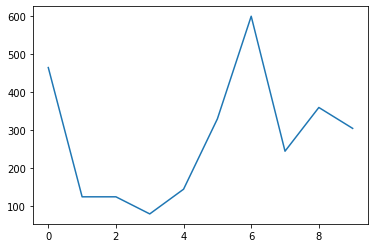

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 1.1491 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 1.1478 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.1467 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.1462 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 1.1460 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.1460 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 1.1460 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 1.1459 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.1459 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 1.1458 - acc: 0.9453
Epoch 11/32
128/128 [========

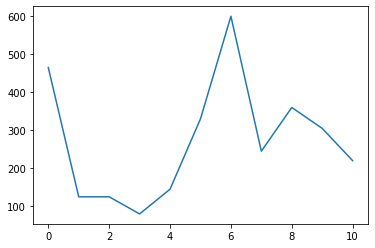

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.3555 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.3552 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.3545 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.3536 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.3527 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.3518 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.3510 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.3504 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.3500 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.3496 - acc: 0.8203
Epoch 11/32
128/128 [========

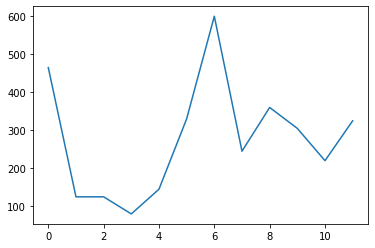

Epoch 1/32
128/128 [==============================] - 0s 569us/step - loss: 0.8403 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.8358 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.8302 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 0.8257 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.8229 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.8214 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.8208 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 582us/step - loss: 0.8205 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.8203 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.8201 - acc: 0.8906
Epoch 11/32
128/128 [========

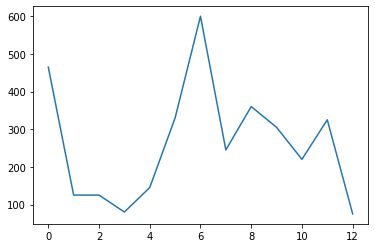

Epoch 1/32
128/128 [==============================] - 0s 569us/step - loss: 0.8397 - acc: 0.9766
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 0.8394 - acc: 0.9766
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.8391 - acc: 0.9766
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.8389 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.8386 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 583us/step - loss: 0.8384 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 581us/step - loss: 0.8382 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 0.8380 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.8378 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.8376 - acc: 0.9375
Epoch 11/32
128/128 [========

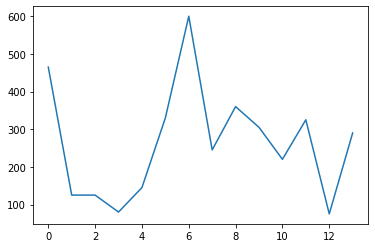

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 1.6698 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.6606 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 1.6536 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 1.6515 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 1.6515 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.6515 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 1.6507 - acc: 0.7891
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.6497 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 1.6489 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 621us/step - loss: 1.6486 - acc: 0.8750
Epoch 11/32
128/128 [========

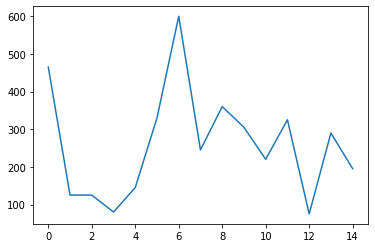

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.4199 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.4188 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.4174 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.4162 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.4153 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.4147 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.4142 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.4138 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.4134 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.4131 - acc: 0.8828
Epoch 11/32
128/128 [========

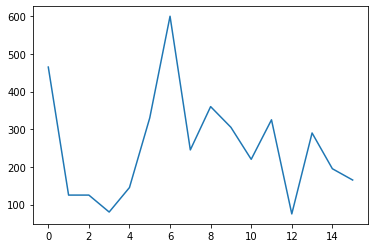

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.0043 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0042 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0042 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0041 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.0040 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0040 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.0039 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0039 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.0039 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.0038 - acc: 0.9375
Epoch 11/32
128/128 [========

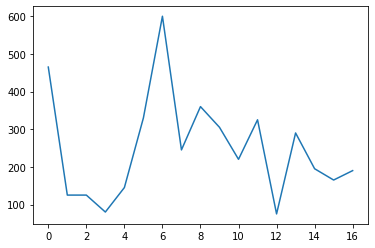

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.1616 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.1612 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.1605 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.1598 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.1591 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.1585 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.1581 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.1578 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.1576 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.1573 - acc: 0.8984
Epoch 11/32
128/128 [========

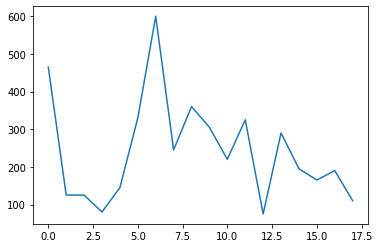

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.0423 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.0421 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 616us/step - loss: 0.0417 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.0411 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.0403 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0395 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 620us/step - loss: 0.0386 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0378 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.0372 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.0366 - acc: 0.8438
Epoch 11/32
128/128 [========

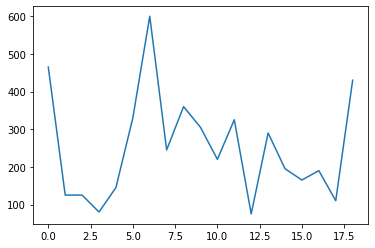

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.6168 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.6134 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.6083 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.6033 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.6002 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.5989 - acc: 0.7656
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.5985 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.5982 - acc: 0.7422
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.5977 - acc: 0.7500
Epoch 10/32
128/128 [==============================] - 0s 623us/step - loss: 0.5970 - acc: 0.8125
Epoch 11/32
128/128 [========

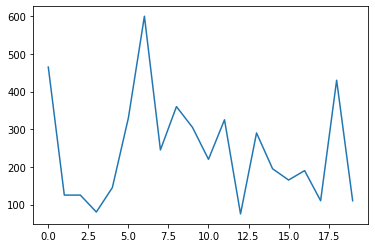

We are in the epoc:  13 Epsilon:  0.540360087662637
Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0021 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.0020 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.0020 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.0019 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.0019 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0018 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.0018 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0017 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.0016 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss

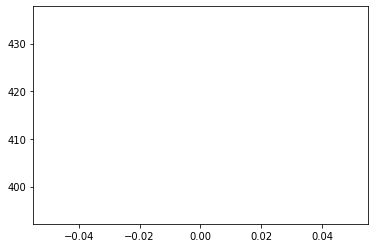

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.8417 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.8407 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.8399 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.8397 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.8398 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.8398 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.8399 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.8399 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 583us/step - loss: 0.8398 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.8397 - acc: 0.8516
Epoch 11/32
128/128 [========

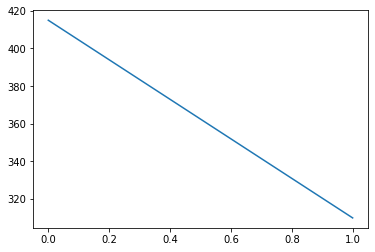

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.0660 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0658 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0654 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.0649 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 621us/step - loss: 0.0641 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 619us/step - loss: 0.0630 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.0618 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 0.0606 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0595 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.0588 - acc: 0.9062
Epoch 11/32
128/128 [========

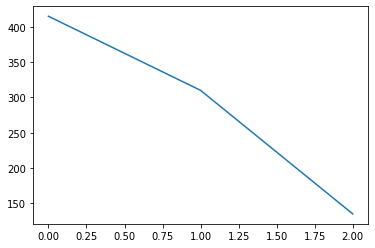

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0932 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.0925 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 616us/step - loss: 0.0914 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.0900 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.0886 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.0873 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.0863 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.0855 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0849 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.0844 - acc: 0.8359
Epoch 11/32
128/128 [========

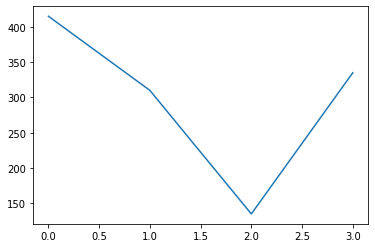

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.1722 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.1626 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.1517 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 1.1459 - acc: 0.7812
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 1.1448 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.1456 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 1.1459 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 1.1453 - acc: 0.7656
Epoch 9/32
128/128 [==============================] - 0s 585us/step - loss: 1.1441 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 1.1428 - acc: 0.8047
Epoch 11/32
128/128 [========

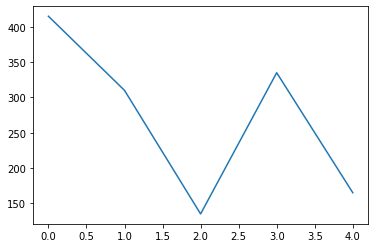

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.0384 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.0378 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.0370 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.0363 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 630us/step - loss: 0.0358 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.0356 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.0355 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.0354 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.0353 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 0.0352 - acc: 0.9062
Epoch 11/32
128/128 [========

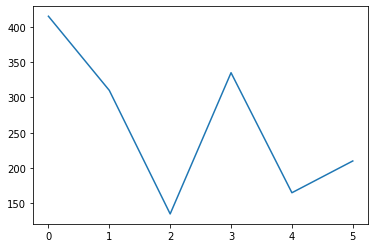

Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 1.3547 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 1.3488 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 1.3421 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 1.3367 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.3336 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 1.3325 - acc: 0.7891
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 1.3324 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 1.3323 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.3319 - acc: 0.7812
Epoch 11/32
128/128 [==============================] - 0s 586us/step - loss: 1.3312 - acc: 0.7812
Epoch 12/32
128/128 [=======

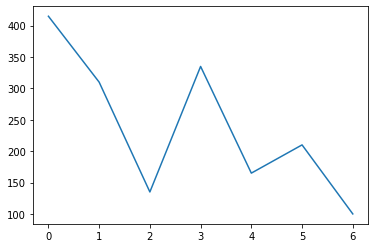

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.2899 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.2898 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.2897 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.2896 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.2895 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 580us/step - loss: 0.2894 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.2893 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.2893 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.2892 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.2892 - acc: 0.8906
Epoch 11/32
128/128 [========

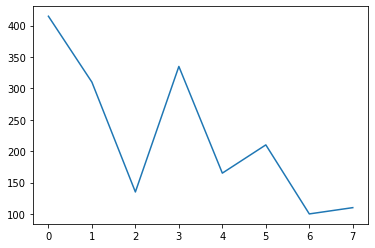

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.5953 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.5920 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.5854 - acc: 0.9766
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.5758 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 621us/step - loss: 0.5658 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.5578 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.5525 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.5496 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.5478 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.5465 - acc: 0.7500
Epoch 11/32
128/128 [========

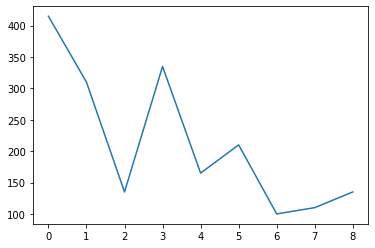

Epoch 1/32
128/128 [==============================] - 0s 601us/step - loss: 0.3578 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.3568 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 614us/step - loss: 0.3551 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.3528 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.3501 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.3473 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 624us/step - loss: 0.3445 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 620us/step - loss: 0.3421 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.3402 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.3389 - acc: 0.8047
Epoch 11/32
128/128 [========

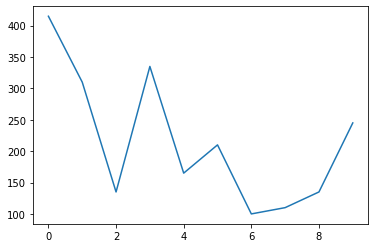

Epoch 1/32
128/128 [==============================] - 0s 560us/step - loss: 0.4539 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.4533 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.4524 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.4513 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.4503 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.4493 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.4485 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.4478 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.4473 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.4469 - acc: 0.8047
Epoch 11/32
128/128 [========

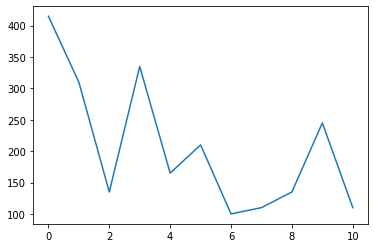

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.0266 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.0266 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.0266 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.0265 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0265 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 580us/step - loss: 0.0264 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 0.0264 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0263 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.0263 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 621us/step - loss: 0.0262 - acc: 0.8984
Epoch 11/32
128/128 [========

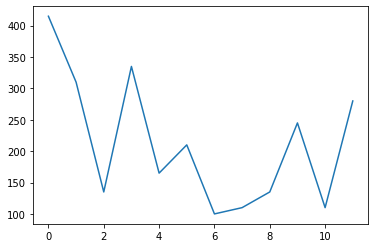

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 0.6697 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.6693 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.6689 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 0.6684 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.6680 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.6677 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.6675 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.6673 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.6672 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.6670 - acc: 0.8828
Epoch 11/32
128/128 [========

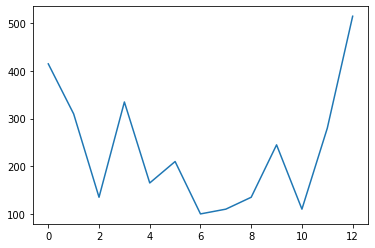

Epoch 1/32
128/128 [==============================] - 0s 611us/step - loss: 1.7811 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.7692 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.7526 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.7379 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.7288 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.7244 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.7226 - acc: 0.7656
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 1.7217 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.7207 - acc: 0.7500
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.7196 - acc: 0.7500
Epoch 11/32
128/128 [========

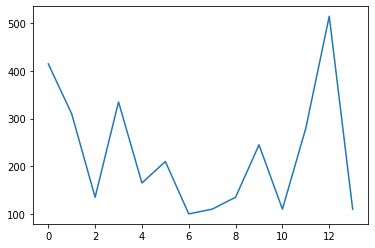

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.7115 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 1.7080 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 1.7025 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 1.6967 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 1.6917 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 1.6882 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.6861 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 1.6849 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 580us/step - loss: 1.6840 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 633us/step - loss: 1.6830 - acc: 0.7891
Epoch 11/32
128/128 [========

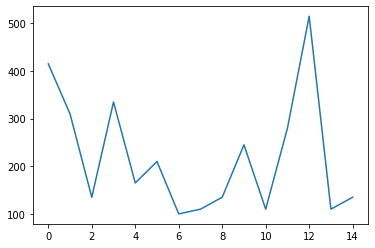

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 0.0060 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0059 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.0057 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.0056 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 577us/step - loss: 0.0055 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.0055 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 0.0054 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 0.0054 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 576us/step - loss: 0.0054 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0053 - acc: 0.8750
Epoch 11/32
128/128 [========

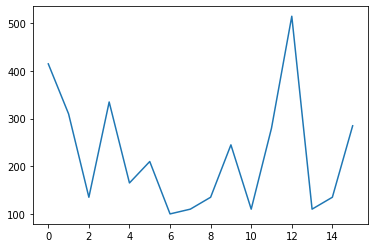

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.2597 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.2596 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.2596 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.2595 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.2595 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.2594 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 622us/step - loss: 0.2593 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.2593 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.2592 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.2591 - acc: 0.8672
Epoch 11/32
128/128 [========

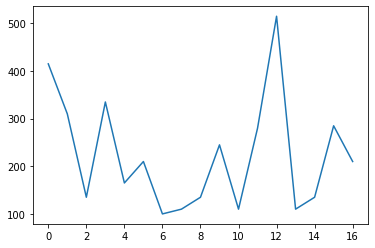

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.4155 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.4131 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.4099 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.4075 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 619us/step - loss: 0.4063 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.4060 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.4059 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.4056 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.4051 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.4044 - acc: 0.8672
Epoch 11/32
128/128 [========

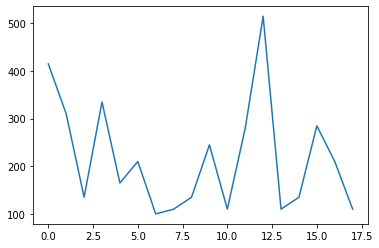

Epoch 1/32
128/128 [==============================] - 0s 560us/step - loss: 1.9759 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 576us/step - loss: 1.9758 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.9757 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.9756 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 1.9754 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.9752 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 1.9750 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.9748 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 1.9747 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.9746 - acc: 0.8984
Epoch 11/32
128/128 [========

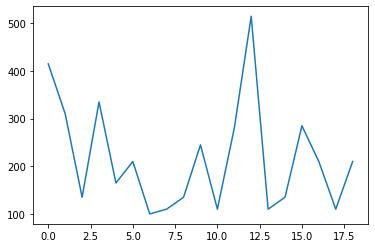

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.0337 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0337 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.0337 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0337 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0336 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0336 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.0335 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 627us/step - loss: 0.0335 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.0335 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.0334 - acc: 0.9297
Epoch 11/32
128/128 [========

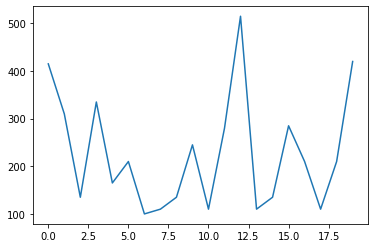

We are in the epoc:  14 Epsilon:  0.5133420832795051
Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.0026 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.0026 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.0025 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.0024 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.0024 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.0023 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.0023 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.0022 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.0022 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 600us/step - los

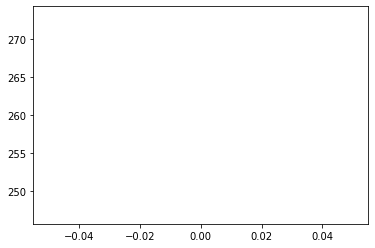

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.9372 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.9362 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.9347 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.9332 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.9321 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.9316 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 0.9315 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.9314 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.9310 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 583us/step - loss: 0.9304 - acc: 0.7891
Epoch 11/32
128/128 [========

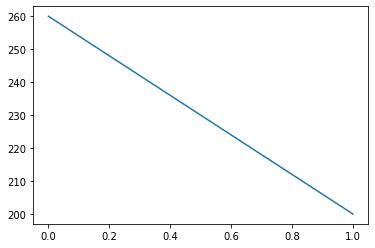

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.9704 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 1.9688 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.9668 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 1.9653 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 1.9646 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 1.9645 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 1.9645 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 1.9643 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 1.9638 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 1.9633 - acc: 0.8672
Epoch 11/32
128/128 [========

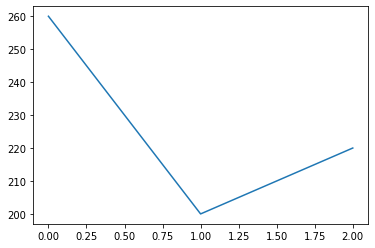

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.1925 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.1915 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.1897 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.1875 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.1854 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.1836 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.1824 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.1815 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.1809 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.1802 - acc: 0.8125
Epoch 11/32
128/128 [========

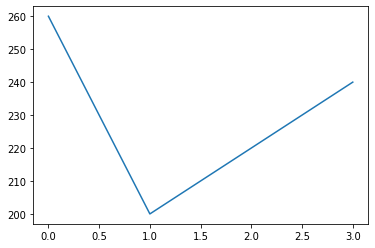

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0341 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.0340 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.0340 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.0340 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 0.0339 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.0339 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.0338 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0338 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.0337 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0336 - acc: 0.9297
Epoch 11/32
128/128 [========

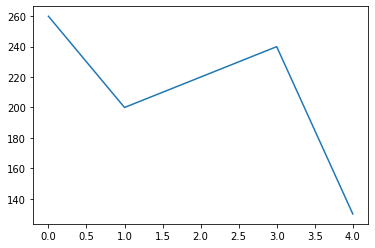

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0673 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0664 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0650 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.0632 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.0615 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 579us/step - loss: 0.0601 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.0590 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 582us/step - loss: 0.0583 - acc: 0.7266
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.0577 - acc: 0.7344
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.0573 - acc: 0.7266
Epoch 11/32
128/128 [========

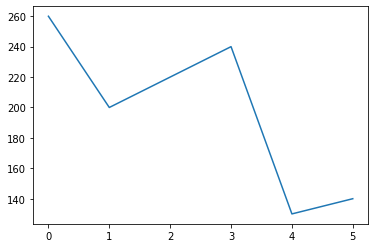

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 1.7787 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.7783 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.7776 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 1.7770 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.7765 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.7761 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 1.7759 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 1.7757 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.7755 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.7754 - acc: 0.9141
Epoch 11/32
128/128 [========

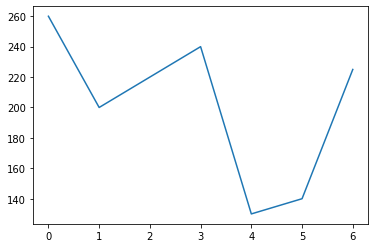

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.5639 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.5609 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.5575 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 1.5558 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 1.5555 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.5556 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 1.5554 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 1.5548 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 1.5539 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 1.5530 - acc: 0.7734
Epoch 11/32
128/128 [========

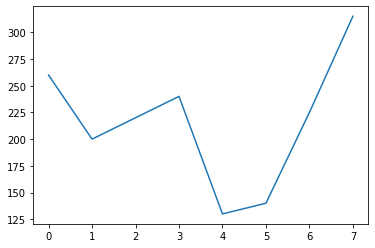

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 1.0372 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.0371 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.0370 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 1.0369 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 1.0368 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.0367 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 1.0366 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 1.0365 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 1.0363 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 1.0362 - acc: 0.8359
Epoch 11/32
128/128 [========

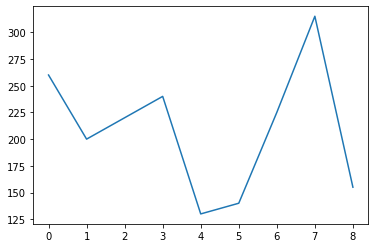

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.4170 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.4168 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.4167 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.4164 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.4163 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.4162 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.4161 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.4160 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.4159 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.4159 - acc: 0.8906
Epoch 11/32
128/128 [========

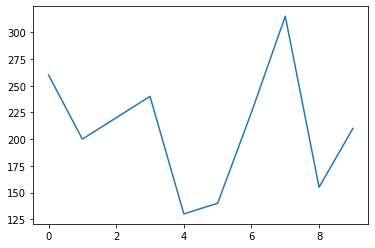

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.0043 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.0043 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0042 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.0041 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.0041 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.0040 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.0039 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0039 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.0038 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.0038 - acc: 0.8828
Epoch 11/32
128/128 [========

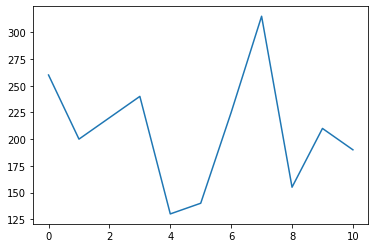

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 1.2058 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.1981 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 1.1817 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 1.1619 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 1.1518 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.1502 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.1512 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.1523 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.1529 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.1530 - acc: 0.7344
Epoch 11/32
128/128 [========

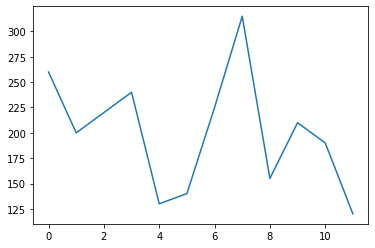

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.9355 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.9355 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.9354 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.9354 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.9354 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.9354 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.9353 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.9353 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.9353 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.9352 - acc: 0.8516
Epoch 11/32
128/128 [========

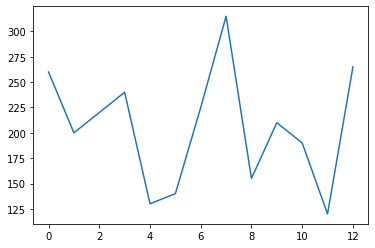

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.1944 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.1936 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.1923 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.1904 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 618us/step - loss: 0.1883 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.1859 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 581us/step - loss: 0.1836 - acc: 0.7734
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.1816 - acc: 0.7578
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 0.1798 - acc: 0.7500
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.1783 - acc: 0.7422
Epoch 11/32
128/128 [========

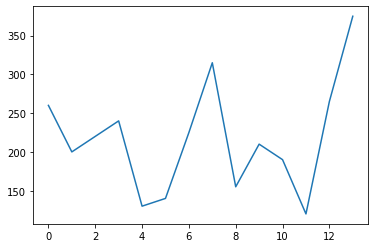

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.0051 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 0.0050 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 585us/step - loss: 0.0049 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 617us/step - loss: 0.0049 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.0048 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.0048 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0047 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.0046 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.0046 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0045 - acc: 0.8750
Epoch 11/32
128/128 [========

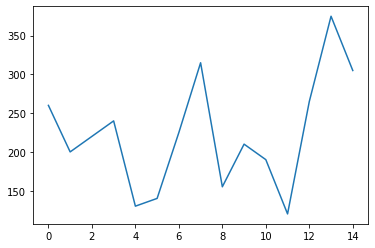

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.0328 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0327 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.0326 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.0324 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.0322 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0321 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.0319 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 0.0318 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 582us/step - loss: 0.0317 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.0316 - acc: 0.9062
Epoch 11/32
128/128 [========

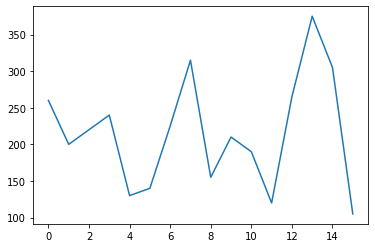

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.2910 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.2909 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.2909 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.2908 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 581us/step - loss: 0.2907 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.2906 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.2905 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.2904 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.2903 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.2902 - acc: 0.8828
Epoch 11/32
128/128 [========

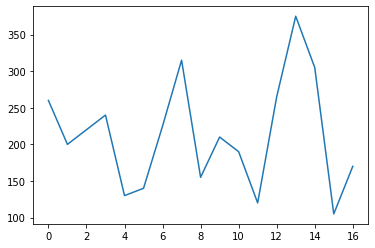

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.0021 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.0020 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.0020 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.0019 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0018 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.0017 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.0017 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.0016 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.0015 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.0015 - acc: 0.9297
Epoch 11/32
128/128 [========

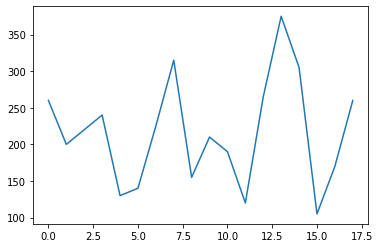

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 0.0014 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0014 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.0014 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0014 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0013 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.0013 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0013 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.0012 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.0012 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0012 - acc: 0.8672
Epoch 11/32
128/128 [========

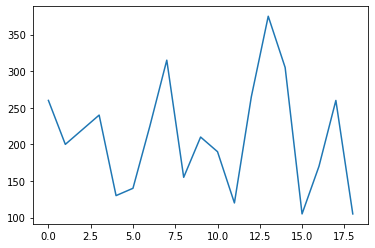

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.1604 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.1597 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1585 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.1568 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.1548 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.1528 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.1507 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.1488 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 0.1473 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 0.1460 - acc: 0.7734
Epoch 11/32
128/128 [========

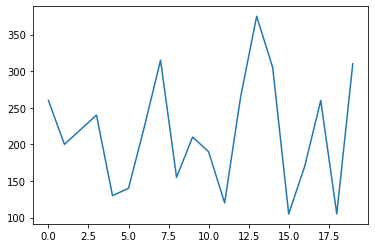

We are in the epoc:  15 Epsilon:  0.48767497911552987
Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.1209 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.1202 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.1195 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.1188 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.1184 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.1182 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.1181 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.1180 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.1180 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 602us/step - lo

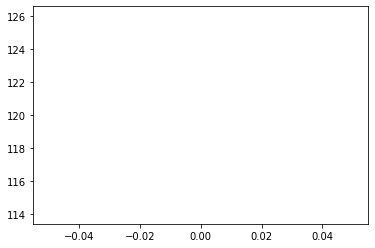

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.4128 - acc: 0.7734
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.4120 - acc: 0.7734
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.4106 - acc: 0.7656
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.4087 - acc: 0.7500
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.4067 - acc: 0.7344
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.4048 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.4033 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.4022 - acc: 0.7031
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.4016 - acc: 0.6562
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.4013 - acc: 0.6562
Epoch 11/32
128/128 [========

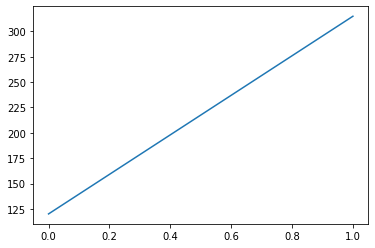

Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 2.5439 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 2.5325 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 2.5194 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 2.5067 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 2.4966 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 2.4901 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 2.4866 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 2.4850 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 2.4843 - acc: 0.7812
Epoch 11/32
128/128 [==============================] - 0s 585us/step - loss: 2.4838 - acc: 0.7656
Epoch 12/32
128/128 [=======

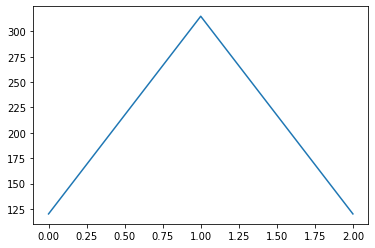

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.0031 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0030 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0030 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.0029 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0029 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.0028 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.0028 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0027 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0026 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.0025 - acc: 0.8359
Epoch 11/32
128/128 [========

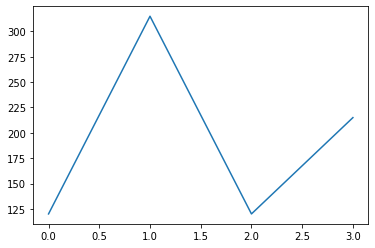

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 1.0703 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 581us/step - loss: 1.0685 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 1.0652 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 1.0607 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 1.0552 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.0494 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.0444 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 616us/step - loss: 1.0410 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.0390 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.0381 - acc: 0.8203
Epoch 11/32
128/128 [========

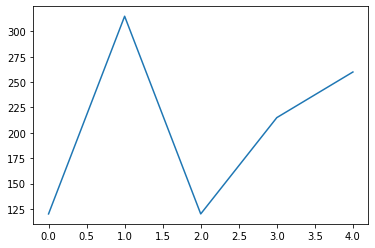

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 0.0017 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.0016 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.0016 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.0016 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.0015 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 620us/step - loss: 0.0014 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.0014 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0013 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.0012 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.0012 - acc: 0.9297
Epoch 11/32
128/128 [========

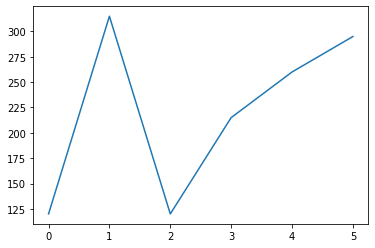

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.9701 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 1.9582 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.9407 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.9228 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 1.9092 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 1.9005 - acc: 0.7422
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 1.8960 - acc: 0.7266
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 1.8939 - acc: 0.7266
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 1.8929 - acc: 0.7500
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.8923 - acc: 0.7656
Epoch 11/32
128/128 [========

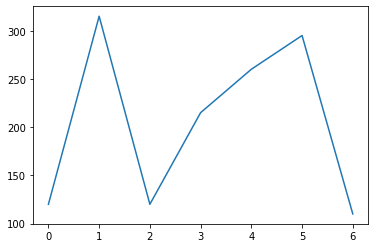

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0670 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.0666 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.0658 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0650 - acc: 0.7891
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0642 - acc: 0.7422
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.0634 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 0.0628 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0623 - acc: 0.7422
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 0.0620 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.0616 - acc: 0.7734
Epoch 11/32
128/128 [========

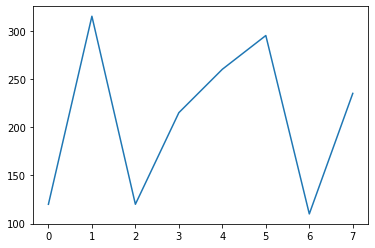

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.5863 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.5843 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 580us/step - loss: 0.5806 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 581us/step - loss: 0.5758 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.5711 - acc: 0.7578
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.5680 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.5666 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.5662 - acc: 0.7422
Epoch 9/32
128/128 [==============================] - 0s 585us/step - loss: 0.5659 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.5656 - acc: 0.7188
Epoch 11/32
128/128 [========

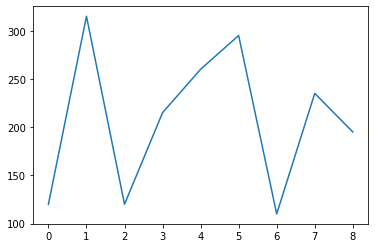

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.4529 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.4512 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 615us/step - loss: 0.4488 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.4464 - acc: 0.7812
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.4445 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.4433 - acc: 0.7266
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.4425 - acc: 0.7109
Epoch 8/32
128/128 [==============================] - 0s 578us/step - loss: 0.4419 - acc: 0.7031
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.4415 - acc: 0.7109
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.4410 - acc: 0.7500
Epoch 11/32
128/128 [========

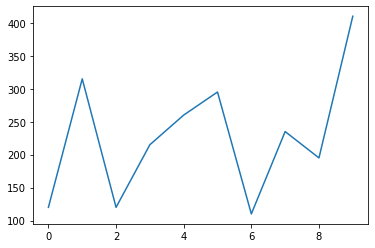

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 1.2081 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 1.2054 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 1.1988 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.1860 - acc: 0.7578
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 1.1685 - acc: 0.7188
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.1574 - acc: 0.6875
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.1555 - acc: 0.6641
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 1.1559 - acc: 0.6562
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 1.1555 - acc: 0.6719
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.1545 - acc: 0.6875
Epoch 11/32
128/128 [========

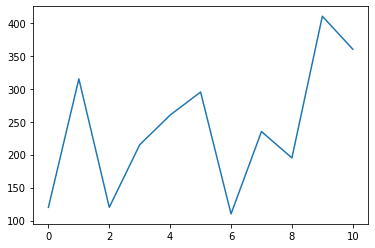

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.5211 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.5211 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.5210 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 0.5210 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.5210 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.5210 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.5209 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.5208 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.5208 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.5207 - acc: 0.9062
Epoch 11/32
128/128 [========

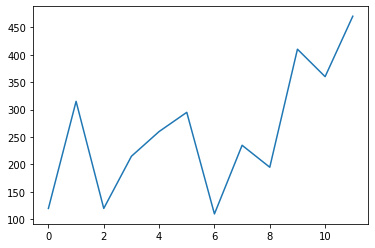

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.1973 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.1883 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 1.1754 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 1.1633 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 1.1544 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.1488 - acc: 0.7031
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 1.1457 - acc: 0.6953
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 1.1440 - acc: 0.6953
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 1.1431 - acc: 0.6953
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.1423 - acc: 0.6953
Epoch 11/32
128/128 [========

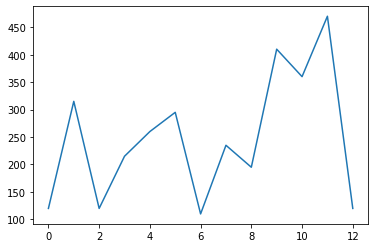

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.0065 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0065 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0064 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 580us/step - loss: 0.0063 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0062 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0061 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.0060 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0059 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.0058 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.0057 - acc: 0.9062
Epoch 11/32
128/128 [========

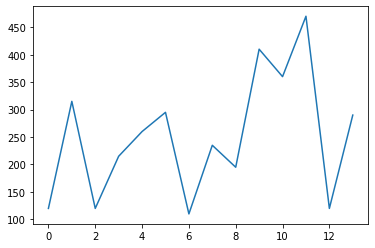

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 1.8704 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.8651 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 1.8560 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 1.8433 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.8281 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 1.8118 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 1.7970 - acc: 0.7656
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 1.7861 - acc: 0.7344
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 1.7796 - acc: 0.7266
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 1.7766 - acc: 0.7109
Epoch 11/32
128/128 [========

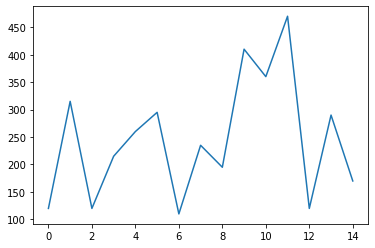

Epoch 1/32
128/128 [==============================] - 0s 570us/step - loss: 0.4560 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.4558 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.4554 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.4549 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 615us/step - loss: 0.4545 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.4541 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 0.4539 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 0.4536 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.4534 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.4531 - acc: 0.8828
Epoch 11/32
128/128 [========

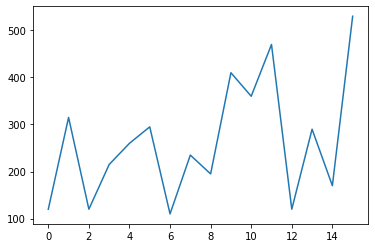

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.3689 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 1.3641 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 580us/step - loss: 1.3581 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.3533 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 1.3502 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 1.3479 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 1.3450 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 1.3401 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 625us/step - loss: 1.3317 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 1.3208 - acc: 0.8516
Epoch 11/32
128/128 [========

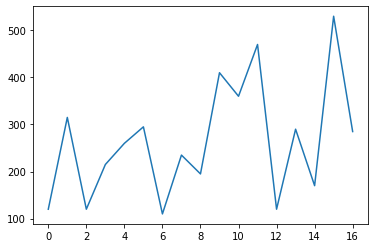

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.8014 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.7935 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.7881 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.7864 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.7863 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.7866 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.7868 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.7868 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.7867 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.7865 - acc: 0.8984
Epoch 11/32
128/128 [========

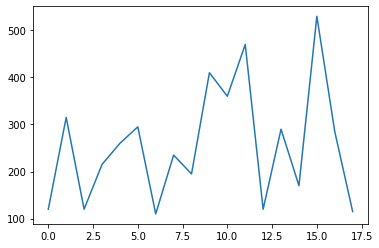

Epoch 1/32
128/128 [==============================] - 0s 566us/step - loss: 0.8381 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 0.8350 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.8318 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.8296 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.8285 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.8278 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.8273 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.8267 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.8261 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.8256 - acc: 0.8594
Epoch 11/32
128/128 [========

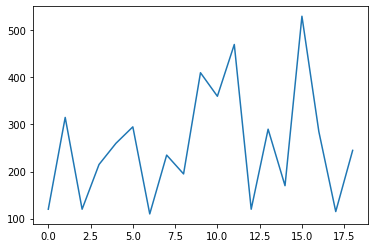

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 2.1483 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 2.1421 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 2.1359 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 2.1326 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 2.1314 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 2.1311 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 2.1311 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 625us/step - loss: 2.1310 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 2.1309 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 2.1307 - acc: 0.8516
Epoch 11/32
128/128 [========

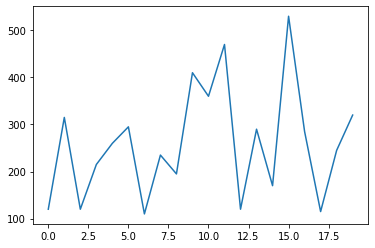

We are in the epoc:  16 Epsilon:  0.4632912301597534
Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.3520 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.3513 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.3501 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.3487 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 629us/step - loss: 0.3474 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.3464 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.3457 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 616us/step - loss: 0.3452 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.3449 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 603us/step - los

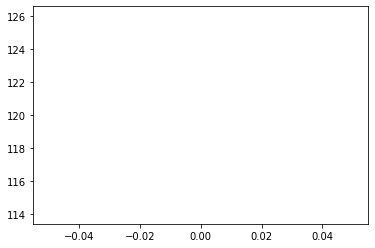

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 0.2916 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.2916 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.2915 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 622us/step - loss: 0.2914 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.2913 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.2912 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.2911 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.2911 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.2910 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.2910 - acc: 0.9219
Epoch 11/32
128/128 [========

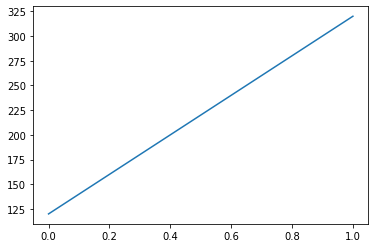

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 0.4387 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 583us/step - loss: 0.4359 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.4315 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 579us/step - loss: 0.4266 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.4219 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.4183 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.4159 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.4146 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.4138 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.4133 - acc: 0.8047
Epoch 11/32
128/128 [========

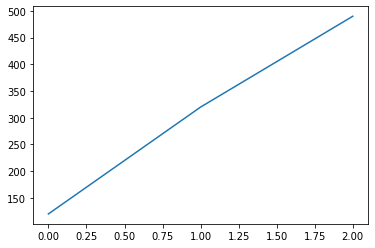

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.1317 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.1309 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.1297 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.1282 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.1266 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 0.1252 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.1243 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.1236 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.1232 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.1229 - acc: 0.8516
Epoch 11/32
128/128 [========

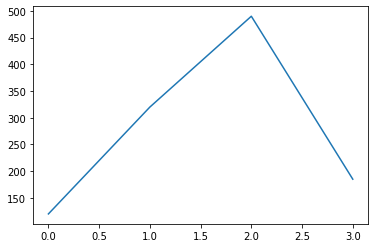

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 2.6202 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 2.6201 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 2.6198 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 2.6196 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 2.6193 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 2.6191 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 2.6189 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 2.6187 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 2.6186 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 2.6184 - acc: 0.9141
Epoch 11/32
128/128 [========

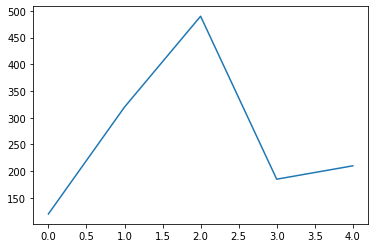

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 54.1666 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 54.1034 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 54.0621 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 54.0429 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 54.0332 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 54.0292 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 54.0280 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 54.0277 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 54.0272 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 54.0264 - acc: 0.8281
Epoch 11/32
128/128

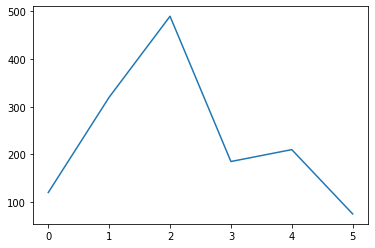

Epoch 1/32
128/128 [==============================] - 0s 565us/step - loss: 1.1670 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 619us/step - loss: 1.1669 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.1668 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 1.1666 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 1.1665 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 1.1665 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 1.1664 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.1663 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.1663 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 1.1662 - acc: 0.9141
Epoch 11/32
128/128 [========

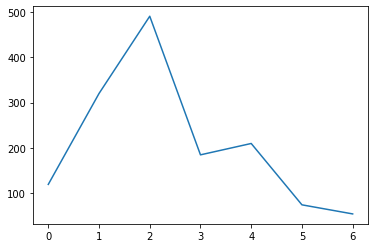

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.6817 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.6764 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.6688 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.6612 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.6560 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.6538 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 585us/step - loss: 0.6535 - acc: 0.7891
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.6535 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.6533 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.6527 - acc: 0.8047
Epoch 11/32
128/128 [========

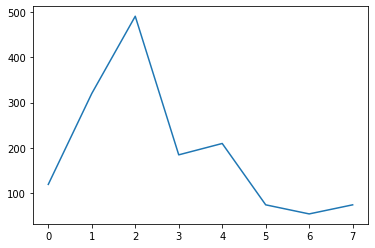

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0044 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0043 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0042 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0042 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.0041 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0040 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.0039 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0038 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.0037 - acc: 0.9609
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0036 - acc: 0.9688
Epoch 11/32
128/128 [========

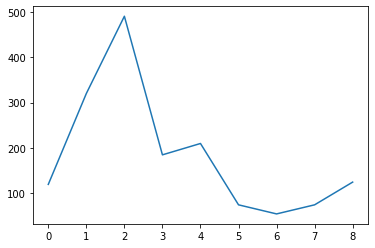

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 1.1352 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 1.1348 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 1.1342 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 1.1334 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 1.1325 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 1.1315 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 1.1305 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.1295 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 1.1285 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 1.1276 - acc: 0.8906
Epoch 11/32
128/128 [========

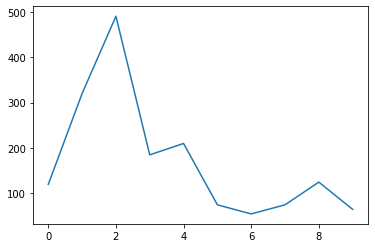

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.0033 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0033 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 627us/step - loss: 0.0033 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0033 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0032 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0031 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 619us/step - loss: 0.0031 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0030 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 623us/step - loss: 0.0029 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.0028 - acc: 0.9375
Epoch 11/32
128/128 [========

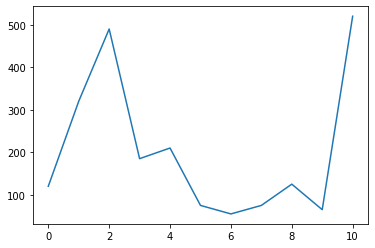

Epoch 1/32
128/128 [==============================] - 0s 561us/step - loss: 0.9418 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 584us/step - loss: 0.9417 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.9415 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.9413 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.9411 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 0.9409 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.9408 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.9406 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.9405 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.9404 - acc: 0.9062
Epoch 11/32
128/128 [========

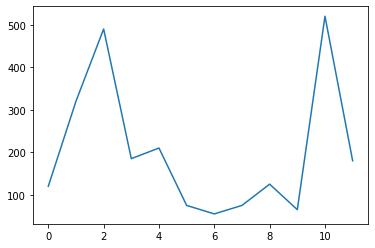

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 1.1832 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 1.1791 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 580us/step - loss: 1.1718 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 1.1618 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 1.1515 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 1.1440 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 1.1401 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 1.1387 - acc: 0.7344
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 1.1383 - acc: 0.7266
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 1.1381 - acc: 0.7266
Epoch 11/32
128/128 [========

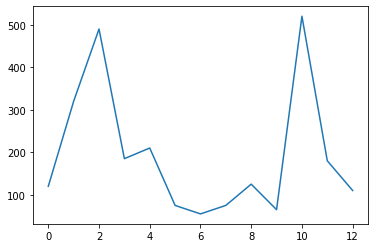

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.7941 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 0.7933 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 626us/step - loss: 0.7924 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.7917 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.7913 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.7912 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.7912 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.7913 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.7913 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.7913 - acc: 0.8750
Epoch 11/32
128/128 [========

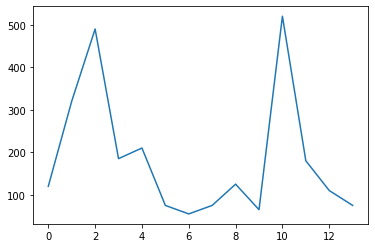

Epoch 1/32
128/128 [==============================] - 0s 561us/step - loss: 0.9332 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.9329 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.9326 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.9321 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 0.9317 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.9313 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.9310 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.9307 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 0.9305 - acc: 0.9609
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.9304 - acc: 0.9609
Epoch 11/32
128/128 [========

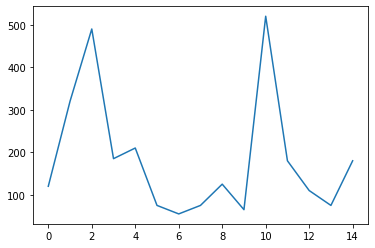

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0051 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0050 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.0050 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0049 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.0048 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0048 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.0047 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0046 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.0045 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0045 - acc: 0.9219
Epoch 11/32
128/128 [========

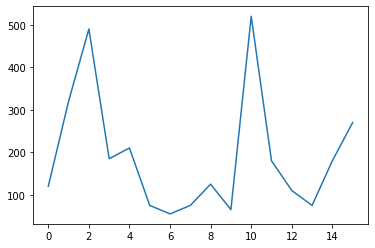

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.1307 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.1306 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.1306 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.1305 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.1304 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 0.1304 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.1303 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.1302 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.1302 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.1301 - acc: 0.9219
Epoch 11/32
128/128 [========

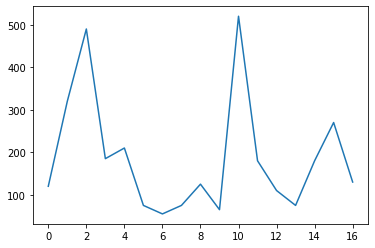

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.9709 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.9704 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.9696 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.9685 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.9674 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.9663 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.9653 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 0.9645 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.9640 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.9636 - acc: 0.9219
Epoch 11/32
128/128 [========

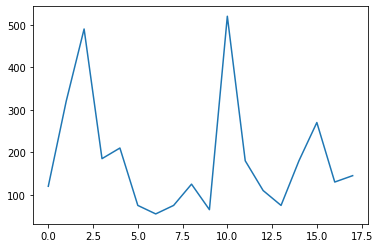

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.4165 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.4165 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.4164 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.4163 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.4162 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.4161 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.4160 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.4159 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.4158 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.4157 - acc: 0.8906
Epoch 11/32
128/128 [========

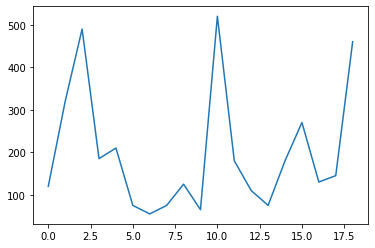

Epoch 1/32
128/128 [==============================] - 0s 564us/step - loss: 2.3939 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 2.3905 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 2.3846 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 2.3765 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 2.3670 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 2.3573 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 2.3490 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 2.3431 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 2.3397 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 2.3382 - acc: 0.8203
Epoch 11/32
128/128 [========

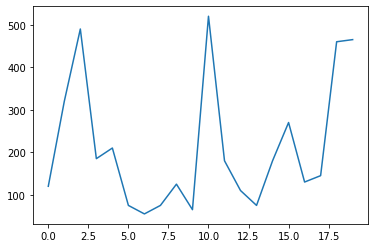

We are in the epoc:  17 Epsilon:  0.4401266686517657
Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.0329 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.0329 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.0329 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0329 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0329 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 586us/step - loss: 0.0328 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0328 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.0328 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 583us/step - loss: 0.0328 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 594us/step - los

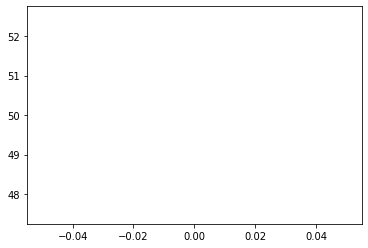

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.6797 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.6793 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.6788 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.6782 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.6778 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 586us/step - loss: 0.6774 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.6771 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.6769 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.6766 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.6763 - acc: 0.9453
Epoch 11/32
128/128 [========

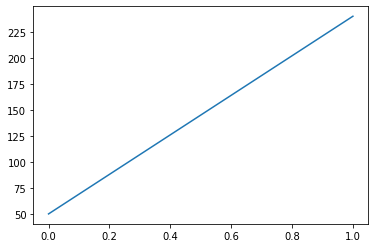

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.9307 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.9227 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.9144 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.9106 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.9101 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.9106 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.9112 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 580us/step - loss: 0.9115 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 585us/step - loss: 0.9116 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 580us/step - loss: 0.9115 - acc: 0.7969
Epoch 11/32
128/128 [========

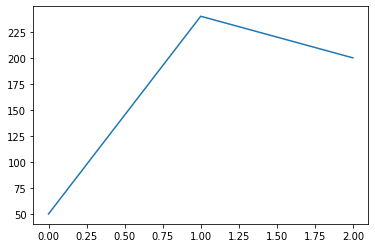

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.3245 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.3244 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.3244 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.3243 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.3242 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.3241 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 624us/step - loss: 0.3240 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.3239 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 620us/step - loss: 0.3238 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.3237 - acc: 0.8828
Epoch 11/32
128/128 [========

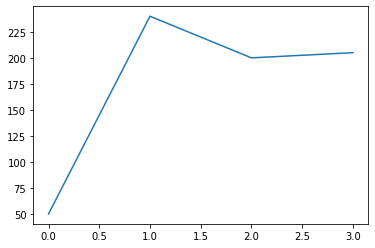

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.1309 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.1301 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.1286 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.1271 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.1256 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.1244 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.1235 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.1229 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.1224 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.1221 - acc: 0.8359
Epoch 11/32
128/128 [========

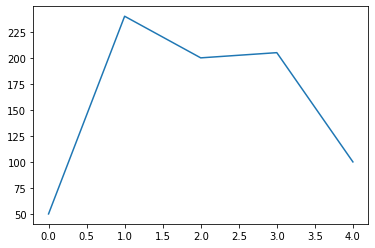

Epoch 1/32
128/128 [==============================] - 0s 608us/step - loss: 0.0382 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.0376 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0365 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0351 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.0338 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.0328 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0322 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.0319 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.0317 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 0.0316 - acc: 0.8828
Epoch 11/32
128/128 [========

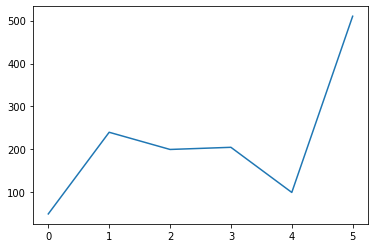

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.8454 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 585us/step - loss: 0.8394 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 582us/step - loss: 0.8323 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.8273 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.8248 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.8239 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.8238 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.8238 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.8239 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 618us/step - loss: 0.8240 - acc: 0.8281
Epoch 11/32
128/128 [========

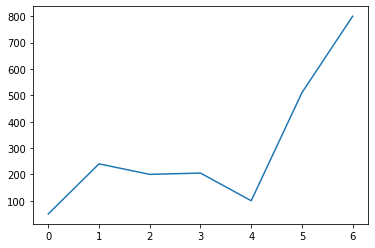

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.4216 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 0.4211 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.4202 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.4192 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.4182 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.4173 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.4165 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.4159 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.4154 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.4150 - acc: 0.8438
Epoch 11/32
128/128 [========

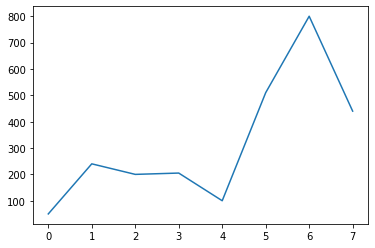

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.5531 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.5499 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.5450 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.5400 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.5365 - acc: 0.7891
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5347 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.5341 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.5341 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 616us/step - loss: 0.5340 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.5337 - acc: 0.7891
Epoch 11/32
128/128 [========

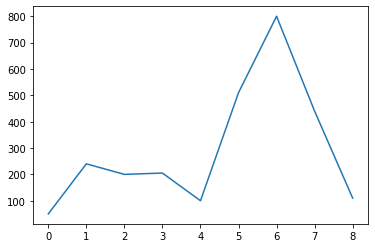

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.8752 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.8749 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.8744 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 579us/step - loss: 0.8736 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.8727 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.8718 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.8710 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.8705 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 0.8702 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.8700 - acc: 0.7969
Epoch 11/32
128/128 [========

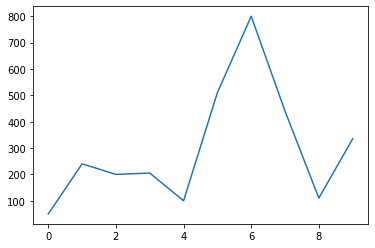

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.0033 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0032 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0032 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0031 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 578us/step - loss: 0.0030 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.0029 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.0028 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.0028 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.0027 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 582us/step - loss: 0.0026 - acc: 0.8906
Epoch 11/32
128/128 [========

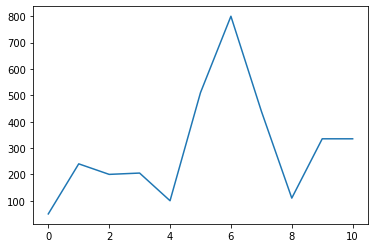

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.6430 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.6427 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 0.6423 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.6418 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.6413 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.6409 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.6405 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.6401 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.6399 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.6397 - acc: 0.8750
Epoch 11/32
128/128 [========

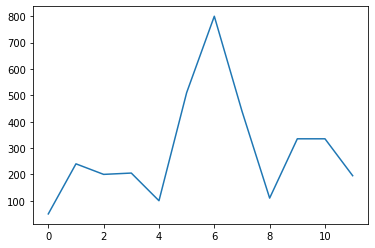

Epoch 1/32
128/128 [==============================] - 0s 568us/step - loss: 0.5739 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.5739 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.5738 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.5737 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.5736 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.5735 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.5733 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.5732 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.5731 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 617us/step - loss: 0.5729 - acc: 0.8828
Epoch 11/32
128/128 [========

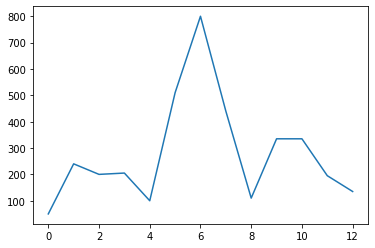

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 2.0334 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 2.0270 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 2.0163 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 2.0029 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 1.9893 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 1.9786 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 1.9725 - acc: 0.7344
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.9703 - acc: 0.7031
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 1.9700 - acc: 0.7031
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 1.9703 - acc: 0.6719
Epoch 11/32
128/128 [========

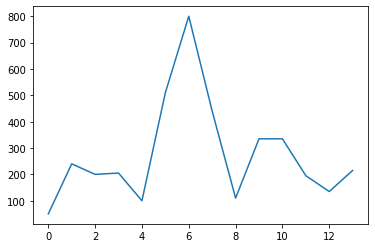

Epoch 1/32
128/128 [==============================] - 0s 573us/step - loss: 1.1115 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 1.1086 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 1.1032 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 1.0957 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.0873 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 1.0801 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 585us/step - loss: 1.0752 - acc: 0.7578
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 1.0725 - acc: 0.7344
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 1.0714 - acc: 0.7344
Epoch 10/32
128/128 [==============================] - 0s 617us/step - loss: 1.0709 - acc: 0.7266
Epoch 11/32
128/128 [========

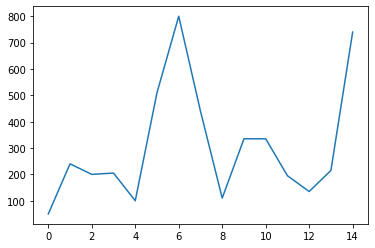

Epoch 1/32
128/128 [==============================] - 0s 568us/step - loss: 0.9525 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.9436 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.9293 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.9190 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.9155 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.9152 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.9156 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.9160 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.9161 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.9159 - acc: 0.7969
Epoch 11/32
128/128 [========

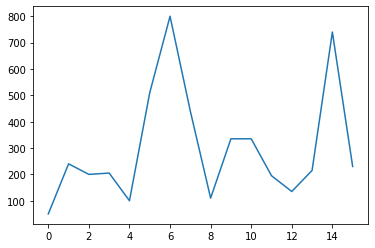

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.2925 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.2925 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.2925 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.2924 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.2923 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.2922 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.2921 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.2920 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.2920 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.2919 - acc: 0.9297
Epoch 11/32
128/128 [========

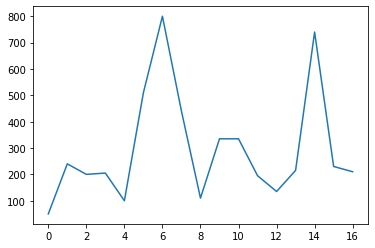

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 2.0278 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 2.0201 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 2.0084 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 1.9964 - acc: 0.7656
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.9873 - acc: 0.7109
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.9819 - acc: 0.6719
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.9798 - acc: 0.6484
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 1.9794 - acc: 0.6484
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 1.9798 - acc: 0.6484
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 1.9803 - acc: 0.6484
Epoch 11/32
128/128 [========

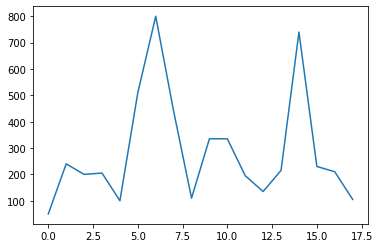

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.4887 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.4860 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.4829 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.4803 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.4786 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.4778 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.4774 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.4773 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 624us/step - loss: 0.4771 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.4768 - acc: 0.8359
Epoch 11/32
128/128 [========

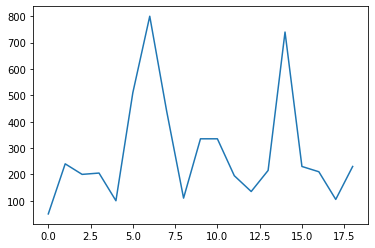

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.5766 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.5718 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.5656 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.5603 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 1.5572 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 1.5559 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 1.5556 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 1.5556 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.5554 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 1.5549 - acc: 0.8438
Epoch 11/32
128/128 [========

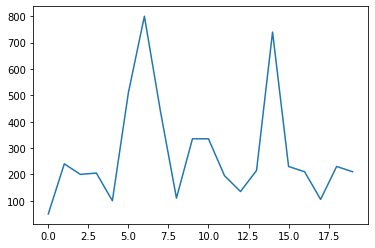

We are in the epoc:  18 Epsilon:  0.4181203352191774
Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.1301 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.1300 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.1300 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.1299 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.1299 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.1298 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.1297 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 0.1297 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 580us/step - loss: 0.1296 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 591us/step - los

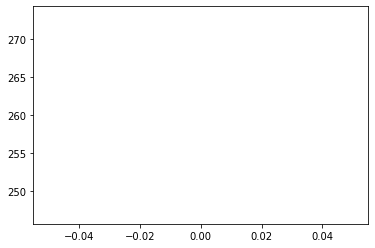

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.8477 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.8435 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.8383 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.8343 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 625us/step - loss: 0.8321 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.8311 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.8308 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.8305 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 0.8301 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.8297 - acc: 0.8984
Epoch 11/32
128/128 [========

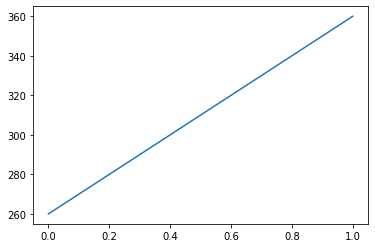

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0329 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0329 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 585us/step - loss: 0.0329 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.0328 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0328 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.0327 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.0327 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0326 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.0326 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.0325 - acc: 0.9375
Epoch 11/32
128/128 [========

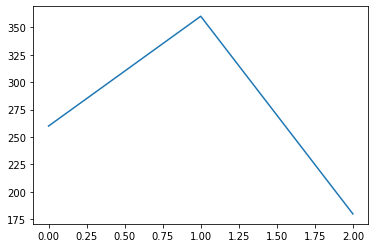

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0335 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 620us/step - loss: 0.0335 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.0335 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0334 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.0334 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0333 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.0332 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.0332 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.0331 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.0330 - acc: 0.9141
Epoch 11/32
128/128 [========

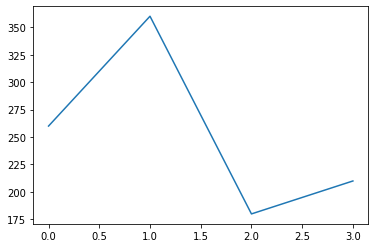

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.4949 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.4949 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.4948 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.4948 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.4947 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.4947 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 0.4946 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.4946 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 619us/step - loss: 0.4945 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.4944 - acc: 0.9297
Epoch 11/32
128/128 [========

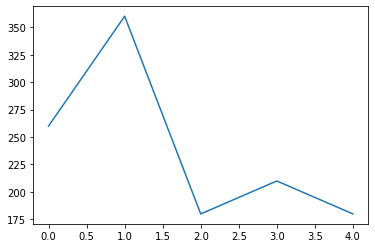

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.0020 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.0020 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 617us/step - loss: 0.0019 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0018 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0017 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0016 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.0016 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.0015 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0014 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.0013 - acc: 0.9219
Epoch 11/32
128/128 [========

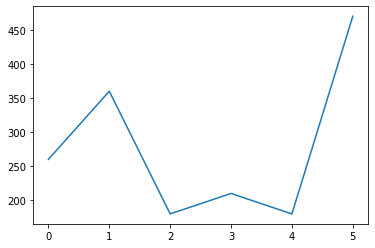

Epoch 1/32
128/128 [==============================] - 0s 619us/step - loss: 0.4495 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.4483 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.4464 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.4445 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.4427 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.4414 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.4405 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.4400 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.4396 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.4394 - acc: 0.9062
Epoch 11/32
128/128 [========

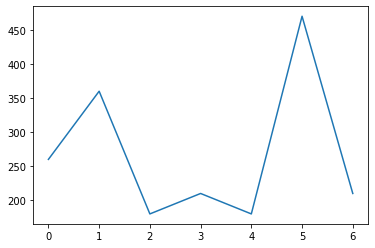

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.1955 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 1.1917 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.1863 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 1.1809 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 1.1768 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 1.1745 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.1736 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 1.1733 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 1.1732 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 1.1729 - acc: 0.8203
Epoch 11/32
128/128 [========

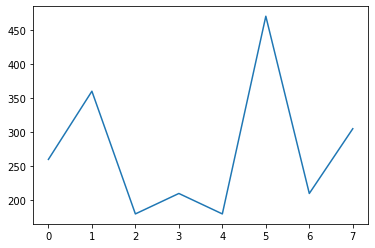

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.8090 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 583us/step - loss: 0.8090 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 585us/step - loss: 0.8089 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.8088 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.8087 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.8087 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.8086 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.8085 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.8084 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.8083 - acc: 0.9141
Epoch 11/32
128/128 [========

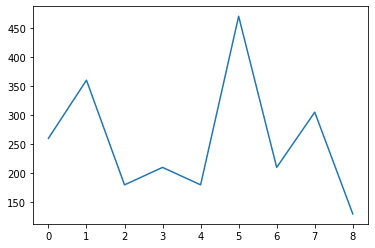

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.4181 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.4180 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.4180 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.4179 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.4178 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.4177 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.4176 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.4175 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.4174 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.4173 - acc: 0.8828
Epoch 11/32
128/128 [========

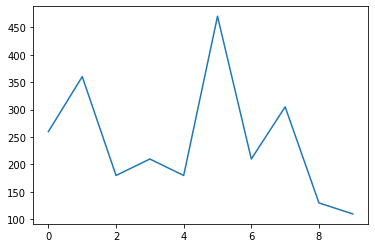

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0022 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0022 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.0021 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 623us/step - loss: 0.0020 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0020 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.0019 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 0.0018 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 616us/step - loss: 0.0017 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.0017 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.0016 - acc: 0.8984
Epoch 11/32
128/128 [========

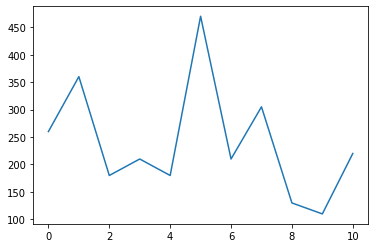

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.5239 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.5220 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.5189 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.5151 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.5113 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.5079 - acc: 0.7500
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 0.5055 - acc: 0.6953
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.5038 - acc: 0.6875
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.5027 - acc: 0.6641
Epoch 10/32
128/128 [==============================] - 0s 619us/step - loss: 0.5017 - acc: 0.6562
Epoch 11/32
128/128 [========

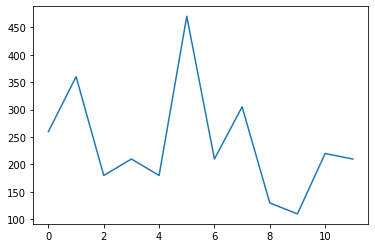

Epoch 1/32
128/128 [==============================] - 0s 614us/step - loss: 0.8109 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.8096 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.8084 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.8076 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.8073 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.8072 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.8071 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.8070 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.8069 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 0.8067 - acc: 0.8672
Epoch 11/32
128/128 [========

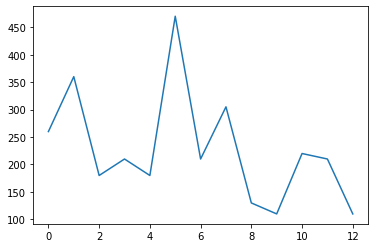

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 1.4081 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 1.4008 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 1.3911 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 1.3821 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 1.3759 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.3724 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 1.3708 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 1.3703 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 1.3702 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 1.3702 - acc: 0.8438
Epoch 11/32
128/128 [========

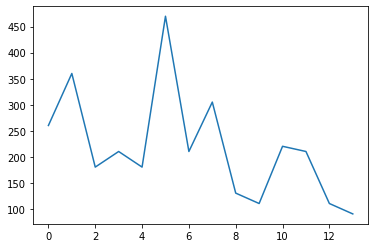

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.8188 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.8170 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.8144 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.8118 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 625us/step - loss: 0.8100 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.8090 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.8085 - acc: 0.7734
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.8081 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.8078 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.8074 - acc: 0.7891
Epoch 11/32
128/128 [========

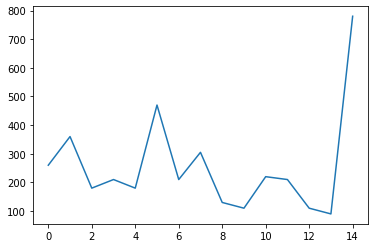

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 1.7085 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 1.7025 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 1.6942 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 1.6872 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 1.6832 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 1.6815 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 1.6809 - acc: 0.7656
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.6808 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 576us/step - loss: 1.6806 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 580us/step - loss: 1.6803 - acc: 0.7656
Epoch 11/32
128/128 [========

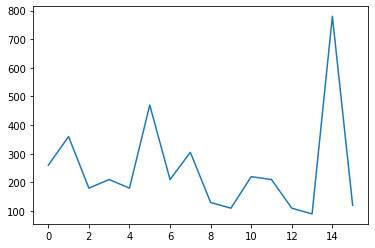

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.4509 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 1.4471 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 1.4429 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 1.4401 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 1.4389 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.4386 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 1.4386 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 579us/step - loss: 1.4387 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 1.4388 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 1.4387 - acc: 0.8594
Epoch 11/32
128/128 [========

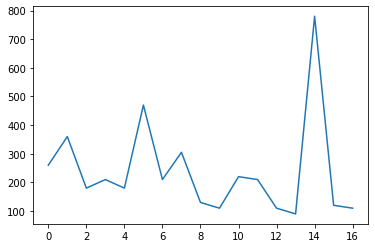

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.2929 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.2929 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.2927 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.2926 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 0.2924 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 583us/step - loss: 0.2922 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.2921 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.2920 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.2919 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.2918 - acc: 0.8906
Epoch 11/32
128/128 [========

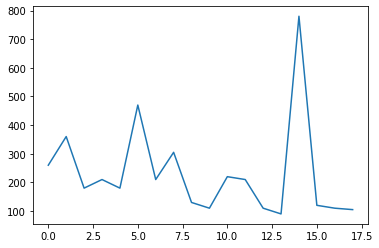

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 1.5129 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 585us/step - loss: 1.5069 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 1.4964 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 1.4833 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 1.4720 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 1.4650 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 1.4613 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 1.4595 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 1.4588 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 1.4584 - acc: 0.7969
Epoch 11/32
128/128 [========

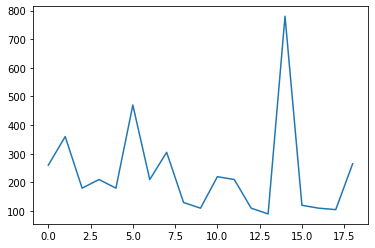

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0050 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.0049 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.0049 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.0048 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 0.0047 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 583us/step - loss: 0.0045 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.0044 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0043 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0042 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 0.0041 - acc: 0.9062
Epoch 11/32
128/128 [========

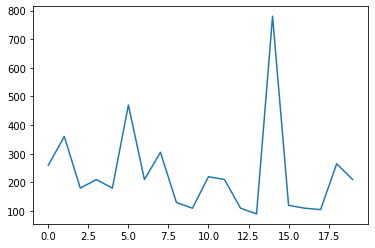

We are in the epoc:  19 Epsilon:  0.39721431845821853
Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.0968 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 1.0968 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 1.0968 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 1.0968 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.0967 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 1.0967 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 1.0966 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 1.0966 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.0966 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 599us/step - lo

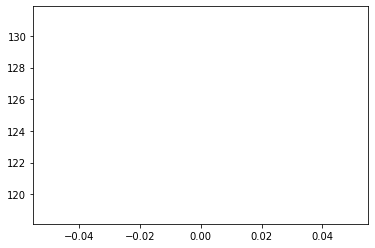

Epoch 1/32
128/128 [==============================] - 0s 613us/step - loss: 2.6388 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 2.6317 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 2.6207 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 2.6086 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 2.5987 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 2.5933 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 2.5914 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 2.5912 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 582us/step - loss: 2.5915 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 579us/step - loss: 2.5917 - acc: 0.8125
Epoch 11/32
128/128 [========

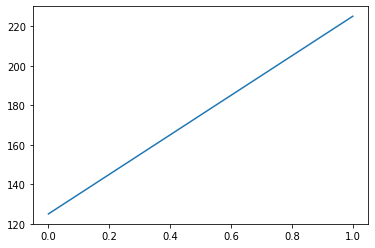

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.7966 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.7927 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 614us/step - loss: 0.7879 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.7841 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.7819 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.7808 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.7804 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.7803 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.7802 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.7802 - acc: 0.8750
Epoch 11/32
128/128 [========

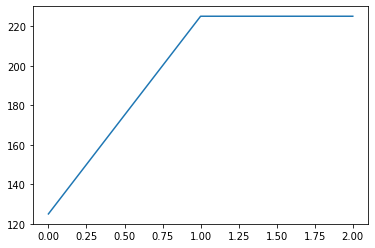

Epoch 1/32
128/128 [==============================] - 0s 601us/step - loss: 0.0022 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 580us/step - loss: 0.0022 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 620us/step - loss: 0.0022 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.0021 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.0020 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.0020 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.0019 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.0018 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 0.0018 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.0017 - acc: 0.8281
Epoch 11/32
128/128 [========

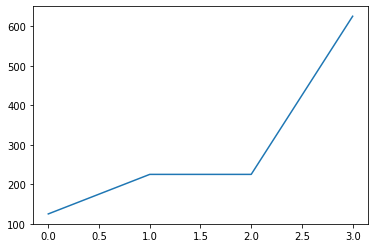

Epoch 1/32
128/128 [==============================] - 0s 605us/step - loss: 0.5194 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.5192 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.5190 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.5187 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.5184 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5183 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.5181 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.5180 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.5179 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.5179 - acc: 0.8750
Epoch 11/32
128/128 [========

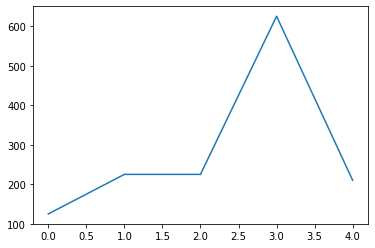

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.4198 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.4185 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.4169 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 618us/step - loss: 0.4154 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.4144 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.4136 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.4131 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.4128 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.4126 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.4124 - acc: 0.8203
Epoch 11/32
128/128 [========

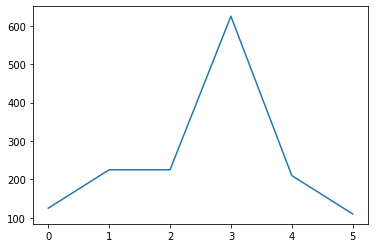

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 2.9046 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 2.8867 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 2.8606 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 2.8342 - acc: 0.7891
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 2.8141 - acc: 0.7578
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 2.8029 - acc: 0.7422
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 2.7979 - acc: 0.7188
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 2.7962 - acc: 0.7266
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 2.7959 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 2.7962 - acc: 0.7422
Epoch 11/32
128/128 [========

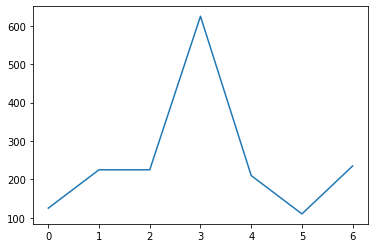

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 2.1341 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 2.1218 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 2.1056 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 2.0923 - acc: 0.7344
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 2.0854 - acc: 0.6797
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 2.0838 - acc: 0.6250
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 2.0840 - acc: 0.6094
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 2.0838 - acc: 0.6172
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 2.0825 - acc: 0.6328
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 2.0805 - acc: 0.6562
Epoch 11/32
128/128 [========

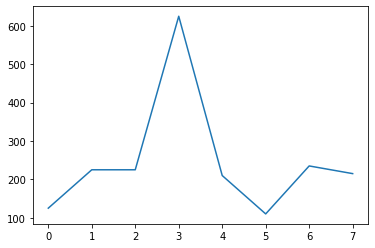

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.3060 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.3024 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.2993 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 0.2980 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.2977 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.2977 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.2976 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.2973 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 617us/step - loss: 0.2970 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.2967 - acc: 0.8516
Epoch 11/32
128/128 [========

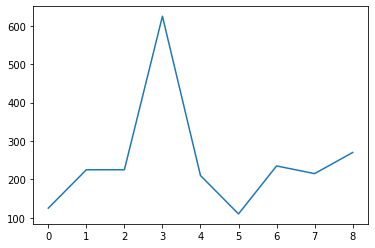

Epoch 1/32
128/128 [==============================] - 0s 570us/step - loss: 0.1315 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.1286 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.1254 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.1234 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.1227 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.1226 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 628us/step - loss: 0.1226 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.1227 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.1227 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.1226 - acc: 0.8281
Epoch 11/32
128/128 [========

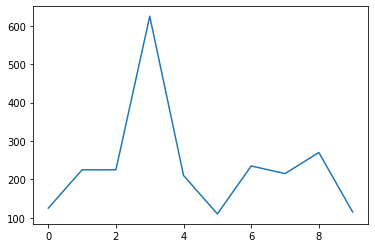

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.0029 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 0.0029 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0028 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0028 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0027 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0027 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.0026 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.0026 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.0025 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0025 - acc: 0.9141
Epoch 11/32
128/128 [========

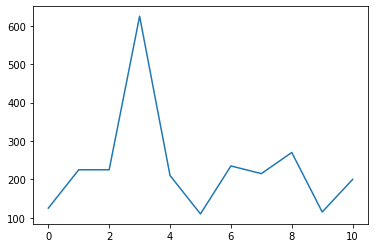

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.0062 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 584us/step - loss: 0.0062 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0062 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0061 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.0061 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.0060 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.0059 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.0059 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.0058 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.0057 - acc: 0.9297
Epoch 11/32
128/128 [========

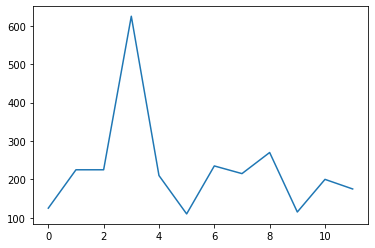

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.5487 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.5463 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.5432 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.5404 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.5385 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.5373 - acc: 0.7422
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.5367 - acc: 0.7734
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.5364 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.5363 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.5361 - acc: 0.7734
Epoch 11/32
128/128 [========

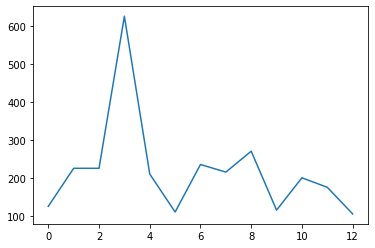

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.7516 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 580us/step - loss: 1.7453 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.7343 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 1.7202 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 1.7062 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.6946 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 1.6859 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 1.6796 - acc: 0.7188
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 1.6754 - acc: 0.6953
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 1.6728 - acc: 0.6953
Epoch 11/32
128/128 [========

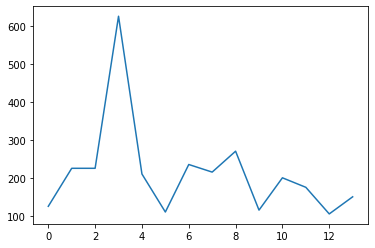

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.4273 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.4264 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 583us/step - loss: 0.4248 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 0.4227 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.4200 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.4170 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.4139 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.4111 - acc: 0.7578
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 0.4089 - acc: 0.7422
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.4074 - acc: 0.7109
Epoch 11/32
128/128 [========

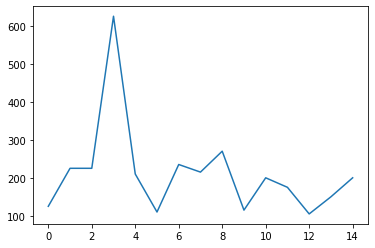

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.7367 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 1.7298 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.7202 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 1.7096 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.6999 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.6926 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 1.6882 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 1.6859 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 1.6848 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 1.6840 - acc: 0.8047
Epoch 11/32
128/128 [========

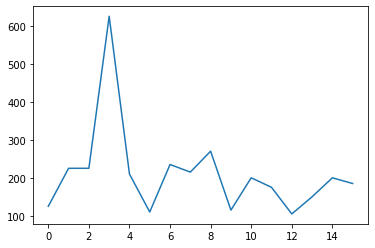

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0082 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.0081 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0080 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0078 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0077 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.0076 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.0075 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.0073 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.0072 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0071 - acc: 0.9297
Epoch 11/32
128/128 [========

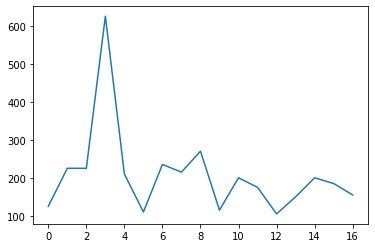

Epoch 1/32
128/128 [==============================] - 0s 567us/step - loss: 52.0566 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 52.0432 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 52.0361 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 52.0336 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 52.0325 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 52.0318 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 52.0311 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 52.0304 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 52.0297 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 52.0291 - acc: 0.8672
Epoch 11/32
128/128

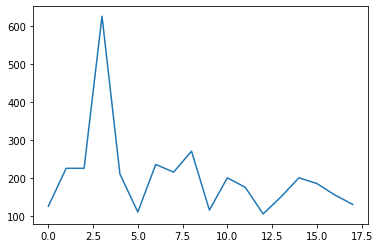

Epoch 1/32
128/128 [==============================] - 0s 565us/step - loss: 0.8141 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.8107 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.8048 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 585us/step - loss: 0.7978 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.7923 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.7892 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 581us/step - loss: 0.7882 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.7879 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.7875 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.7867 - acc: 0.7656
Epoch 11/32
128/128 [========

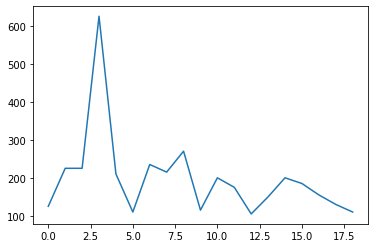

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.4345 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 618us/step - loss: 0.4296 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 613us/step - loss: 0.4230 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.4181 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.4159 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 0.4152 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 626us/step - loss: 0.4151 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.4150 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.4147 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 617us/step - loss: 0.4144 - acc: 0.7969
Epoch 11/32
128/128 [========

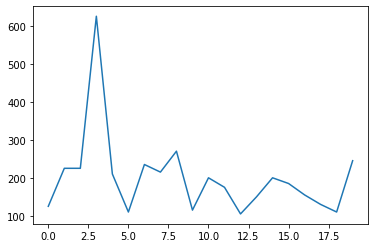

We are in the epoc:  20 Epsilon:  0.3773536025353076
Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.1610 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.1610 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.1609 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.1609 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.1609 - acc: 0.9688
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.1608 - acc: 0.9688
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.1608 - acc: 0.9688
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.1608 - acc: 0.9688
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.1607 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 612us/step - los

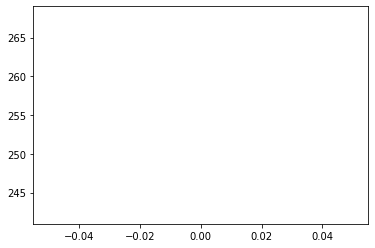

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.8597 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.8566 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 617us/step - loss: 0.8524 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.8486 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.8459 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.8443 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.8435 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.8430 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.8428 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.8426 - acc: 0.9297
Epoch 11/32
128/128 [========

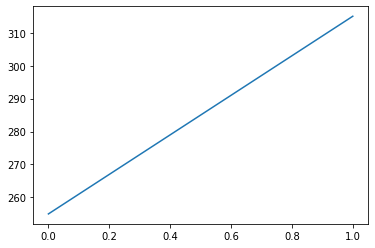

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.8405 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.8404 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.8404 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.8404 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.8403 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.8403 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 620us/step - loss: 0.8402 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.8402 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.8402 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.8401 - acc: 0.9297
Epoch 11/32
128/128 [========

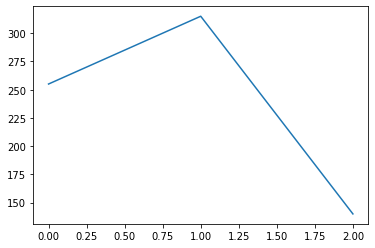

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 1.6725 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 581us/step - loss: 1.6674 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 1.6600 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 578us/step - loss: 1.6528 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 1.6473 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 629us/step - loss: 1.6439 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 627us/step - loss: 1.6421 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.6413 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.6410 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 1.6408 - acc: 0.7734
Epoch 11/32
128/128 [========

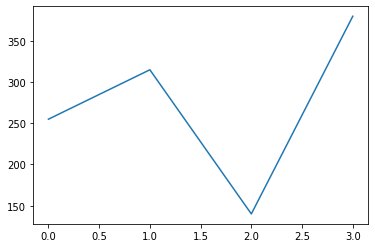

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.7433 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 584us/step - loss: 0.7415 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.7390 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.7366 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.7347 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.7334 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.7326 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.7320 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.7317 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.7314 - acc: 0.8516
Epoch 11/32
128/128 [========

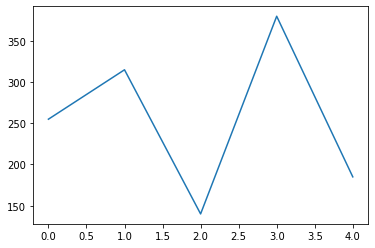

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.5947 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.5908 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.5852 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.5797 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.5754 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.5723 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.5703 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.5691 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.5682 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.5675 - acc: 0.8516
Epoch 11/32
128/128 [========

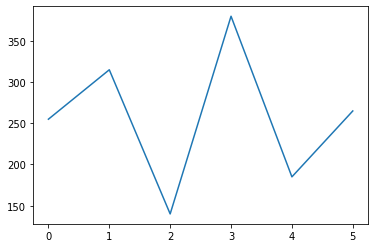

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.1336 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.1323 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.1300 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 619us/step - loss: 0.1272 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.1249 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.1233 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.1225 - acc: 0.7734
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.1221 - acc: 0.7656
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.1218 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 0.1214 - acc: 0.7656
Epoch 11/32
128/128 [========

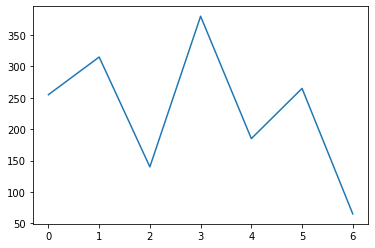

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.0061 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0060 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.0059 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.0058 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0057 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.0056 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.0055 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0053 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.0052 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.0051 - acc: 0.9453
Epoch 11/32
128/128 [========

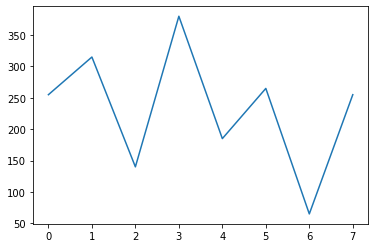

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.4542 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.4511 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.4458 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.4395 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.4342 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.4314 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.4304 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.4302 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 578us/step - loss: 0.4300 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.4294 - acc: 0.7969
Epoch 11/32
128/128 [========

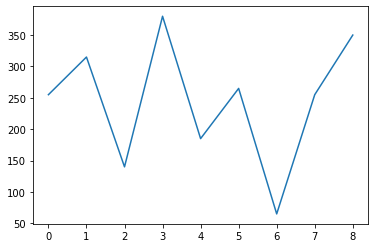

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.8024 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.8021 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.8017 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.8013 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.8009 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 577us/step - loss: 0.8005 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.8002 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 580us/step - loss: 0.8000 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 570us/step - loss: 0.7997 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 581us/step - loss: 0.7994 - acc: 0.9297
Epoch 11/32
128/128 [========

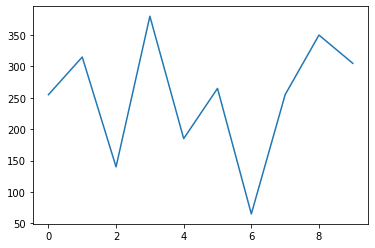

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 1.4274 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 1.4250 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.4217 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 1.4187 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 615us/step - loss: 1.4164 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 1.4149 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 617us/step - loss: 1.4142 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 1.4140 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.4139 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.4138 - acc: 0.8672
Epoch 11/32
128/128 [========

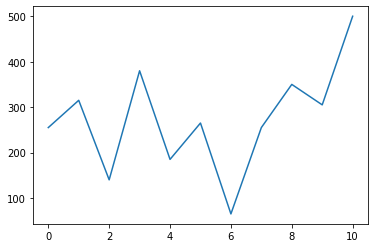

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.4446 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.4437 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 582us/step - loss: 0.4427 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.4420 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.4415 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.4412 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 617us/step - loss: 0.4409 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.4407 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.4406 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.4404 - acc: 0.8984
Epoch 11/32
128/128 [========

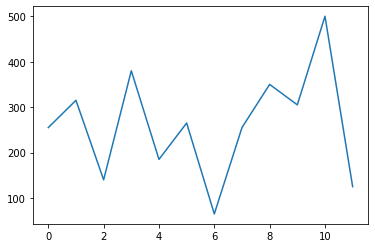

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 1.9852 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.9770 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 617us/step - loss: 1.9643 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.9526 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.9463 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.9444 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 1.9445 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 1.9451 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 1.9456 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 1.9457 - acc: 0.7891
Epoch 11/32
128/128 [========

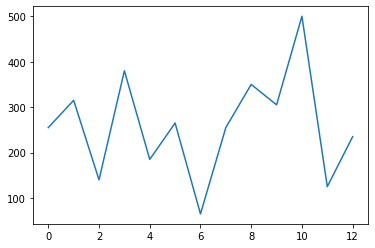

Epoch 1/32
128/128 [==============================] - 0s 567us/step - loss: 0.5186 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.5186 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.5185 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.5185 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.5184 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.5183 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.5182 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.5181 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 582us/step - loss: 0.5180 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.5179 - acc: 0.8984
Epoch 11/32
128/128 [========

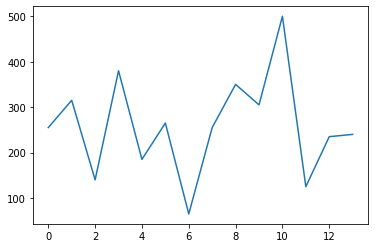

Epoch 1/32
128/128 [==============================] - 0s 569us/step - loss: 2.2910 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 2.2773 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 585us/step - loss: 2.2566 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 575us/step - loss: 2.2340 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 2.2157 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 2.2051 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 2.2006 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 2.1992 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 2.1989 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 2.1986 - acc: 0.7969
Epoch 11/32
128/128 [========

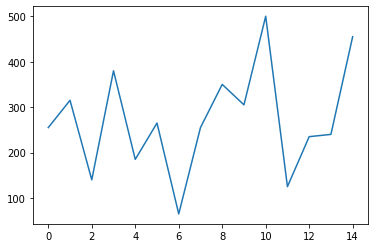

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 2.5152 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 2.5055 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 2.4900 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 2.4716 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 2.4544 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 2.4423 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 2.4362 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 2.4340 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 582us/step - loss: 2.4336 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 2.4338 - acc: 0.7422
Epoch 11/32
128/128 [========

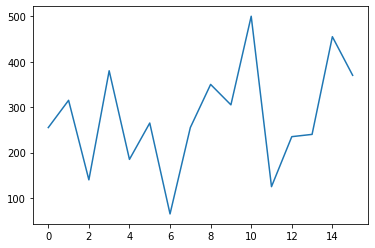

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.1363 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.1362 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.1360 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.1358 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 584us/step - loss: 0.1357 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.1355 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.1353 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.1351 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.1350 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.1348 - acc: 0.8594
Epoch 11/32
128/128 [========

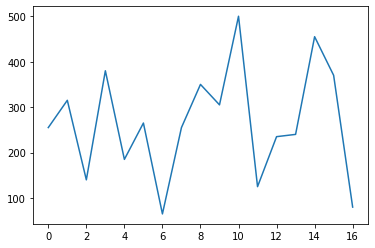

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 1.3067 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 1.3059 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.3047 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.3034 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.3025 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.3018 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.3013 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 1.3010 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 576us/step - loss: 1.3007 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.3004 - acc: 0.8984
Epoch 11/32
128/128 [========

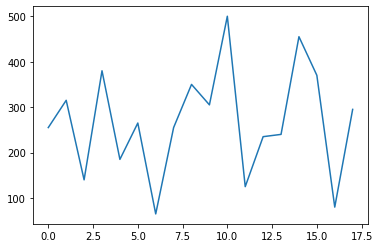

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.5784 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 1.5675 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 1.5572 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 1.5522 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 1.5505 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 1.5500 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.5500 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 1.5500 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 1.5499 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 1.5497 - acc: 0.8750
Epoch 11/32
128/128 [========

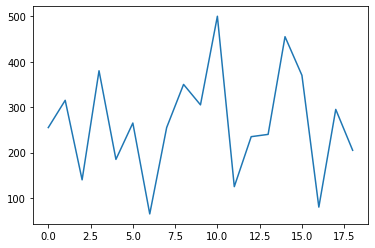

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 1.2326 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.2272 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.2216 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 1.2166 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 622us/step - loss: 1.2126 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 1.2098 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 1.2082 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 1.2072 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.2066 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.2062 - acc: 0.8047
Epoch 11/32
128/128 [========

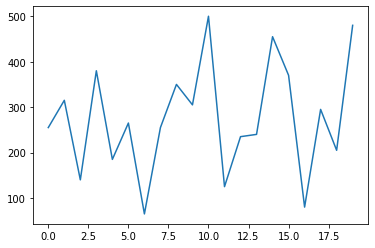

We are in the epoc:  21 Epsilon:  0.3584859224085422
Epoch 1/32
128/128 [==============================] - 0s 607us/step - loss: 1.0967 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 1.0966 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 1.0966 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 1.0966 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 620us/step - loss: 1.0966 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.0966 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 619us/step - loss: 1.0966 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 622us/step - loss: 1.0965 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 1.0965 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 596us/step - los

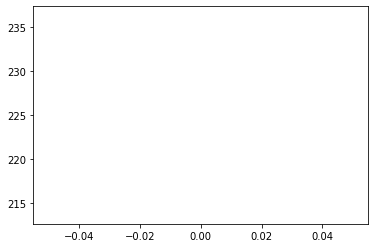

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.0351 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.0325 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 1.0291 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 1.0266 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 1.0253 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.0249 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 1.0248 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 619us/step - loss: 1.0247 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 1.0244 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 1.0240 - acc: 0.8672
Epoch 11/32
128/128 [========

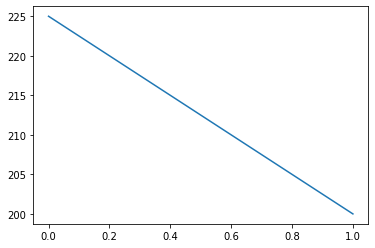

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0038 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.0037 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.0034 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 585us/step - loss: 0.0032 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0030 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 621us/step - loss: 0.0029 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 622us/step - loss: 0.0029 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.0029 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.0029 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 626us/step - loss: 0.0028 - acc: 0.8438
Epoch 11/32
128/128 [========

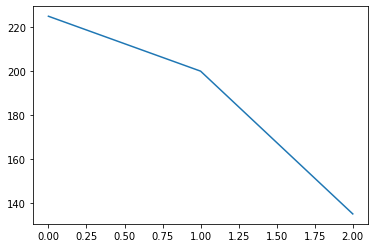

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.3224 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.3223 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.3222 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.3221 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.3220 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.3219 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.3218 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.3217 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.3217 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.3216 - acc: 0.8828
Epoch 11/32
128/128 [========

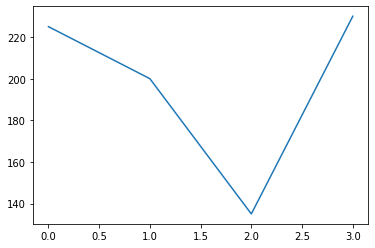

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0021 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.0021 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.0020 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0020 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 619us/step - loss: 0.0019 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.0018 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.0018 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 616us/step - loss: 0.0017 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.0017 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.0017 - acc: 0.7969
Epoch 11/32
128/128 [========

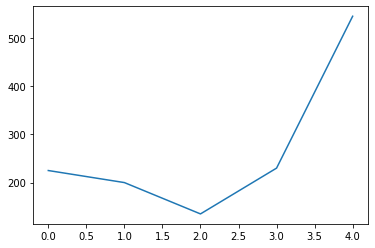

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.5292 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.5288 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.5282 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.5276 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.5271 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.5268 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.5266 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.5264 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.5263 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 0.5262 - acc: 0.8359
Epoch 11/32
128/128 [========

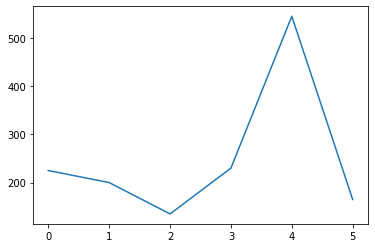

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.3504 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.3407 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.3288 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.3256 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.3256 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.3261 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.3264 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.3265 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.3265 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 627us/step - loss: 0.3264 - acc: 0.8203
Epoch 11/32
128/128 [========

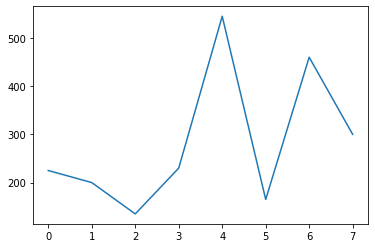

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.3236 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.3236 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.3235 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.3235 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.3234 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.3234 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.3233 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 0.3233 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.3232 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.3232 - acc: 0.8828
Epoch 11/32
128/128 [========

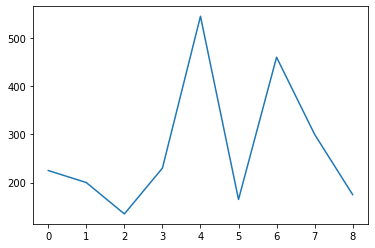

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 2.3340 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 2.3303 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 2.3240 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 2.3159 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 2.3082 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 2.3013 - acc: 0.7031
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 2.2964 - acc: 0.7031
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 2.2935 - acc: 0.6953
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 2.2920 - acc: 0.7031
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 2.2908 - acc: 0.6953
Epoch 11/32
128/128 [========

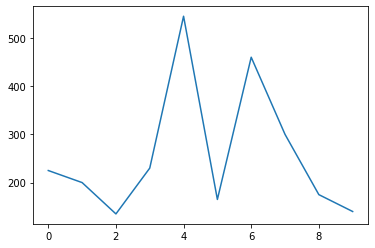

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 1.6491 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 1.6447 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 1.6424 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 1.6416 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.6414 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.6413 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 1.6413 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 1.6412 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 1.6410 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 1.6409 - acc: 0.8906
Epoch 11/32
128/128 [========

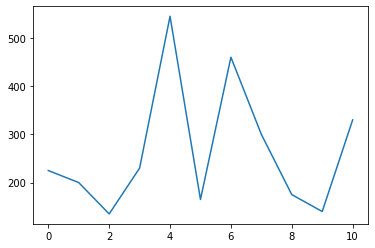

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.9131 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.9114 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.9086 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.9056 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.9027 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.9004 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.8987 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.8976 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.8968 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 0.8963 - acc: 0.8906
Epoch 11/32
128/128 [========

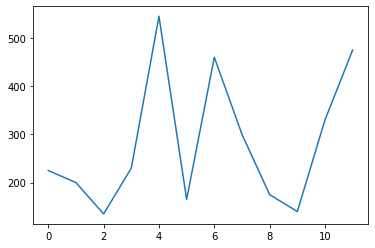

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 0.8156 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.8122 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.8078 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.8040 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.8015 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.8003 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.7998 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.7994 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.7990 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.7985 - acc: 0.8672
Epoch 11/32
128/128 [========

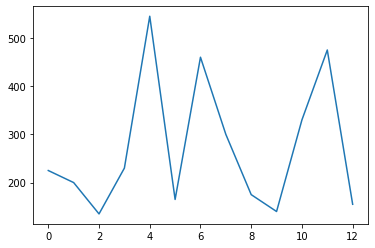

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.1971 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.1947 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.1915 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.1885 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 579us/step - loss: 0.1862 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.1846 - acc: 0.7656
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.1837 - acc: 0.7578
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.1832 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.1828 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.1824 - acc: 0.7734
Epoch 11/32
128/128 [========

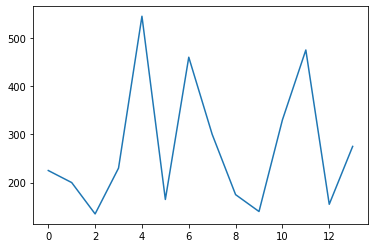

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.1022 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 1.1021 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 1.1020 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 581us/step - loss: 1.1018 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.1015 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.1013 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 1.1012 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 1.1010 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.1008 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 1.1007 - acc: 0.8672
Epoch 11/32
128/128 [========

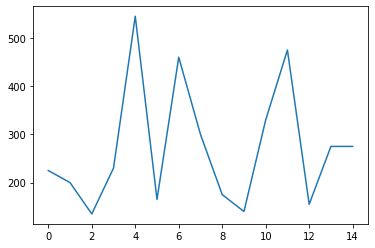

Epoch 1/32
128/128 [==============================] - 0s 610us/step - loss: 1.6429 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 1.6412 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 1.6390 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 622us/step - loss: 1.6374 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.6365 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 1.6360 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 619us/step - loss: 1.6359 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 622us/step - loss: 1.6357 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 1.6356 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 1.6353 - acc: 0.9219
Epoch 11/32
128/128 [========

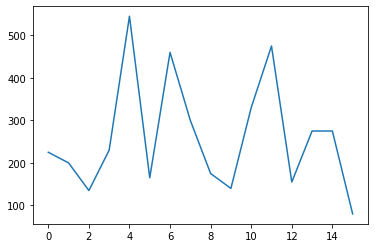

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.8118 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.8117 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.8116 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.8115 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.8113 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.8112 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 627us/step - loss: 0.8111 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.8111 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.8110 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.8109 - acc: 0.9062
Epoch 11/32
128/128 [========

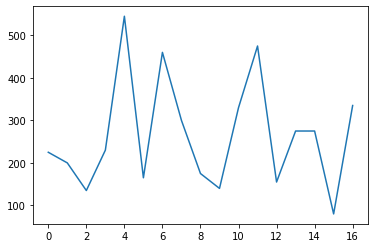

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 0.1618 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 579us/step - loss: 0.1618 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.1617 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.1617 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.1616 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 0.1615 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.1614 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.1614 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.1613 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.1613 - acc: 0.8984
Epoch 11/32
128/128 [========

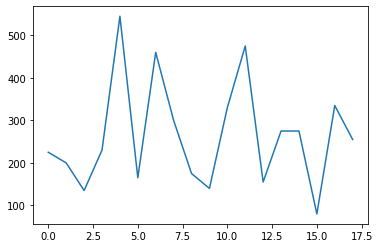

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 1.8632 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 1.8560 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 1.8493 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 1.8454 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 1.8435 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 1.8426 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 1.8421 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 1.8417 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 1.8413 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 1.8408 - acc: 0.9375
Epoch 11/32
128/128 [========

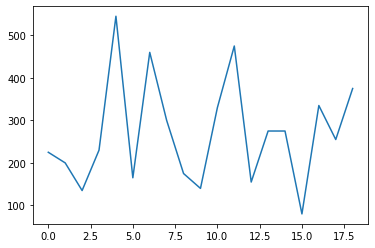

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.3195 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.3178 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.3155 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.3133 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.3118 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.3109 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.3104 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.3102 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 0.3100 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.3098 - acc: 0.7969
Epoch 11/32
128/128 [========

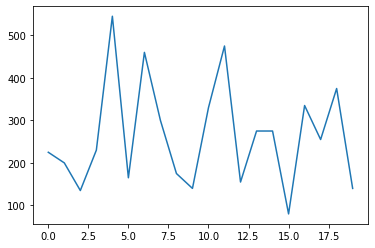

We are in the epoc:  22 Epsilon:  0.3405616262881151
Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 1.9863 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 1.9767 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 1.9633 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 1.9542 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 1.9515 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 615us/step - loss: 1.9513 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 1.9516 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 1.9514 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.9508 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 619us/step - los

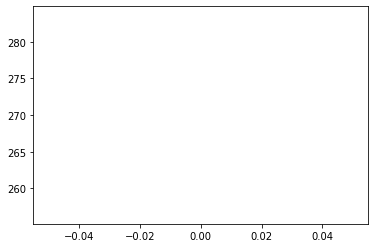

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.7179 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 0.7147 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.7128 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 579us/step - loss: 0.7122 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 615us/step - loss: 0.7120 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.7120 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.7119 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 0.7118 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.7117 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.7114 - acc: 0.8984
Epoch 11/32
128/128 [========

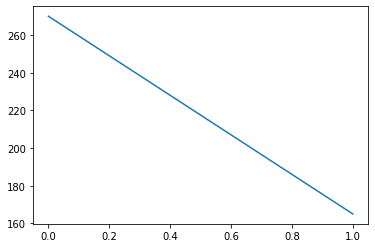

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.5263 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.5211 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.5132 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.5062 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.5023 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 0.5011 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 585us/step - loss: 0.5007 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.5004 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.4998 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.4990 - acc: 0.8516
Epoch 11/32
128/128 [========

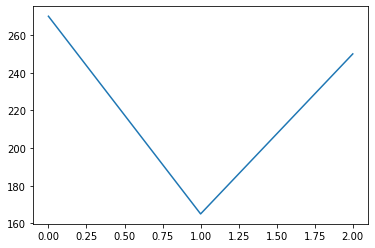

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 2.4014 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 2.3743 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 2.3420 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 2.3269 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 2.3230 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 612us/step - loss: 2.3228 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 2.3236 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 2.3243 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 2.3246 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 2.3244 - acc: 0.8750
Epoch 11/32
128/128 [========

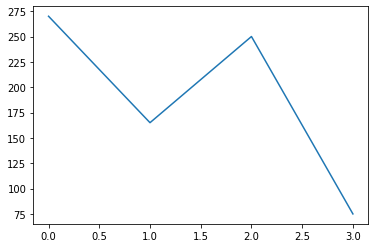

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 1.3856 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.3819 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.3761 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 1.3682 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 615us/step - loss: 1.3596 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 1.3531 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 1.3496 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 1.3483 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 617us/step - loss: 1.3477 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 1.3474 - acc: 0.8438
Epoch 11/32
128/128 [========

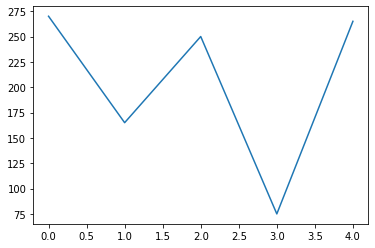

Epoch 1/32
128/128 [==============================] - 0s 565us/step - loss: 0.2046 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.2017 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.1976 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.1939 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.1917 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.1906 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.1900 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.1897 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.1894 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.1891 - acc: 0.9141
Epoch 11/32
128/128 [========

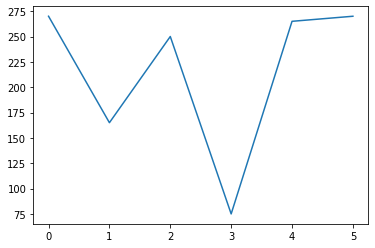

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0335 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0335 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.0334 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.0334 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0333 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.0332 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0332 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0331 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.0331 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.0331 - acc: 0.9141
Epoch 11/32
128/128 [========

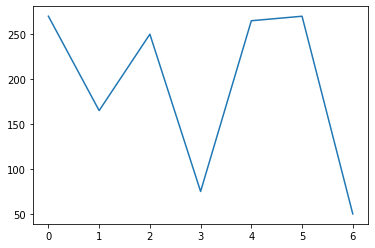

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 1.2145 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 1.2144 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 1.2143 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.2141 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 1.2140 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 1.2138 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 1.2137 - acc: 0.9688
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 1.2136 - acc: 0.9688
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 1.2135 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 1.2135 - acc: 0.9609
Epoch 11/32
128/128 [========

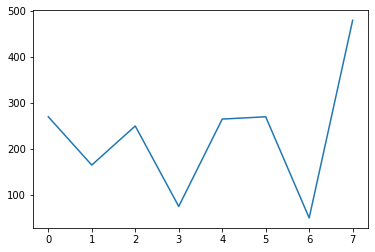

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.8141 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.8068 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.8013 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.7995 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.7992 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.7993 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.7993 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.7991 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 617us/step - loss: 0.7988 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.7982 - acc: 0.8984
Epoch 11/32
128/128 [========

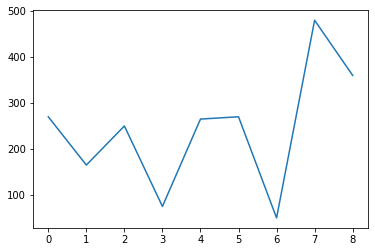

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 1.9212 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 1.9156 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.9094 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 1.9041 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 1.9000 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.8973 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.8956 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 1.8947 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 1.8941 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 1.8935 - acc: 0.8828
Epoch 11/32
128/128 [========

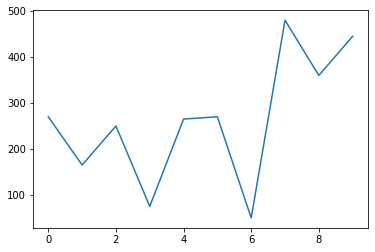

Epoch 1/32
128/128 [==============================] - 0s 611us/step - loss: 0.0048 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.0047 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.0046 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.0045 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0043 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 0.0042 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.0040 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.0039 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.0037 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.0036 - acc: 0.9297
Epoch 11/32
128/128 [========

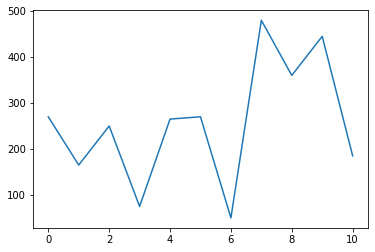

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.5202 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.5201 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.5199 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 0.5197 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.5195 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5193 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.5191 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.5190 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.5190 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.5189 - acc: 0.9609
Epoch 11/32
128/128 [========

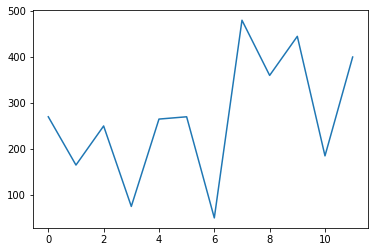

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.1659 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.1648 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 0.1630 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.1612 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 584us/step - loss: 0.1599 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.1592 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.1588 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.1585 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.1583 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.1581 - acc: 0.9219
Epoch 11/32
128/128 [========

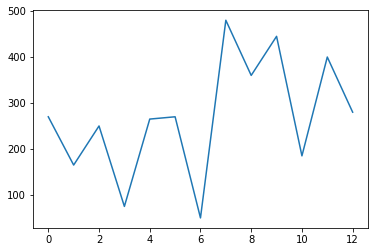

Epoch 1/32
128/128 [==============================] - 0s 563us/step - loss: 0.0365 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.0365 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.0363 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.0362 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0360 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.0358 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.0356 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.0354 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.0352 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 583us/step - loss: 0.0351 - acc: 0.9141
Epoch 11/32
128/128 [========

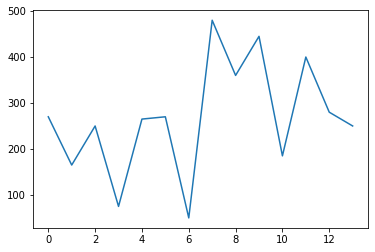

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.0292 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 0.0292 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0291 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0290 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0289 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.0288 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.0287 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0286 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.0285 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 0.0284 - acc: 0.8906
Epoch 11/32
128/128 [========

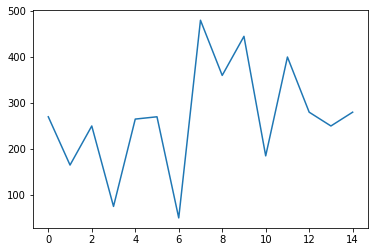

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.8297 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 0.8272 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.8241 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 620us/step - loss: 0.8217 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.8201 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.8191 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.8186 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.8182 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 615us/step - loss: 0.8180 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.8178 - acc: 0.9062
Epoch 11/32
128/128 [========

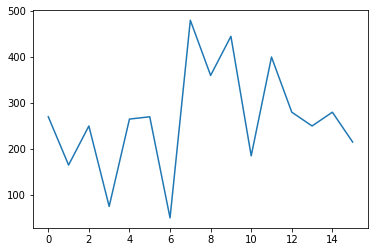

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.0035 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0035 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.0034 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.0033 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.0032 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.0031 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 0.0030 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0029 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.0028 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.0027 - acc: 0.8984
Epoch 11/32
128/128 [========

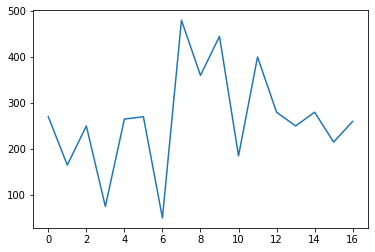

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 1.6177 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.6177 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 1.6176 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.6175 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.6174 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.6173 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 1.6171 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 1.6170 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.6169 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.6168 - acc: 0.9141
Epoch 11/32
128/128 [========

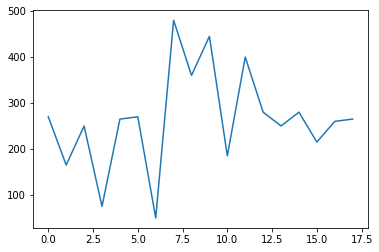

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 2.6576 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 2.6444 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 2.6277 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 2.6168 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 2.6128 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 577us/step - loss: 2.6122 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 2.6127 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 2.6132 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 2.6133 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 2.6129 - acc: 0.8047
Epoch 11/32
128/128 [========

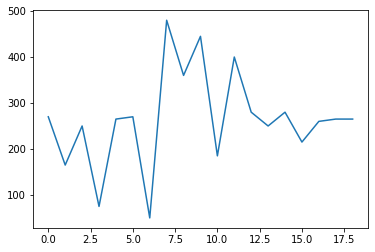

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.1648 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.1607 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.1574 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.1566 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.1570 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.1574 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.1575 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.1575 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.1573 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 0.1570 - acc: 0.8516
Epoch 11/32
128/128 [========

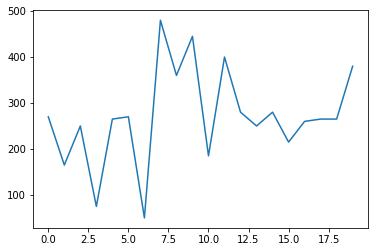

We are in the epoc:  23 Epsilon:  0.32353354497370934
Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.9979 - acc: 0.9766
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.9879 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.9749 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.9648 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.9592 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.9569 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.9563 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 617us/step - loss: 0.9560 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.9556 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 604us/step - lo

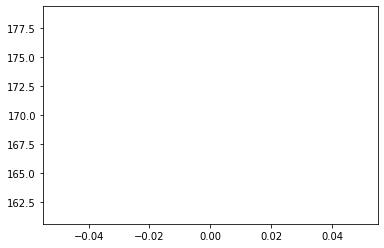

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.5823 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.5823 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.5822 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.5821 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.5819 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.5818 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.5816 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.5814 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.5813 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 0.5811 - acc: 0.8750
Epoch 11/32
128/128 [========

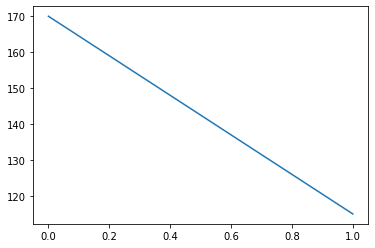

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.7105 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 0.7097 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.7087 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.7077 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.7070 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.7066 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.7063 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.7062 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.7061 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.7060 - acc: 0.9297
Epoch 11/32
128/128 [========

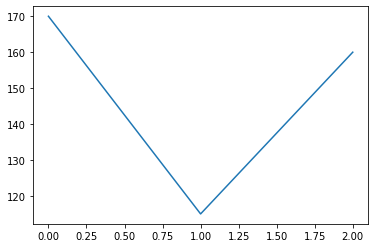

Epoch 1/32
128/128 [==============================] - 0s 615us/step - loss: 0.0022 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0021 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0020 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.0020 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.0019 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.0018 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.0017 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0016 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.0016 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.0015 - acc: 0.9141
Epoch 11/32
128/128 [========

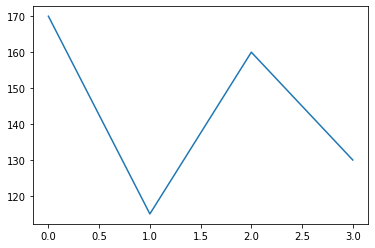

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.1957 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.1911 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.1855 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 1.1808 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 1.1779 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.1763 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.1756 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 1.1754 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.1753 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 1.1753 - acc: 0.9297
Epoch 11/32
128/128 [========

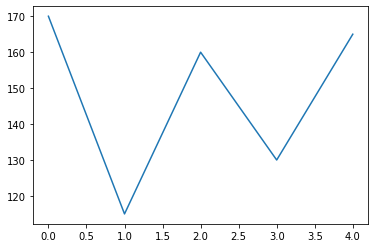

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.3265 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.3236 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.3199 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.3170 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.3152 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.3142 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.3135 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.3129 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.3123 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.3117 - acc: 0.8516
Epoch 11/32
128/128 [========

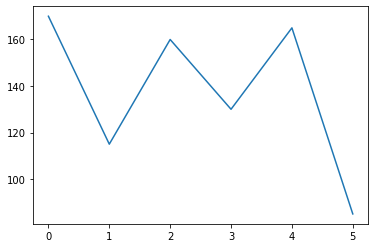

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.7673 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.7673 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.7672 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 585us/step - loss: 0.7671 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.7670 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.7669 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.7668 - acc: 0.9688
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.7668 - acc: 0.9766
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.7667 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.7666 - acc: 0.9766
Epoch 11/32
128/128 [========

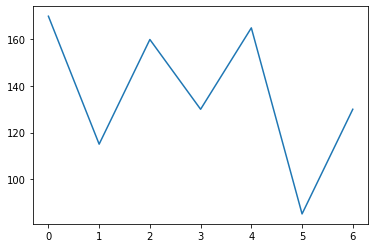

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.2579 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.2574 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.2569 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.2565 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.2562 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.2561 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.2560 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.2560 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.2560 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 620us/step - loss: 0.2559 - acc: 0.8984
Epoch 11/32
128/128 [========

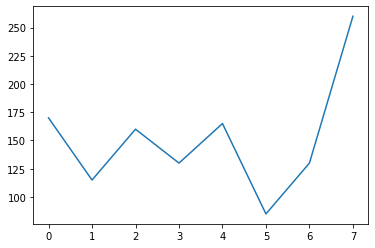

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 1.6998 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 1.6852 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.6666 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 1.6574 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 1.6554 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 1.6554 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 1.6556 - acc: 0.7734
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 1.6557 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.6556 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 1.6553 - acc: 0.7891
Epoch 11/32
128/128 [========

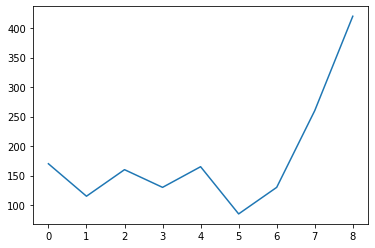

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 0.3904 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.3868 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 620us/step - loss: 0.3815 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.3780 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.3767 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 0.3764 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.3764 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.3764 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.3761 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.3758 - acc: 0.8516
Epoch 11/32
128/128 [========

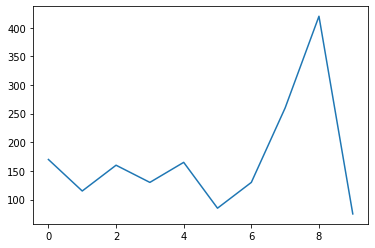

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.1619 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 1.1568 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 1.1510 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 1.1452 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 1.1385 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 1.1309 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 1.1241 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 1.1204 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 1.1188 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 617us/step - loss: 1.1183 - acc: 0.7969
Epoch 11/32
128/128 [========

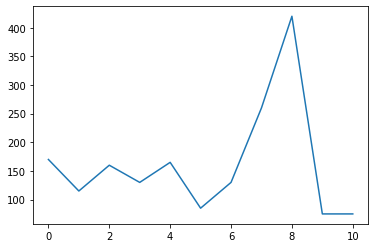

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 1.7196 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 1.7185 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.7167 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.7148 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.7132 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.7120 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 1.7112 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 1.7106 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.7103 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 1.7101 - acc: 0.8281
Epoch 11/32
128/128 [========

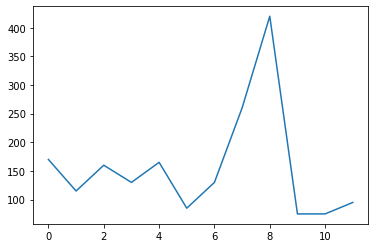

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.6558 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.6506 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.6440 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.6393 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.6369 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.6359 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.6356 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 619us/step - loss: 0.6355 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 0.6353 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.6351 - acc: 0.8750
Epoch 11/32
128/128 [========

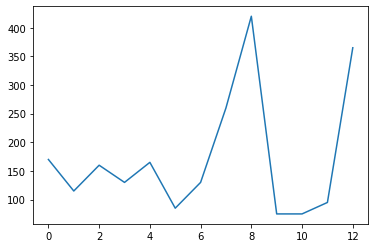

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 0.8443 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.8439 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.8434 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.8430 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 0.8428 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.8426 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.8425 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.8424 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.8424 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.8423 - acc: 0.9141
Epoch 11/32
128/128 [========

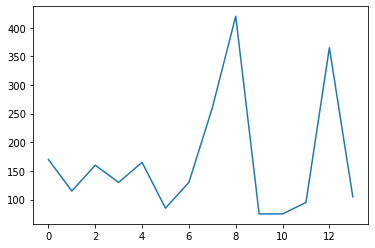

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.8720 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 0.8720 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.8719 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.8718 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.8716 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 617us/step - loss: 0.8715 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.8714 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.8713 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.8712 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.8711 - acc: 0.9375
Epoch 11/32
128/128 [========

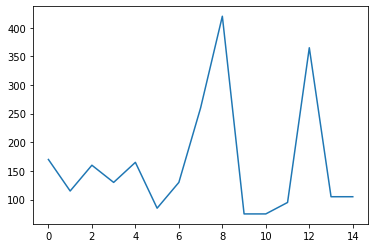

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.2931 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.2930 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.2929 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.2927 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.2925 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.2924 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.2923 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.2922 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.2921 - acc: 0.9609
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.2920 - acc: 0.9609
Epoch 11/32
128/128 [========

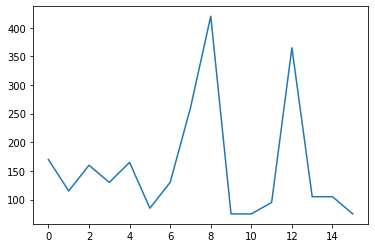

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 0.2600 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.2592 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.2582 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.2573 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.2566 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.2562 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.2560 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.2559 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.2558 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.2557 - acc: 0.8828
Epoch 11/32
128/128 [========

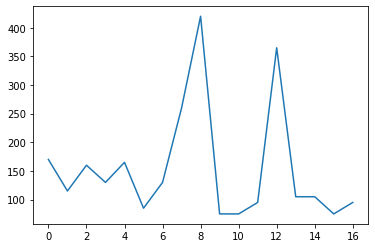

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 1.8703 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.8551 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 1.8378 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.8255 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 616us/step - loss: 1.8200 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 1.8184 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 1.8182 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 1.8186 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.8191 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 1.8194 - acc: 0.8359
Epoch 11/32
128/128 [========

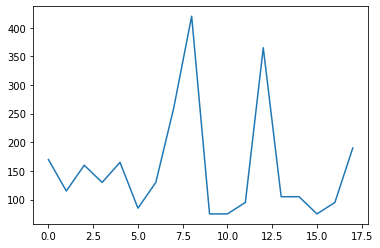

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 1.3313 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 1.3128 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 1.3019 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.3001 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.3011 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 1.3026 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 1.3037 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.3042 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.3045 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 1.3044 - acc: 0.8281
Epoch 11/32
128/128 [========

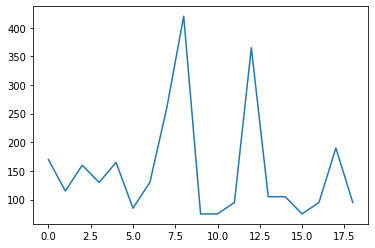

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 1.1699 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 1.1698 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.1698 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 1.1697 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 1.1695 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 1.1694 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.1693 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 1.1692 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.1690 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 1.1689 - acc: 0.9219
Epoch 11/32
128/128 [========

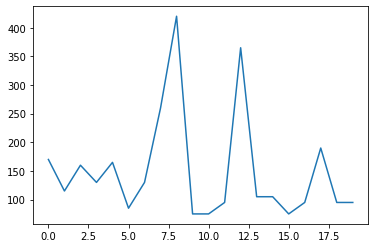

We are in the epoc:  24 Epsilon:  0.30735686772502385
Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.2613 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.2605 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.2592 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.2576 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.2561 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 613us/step - loss: 0.2548 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 620us/step - loss: 0.2537 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.2530 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.2526 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 595us/step - lo

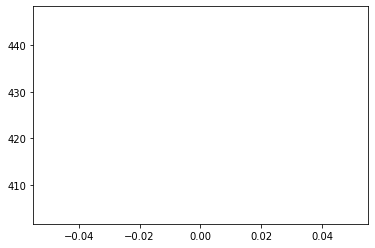

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.4527 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.4509 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.4482 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.4457 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.4440 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.4430 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.4426 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.4423 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.4422 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.4421 - acc: 0.9141
Epoch 11/32
128/128 [========

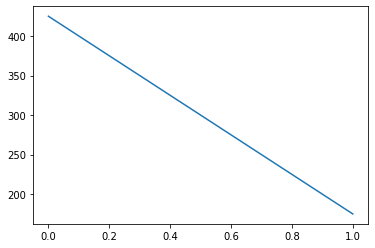

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.0436 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0436 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 619us/step - loss: 0.0436 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.0435 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.0434 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0434 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0433 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0432 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0431 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0430 - acc: 0.9375
Epoch 11/32
128/128 [========

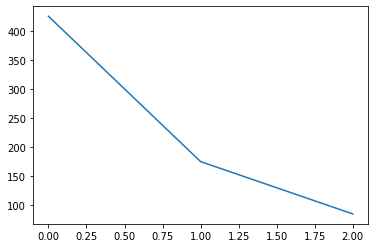

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 2.1290 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 2.1286 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 2.1281 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 2.1276 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 2.1272 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 2.1269 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 2.1266 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 2.1264 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 2.1263 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 630us/step - loss: 2.1262 - acc: 0.8594
Epoch 11/32
128/128 [========

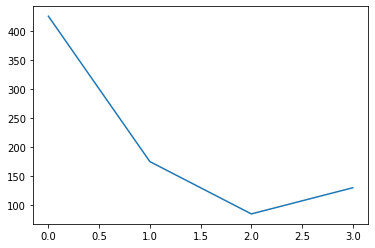

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.4693 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 1.4691 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.4688 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 1.4684 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 1.4680 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.4676 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 1.4673 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 1.4671 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.4669 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.4667 - acc: 0.9219
Epoch 11/32
128/128 [========

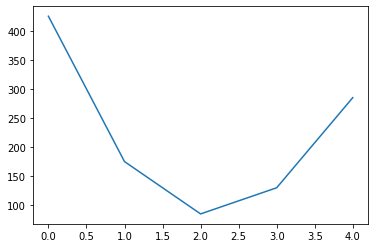

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.7066 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.7063 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.7057 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.7050 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 619us/step - loss: 0.7045 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.7040 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.7037 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.7034 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.7033 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.7031 - acc: 0.8984
Epoch 11/32
128/128 [========

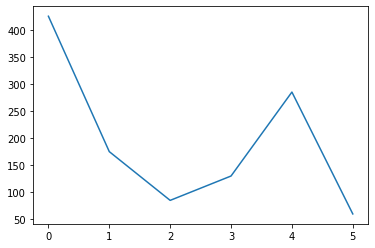

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.1317 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 584us/step - loss: 0.1317 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.1316 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.1315 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.1314 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.1313 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.1312 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.1310 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.1309 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.1308 - acc: 0.9375
Epoch 11/32
128/128 [========

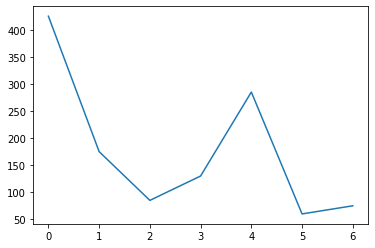

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.4493 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.4491 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.4487 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.4482 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 584us/step - loss: 0.4475 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.4469 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.4463 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.4457 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.4452 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.4448 - acc: 0.9062
Epoch 11/32
128/128 [========

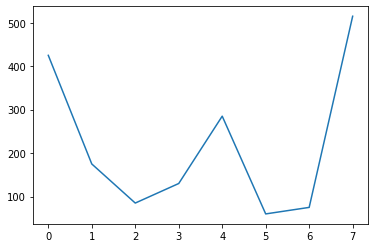

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.5835 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.5765 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.5675 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.5606 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.5569 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.5556 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.5553 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.5553 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.5555 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.5556 - acc: 0.8906
Epoch 11/32
128/128 [========

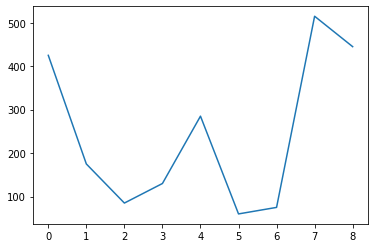

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.4467 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.4456 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.4444 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 619us/step - loss: 0.4433 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.4425 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.4419 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.4416 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.4413 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.4412 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.4410 - acc: 0.9141
Epoch 11/32
128/128 [========

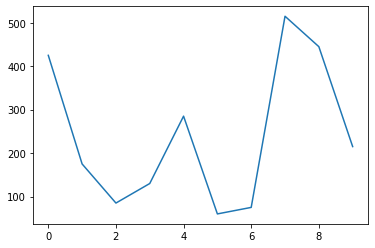

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.2552 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.2543 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.2527 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.2505 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.2479 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 0.2454 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.2432 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.2414 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.2402 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.2394 - acc: 0.8281
Epoch 11/32
128/128 [========

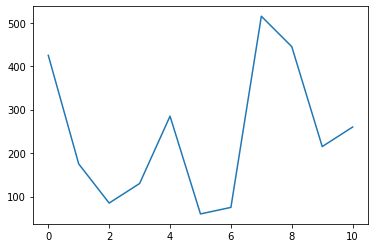

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.1661 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.1611 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 1.1531 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.1444 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 1.1382 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 1.1353 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 1.1344 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 1.1342 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.1343 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 1.1343 - acc: 0.8672
Epoch 11/32
128/128 [========

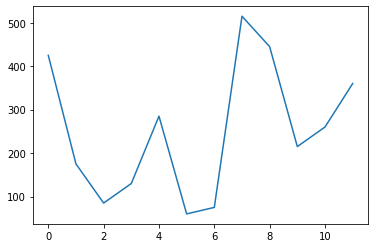

Epoch 1/32
128/128 [==============================] - 0s 606us/step - loss: 1.1614 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 1.1548 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.1460 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 1.1383 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 1.1334 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 1.1312 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 1.1307 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 1.1308 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.1308 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 1.1306 - acc: 0.9062
Epoch 11/32
128/128 [========

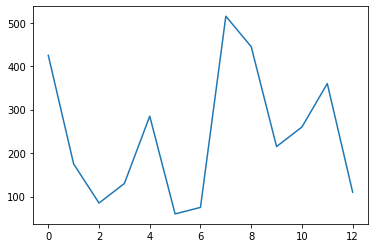

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.9900 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.9889 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.9871 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 0.9852 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.9834 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.9819 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.9808 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 0.9799 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.9793 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.9789 - acc: 0.8828
Epoch 11/32
128/128 [========

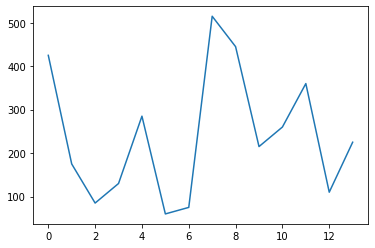

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.2966 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.2965 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.2963 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.2961 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.2959 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.2957 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 629us/step - loss: 0.2955 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.2953 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 621us/step - loss: 0.2952 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.2951 - acc: 0.8984
Epoch 11/32
128/128 [========

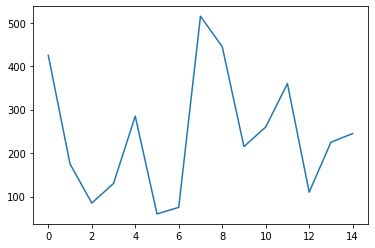

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.9471 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.9390 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.9298 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.9226 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.9176 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.9143 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.9124 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.9114 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.9109 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.9108 - acc: 0.8125
Epoch 11/32
128/128 [========

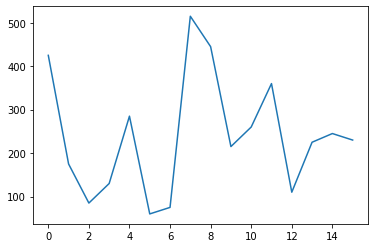

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.2939 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.2915 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.2887 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.2866 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.2856 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.2853 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.2852 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.2853 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.2853 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.2852 - acc: 0.8438
Epoch 11/32
128/128 [========

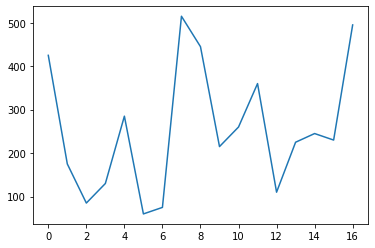

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.2944 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.2942 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.2939 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.2936 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.2933 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.2930 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.2927 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.2925 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.2923 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.2922 - acc: 0.9141
Epoch 11/32
128/128 [========

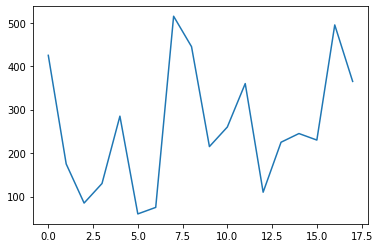

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.0709 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.0698 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 0.0685 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.0674 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0668 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0665 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.0664 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.0663 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.0663 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.0663 - acc: 0.8828
Epoch 11/32
128/128 [========

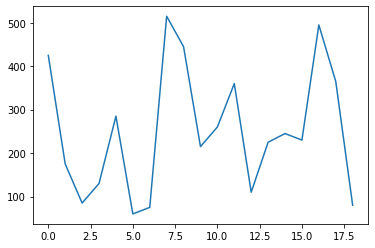

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 1.4606 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 1.4530 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 1.4434 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.4361 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 616us/step - loss: 1.4327 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 1.4318 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 1.4318 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 1.4320 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.4318 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 1.4314 - acc: 0.8359
Epoch 11/32
128/128 [========

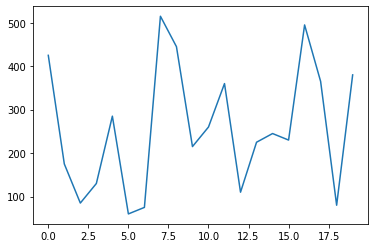

We are in the epoc:  25 Epsilon:  0.29198902433877266
Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 0.0032 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.0032 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0031 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.0030 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 615us/step - loss: 0.0029 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 616us/step - loss: 0.0028 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 0.0028 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.0027 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0026 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 587us/step - lo

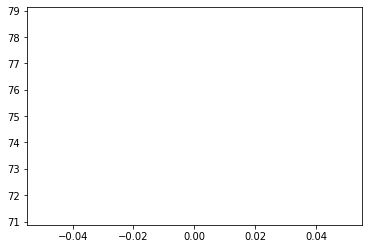

Epoch 1/32
128/128 [==============================] - 0s 608us/step - loss: 0.0036 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.0036 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 0.0035 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0034 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0033 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.0031 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.0030 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.0029 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.0028 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.0027 - acc: 0.9297
Epoch 11/32
128/128 [========

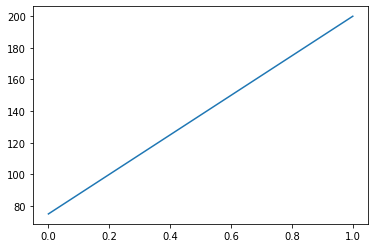

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.8071 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.8071 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.8070 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.8070 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.8069 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.8069 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.8068 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.8067 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.8067 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.8066 - acc: 0.9141
Epoch 11/32
128/128 [========

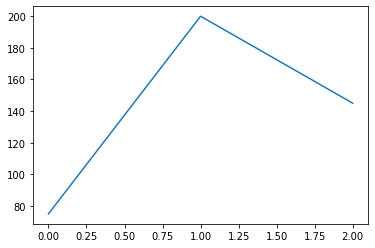

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.0023 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.0023 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.0023 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0022 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0021 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.0021 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.0020 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0020 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.0019 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 628us/step - loss: 0.0018 - acc: 0.9141
Epoch 11/32
128/128 [========

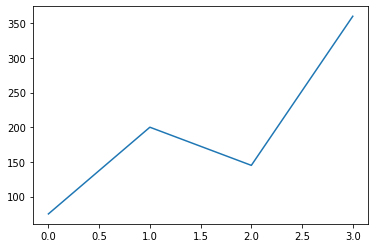

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.1947 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.1942 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.1934 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.1925 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.1916 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 581us/step - loss: 0.1907 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.1901 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.1896 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.1892 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.1889 - acc: 0.9219
Epoch 11/32
128/128 [========

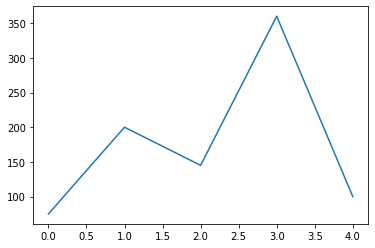

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.3215 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 620us/step - loss: 0.3201 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.3178 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.3152 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.3128 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.3107 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.3093 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.3083 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.3075 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.3070 - acc: 0.9375
Epoch 11/32
128/128 [========

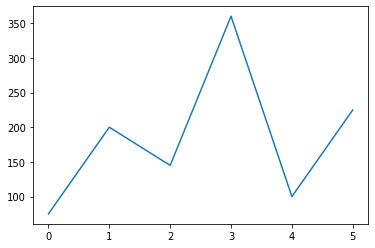

Epoch 1/32
128/128 [==============================] - 0s 608us/step - loss: 1.1196 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.1132 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 1.1060 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 1.1008 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 1.0976 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.0959 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 1.0951 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 1.0946 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 1.0944 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 618us/step - loss: 1.0942 - acc: 0.8828
Epoch 11/32
128/128 [========

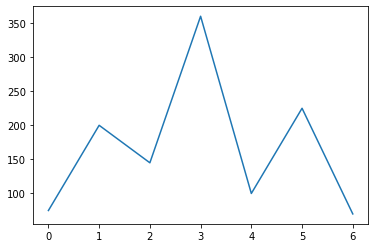

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.9047 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.9016 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 583us/step - loss: 0.8974 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.8932 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.8900 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 566us/step - loss: 0.8877 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.8862 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.8852 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.8846 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.8842 - acc: 0.8672
Epoch 11/32
128/128 [========

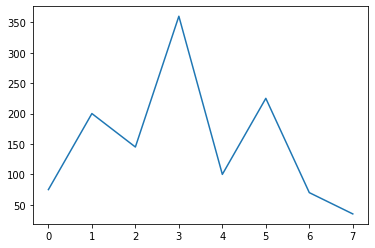

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0035 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0035 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 617us/step - loss: 0.0034 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.0032 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 616us/step - loss: 0.0031 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0030 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 622us/step - loss: 0.0029 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.0028 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.0027 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0026 - acc: 0.8828
Epoch 11/32
128/128 [========

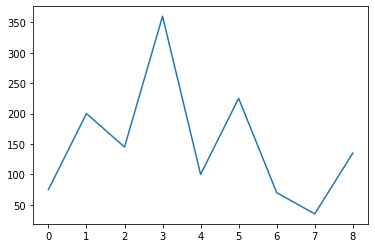

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 1.1204 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 1.1125 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 1.1023 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 1.0934 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.0859 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 1.0793 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 1.0736 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 1.0690 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.0659 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 1.0640 - acc: 0.8047
Epoch 11/32
128/128 [========

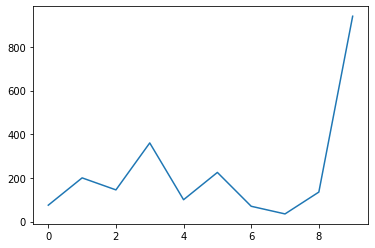

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 0.0048 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.0047 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.0045 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.0043 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.0041 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.0040 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.0039 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0039 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.0039 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0038 - acc: 0.8359
Epoch 11/32
128/128 [========

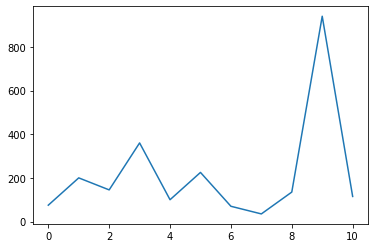

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.8101 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.8100 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.8099 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.8098 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.8097 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 613us/step - loss: 0.8096 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.8095 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.8093 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.8092 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.8091 - acc: 0.9219
Epoch 11/32
128/128 [========

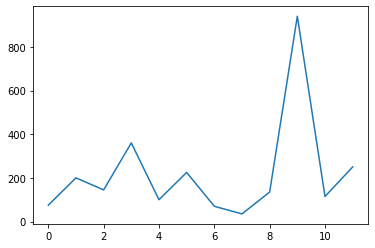

Epoch 1/32
128/128 [==============================] - 0s 606us/step - loss: 0.1321 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.1319 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.1317 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.1315 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.1312 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 613us/step - loss: 0.1310 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 0.1307 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.1305 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.1303 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.1301 - acc: 0.8516
Epoch 11/32
128/128 [========

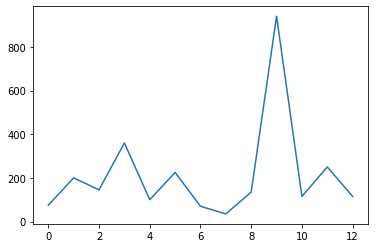

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.6147 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.6102 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.6023 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.5929 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 0.5851 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.5811 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.5800 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.5803 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.5809 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.5814 - acc: 0.7891
Epoch 11/32
128/128 [========

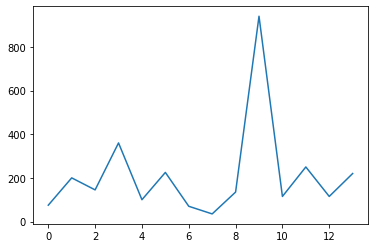

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.8464 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.8409 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.8327 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.8242 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.8177 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.8142 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 0.8128 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.8125 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.8124 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.8121 - acc: 0.8203
Epoch 11/32
128/128 [========

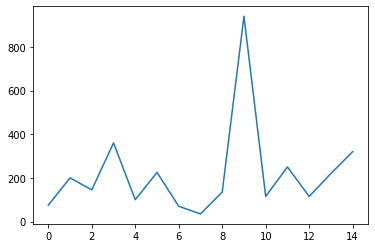

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.0665 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 0.0664 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.0664 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.0663 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.0663 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.0662 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.0662 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.0661 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.0660 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.0660 - acc: 0.9219
Epoch 11/32
128/128 [========

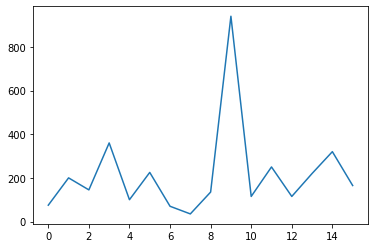

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.1269 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.1269 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.1269 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.1268 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 621us/step - loss: 0.1267 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.1267 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.1266 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.1265 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.1265 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.1264 - acc: 0.9219
Epoch 11/32
128/128 [========

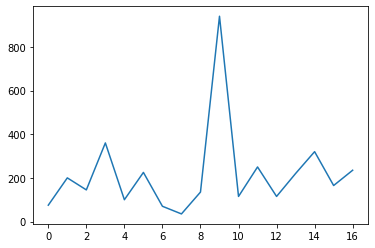

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.0362 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0357 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.0348 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.0339 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.0331 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.0324 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 629us/step - loss: 0.0319 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0315 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0312 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.0310 - acc: 0.8672
Epoch 11/32
128/128 [========

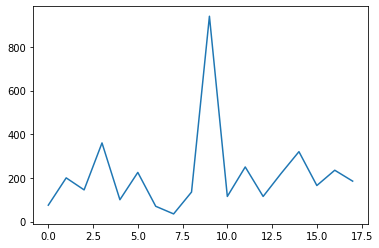

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.2923 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 0.2922 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.2921 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.2920 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.2919 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.2918 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.2917 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.2916 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.2915 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.2914 - acc: 0.9141
Epoch 11/32
128/128 [========

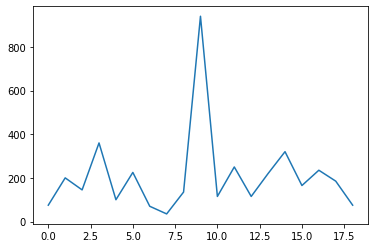

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 2.4070 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 2.3979 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 2.3852 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 2.3727 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 2.3631 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 2.3565 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 2.3523 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 2.3497 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 2.3482 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 2.3474 - acc: 0.7812
Epoch 11/32
128/128 [========

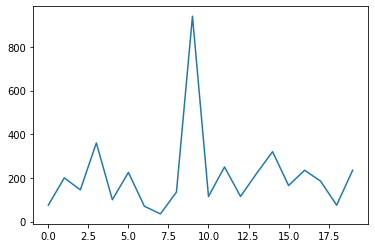

We are in the epoc:  26 Epsilon:  0.27738957312183404
Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.1341 - acc: 0.9766
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.1331 - acc: 0.9766
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.1317 - acc: 0.9766
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.1305 - acc: 0.9766
Epoch 5/32
128/128 [==============================] - 0s 582us/step - loss: 0.1296 - acc: 0.9766
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.1290 - acc: 0.9688
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.1286 - acc: 0.9688
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.1283 - acc: 0.9688
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.1282 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 606us/step - lo

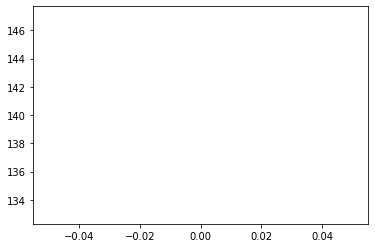

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.8084 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.8083 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 619us/step - loss: 0.8083 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.8082 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.8081 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 582us/step - loss: 0.8080 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.8079 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.8079 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.8078 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 0.8078 - acc: 0.8750
Epoch 11/32
128/128 [========

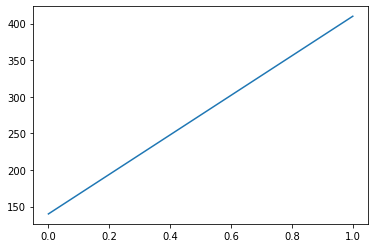

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.3534 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.3534 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.3534 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 0.3533 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.3532 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.3532 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.3531 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.3530 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.3530 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 621us/step - loss: 0.3529 - acc: 0.9375
Epoch 11/32
128/128 [========

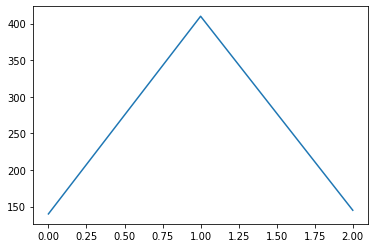

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.0020 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 0.0020 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.0020 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 618us/step - loss: 0.0019 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0019 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.0018 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.0018 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0017 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.0016 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.0016 - acc: 0.8516
Epoch 11/32
128/128 [========

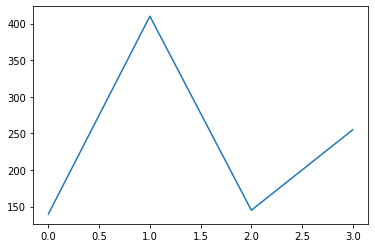

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.2051 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.2030 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.2009 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.1997 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 1.1991 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.1990 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 1.1991 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 1.1993 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 1.1994 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 1.1994 - acc: 0.8828
Epoch 11/32
128/128 [========

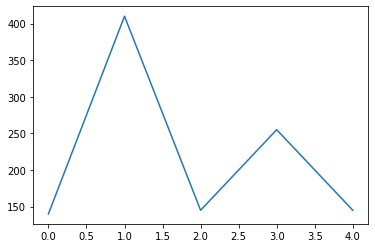

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 1.0970 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 585us/step - loss: 1.0947 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 1.0911 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 1.0871 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 1.0836 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 1.0812 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 1.0798 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 623us/step - loss: 1.0792 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.0789 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 1.0786 - acc: 0.8594
Epoch 11/32
128/128 [========

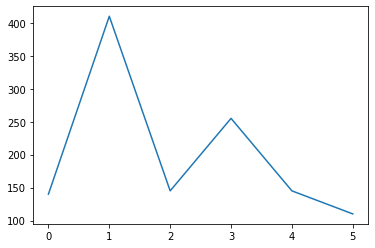

Epoch 1/32
128/128 [==============================] - 0s 601us/step - loss: 0.6701 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.6695 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.6684 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.6670 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 623us/step - loss: 0.6656 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.6641 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.6628 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.6618 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.6611 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.6606 - acc: 0.8281
Epoch 11/32
128/128 [========

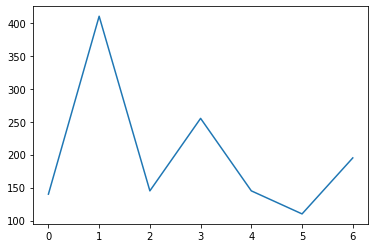

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 2.0497 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 2.0431 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 583us/step - loss: 2.0341 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 2.0263 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 2.0212 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 2.0184 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 2.0167 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 2.0155 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 2.0145 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 583us/step - loss: 2.0136 - acc: 0.7891
Epoch 11/32
128/128 [========

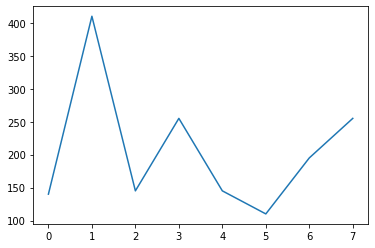

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0338 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.0335 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0331 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.0325 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.0321 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0317 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.0315 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.0313 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 0.0311 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.0310 - acc: 0.9062
Epoch 11/32
128/128 [========

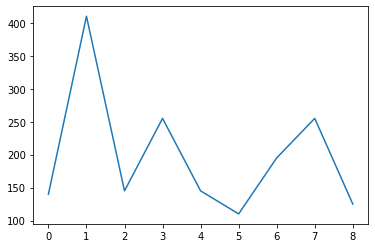

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 1.3055 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 1.2958 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 1.2852 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.2790 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 1.2767 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.2761 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 1.2760 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 627us/step - loss: 1.2760 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.2761 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.2761 - acc: 0.8516
Epoch 11/32
128/128 [========

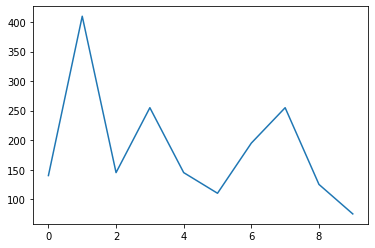

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.0405 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.0403 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.0398 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 0.0392 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0385 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0378 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0373 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 623us/step - loss: 0.0368 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.0363 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.0360 - acc: 0.8594
Epoch 11/32
128/128 [========

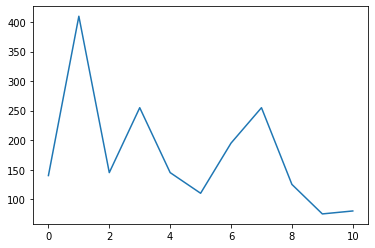

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.0684 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0680 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0673 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.0663 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.0651 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.0638 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.0626 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 0.0614 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0603 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 0.0595 - acc: 0.8281
Epoch 11/32
128/128 [========

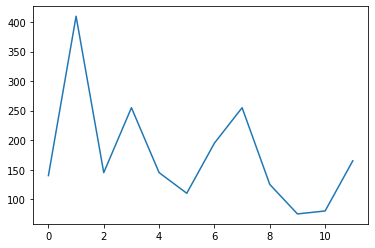

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.1273 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 0.1272 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1272 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.1271 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.1269 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.1268 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.1267 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.1266 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.1265 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.1264 - acc: 0.8906
Epoch 11/32
128/128 [========

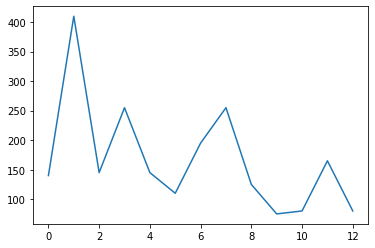

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.1322 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.1320 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.1317 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 0.1314 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.1312 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.1310 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.1308 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.1307 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 0.1306 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.1305 - acc: 0.9297
Epoch 11/32
128/128 [========

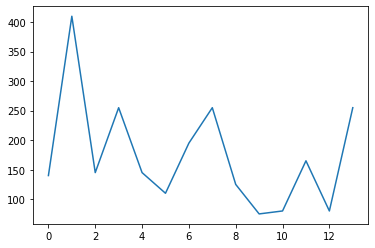

Epoch 1/32
128/128 [==============================] - 0s 565us/step - loss: 0.0373 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.0367 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.0358 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0348 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0337 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.0329 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.0323 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.0320 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.0318 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.0317 - acc: 0.8594
Epoch 11/32
128/128 [========

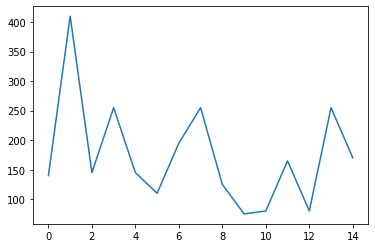

Epoch 1/32
128/128 [==============================] - 0s 568us/step - loss: 2.2536 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 2.2467 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 2.2380 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 2.2308 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 2.2260 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 2.2231 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 2.2214 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 2.2204 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 619us/step - loss: 2.2197 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 2.2191 - acc: 0.7812
Epoch 11/32
128/128 [========

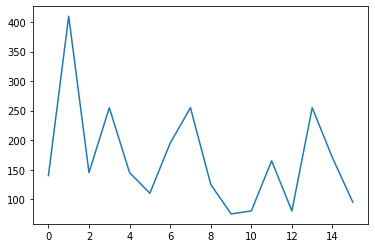

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.6912 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 577us/step - loss: 1.6887 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 1.6845 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.6790 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 1.6727 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.6668 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 1.6620 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 1.6587 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 1.6564 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.6548 - acc: 0.8047
Epoch 11/32
128/128 [========

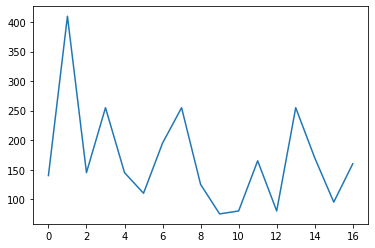

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.8706 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 623us/step - loss: 0.8704 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.8702 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 623us/step - loss: 0.8700 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.8697 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.8695 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.8693 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.8692 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.8690 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 581us/step - loss: 0.8689 - acc: 0.9219
Epoch 11/32
128/128 [========

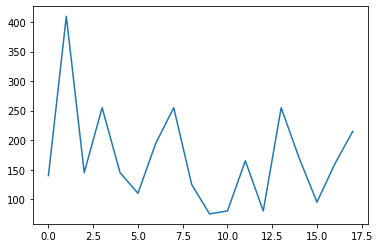

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.0860 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 1.0859 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 1.0858 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 1.0857 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.0855 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 1.0854 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.0852 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 1.0850 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.0849 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.0848 - acc: 0.9297
Epoch 11/32
128/128 [========

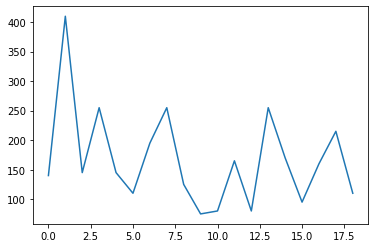

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.4571 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.4533 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.4409 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.4259 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.4227 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 0.4231 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.4242 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.4253 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.4261 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.4266 - acc: 0.8906
Epoch 11/32
128/128 [========

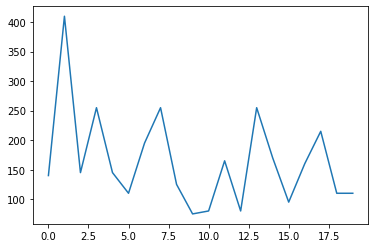

We are in the epoc:  27 Epsilon:  0.2635200944657423
Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.8387 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.8315 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 613us/step - loss: 0.8243 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.8200 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.8180 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.8172 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.8168 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 616us/step - loss: 0.8167 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 0.8166 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 602us/step - los

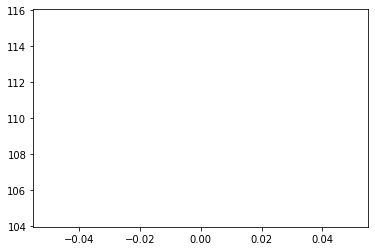

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 1.3009 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 1.2959 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 622us/step - loss: 1.2870 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 1.2753 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.2639 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.2563 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.2525 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.2512 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.2511 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.2513 - acc: 0.7344
Epoch 11/32
128/128 [========

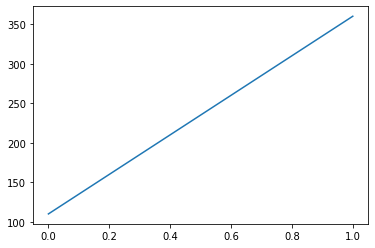

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 0.3005 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.2971 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.2929 - acc: 0.9688
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.2901 - acc: 0.9688
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.2888 - acc: 0.9688
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.2882 - acc: 0.9688
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.2880 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.2879 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.2878 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.2877 - acc: 0.9688
Epoch 11/32
128/128 [========

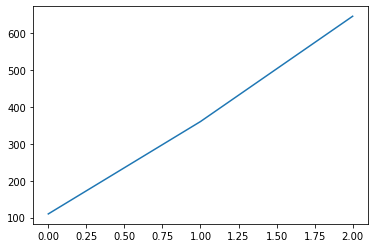

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.1309 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.1309 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1308 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.1308 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.1307 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.1306 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 0.1305 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.1304 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.1304 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.1303 - acc: 0.9531
Epoch 11/32
128/128 [========

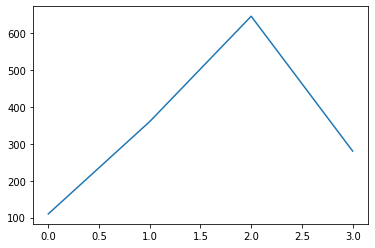

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.3066 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 1.3063 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.3059 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 1.3055 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.3052 - acc: 0.9688
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 1.3050 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 1.3049 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 1.3049 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.3048 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.3048 - acc: 0.9688
Epoch 11/32
128/128 [========

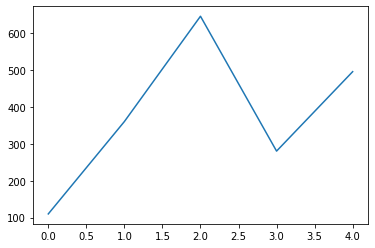

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.1305 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.1291 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.1270 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.1247 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.1226 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.1211 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.1202 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.1197 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.1194 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.1193 - acc: 0.8516
Epoch 11/32
128/128 [========

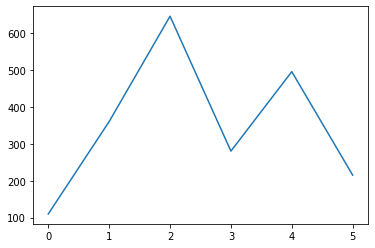

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.6137 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.6110 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.6065 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.6002 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.5940 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.5895 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 581us/step - loss: 0.5871 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.5861 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.5860 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 569us/step - loss: 0.5861 - acc: 0.8672
Epoch 11/32
128/128 [========

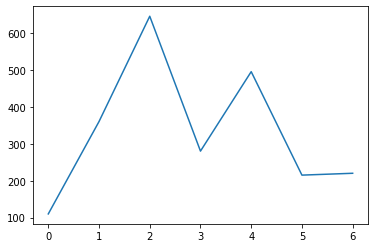

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.0031 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0031 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.0030 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 634us/step - loss: 0.0029 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.0028 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.0027 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.0027 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.0026 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 581us/step - loss: 0.0026 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.0025 - acc: 0.9297
Epoch 11/32
128/128 [========

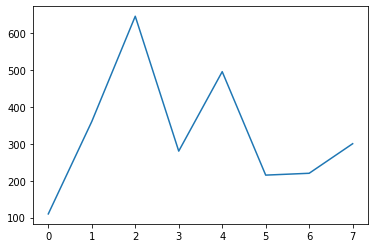

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.5499 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.5499 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 0.5498 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 559us/step - loss: 0.5498 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.5497 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.5496 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.5495 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.5494 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.5494 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.5493 - acc: 0.9219
Epoch 11/32
128/128 [========

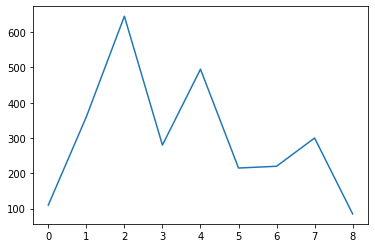

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 0.5211 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.5211 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.5210 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.5208 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.5206 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.5205 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.5203 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.5201 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.5200 - acc: 0.9609
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.5199 - acc: 0.9531
Epoch 11/32
128/128 [========

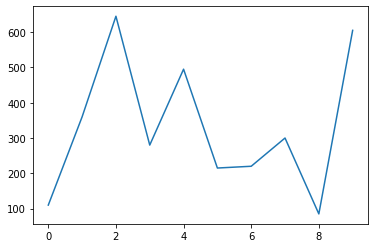

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.1297 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.1297 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.1296 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 0.1296 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.1295 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.1294 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.1294 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.1293 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.1293 - acc: 0.9609
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.1292 - acc: 0.9609
Epoch 11/32
128/128 [========

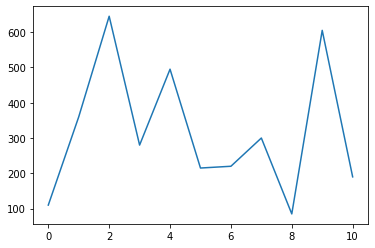

Epoch 1/32
128/128 [==============================] - 0s 573us/step - loss: 0.0656 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0649 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 583us/step - loss: 0.0638 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 575us/step - loss: 0.0627 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 583us/step - loss: 0.0617 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 578us/step - loss: 0.0610 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 582us/step - loss: 0.0606 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 0.0603 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0601 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.0599 - acc: 0.8594
Epoch 11/32
128/128 [========

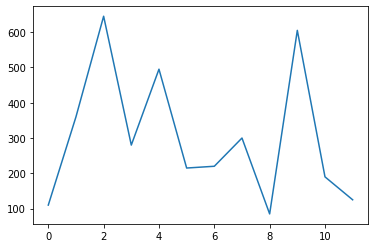

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.8360 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.8313 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.8249 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.8193 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.8159 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.8144 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.8140 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.8139 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.8136 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.8132 - acc: 0.8281
Epoch 11/32
128/128 [========

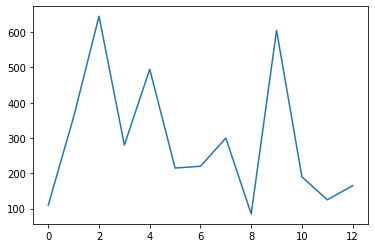

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.8086 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.8076 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.8057 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.8032 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.8001 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.7966 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.7929 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.7894 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.7864 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.7840 - acc: 0.8047
Epoch 11/32
128/128 [========

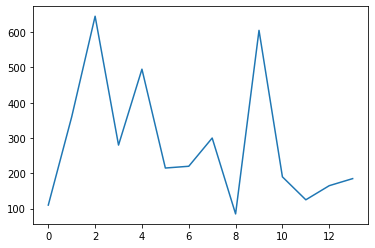

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.9787 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.9720 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.9624 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.9534 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.9469 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 613us/step - loss: 0.9425 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 617us/step - loss: 0.9392 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.9364 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.9342 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.9325 - acc: 0.7969
Epoch 11/32
128/128 [========

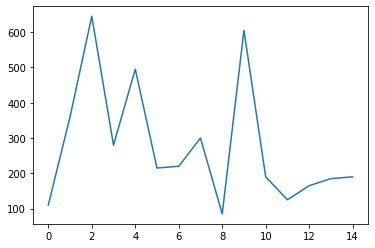

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.7034 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 621us/step - loss: 0.7019 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.6998 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.6979 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 0.6968 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.6963 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.6960 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.6958 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.6955 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.6951 - acc: 0.8984
Epoch 11/32
128/128 [========

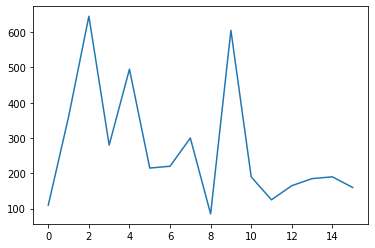

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.5125 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 0.5083 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.5049 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.5036 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.5034 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.5035 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.5035 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.5034 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.5033 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.5031 - acc: 0.8828
Epoch 11/32
128/128 [========

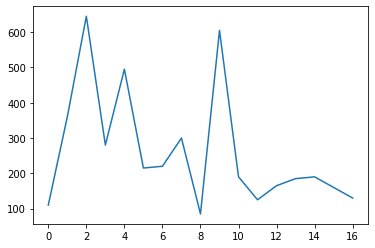

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.5870 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.5868 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.5865 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.5862 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.5859 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 621us/step - loss: 0.5856 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.5853 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.5851 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 615us/step - loss: 0.5850 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.5848 - acc: 0.9453
Epoch 11/32
128/128 [========

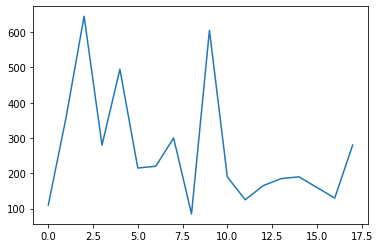

Epoch 1/32
128/128 [==============================] - 0s 571us/step - loss: 0.6451 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.6408 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.6325 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.6230 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.6172 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 616us/step - loss: 0.6150 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.6143 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 625us/step - loss: 0.6139 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.6137 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.6135 - acc: 0.7891
Epoch 11/32
128/128 [========

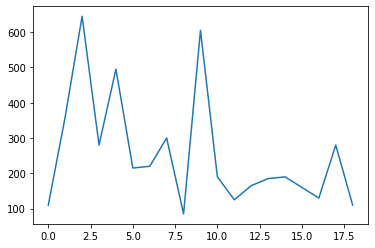

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.9395 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.9394 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.9393 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.9391 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.9390 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.9388 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.9387 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.9385 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.9383 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.9382 - acc: 0.9219
Epoch 11/32
128/128 [========

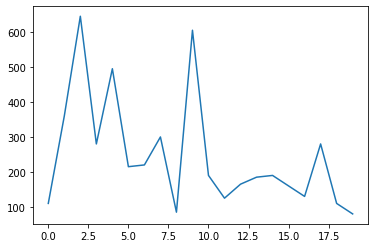

We are in the epoc:  28 Epsilon:  0.2503440897424552
Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.0021 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.0021 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.0021 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 620us/step - loss: 0.0020 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.0020 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.0019 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 0.0019 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0019 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 0.0019 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 615us/step - los

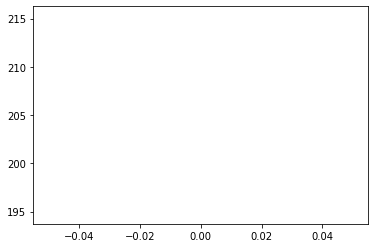

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.2592 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.2572 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 0.2546 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.2526 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 620us/step - loss: 0.2513 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.2507 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.2504 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.2502 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.2501 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.2500 - acc: 0.8516
Epoch 11/32
128/128 [========

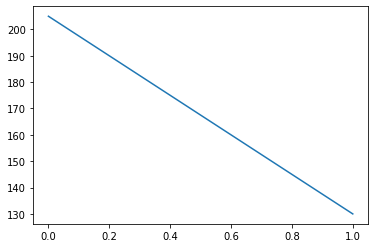

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0349 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.0346 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0342 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.0336 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.0330 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.0323 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.0317 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0312 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.0308 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0306 - acc: 0.9062
Epoch 11/32
128/128 [========

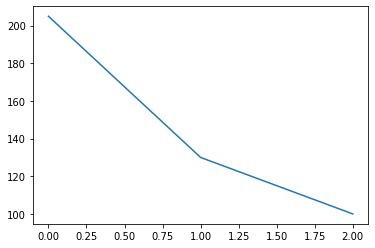

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.1982 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.1960 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.1937 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.1922 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.1914 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.1911 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.1908 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 0.1906 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.1904 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.1902 - acc: 0.8359
Epoch 11/32
128/128 [========

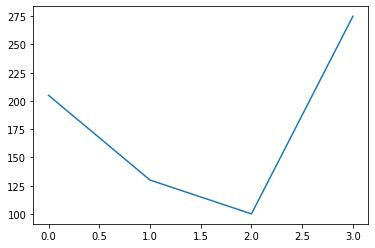

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.5491 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.5478 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.5465 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.5455 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.5450 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.5447 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.5445 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.5443 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.5442 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.5440 - acc: 0.9297
Epoch 11/32
128/128 [========

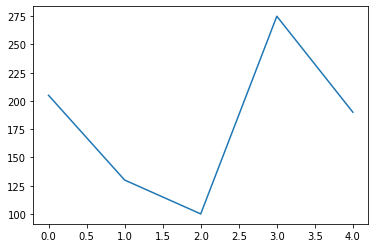

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 1.1923 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 1.1838 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 620us/step - loss: 1.1735 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 1.1658 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 1.1622 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.1612 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.1610 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.1611 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.1610 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 1.1609 - acc: 0.8359
Epoch 11/32
128/128 [========

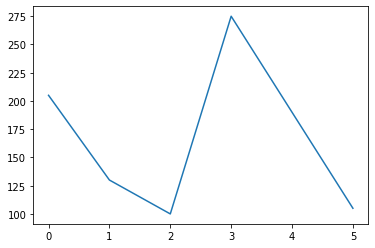

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.8054 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.8049 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.8043 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.8038 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.8034 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.8032 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 617us/step - loss: 0.8030 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.8028 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.8027 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.8026 - acc: 0.9453
Epoch 11/32
128/128 [========

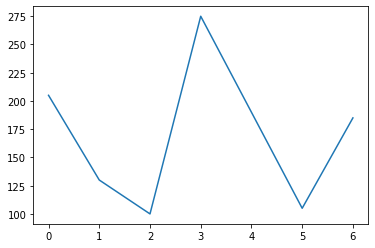

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.4289 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.4273 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.4254 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 0.4240 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.4233 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.4229 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.4227 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.4225 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 627us/step - loss: 0.4223 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 617us/step - loss: 0.4220 - acc: 0.8672
Epoch 11/32
128/128 [========

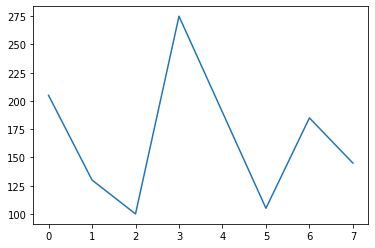

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.6470 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.6469 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.6468 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.6467 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.6466 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 615us/step - loss: 0.6464 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.6463 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.6462 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.6461 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 0.6460 - acc: 0.9453
Epoch 11/32
128/128 [========

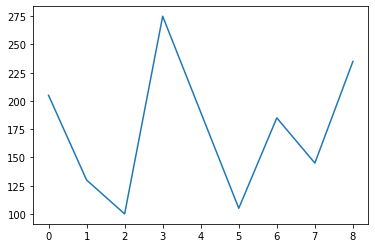

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.0329 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.0328 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.0328 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.0327 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0326 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.0325 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.0324 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 0.0323 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.0323 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.0322 - acc: 0.9531
Epoch 11/32
128/128 [========

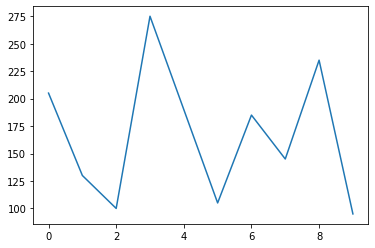

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.2267 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.2263 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.2254 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.2244 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.2232 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.2221 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.2211 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 632us/step - loss: 0.2202 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.2195 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 0.2188 - acc: 0.9062
Epoch 11/32
128/128 [========

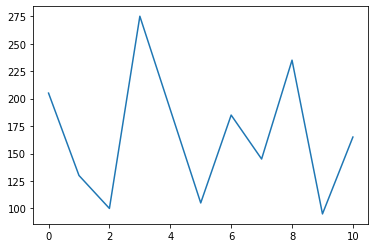

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.8615 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.8473 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.8302 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.8196 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.8153 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.8139 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.8135 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.8133 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.8131 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 620us/step - loss: 0.8126 - acc: 0.8125
Epoch 11/32
128/128 [========

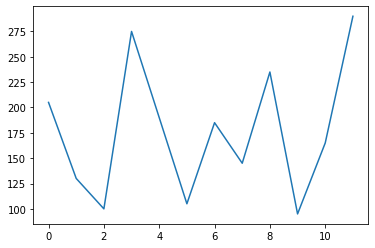

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.1937 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.1936 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.1935 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 0.1933 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.1931 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.1929 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.1927 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.1926 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.1925 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.1924 - acc: 0.8828
Epoch 11/32
128/128 [========

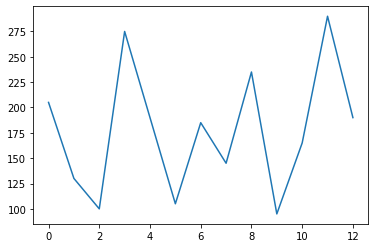

Epoch 1/32
128/128 [==============================] - 0s 601us/step - loss: 0.9298 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.9284 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.9272 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.9264 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 620us/step - loss: 0.9259 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.9257 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.9256 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.9255 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 612us/step - loss: 0.9254 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.9252 - acc: 0.8828
Epoch 11/32
128/128 [========

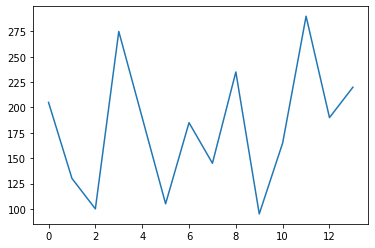

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.5844 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.5803 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.5749 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.5693 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.5646 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.5613 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.5591 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.5580 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.5573 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 626us/step - loss: 0.5569 - acc: 0.8672
Epoch 11/32
128/128 [========

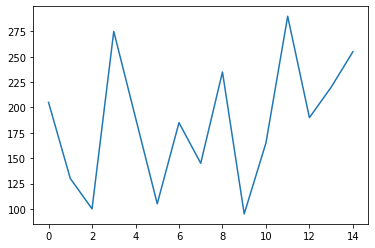

Epoch 1/32
128/128 [==============================] - 0s 561us/step - loss: 0.6732 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 0.6731 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.6730 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.6729 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.6727 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.6726 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 625us/step - loss: 0.6725 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 0.6724 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.6724 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.6723 - acc: 0.9297
Epoch 11/32
128/128 [========

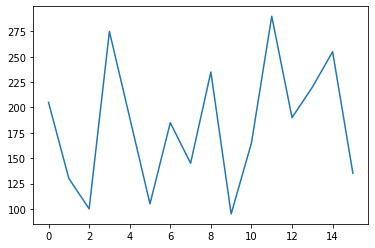

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.5271 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.5254 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.5227 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.5193 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.5157 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5123 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.5098 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.5080 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.5067 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 623us/step - loss: 0.5059 - acc: 0.7891
Epoch 11/32
128/128 [========

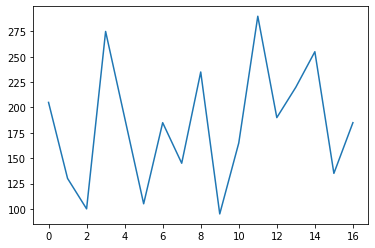

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 1.1102 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 1.1076 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 1.1031 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.0969 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 1.0897 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.0832 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 1.0783 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.0752 - acc: 0.7656
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.0733 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 1.0722 - acc: 0.7656
Epoch 11/32
128/128 [========

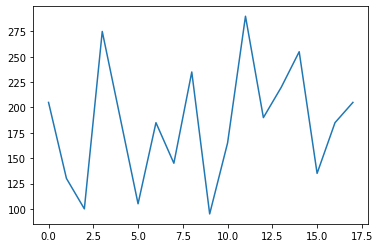

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 0.7990 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 624us/step - loss: 0.7929 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.7838 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.7754 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.7698 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.7667 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.7651 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.7639 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.7629 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.7619 - acc: 0.8359
Epoch 11/32
128/128 [========

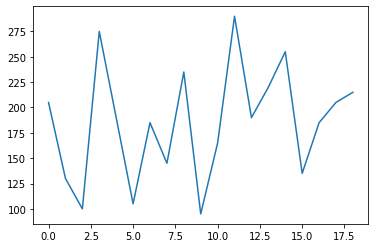

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.5792 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.5770 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 585us/step - loss: 0.5739 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.5711 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 0.5689 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.5676 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.5669 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.5665 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 615us/step - loss: 0.5662 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.5659 - acc: 0.8438
Epoch 11/32
128/128 [========

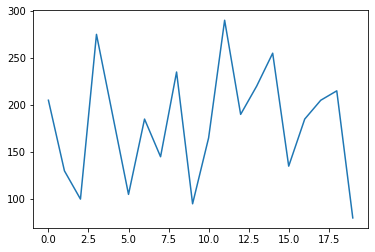

We are in the epoc:  29 Epsilon:  0.23782688525533244
Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.3225 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.3223 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 0.3221 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.3219 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 583us/step - loss: 0.3217 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.3215 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 579us/step - loss: 0.3213 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.3211 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 622us/step - loss: 0.3210 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 604us/step - lo

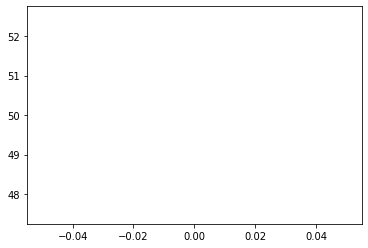

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.0943 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.0928 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 1.0911 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 1.0899 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 1.0892 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 1.0889 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.0888 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 1.0887 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 1.0885 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 1.0884 - acc: 0.8750
Epoch 11/32
128/128 [========

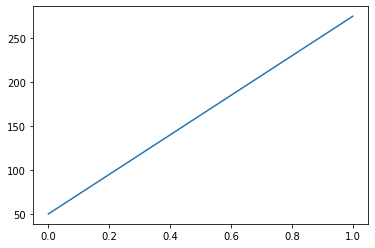

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.3314 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.3308 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 616us/step - loss: 0.3299 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.3288 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.3276 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.3268 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.3261 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.3256 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.3252 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.3248 - acc: 0.8906
Epoch 11/32
128/128 [========

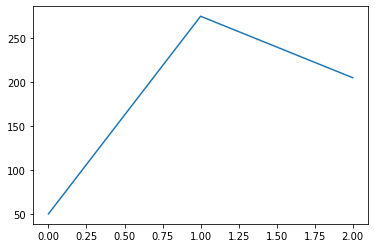

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.8041 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.7996 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.7954 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.7930 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.7920 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.7916 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.7913 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.7909 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.7905 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.7900 - acc: 0.9141
Epoch 11/32
128/128 [========

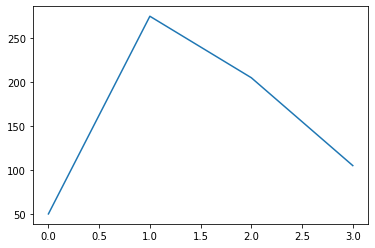

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.0379 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.0370 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.0354 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.0337 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0323 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 615us/step - loss: 0.0316 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 624us/step - loss: 0.0312 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0310 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 621us/step - loss: 0.0309 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0307 - acc: 0.9297
Epoch 11/32
128/128 [========

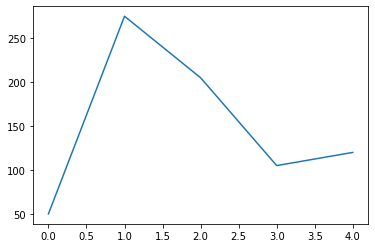

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.3050 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.3018 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.2974 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 619us/step - loss: 0.2933 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.2905 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.2891 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.2884 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.2880 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 623us/step - loss: 0.2877 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.2873 - acc: 0.8672
Epoch 11/32
128/128 [========

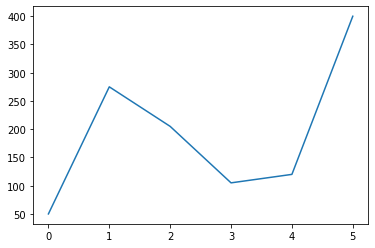

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.4197 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.4181 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.4161 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.4147 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.4141 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.4138 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 0.4137 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.4135 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.4132 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.4129 - acc: 0.9141
Epoch 11/32
128/128 [========

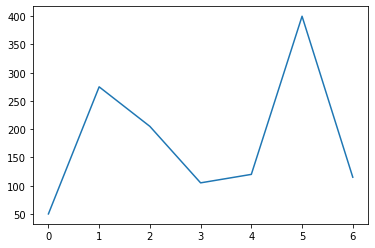

Epoch 1/32
128/128 [==============================] - 0s 605us/step - loss: 0.8105 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.8105 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.8104 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.8103 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 619us/step - loss: 0.8101 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.8100 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.8099 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.8099 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 617us/step - loss: 0.8098 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.8097 - acc: 0.9062
Epoch 11/32
128/128 [========

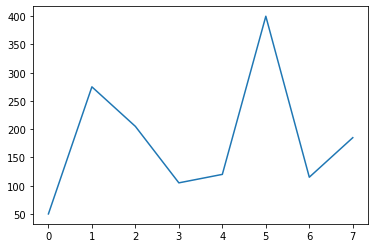

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 1.9244 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 1.9041 - acc: 0.9609
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 1.8768 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 1.8538 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.8404 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 1.8341 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 1.8319 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 1.8312 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 1.8309 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 1.8306 - acc: 0.7969
Epoch 11/32
128/128 [========

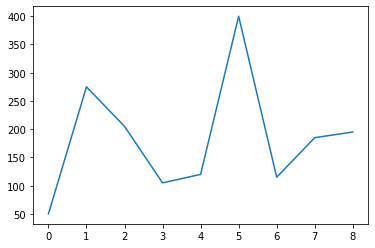

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 2.2317 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 2.2254 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 2.2170 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 2.2092 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 2.2027 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 2.1974 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 2.1932 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 2.1897 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 2.1868 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 2.1843 - acc: 0.8359
Epoch 11/32
128/128 [========

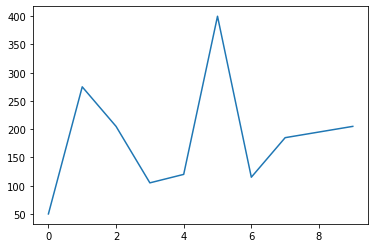

Epoch 1/32
128/128 [==============================] - 0s 573us/step - loss: 0.1309 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 580us/step - loss: 0.1297 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.1281 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.1269 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.1261 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 582us/step - loss: 0.1256 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.1252 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.1250 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.1249 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.1247 - acc: 0.9453
Epoch 11/32
128/128 [========

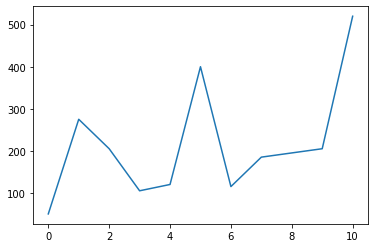

Epoch 1/32
128/128 [==============================] - 0s 605us/step - loss: 0.1343 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.1342 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.1339 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.1336 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 641us/step - loss: 0.1333 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 0.1329 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.1326 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.1324 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.1321 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.1319 - acc: 0.9141
Epoch 11/32
128/128 [========

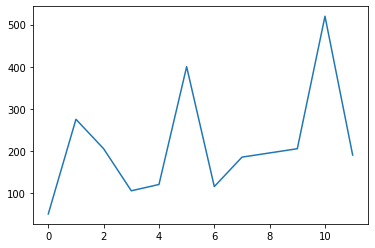

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 0.2614 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.2613 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.2612 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.2611 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 0.2609 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.2607 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.2605 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.2604 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.2602 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.2601 - acc: 0.9453
Epoch 11/32
128/128 [========

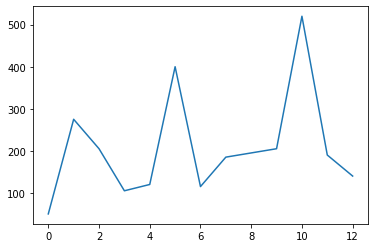

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0362 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.0362 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0361 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.0360 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0359 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.0357 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.0356 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.0355 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.0354 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.0354 - acc: 0.8828
Epoch 11/32
128/128 [========

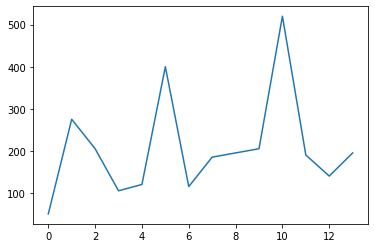

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.8190 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.8162 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.8123 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.8088 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.8062 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.8048 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.8040 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.8035 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.8032 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.8029 - acc: 0.8203
Epoch 11/32
128/128 [========

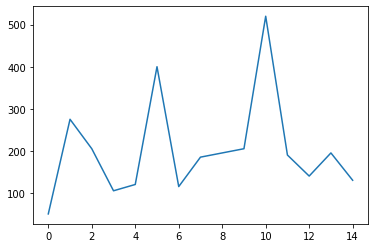

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 1.2072 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 1.2058 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.2043 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 1.2032 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.2024 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 1.2019 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.2017 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 1.2015 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 1.2014 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 1.2012 - acc: 0.9141
Epoch 11/32
128/128 [========

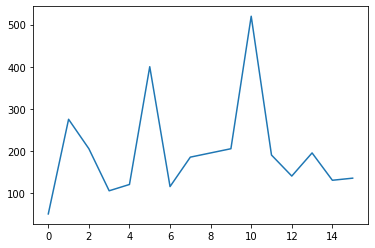

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 2.3530 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 2.3384 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 2.3203 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 2.3043 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 2.2927 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 2.2862 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 2.2840 - acc: 0.7891
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 2.2844 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 2.2854 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 2.2863 - acc: 0.7578
Epoch 11/32
128/128 [========

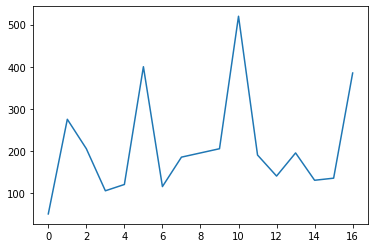

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 1.9137 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.9009 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.8805 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.8609 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.8479 - acc: 0.7656
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.8415 - acc: 0.7578
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 1.8385 - acc: 0.7109
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 1.8373 - acc: 0.7031
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.8369 - acc: 0.6953
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 1.8368 - acc: 0.7031
Epoch 11/32
128/128 [========

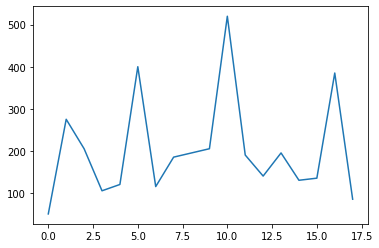

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.4501 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.4499 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.4495 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.4490 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.4484 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.4476 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.4465 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.4448 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 616us/step - loss: 0.4423 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.4383 - acc: 0.8594
Epoch 11/32
128/128 [========

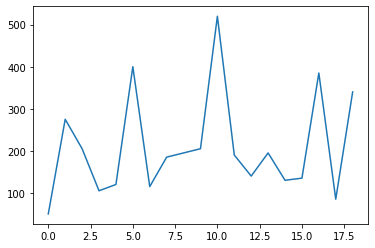

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 1.2277 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 1.2228 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 579us/step - loss: 1.2151 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 1.2072 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.2012 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.1974 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 1.1954 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 1.1944 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 1.1939 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 1.1936 - acc: 0.8125
Epoch 11/32
128/128 [========

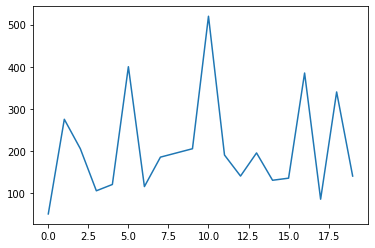

We are in the epoc:  30 Epsilon:  0.22593554099256583
Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.3195 - acc: 0.9766
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 1.3129 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.3053 - acc: 0.9844
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 1.2994 - acc: 0.9844
Epoch 5/32
128/128 [==============================] - 0s 614us/step - loss: 1.2950 - acc: 0.9688
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.2918 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.2896 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 1.2884 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 588us/step - loss: 1.2878 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 603us/step - lo

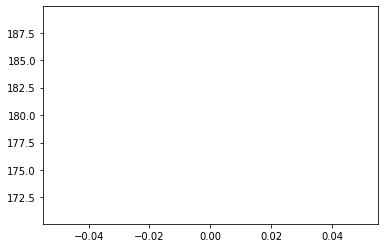

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 1.1634 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.1558 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 582us/step - loss: 1.1455 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 1.1369 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 1.1320 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.1298 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.1290 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 1.1286 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 1.1281 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 1.1276 - acc: 0.8828
Epoch 11/32
128/128 [========

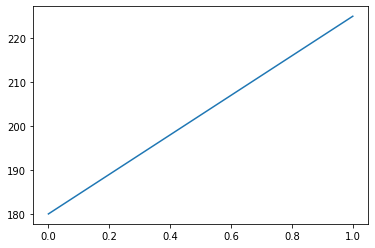

Epoch 1/32
128/128 [==============================] - 0s 571us/step - loss: 2.0091 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 577us/step - loss: 2.0045 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.9978 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 1.9906 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.9844 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.9800 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 582us/step - loss: 1.9770 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 1.9751 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.9739 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.9731 - acc: 0.9219
Epoch 11/32
128/128 [========

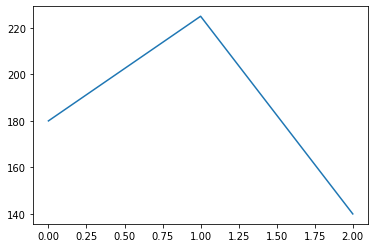

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.1631 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 0.1630 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1627 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.1625 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.1622 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.1621 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.1619 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.1617 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 576us/step - loss: 0.1616 - acc: 0.9531
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.1614 - acc: 0.9531
Epoch 11/32
128/128 [========

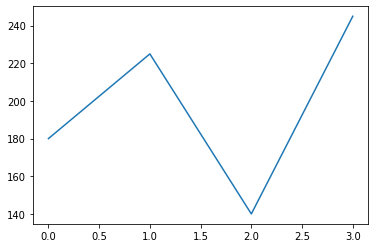

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.1226 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.1225 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.1224 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.1222 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.1220 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.1218 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.1217 - acc: 0.9609
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.1215 - acc: 0.9609
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.1214 - acc: 0.9688
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.1213 - acc: 0.9766
Epoch 11/32
128/128 [========

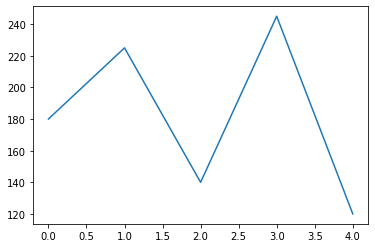

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 2.5068 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 2.4948 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 2.4773 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 2.4648 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 2.4596 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 2.4576 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 2.4566 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 2.4560 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 2.4555 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 2.4552 - acc: 0.9297
Epoch 11/32
128/128 [========

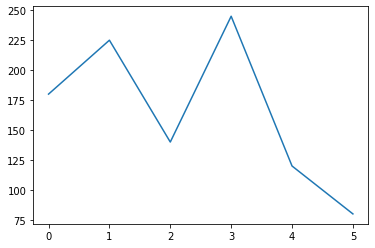

Epoch 1/32
128/128 [==============================] - 0s 573us/step - loss: 0.1333 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.1331 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 0.1329 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.1327 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 0.1324 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.1322 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.1320 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.1318 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.1317 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.1316 - acc: 0.9375
Epoch 11/32
128/128 [========

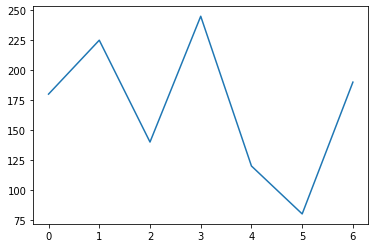

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 1.1802 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 1.1736 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 1.1607 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 1.1469 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.1412 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 1.1408 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.1413 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 1.1413 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 1.1407 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.1397 - acc: 0.8438
Epoch 11/32
128/128 [========

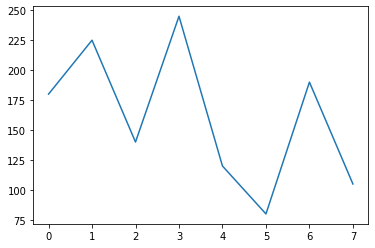

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.3209 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 636us/step - loss: 1.3153 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 1.3083 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.3032 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.3007 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 613us/step - loss: 1.2999 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 1.2997 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 1.2995 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.2991 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 1.2986 - acc: 0.8984
Epoch 11/32
128/128 [========

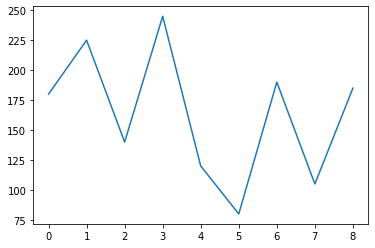

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.5597 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 624us/step - loss: 0.5588 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.5564 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.5491 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 0.5297 - acc: 0.9609
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.5129 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.5095 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 621us/step - loss: 0.5091 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.5091 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.5092 - acc: 0.8906
Epoch 11/32
128/128 [========

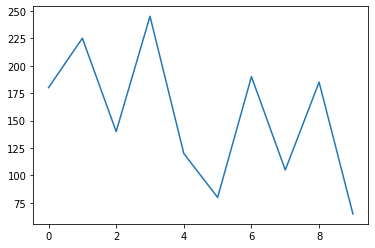

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.3581 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.3568 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.3547 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.3520 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.3491 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.3463 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.3438 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.3418 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.3404 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.3395 - acc: 0.9141
Epoch 11/32
128/128 [========

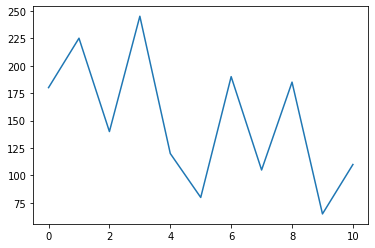

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.2934 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.2909 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.2876 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.2845 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.2821 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 580us/step - loss: 0.2805 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 631us/step - loss: 0.2795 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.2789 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.2786 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.2783 - acc: 0.8594
Epoch 11/32
128/128 [========

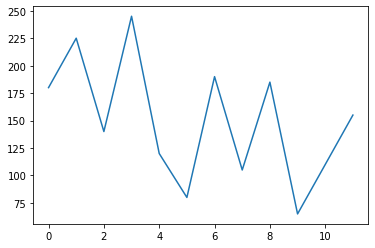

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 1.0356 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.0307 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.0240 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.0175 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 1.0123 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.0087 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.0065 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 618us/step - loss: 1.0052 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.0044 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 1.0040 - acc: 0.9297
Epoch 11/32
128/128 [========

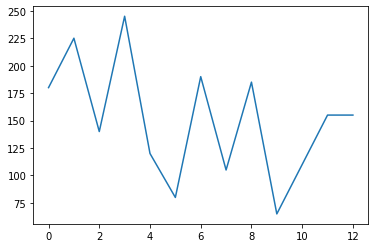

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.6405 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.6402 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.6397 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.6392 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.6386 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.6382 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 631us/step - loss: 0.6377 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 617us/step - loss: 0.6374 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.6371 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 579us/step - loss: 0.6368 - acc: 0.8828
Epoch 11/32
128/128 [========

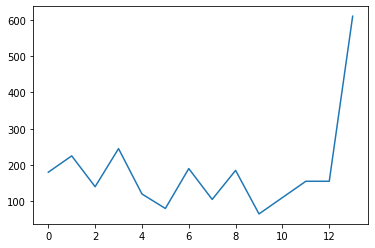

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.5553 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 619us/step - loss: 0.5545 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.5533 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.5517 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.5503 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.5491 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.5484 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.5480 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.5477 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 615us/step - loss: 0.5476 - acc: 0.9453
Epoch 11/32
128/128 [========

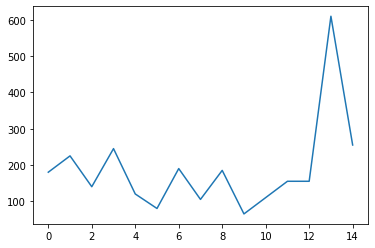

Epoch 1/32
128/128 [==============================] - 0s 567us/step - loss: 0.3157 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.3145 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.3117 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.3060 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.2989 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.2953 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.2949 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.2954 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.2959 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.2961 - acc: 0.8828
Epoch 11/32
128/128 [========

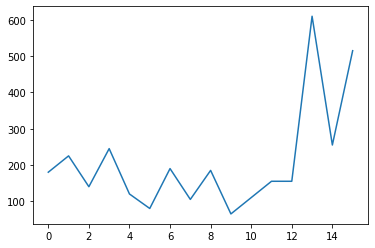

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.5129 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 0.5128 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.5126 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.5124 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.5122 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.5119 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.5118 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.5116 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.5114 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 0.5113 - acc: 0.9141
Epoch 11/32
128/128 [========

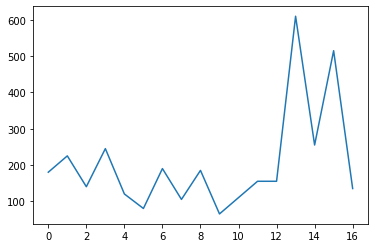

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0681 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.0676 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 619us/step - loss: 0.0667 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0657 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0647 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.0637 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.0629 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.0623 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.0619 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.0616 - acc: 0.9453
Epoch 11/32
128/128 [========

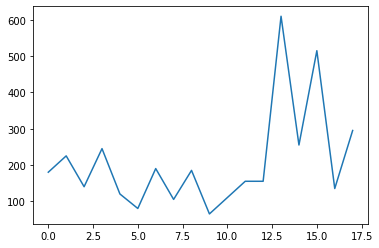

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.6261 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.6241 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.6212 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.6182 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.6154 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.6131 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.6112 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 623us/step - loss: 0.6097 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.6085 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.6076 - acc: 0.8984
Epoch 11/32
128/128 [========

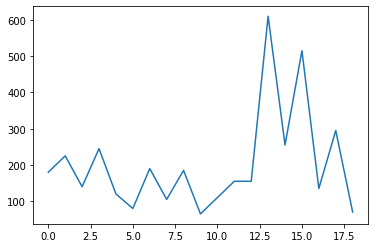

Epoch 1/32
128/128 [==============================] - 0s 562us/step - loss: 0.7846 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.7791 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.7721 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.7673 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.7651 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.7642 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.7638 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.7637 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.7635 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.7633 - acc: 0.8359
Epoch 11/32
128/128 [========

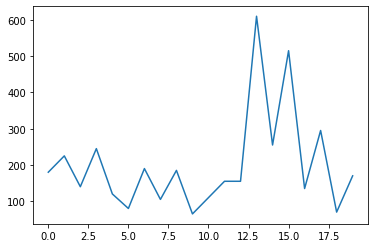

We are in the epoc:  31 Epsilon:  0.21463876394293754
Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.4145 - acc: 0.7969
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.4144 - acc: 0.7969
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.4143 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 591us/step - loss: 0.4142 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.4141 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.4140 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.4139 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 619us/step - loss: 0.4138 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.4137 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 610us/step - lo

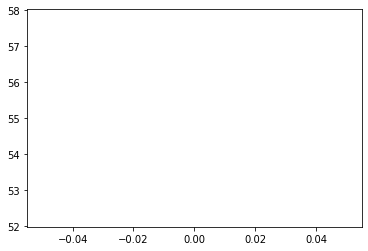

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.0335 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 0.0335 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 618us/step - loss: 0.0334 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.0334 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.0334 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0333 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.0333 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.0332 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 0.0332 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0332 - acc: 0.9219
Epoch 11/32
128/128 [========

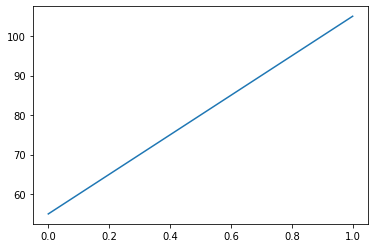

Epoch 1/32
128/128 [==============================] - 0s 614us/step - loss: 1.2189 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 1.2131 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 1.2064 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 617us/step - loss: 1.2018 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 1.1994 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 1.1982 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 620us/step - loss: 1.1977 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 618us/step - loss: 1.1974 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 618us/step - loss: 1.1971 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 621us/step - loss: 1.1969 - acc: 0.8359
Epoch 11/32
128/128 [========

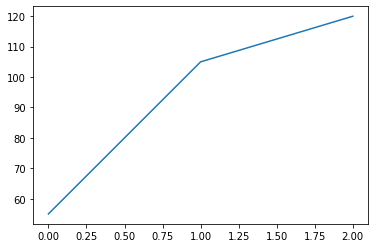

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.4232 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.4225 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.4214 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 0.4202 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 623us/step - loss: 0.4188 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.4175 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.4163 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 0.4153 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.4144 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.4138 - acc: 0.8516
Epoch 11/32
128/128 [========

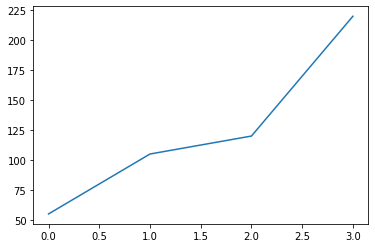

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 1.1270 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 1.1215 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 1.1150 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 1.1101 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.1073 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.1061 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 1.1056 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 1.1052 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.1048 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 1.1044 - acc: 0.8281
Epoch 11/32
128/128 [========

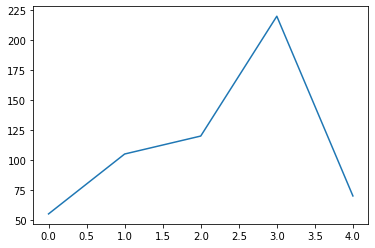

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.5516 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.5453 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.5408 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 0.5390 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.5384 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 0.5382 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 0.5381 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 620us/step - loss: 0.5380 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 632us/step - loss: 0.5378 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.5377 - acc: 0.8828
Epoch 11/32
128/128 [========

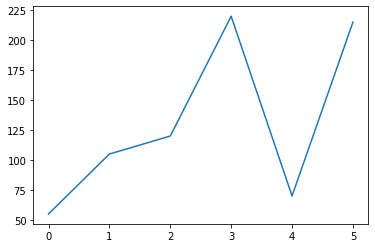

Epoch 1/32
128/128 [==============================] - 0s 605us/step - loss: 0.2860 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.2858 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.2855 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.2851 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.2848 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.2845 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.2842 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 651us/step - loss: 0.2840 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.2838 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.2837 - acc: 0.9141
Epoch 11/32
128/128 [========

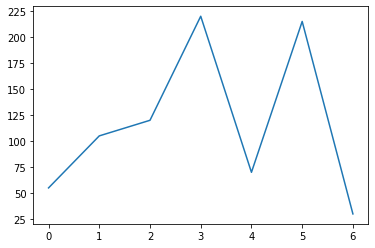

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.8503 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.8432 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.8342 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.8265 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.8214 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.8180 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.8156 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.8138 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.8125 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.8115 - acc: 0.8203
Epoch 11/32
128/128 [========

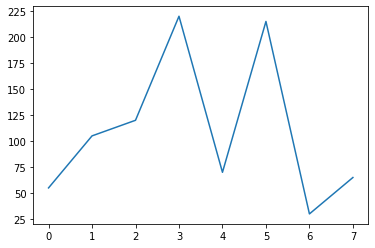

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.0369 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.0364 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.0359 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0354 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.0351 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.0349 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0348 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0347 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.0346 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.0345 - acc: 0.8984
Epoch 11/32
128/128 [========

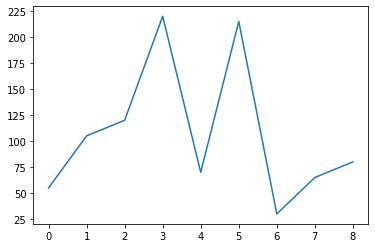

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 1.0775 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.0759 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 1.0741 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.0728 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.0721 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 1.0716 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 582us/step - loss: 1.0714 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 1.0711 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.0709 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.0706 - acc: 0.8750
Epoch 11/32
128/128 [========

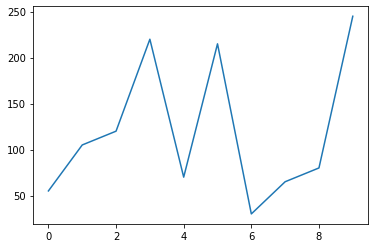

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 1.5391 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 1.5245 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 1.5147 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 1.5125 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.5128 - acc: 0.7891
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 1.5132 - acc: 0.7891
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 1.5130 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 1.5123 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 1.5113 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 618us/step - loss: 1.5103 - acc: 0.8828
Epoch 11/32
128/128 [========

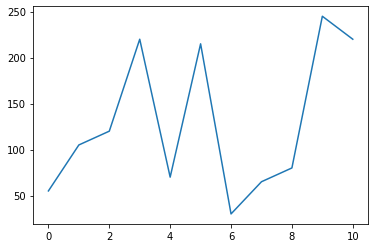

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.6564 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.6544 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.6519 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 0.6499 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.6487 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 615us/step - loss: 0.6481 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.6477 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.6474 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.6471 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.6469 - acc: 0.8906
Epoch 11/32
128/128 [========

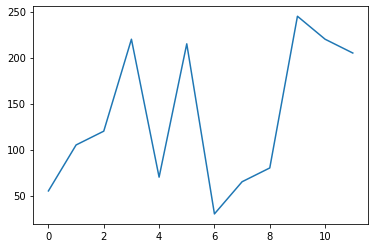

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 0.5533 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.5531 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.5526 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 610us/step - loss: 0.5521 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.5516 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.5511 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.5506 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.5501 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.5495 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.5490 - acc: 0.8359
Epoch 11/32
128/128 [========

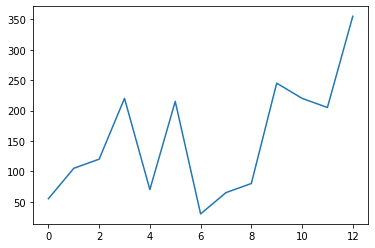

Epoch 1/32
128/128 [==============================] - 0s 563us/step - loss: 1.3615 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.3615 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 1.3613 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 1.3612 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 1.3610 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 1.3608 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.3606 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 633us/step - loss: 1.3604 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.3602 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 620us/step - loss: 1.3600 - acc: 0.9297
Epoch 11/32
128/128 [========

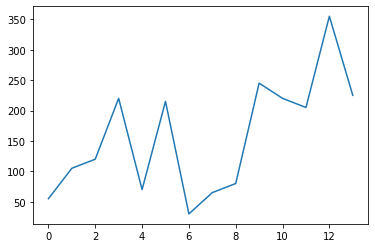

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 1.5995 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 588us/step - loss: 1.5954 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 1.5919 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 1.5900 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 1.5888 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.5881 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 621us/step - loss: 1.5876 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.5872 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 1.5868 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 1.5864 - acc: 0.8672
Epoch 11/32
128/128 [========

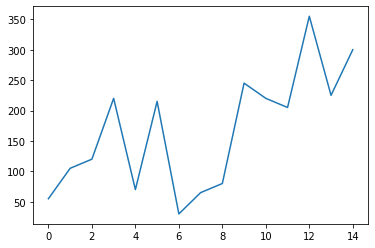

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 0.4618 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.4580 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.4538 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.4513 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.4504 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.4501 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.4500 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.4499 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.4498 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.4497 - acc: 0.8828
Epoch 11/32
128/128 [========

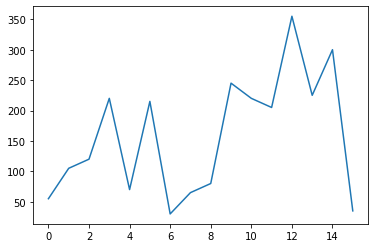

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 1.8729 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 1.8685 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.8612 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.8542 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 1.8500 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 1.8485 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 1.8483 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.8486 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 1.8489 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 1.8491 - acc: 0.8828
Epoch 11/32
128/128 [========

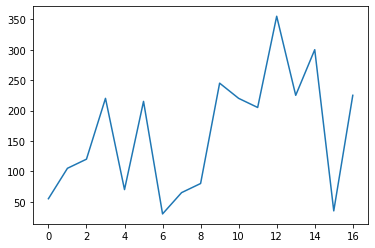

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.5239 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.5204 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 629us/step - loss: 0.5147 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.5083 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.5030 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.4997 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.4981 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.4974 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.4971 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.4969 - acc: 0.8281
Epoch 11/32
128/128 [========

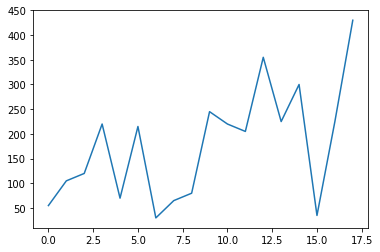

Epoch 1/32
128/128 [==============================] - 0s 569us/step - loss: 1.4781 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.4618 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 1.4482 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 581us/step - loss: 1.4424 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 584us/step - loss: 1.4404 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.4394 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 1.4387 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 1.4379 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 1.4371 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.4361 - acc: 0.8047
Epoch 11/32
128/128 [========

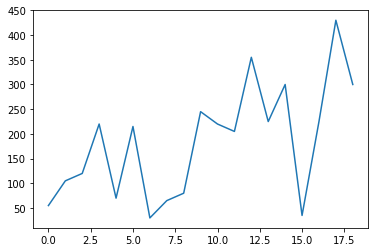

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.1682 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 1.1681 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.1680 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.1678 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 1.1677 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 617us/step - loss: 1.1675 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 1.1673 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 1.1672 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 1.1670 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 1.1669 - acc: 0.8672
Epoch 11/32
128/128 [========

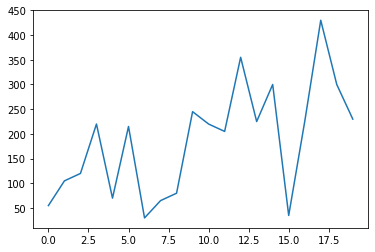

We are in the epoc:  32 Epsilon:  0.20390682574579067
Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.0026 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.0025 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.0025 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.0024 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0024 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0023 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0023 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0023 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 0.0022 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 589us/step - lo

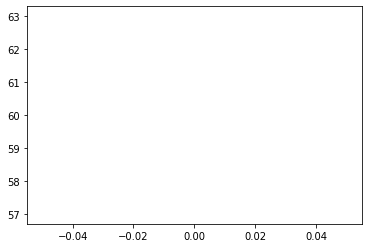

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.5205 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.5120 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.5023 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.4942 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.4884 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.4848 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.4829 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.4821 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.4816 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.4811 - acc: 0.8125
Epoch 11/32
128/128 [========

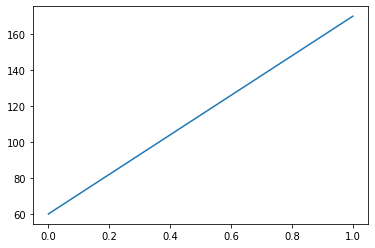

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 1.3212 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 1.3200 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 1.3184 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 1.3174 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 1.3167 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.3163 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 1.3161 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.3159 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 587us/step - loss: 1.3157 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 1.3156 - acc: 0.8750
Epoch 11/32
128/128 [========

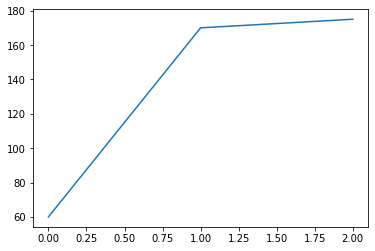

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.6115 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.6115 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.6115 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.6114 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.6113 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.6113 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.6112 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.6111 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.6111 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.6110 - acc: 0.9062
Epoch 11/32
128/128 [========

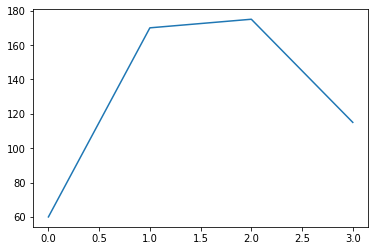

Epoch 1/32
128/128 [==============================] - 0s 597us/step - loss: 0.1313 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.1312 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 584us/step - loss: 0.1310 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 580us/step - loss: 0.1308 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.1306 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.1305 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.1305 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.1304 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 627us/step - loss: 0.1303 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.1302 - acc: 0.8594
Epoch 11/32
128/128 [========

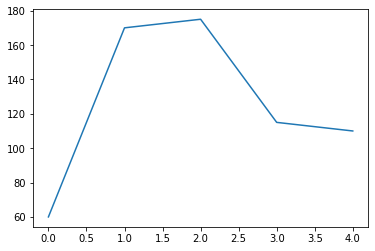

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.3583 - acc: 0.9688
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.3482 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.3371 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.3330 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.3317 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.3311 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.3306 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.3303 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.3300 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.3298 - acc: 0.9297
Epoch 11/32
128/128 [========

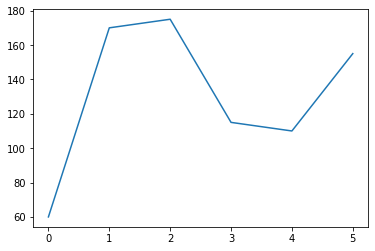

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0364 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 631us/step - loss: 0.0359 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.0352 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.0342 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.0332 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0323 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.0314 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.0308 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.0302 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.0298 - acc: 0.8672
Epoch 11/32
128/128 [========

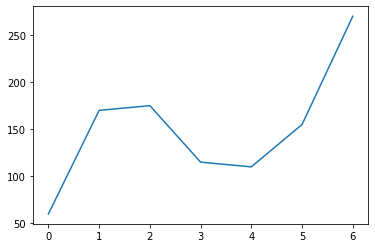

Epoch 1/32
128/128 [==============================] - 0s 562us/step - loss: 1.8157 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.8101 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 583us/step - loss: 1.8025 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 583us/step - loss: 1.7956 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.7910 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 1.7887 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 580us/step - loss: 1.7877 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 1.7874 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 573us/step - loss: 1.7873 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 622us/step - loss: 1.7871 - acc: 0.8359
Epoch 11/32
128/128 [========

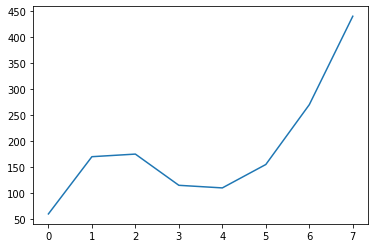

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.3223 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.3222 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.3220 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 603us/step - loss: 0.3218 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.3216 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.3214 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 588us/step - loss: 0.3213 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 588us/step - loss: 0.3211 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.3209 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.3208 - acc: 0.9141
Epoch 11/32
128/128 [========

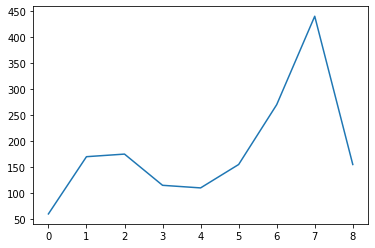

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.5285 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.5159 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.5034 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.4993 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 585us/step - loss: 0.4983 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.4981 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.4981 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.4982 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.4983 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.4983 - acc: 0.8047
Epoch 11/32
128/128 [========

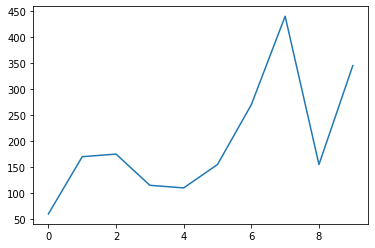

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.1674 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 1.1667 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 1.1658 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 1.1651 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 1.1646 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 1.1642 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 1.1639 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 1.1637 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 1.1636 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 1.1634 - acc: 0.9219
Epoch 11/32
128/128 [========

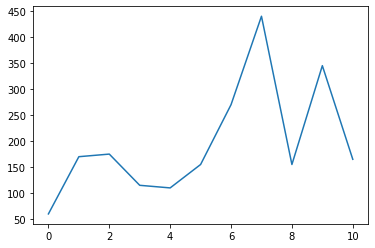

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.1397 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.1374 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.1339 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.1304 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.1279 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.1265 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.1259 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.1256 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.1254 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.1253 - acc: 0.8828
Epoch 11/32
128/128 [========

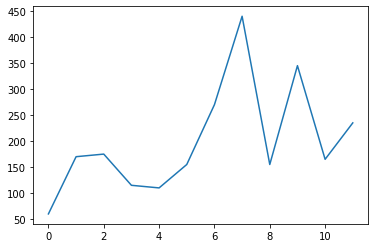

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.0346 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.0345 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0345 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.0344 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.0343 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.0342 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.0341 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.0340 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.0339 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.0338 - acc: 0.9219
Epoch 11/32
128/128 [========

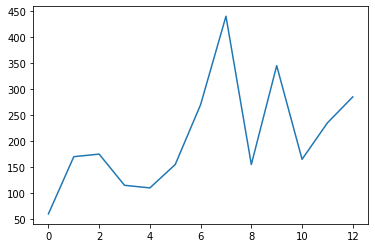

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.7905 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.7835 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.7764 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.7722 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.7703 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.7694 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.7690 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.7689 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.7687 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 0.7686 - acc: 0.8594
Epoch 11/32
128/128 [========

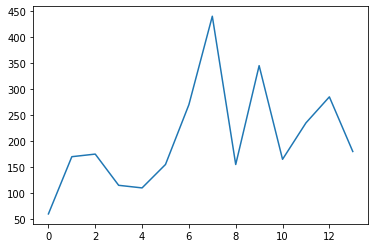

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.8170 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.8139 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.8077 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 0.7986 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.7905 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.7862 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.7843 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.7836 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.7833 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.7831 - acc: 0.8984
Epoch 11/32
128/128 [========

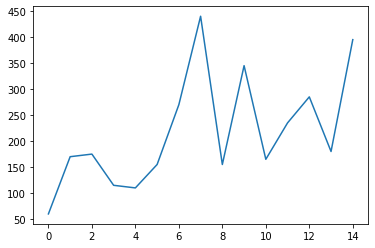

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 1.1473 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 1.1400 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.1306 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 1.1228 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 624us/step - loss: 1.1172 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 1.1132 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 1.1104 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 1.1086 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.1074 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 1.1068 - acc: 0.7812
Epoch 11/32
128/128 [========

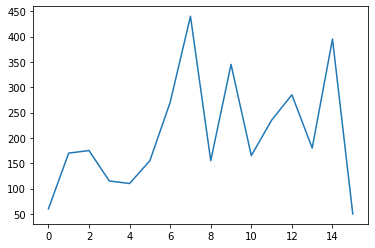

Epoch 1/32
128/128 [==============================] - 0s 564us/step - loss: 0.0072 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0071 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.0070 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0068 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.0067 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0065 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 0.0063 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0062 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.0060 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.0059 - acc: 0.8984
Epoch 11/32
128/128 [========

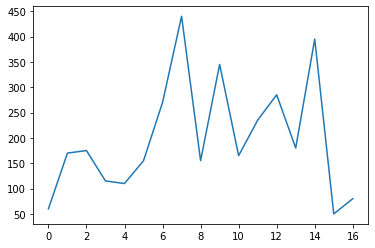

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.5207 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 0.5207 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.5205 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.5203 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.5201 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.5199 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.5197 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.5196 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.5194 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.5192 - acc: 0.8750
Epoch 11/32
128/128 [========

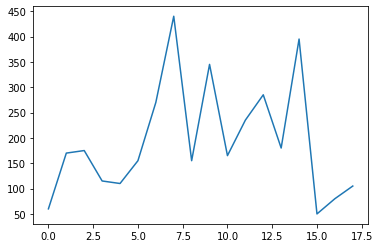

Epoch 1/32
128/128 [==============================] - 0s 570us/step - loss: 1.0674 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.0625 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 1.0578 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 1.0553 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 1.0544 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.0542 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.0543 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 1.0543 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.0542 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 1.0541 - acc: 0.7969
Epoch 11/32
128/128 [========

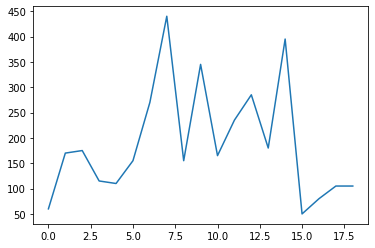

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.8391 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.8336 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.8283 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.8248 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 618us/step - loss: 0.8229 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.8219 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.8214 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.8211 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.8209 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.8208 - acc: 0.9062
Epoch 11/32
128/128 [========

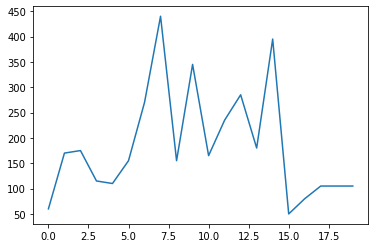

We are in the epoc:  33 Epsilon:  0.19371148445850114
Epoch 1/32
128/128 [==============================] - 0s 612us/step - loss: 0.9439 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 618us/step - loss: 0.9401 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.9348 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.9295 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.9256 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.9233 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 0.9224 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.9217 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.9211 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 610us/step - lo

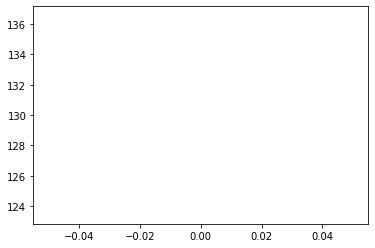

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 1.4575 - acc: 0.7812
Epoch 2/32
128/128 [==============================] - 0s 620us/step - loss: 1.4559 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 1.4541 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 629us/step - loss: 1.4528 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 1.4522 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 1.4519 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.4517 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 1.4517 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 1.4516 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 1.4515 - acc: 0.8828
Epoch 11/32
128/128 [========

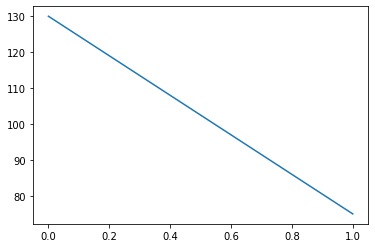

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.1293 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.1293 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 0.1293 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.1292 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.1292 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.1291 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.1291 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.1291 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.1290 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.1290 - acc: 0.8906
Epoch 11/32
128/128 [========

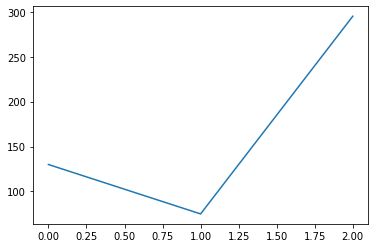

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.2922 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.2921 - acc: 0.9531
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.2921 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.2920 - acc: 0.9531
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.2919 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.2918 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.2917 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.2916 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.2915 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.2914 - acc: 0.9219
Epoch 11/32
128/128 [========

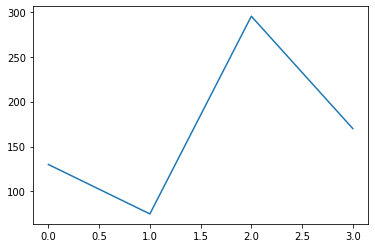

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.8445 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.8437 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 615us/step - loss: 0.8424 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.8409 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 0.8395 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.8382 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.8372 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.8365 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.8360 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.8356 - acc: 0.8984
Epoch 11/32
128/128 [========

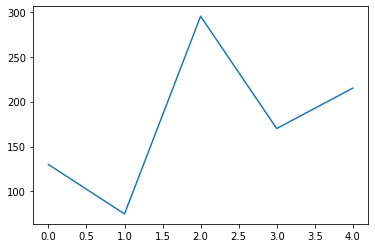

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.0358 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 621us/step - loss: 0.0357 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 0.0356 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 640us/step - loss: 0.0354 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 615us/step - loss: 0.0353 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0351 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 621us/step - loss: 0.0350 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 0.0350 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 621us/step - loss: 0.0349 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.0349 - acc: 0.9141
Epoch 11/32
128/128 [========

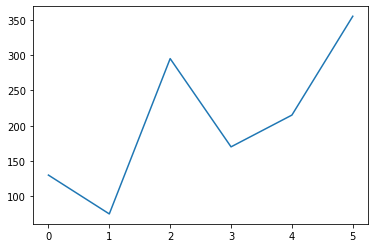

Epoch 1/32
128/128 [==============================] - 0s 613us/step - loss: 0.5207 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.5173 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.5113 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.5042 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.4979 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.4939 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 579us/step - loss: 0.4922 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.4917 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.4917 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.4918 - acc: 0.8359
Epoch 11/32
128/128 [========

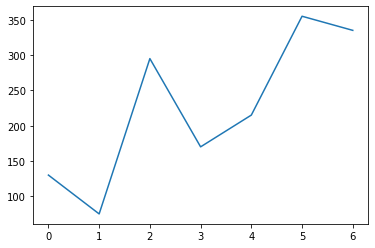

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.8088 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 0.8049 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 582us/step - loss: 0.7996 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.7942 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.7898 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.7867 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.7848 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 580us/step - loss: 0.7837 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 583us/step - loss: 0.7831 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 0.7827 - acc: 0.8047
Epoch 11/32
128/128 [========

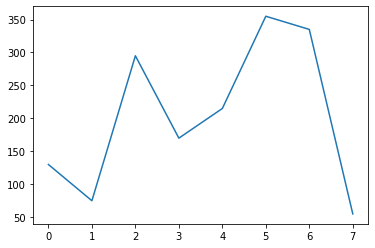

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.0666 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.0665 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0664 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 629us/step - loss: 0.0663 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.0661 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.0660 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.0659 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0658 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.0657 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.0656 - acc: 0.9453
Epoch 11/32
128/128 [========

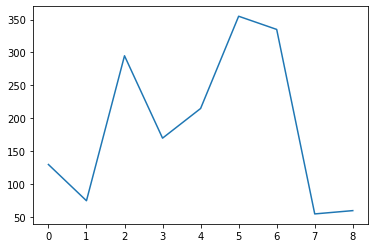

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.2950 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.2949 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.2948 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.2947 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.2946 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.2944 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.2943 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.2942 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.2941 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 621us/step - loss: 0.2940 - acc: 0.9375
Epoch 11/32
128/128 [========

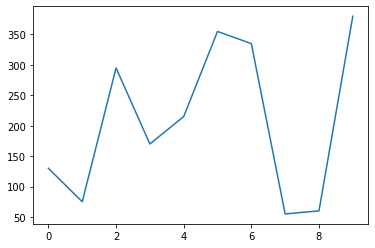

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.3899 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 586us/step - loss: 0.3886 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.3869 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.3855 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.3846 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.3840 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.3837 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 615us/step - loss: 0.3834 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 592us/step - loss: 0.3833 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.3831 - acc: 0.8359
Epoch 11/32
128/128 [========

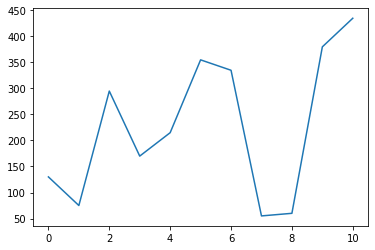

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 0.5200 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.5200 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.5199 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.5198 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.5197 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.5196 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.5195 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.5194 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.5193 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.5192 - acc: 0.9062
Epoch 11/32
128/128 [========

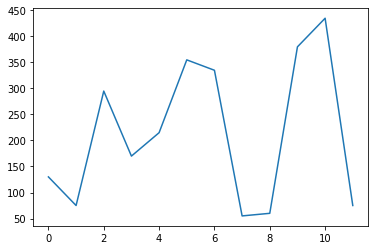

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.1367 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.1344 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.1312 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.1278 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.1251 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.1235 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.1225 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.1220 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 0.1217 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.1215 - acc: 0.8906
Epoch 11/32
128/128 [========

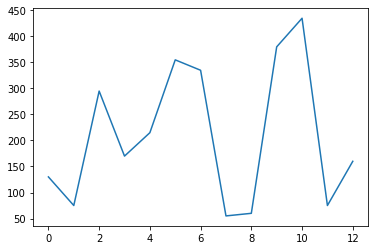

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 0.0299 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.0295 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.0291 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.0287 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.0283 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.0281 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.0280 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0279 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.0279 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0278 - acc: 0.8984
Epoch 11/32
128/128 [========

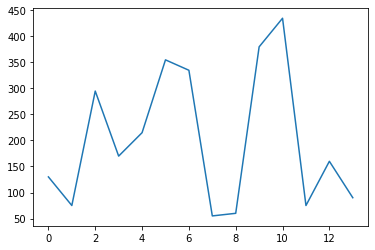

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.3223 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.3223 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.3222 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 592us/step - loss: 0.3221 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.3220 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.3219 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.3219 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.3218 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.3217 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.3217 - acc: 0.9531
Epoch 11/32
128/128 [========

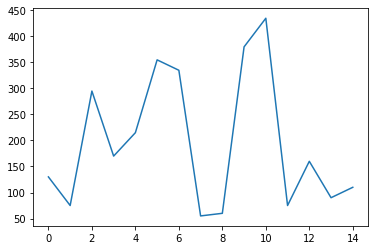

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.5520 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.5517 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.5512 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.5506 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 627us/step - loss: 0.5498 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.5490 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.5480 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.5470 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.5461 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.5452 - acc: 0.8594
Epoch 11/32
128/128 [========

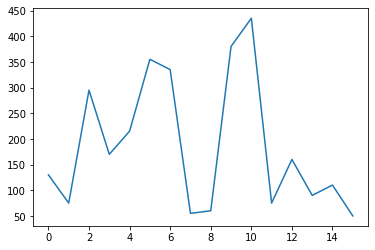

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 1.6184 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 1.6148 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 1.6094 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 1.6036 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 1.5992 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 1.5961 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.5942 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 1.5931 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.5924 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 1.5920 - acc: 0.8359
Epoch 11/32
128/128 [========

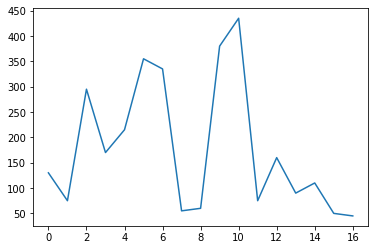

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.1281 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.1278 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.1272 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.1268 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.1264 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.1262 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.1260 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.1257 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.1255 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.1253 - acc: 0.9297
Epoch 11/32
128/128 [========

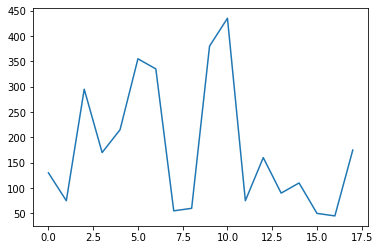

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.5210 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.5210 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.5208 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 586us/step - loss: 0.5207 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.5205 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.5204 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.5202 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.5201 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.5200 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 586us/step - loss: 0.5199 - acc: 0.9297
Epoch 11/32
128/128 [========

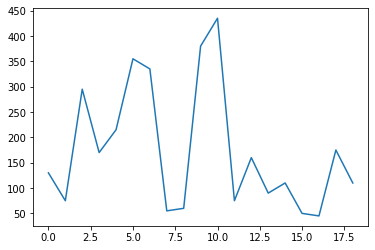

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.3563 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.3541 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.3514 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 622us/step - loss: 0.3491 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.3474 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.3462 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.3454 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.3448 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 617us/step - loss: 0.3444 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.3441 - acc: 0.9062
Epoch 11/32
128/128 [========

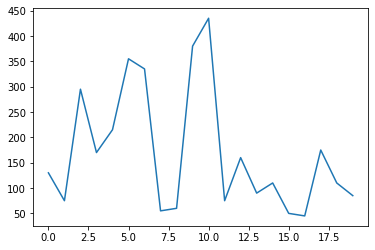

We are in the epoc:  34 Epsilon:  0.18402591023557607
Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.4501 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.4439 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.4396 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.4378 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.4370 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.4365 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.4361 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.4359 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.4358 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 600us/step - lo

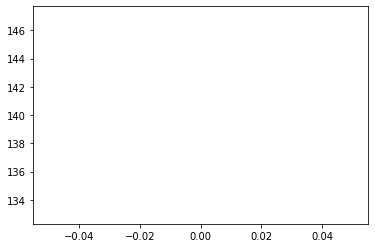

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.1345 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.1344 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 580us/step - loss: 0.1344 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.1343 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 0.1343 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.1342 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.1342 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.1341 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.1341 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.1340 - acc: 0.8281
Epoch 11/32
128/128 [========

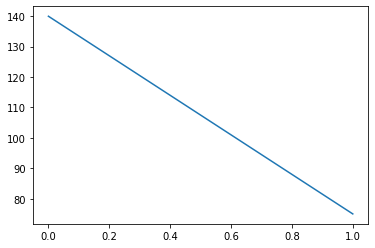

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.2930 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.2930 - acc: 0.7969
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.2929 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 1ms/step - loss: 0.2929 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 588us/step - loss: 0.2928 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.2928 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.2927 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.2927 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.2927 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.2926 - acc: 0.8203
Epoch 11/32
128/128 [==========

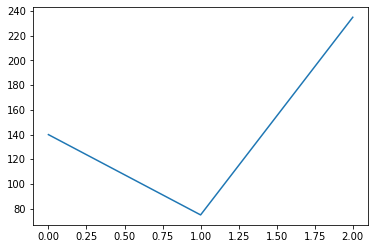

Epoch 1/32
128/128 [==============================] - 0s 607us/step - loss: 0.5044 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.5009 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.4956 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.4898 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.4848 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.4813 - acc: 0.8203
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.4793 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.4783 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.4779 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.4777 - acc: 0.8047
Epoch 11/32
128/128 [========

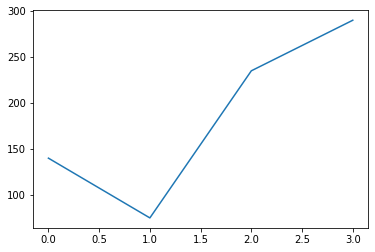

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.4493 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.4490 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.4485 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.4478 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 584us/step - loss: 0.4472 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.4465 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 0.4459 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.4454 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.4450 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.4447 - acc: 0.8516
Epoch 11/32
128/128 [========

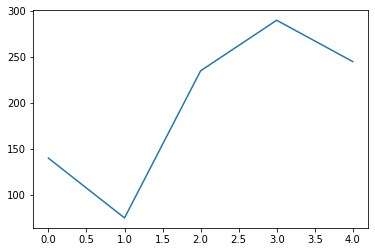

Epoch 1/32
128/128 [==============================] - 0s 609us/step - loss: 0.9634 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 623us/step - loss: 0.9604 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.9560 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 0.9515 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.9478 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.9456 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.9443 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.9436 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.9432 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.9429 - acc: 0.8828
Epoch 11/32
128/128 [========

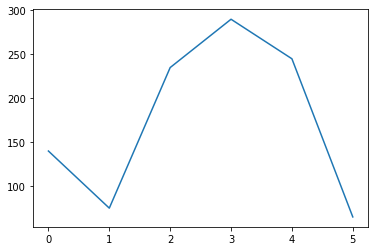

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.2581 - acc: 0.9609
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.2560 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.2541 - acc: 0.9609
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.2531 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 0.2527 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.2526 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.2525 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.2524 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.2523 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.2521 - acc: 0.9453
Epoch 11/32
128/128 [========

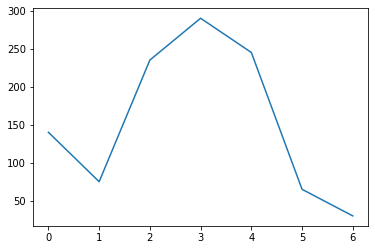

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.2590 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.2572 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.2542 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 585us/step - loss: 0.2510 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.2484 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.2469 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.2460 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.2456 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.2453 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.2450 - acc: 0.9453
Epoch 11/32
128/128 [========

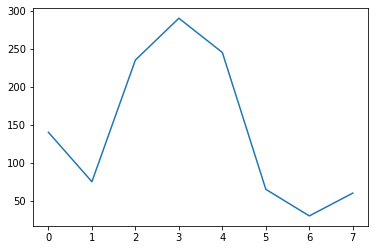

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 1.0650 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 1.0632 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.0604 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 1.0575 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 1.0553 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.0539 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.0532 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 618us/step - loss: 1.0528 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 1.0526 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.0523 - acc: 0.8672
Epoch 11/32
128/128 [========

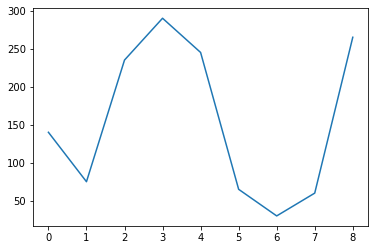

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.5826 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 608us/step - loss: 0.5825 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.5824 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.5822 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.5820 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 626us/step - loss: 0.5819 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.5817 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.5816 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.5815 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.5814 - acc: 0.8672
Epoch 11/32
128/128 [========

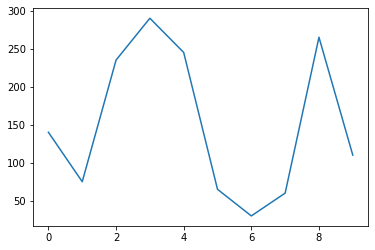

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0036 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0036 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.0035 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.0034 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0033 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.0032 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.0031 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0030 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.0030 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.0029 - acc: 0.9062
Epoch 11/32
128/128 [========

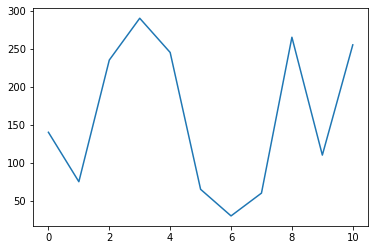

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.7759 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.7714 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 0.7666 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.7633 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.7616 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.7608 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 619us/step - loss: 0.7605 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.7604 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.7603 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.7601 - acc: 0.8594
Epoch 11/32
128/128 [========

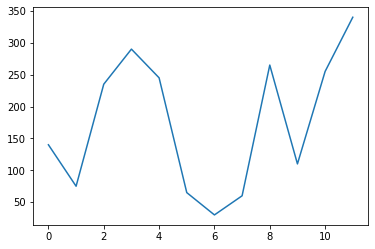

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.0337 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.0336 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.0336 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0335 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 0.0334 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.0333 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.0332 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 0.0332 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0331 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.0330 - acc: 0.8672
Epoch 11/32
128/128 [========

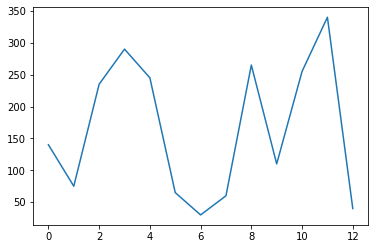

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.2919 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.2918 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.2918 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.2917 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.2916 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.2915 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.2915 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.2914 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 0.2913 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 0.2913 - acc: 0.8594
Epoch 11/32
128/128 [========

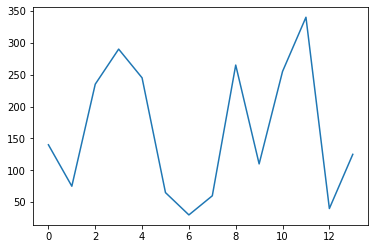

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.6761 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.6753 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.6738 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.6718 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.6694 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 0.6669 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.6648 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.6632 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.6622 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.6616 - acc: 0.7891
Epoch 11/32
128/128 [========

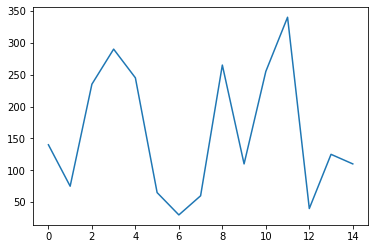

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.8936 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 581us/step - loss: 0.8878 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.8797 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.8704 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.8615 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.8550 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.8510 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.8491 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.8482 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.8477 - acc: 0.7734
Epoch 11/32
128/128 [========

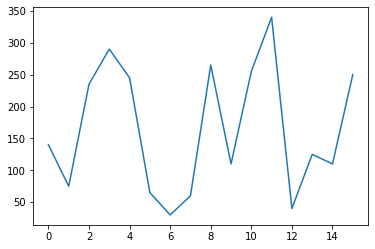

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 1.1340 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 583us/step - loss: 1.1331 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.1322 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 1.1316 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 1.1312 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 1.1309 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.1306 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 1.1304 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 1.1302 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 1.1301 - acc: 0.8281
Epoch 11/32
128/128 [========

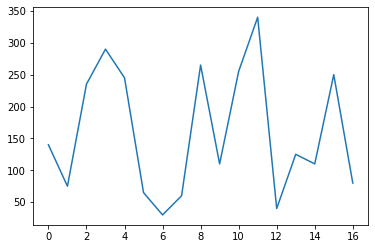

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 1.1264 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.1264 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 602us/step - loss: 1.1262 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 1.1260 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 1.1258 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 1.1256 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 1.1254 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.1253 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 1.1252 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 1.1251 - acc: 0.8594
Epoch 11/32
128/128 [========

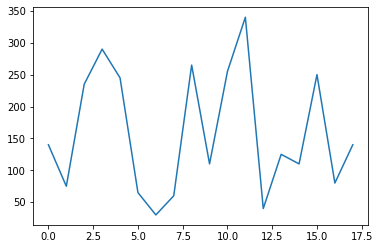

Epoch 1/32
128/128 [==============================] - 0s 568us/step - loss: 0.1615 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.1592 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.1562 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 0.1541 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.1531 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.1528 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 623us/step - loss: 0.1527 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 598us/step - loss: 0.1526 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.1525 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 0.1523 - acc: 0.8594
Epoch 11/32
128/128 [========

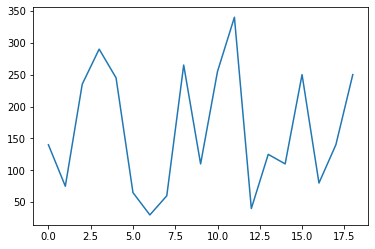

Epoch 1/32
128/128 [==============================] - 0s 575us/step - loss: 0.0340 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 611us/step - loss: 0.0339 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.0338 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 0.0336 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.0334 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.0333 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.0331 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0329 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 0.0328 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0326 - acc: 0.8984
Epoch 11/32
128/128 [========

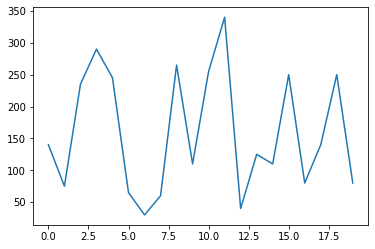

We are in the epoc:  35 Epsilon:  0.17482461472379726
Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 0.6133 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.6129 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 615us/step - loss: 0.6123 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.6115 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.6106 - acc: 0.8281
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.6097 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.6088 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.6081 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.6075 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 598us/step - lo

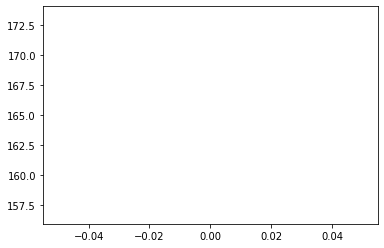

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.1622 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.1607 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 0.1583 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.1556 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.1532 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.1517 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 0.1508 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.1505 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.1503 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.1501 - acc: 0.8594
Epoch 11/32
128/128 [========

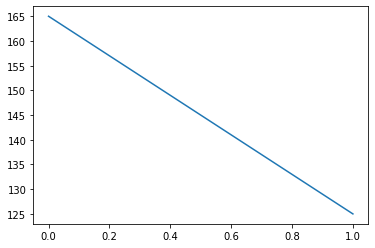

Epoch 1/32
128/128 [==============================] - 0s 607us/step - loss: 0.4472 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.4452 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.4425 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.4398 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.4375 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.4358 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 0.4347 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.4339 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.4334 - acc: 0.7891
Epoch 10/32
128/128 [==============================] - 0s 620us/step - loss: 0.4330 - acc: 0.7891
Epoch 11/32
128/128 [========

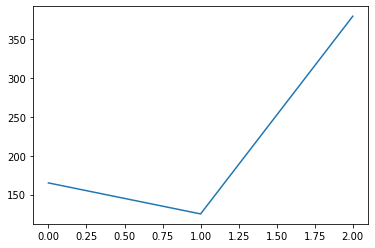

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 2.3647 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 2.3608 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 2.3558 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 2.3513 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 2.3480 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 2.3459 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 2.3449 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 2.3443 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 2.3440 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 2.3438 - acc: 0.9219
Epoch 11/32
128/128 [========

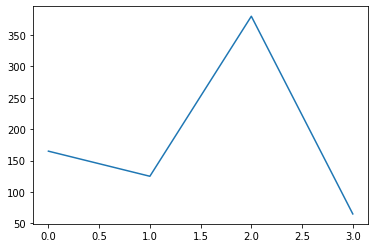

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 1.8184 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 1.8047 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 617us/step - loss: 1.7920 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 1.7864 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.7850 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.7847 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 1.7843 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.7835 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 1.7824 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 1.7813 - acc: 0.8984
Epoch 11/32
128/128 [========

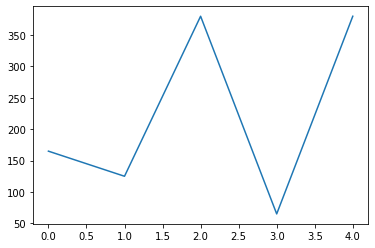

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.0087 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 0.0086 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.0085 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.0083 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0081 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.0079 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.0077 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.0076 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.0074 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.0073 - acc: 0.9062
Epoch 11/32
128/128 [========

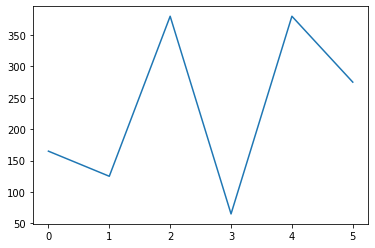

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.8431 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.8428 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.8422 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.8415 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.8407 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.8399 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.8393 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.8388 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.8386 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.8384 - acc: 0.9062
Epoch 11/32
128/128 [========

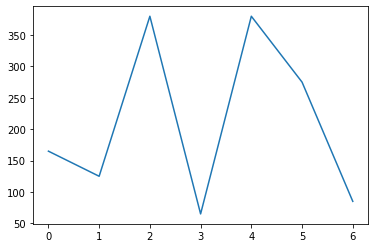

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.9073 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.8993 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.8913 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.8866 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.8848 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.8842 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 620us/step - loss: 0.8841 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 617us/step - loss: 0.8841 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.8842 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.8842 - acc: 0.8750
Epoch 11/32
128/128 [========

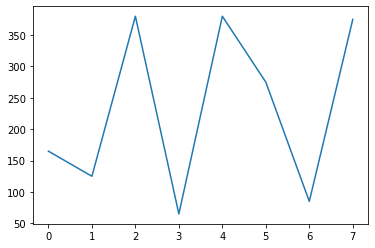

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.0054 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.0053 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0052 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.0050 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.0048 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.0047 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.0045 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.0043 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.0042 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.0041 - acc: 0.8828
Epoch 11/32
128/128 [========

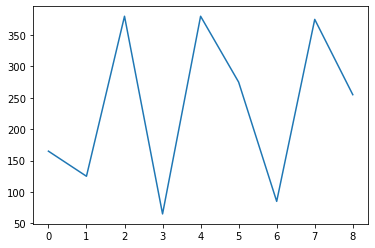

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.0050 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.0049 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.0048 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.0046 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.0045 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.0043 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 0.0041 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.0040 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 614us/step - loss: 0.0038 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 619us/step - loss: 0.0037 - acc: 0.8672
Epoch 11/32
128/128 [========

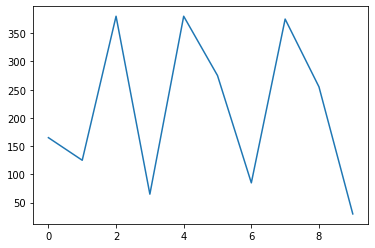

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 1.0576 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.0550 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 1.0516 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 1.0484 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 1.0460 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 1.0445 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.0436 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 1.0431 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.0429 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 604us/step - loss: 1.0426 - acc: 0.8359
Epoch 11/32
128/128 [========

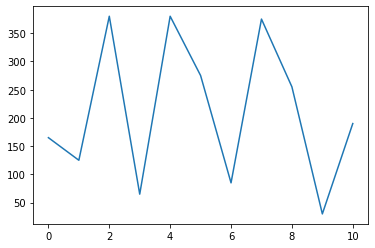

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.4410 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.4393 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.4373 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.4355 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 636us/step - loss: 0.4340 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 623us/step - loss: 0.4327 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.4314 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 0.4300 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.4283 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.4264 - acc: 0.8125
Epoch 11/32
128/128 [========

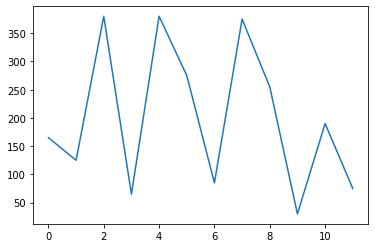

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.1697 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.1682 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 614us/step - loss: 0.1657 - acc: 0.9531
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.1627 - acc: 0.9609
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.1597 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.1573 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.1559 - acc: 0.9453
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.1552 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.1548 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.1546 - acc: 0.9219
Epoch 11/32
128/128 [========

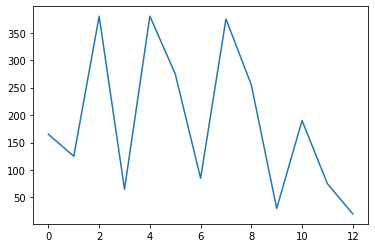

Epoch 1/32
128/128 [==============================] - 0s 585us/step - loss: 0.0355 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 582us/step - loss: 0.0354 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 587us/step - loss: 0.0352 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 0.0351 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.0349 - acc: 0.9375
Epoch 6/32
128/128 [==============================] - 0s 582us/step - loss: 0.0347 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.0346 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 564us/step - loss: 0.0345 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.0344 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.0343 - acc: 0.9062
Epoch 11/32
128/128 [========

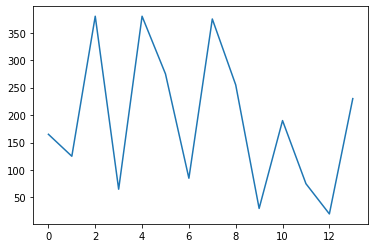

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.2946 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.2945 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 615us/step - loss: 0.2944 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.2943 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.2941 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.2939 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 0.2938 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.2936 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.2935 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.2934 - acc: 0.8672
Epoch 11/32
128/128 [========

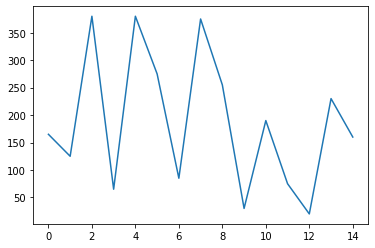

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 52.1795 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 52.1345 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 52.0655 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 51.9861 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 618us/step - loss: 51.9241 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 51.8886 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 51.8731 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 51.8686 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 51.8678 - acc: 0.7656
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 51.8679 - acc: 0.7656
Epoch 11/32
128/128

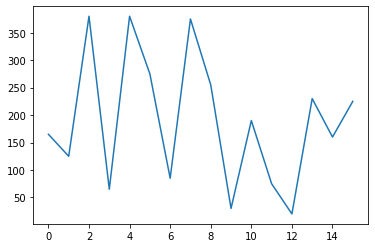

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.0376 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.0374 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.0371 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.0368 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 591us/step - loss: 0.0366 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 0.0363 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 596us/step - loss: 0.0361 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.0359 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0358 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0357 - acc: 0.8750
Epoch 11/32
128/128 [========

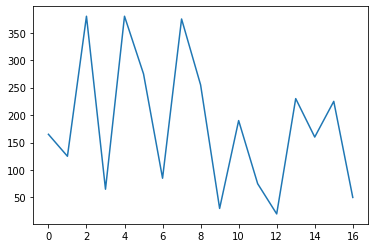

Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.8794 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.8775 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 0.8749 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.8721 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.8694 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.8672 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.8657 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 0.8647 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.8640 - acc: 0.8828
Epoch 11/32
128/128 [==============================] - 0s 599us/step - loss: 0.8635 - acc: 0.8828
Epoch 12/32
128/128 [=======

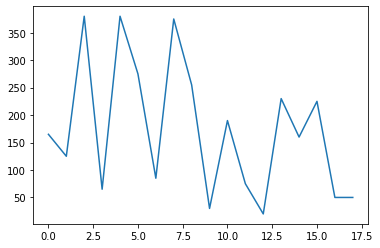

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.4433 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.4326 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 610us/step - loss: 0.4180 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.4079 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 0.4041 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.4036 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.4037 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.4037 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 625us/step - loss: 0.4034 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.4030 - acc: 0.8750
Epoch 11/32
128/128 [========

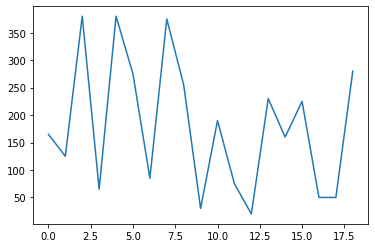

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 0.1388 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.1345 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 609us/step - loss: 0.1288 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 614us/step - loss: 0.1253 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.1242 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.1237 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.1233 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.1227 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.1221 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 583us/step - loss: 0.1217 - acc: 0.8984
Epoch 11/32
128/128 [========

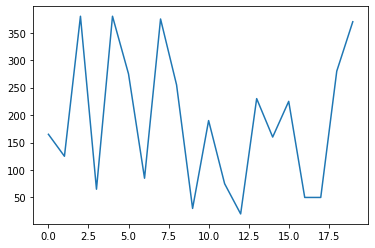

We are in the epoc:  36 Epsilon:  0.16608338398760739
Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 1.1581 - acc: 0.9844
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.1476 - acc: 0.9688
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.1339 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.1225 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 1.1156 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 1.1124 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 1.1110 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 1.1104 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 1.1101 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 604us/step - lo

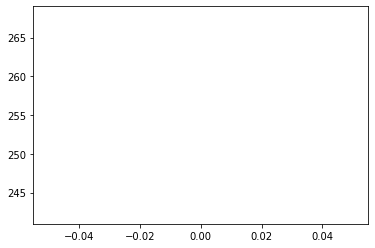

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.1227 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.1216 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.1206 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 585us/step - loss: 0.1199 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.1195 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 593us/step - loss: 0.1192 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 592us/step - loss: 0.1190 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.1188 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.1186 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.1185 - acc: 0.9297
Epoch 11/32
128/128 [========

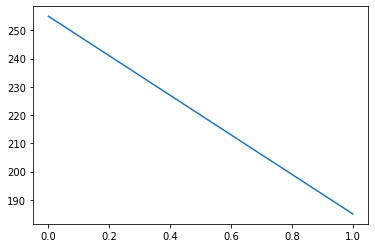

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.6729 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.6652 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.6549 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.6477 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.6445 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.6436 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 607us/step - loss: 0.6434 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 609us/step - loss: 0.6433 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.6433 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.6431 - acc: 0.8438
Epoch 11/32
128/128 [========

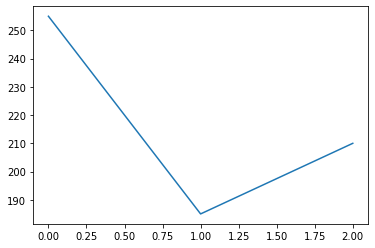

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.0036 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 626us/step - loss: 0.0035 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 0.0034 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.0032 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0031 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.0030 - acc: 0.9375
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.0029 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0028 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.0027 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.0026 - acc: 0.9453
Epoch 11/32
128/128 [========

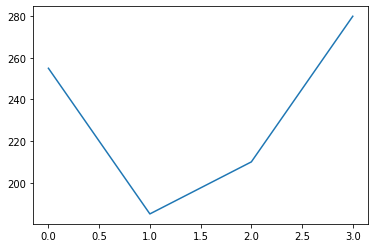

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.0033 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0032 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 615us/step - loss: 0.0031 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0029 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0028 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 588us/step - loss: 0.0026 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.0024 - acc: 0.9375
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.0023 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.0022 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0021 - acc: 0.9375
Epoch 11/32
128/128 [========

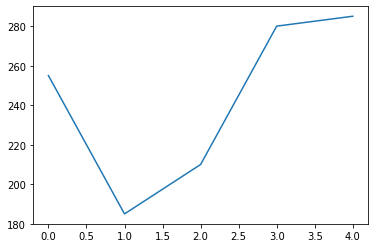

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 1.1226 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 1.1074 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.0926 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 1.0824 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 1.0767 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 1.0747 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.0741 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 1.0737 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.0730 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 1.0721 - acc: 0.8594
Epoch 11/32
128/128 [========

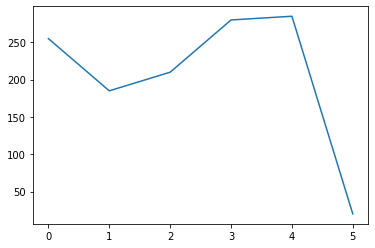

Epoch 1/32
128/128 [==============================] - 0s 592us/step - loss: 1.1622 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 1.1621 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.1620 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.1619 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 1.1618 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 1.1616 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 597us/step - loss: 1.1615 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 1.1613 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 1.1612 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 1.1611 - acc: 0.8984
Epoch 11/32
128/128 [========

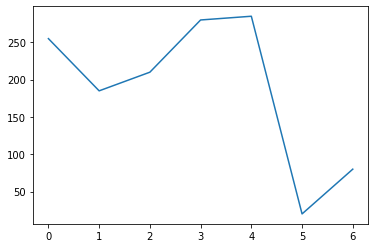

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.0934 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.0928 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.0920 - acc: 0.9375
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.0914 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 584us/step - loss: 0.0909 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.0906 - acc: 0.9453
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.0904 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.0903 - acc: 0.9453
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.0902 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0900 - acc: 0.9531
Epoch 11/32
128/128 [========

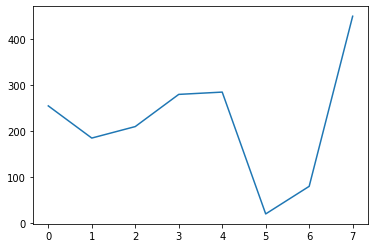

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 1.4107 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.4086 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.4058 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 619us/step - loss: 1.4030 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 1.4008 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 1.3991 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.3981 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 1.3974 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 608us/step - loss: 1.3969 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 1.3965 - acc: 0.8203
Epoch 11/32
128/128 [========

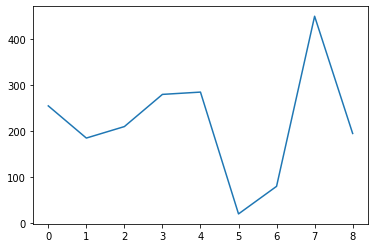

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 1.3635 - acc: 0.9219
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 1.3601 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 576us/step - loss: 1.3573 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 580us/step - loss: 1.3555 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 626us/step - loss: 1.3542 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 585us/step - loss: 1.3531 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 1.3520 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 582us/step - loss: 1.3511 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 581us/step - loss: 1.3503 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 1.3498 - acc: 0.8672
Epoch 11/32
128/128 [========

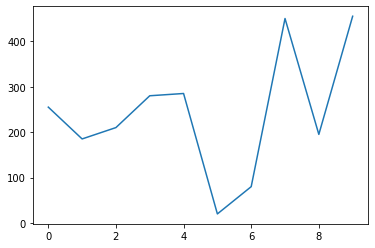

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 1.3108 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 617us/step - loss: 1.3016 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 1.2926 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.2877 - acc: 0.9297
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 1.2856 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 1.2848 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.2844 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 612us/step - loss: 1.2841 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 1.2839 - acc: 0.9219
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 1.2837 - acc: 0.9297
Epoch 11/32
128/128 [========

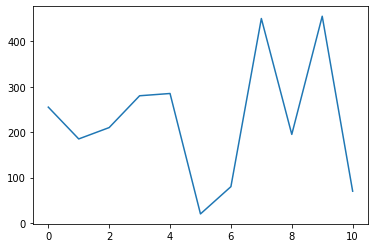

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.9678 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 615us/step - loss: 0.9655 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.9628 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.9608 - acc: 0.9219
Epoch 5/32
128/128 [==============================] - 0s 622us/step - loss: 0.9595 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 0.9587 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.9582 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.9579 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.9576 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 591us/step - loss: 0.9574 - acc: 0.8516
Epoch 11/32
128/128 [========

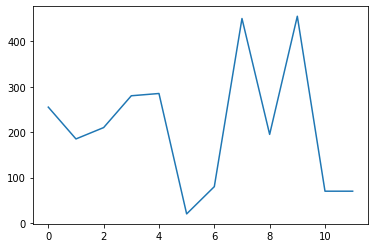

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.5702 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 601us/step - loss: 0.5668 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 589us/step - loss: 0.5603 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.5508 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.5409 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.5339 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.5302 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 0.5285 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 620us/step - loss: 0.5278 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.5275 - acc: 0.8047
Epoch 11/32
128/128 [========

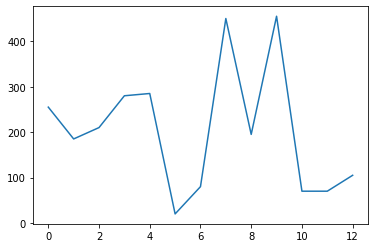

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 0.8262 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.8235 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.8201 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.8167 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.8140 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 606us/step - loss: 0.8122 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.8110 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 0.8103 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.8098 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 0.8094 - acc: 0.8516
Epoch 11/32
128/128 [========

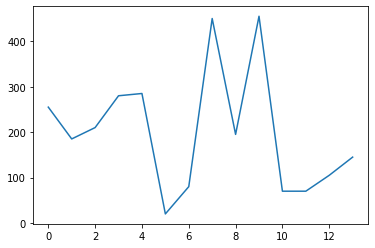

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 1.1799 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 621us/step - loss: 1.1739 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 1.1641 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 1.1525 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 1.1431 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.1374 - acc: 0.7344
Epoch 7/32
128/128 [==============================] - 0s 605us/step - loss: 1.1345 - acc: 0.7266
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 1.1330 - acc: 0.7109
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 1.1322 - acc: 0.7109
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 1.1315 - acc: 0.7188
Epoch 11/32
128/128 [========

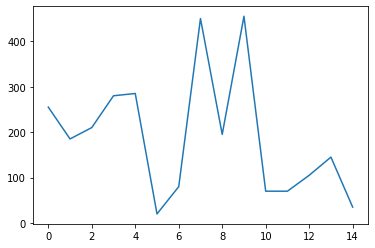

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.8510 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.8498 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.8475 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 616us/step - loss: 0.8436 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 598us/step - loss: 0.8382 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.8321 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.8265 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.8221 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.8191 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.8171 - acc: 0.8281
Epoch 11/32
128/128 [========

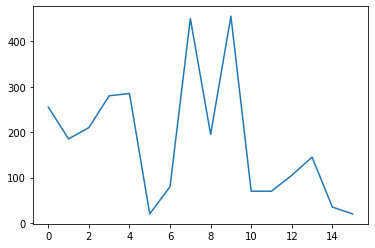

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.0078 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.0077 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 605us/step - loss: 0.0076 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.0074 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 0.0073 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 617us/step - loss: 0.0071 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.0070 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.0068 - acc: 0.9219
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.0066 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.0065 - acc: 0.9062
Epoch 11/32
128/128 [========

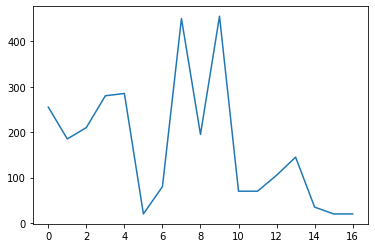

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.9640 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.9535 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.9393 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 0.9273 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 605us/step - loss: 0.9212 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.9190 - acc: 0.7656
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.9183 - acc: 0.7500
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 0.9180 - acc: 0.7422
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.9176 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.9171 - acc: 0.7422
Epoch 11/32
128/128 [========

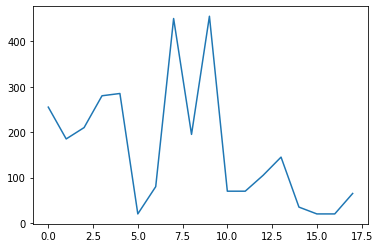

Epoch 1/32
128/128 [==============================] - 0s 570us/step - loss: 0.0361 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0357 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 582us/step - loss: 0.0351 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 590us/step - loss: 0.0344 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 586us/step - loss: 0.0338 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 609us/step - loss: 0.0333 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 589us/step - loss: 0.0330 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.0327 - acc: 0.8359
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.0324 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.0321 - acc: 0.8438
Epoch 11/32
128/128 [========

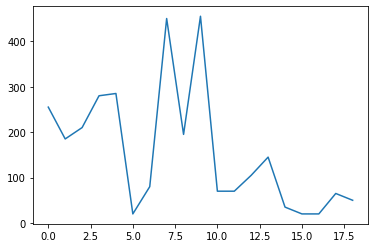

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 52.3130 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 585us/step - loss: 52.2862 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 52.2637 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 605us/step - loss: 52.2485 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 597us/step - loss: 52.2393 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 52.2347 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 52.2330 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 601us/step - loss: 52.2326 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 52.2322 - acc: 0.7734
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 52.2316 - acc: 0.7734
Epoch 11/32
128/128

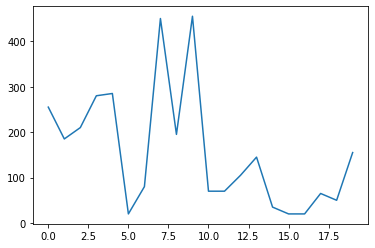

We are in the epoc:  37 Epsilon:  0.157779214788227
Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.3643 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.3589 - acc: 0.9219
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.3529 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.3492 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.3468 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 0.3453 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.3443 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 581us/step - loss: 0.3437 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.3434 - acc: 0.8359
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss

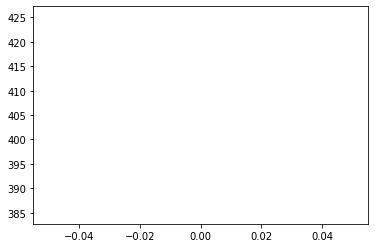

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 1.1197 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 1.1189 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.1178 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 1.1169 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 622us/step - loss: 1.1163 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 613us/step - loss: 1.1160 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 619us/step - loss: 1.1158 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 1.1156 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 1.1155 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 585us/step - loss: 1.1154 - acc: 0.9062
Epoch 11/32
128/128 [========

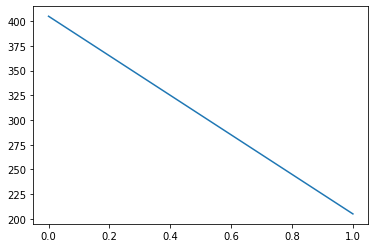

Epoch 1/32
128/128 [==============================] - 0s 600us/step - loss: 0.8465 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 0.8364 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 616us/step - loss: 0.8266 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 617us/step - loss: 0.8229 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.8223 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 618us/step - loss: 0.8219 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.8210 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 0.8200 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 628us/step - loss: 0.8192 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 611us/step - loss: 0.8189 - acc: 0.9375
Epoch 11/32
128/128 [========

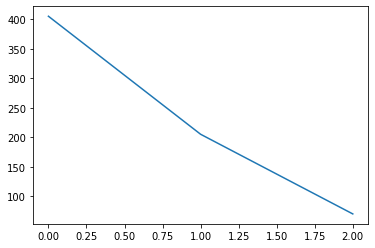

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 1.3328 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 1.3163 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 577us/step - loss: 1.3089 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 1.3072 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 1.3068 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 1.3065 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 1.3060 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 1.3055 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 1.3052 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 1.3050 - acc: 0.8906
Epoch 11/32
128/128 [========

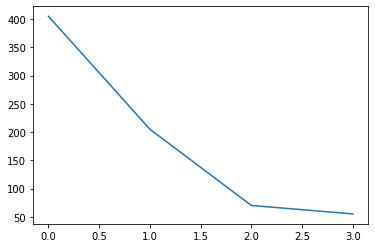

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 1.4446 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 1.4441 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 607us/step - loss: 1.4434 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.4429 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 1.4425 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.4423 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 1.4421 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.4419 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 600us/step - loss: 1.4416 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 1.4414 - acc: 0.9375
Epoch 11/32
128/128 [========

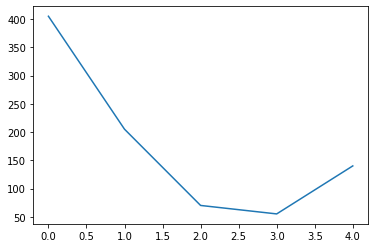

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 1.4388 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 1.4374 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 1.4359 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 1.4349 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 1.4344 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 580us/step - loss: 1.4340 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 1.4337 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 584us/step - loss: 1.4335 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 1.4333 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 1.4331 - acc: 0.9062
Epoch 11/32
128/128 [========

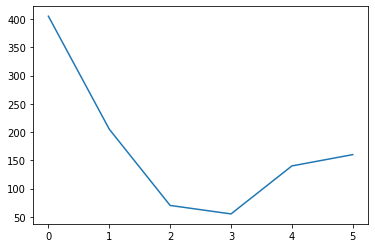

Epoch 1/32
128/128 [==============================] - 0s 588us/step - loss: 0.8680 - acc: 0.9531
Epoch 2/32
128/128 [==============================] - 0s 593us/step - loss: 0.8638 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.8611 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.8598 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.8592 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.8588 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 0.8585 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 620us/step - loss: 0.8582 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.8579 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 589us/step - loss: 0.8576 - acc: 0.9062
Epoch 11/32
128/128 [========

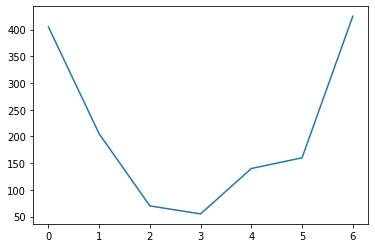

Epoch 1/32
128/128 [==============================] - 0s 579us/step - loss: 1.0035 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.9922 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.9772 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.9715 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 583us/step - loss: 0.9708 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.9711 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 0.9713 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.9714 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 589us/step - loss: 0.9713 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 0.9710 - acc: 0.8828
Epoch 11/32
128/128 [========

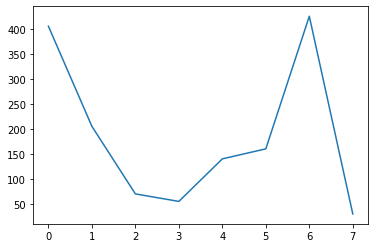

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 1.2911 - acc: 0.9297
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 1.2910 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 1.2908 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.2906 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 1.2904 - acc: 0.9531
Epoch 6/32
128/128 [==============================] - 0s 603us/step - loss: 1.2903 - acc: 0.9609
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 1.2902 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 610us/step - loss: 1.2901 - acc: 0.9531
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 1.2900 - acc: 0.9453
Epoch 10/32
128/128 [==============================] - 0s 595us/step - loss: 1.2899 - acc: 0.9453
Epoch 11/32
128/128 [========

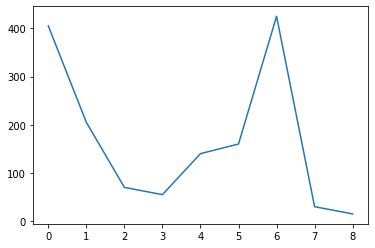

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.1390 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.1328 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 581us/step - loss: 0.1285 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 612us/step - loss: 0.1273 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 579us/step - loss: 0.1271 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 617us/step - loss: 0.1270 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 586us/step - loss: 0.1270 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.1269 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 563us/step - loss: 0.1267 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.1265 - acc: 0.9062
Epoch 11/32
128/128 [========

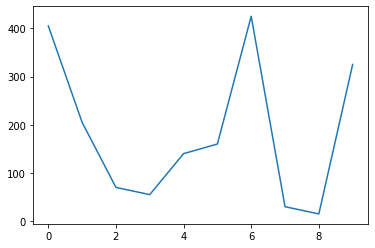

Epoch 1/32
128/128 [==============================] - 0s 574us/step - loss: 0.4896 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.4886 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.4871 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.4856 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.4841 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.4829 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.4821 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.4816 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.4813 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 598us/step - loss: 0.4812 - acc: 0.8281
Epoch 11/32
128/128 [========

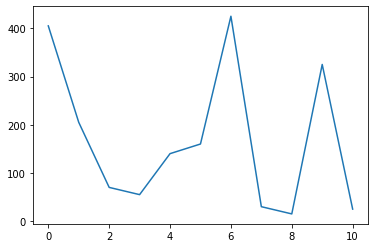

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 2.2895 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 2.2816 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 580us/step - loss: 2.2755 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 582us/step - loss: 2.2724 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 587us/step - loss: 2.2709 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 2.2702 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 2.2698 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 614us/step - loss: 2.2696 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 2.2694 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 2.2693 - acc: 0.9375
Epoch 11/32
128/128 [========

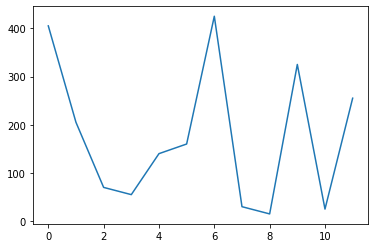

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.6166 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 580us/step - loss: 1.6053 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 1.5869 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 1.5697 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 1.5598 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 1.5551 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 1.5532 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 593us/step - loss: 1.5523 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 1.5518 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 1.5513 - acc: 0.8203
Epoch 11/32
128/128 [========

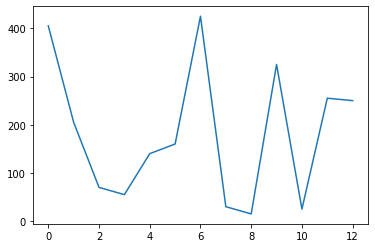

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.8424 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.8321 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.8221 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.8179 - acc: 0.9375
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.8168 - acc: 0.9297
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.8165 - acc: 0.9141
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.8163 - acc: 0.9219
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.8160 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 0.8157 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.8154 - acc: 0.9375
Epoch 11/32
128/128 [========

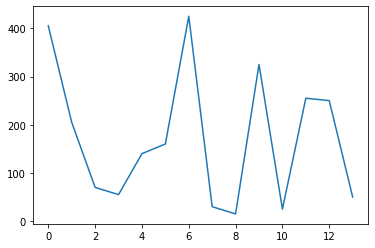

Epoch 1/32
128/128 [==============================] - 0s 586us/step - loss: 0.8745 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 590us/step - loss: 0.8710 - acc: 0.9297
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.8647 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 609us/step - loss: 0.8568 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.8496 - acc: 0.8672
Epoch 6/32
128/128 [==============================] - 0s 583us/step - loss: 0.8449 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.8423 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 583us/step - loss: 0.8408 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.8397 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 587us/step - loss: 0.8388 - acc: 0.8594
Epoch 11/32
128/128 [========

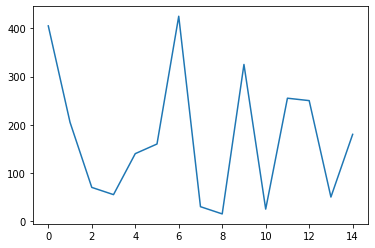

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.0368 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.0366 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 590us/step - loss: 0.0364 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 0.0361 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0358 - acc: 0.9141
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.0355 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 0.0353 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0351 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 578us/step - loss: 0.0349 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.0347 - acc: 0.8906
Epoch 11/32
128/128 [========

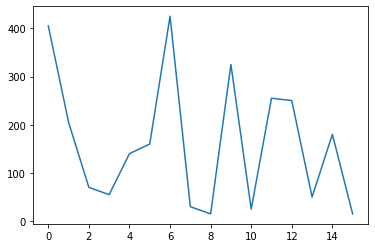

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.0043 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.0041 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0038 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0035 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 607us/step - loss: 0.0034 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.0034 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.0034 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 586us/step - loss: 0.0033 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0033 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 606us/step - loss: 0.0032 - acc: 0.8906
Epoch 11/32
128/128 [========

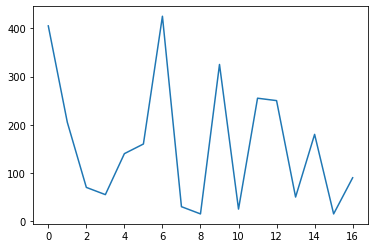

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.0059 - acc: 0.9375
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.0057 - acc: 0.9375
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0056 - acc: 0.9453
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0054 - acc: 0.9453
Epoch 5/32
128/128 [==============================] - 0s 582us/step - loss: 0.0052 - acc: 0.9453
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.0050 - acc: 0.9531
Epoch 7/32
128/128 [==============================] - 0s 599us/step - loss: 0.0048 - acc: 0.9531
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.0046 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 586us/step - loss: 0.0044 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.0043 - acc: 0.9297
Epoch 11/32
128/128 [========

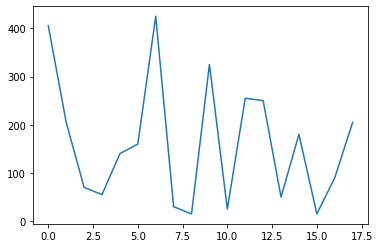

Epoch 1/32
128/128 [==============================] - 0s 591us/step - loss: 0.0669 - acc: 0.8359
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.0663 - acc: 0.8516
Epoch 3/32
128/128 [==============================] - 0s 606us/step - loss: 0.0655 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.0646 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 602us/step - loss: 0.0640 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 597us/step - loss: 0.0636 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 595us/step - loss: 0.0633 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 608us/step - loss: 0.0632 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.0630 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 614us/step - loss: 0.0629 - acc: 0.8438
Epoch 11/32
128/128 [========

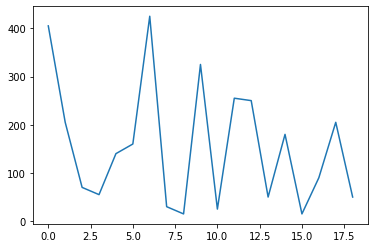

Epoch 1/32
128/128 [==============================] - 0s 565us/step - loss: 0.0032 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 594us/step - loss: 0.0031 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0030 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 601us/step - loss: 0.0029 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.0028 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 620us/step - loss: 0.0027 - acc: 0.9297
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 0.0026 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.0025 - acc: 0.9375
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.0024 - acc: 0.9375
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 0.0023 - acc: 0.9375
Epoch 11/32
128/128 [========

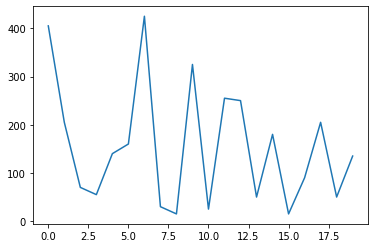

We are in the epoc:  38 Epsilon:  0.14989025404881567
Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 0.1313 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.1308 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.1304 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.1302 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.1301 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 590us/step - loss: 0.1300 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 634us/step - loss: 0.1299 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.1298 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 591us/step - loss: 0.1297 - acc: 0.9062
Epoch 10/32
128/128 [==============================] - 0s 580us/step - lo

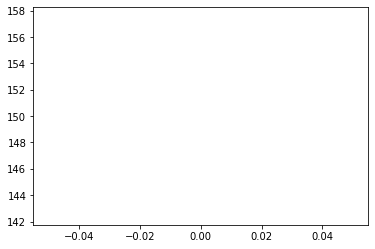

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.1291 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.1275 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.1259 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.1250 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.1245 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 586us/step - loss: 0.1243 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 582us/step - loss: 0.1241 - acc: 0.8125
Epoch 8/32
128/128 [==============================] - 0s 595us/step - loss: 0.1239 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.1237 - acc: 0.8125
Epoch 10/32
128/128 [==============================] - 0s 597us/step - loss: 0.1236 - acc: 0.8203
Epoch 11/32
128/128 [========

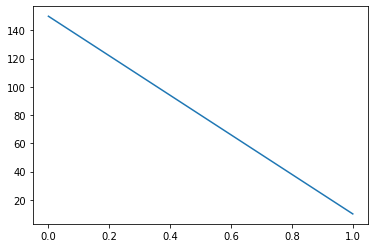

Epoch 1/32
128/128 [==============================] - 0s 584us/step - loss: 0.1303 - acc: 0.7812
Epoch 2/32
128/128 [==============================] - 0s 607us/step - loss: 0.1303 - acc: 0.7812
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.1302 - acc: 0.7734
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 0.1301 - acc: 0.7891
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.1300 - acc: 0.7891
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.1299 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 613us/step - loss: 0.1299 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.1298 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.1298 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.1297 - acc: 0.8281
Epoch 11/32
128/128 [========

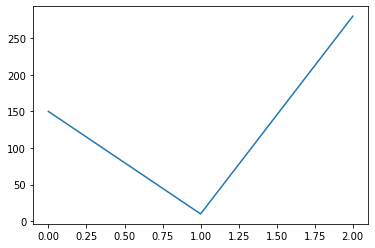

Epoch 1/32
128/128 [==============================] - 0s 601us/step - loss: 0.2974 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.2945 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.2922 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.2911 - acc: 0.8828
Epoch 5/32
128/128 [==============================] - 0s 610us/step - loss: 0.2906 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.2905 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 614us/step - loss: 0.2904 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.2903 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 593us/step - loss: 0.2902 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.2900 - acc: 0.8594
Epoch 11/32
128/128 [========

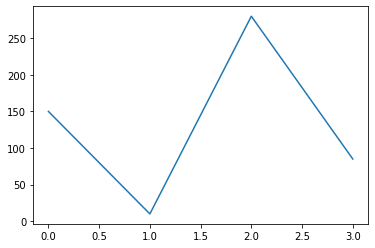

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 1.1285 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 1.1213 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 1.1137 - acc: 0.7969
Epoch 4/32
128/128 [==============================] - 0s 597us/step - loss: 1.1091 - acc: 0.7969
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 1.1072 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 592us/step - loss: 1.1065 - acc: 0.7656
Epoch 7/32
128/128 [==============================] - 0s 602us/step - loss: 1.1062 - acc: 0.7578
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 1.1060 - acc: 0.7500
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 1.1059 - acc: 0.7500
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.1057 - acc: 0.7500
Epoch 11/32
128/128 [========

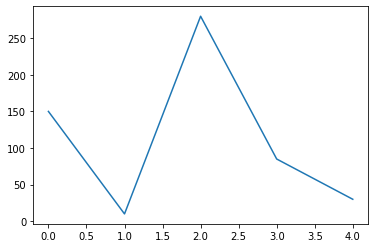

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.1291 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.1291 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.1291 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.1290 - acc: 0.8125
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.1289 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 600us/step - loss: 0.1289 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 598us/step - loss: 0.1288 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.1287 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.1287 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 616us/step - loss: 0.1287 - acc: 0.8281
Epoch 11/32
128/128 [========

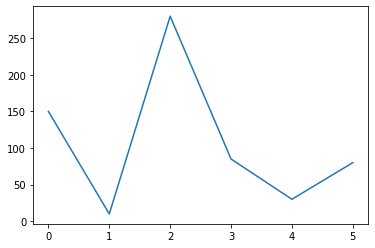

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.1303 - acc: 0.8125
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.1302 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 0.1302 - acc: 0.7656
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.1301 - acc: 0.7734
Epoch 5/32
128/128 [==============================] - 0s 604us/step - loss: 0.1300 - acc: 0.7734
Epoch 6/32
128/128 [==============================] - 0s 598us/step - loss: 0.1299 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 0.1299 - acc: 0.7656
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.1298 - acc: 0.7734
Epoch 9/32
128/128 [==============================] - 0s 621us/step - loss: 0.1297 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 612us/step - loss: 0.1296 - acc: 0.7812
Epoch 11/32
128/128 [========

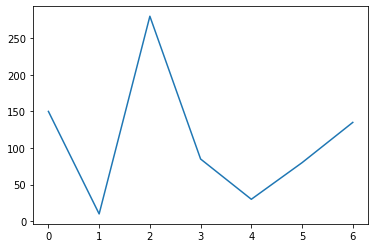

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0636 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 610us/step - loss: 0.0634 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 608us/step - loss: 0.0632 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 0.0629 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.0627 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.0625 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.0623 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 0.0621 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 596us/step - loss: 0.0620 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 618us/step - loss: 0.0619 - acc: 0.8516
Epoch 11/32
128/128 [========

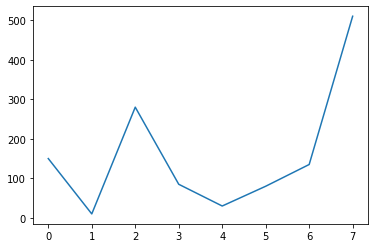

Epoch 1/32
128/128 [==============================] - 0s 596us/step - loss: 1.2922 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 1.2809 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 1.2710 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 1.2656 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 578us/step - loss: 1.2632 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 574us/step - loss: 1.2622 - acc: 0.8047
Epoch 7/32
128/128 [==============================] - 0s 616us/step - loss: 1.2618 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 603us/step - loss: 1.2616 - acc: 0.8125
Epoch 9/32
128/128 [==============================] - 0s 615us/step - loss: 1.2615 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 619us/step - loss: 1.2614 - acc: 0.8594
Epoch 11/32
128/128 [========

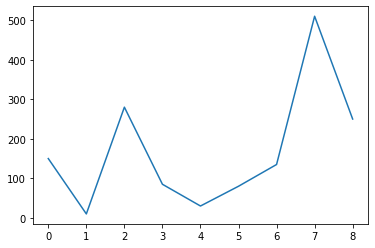

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.1248 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 587us/step - loss: 0.1247 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 0.1246 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 621us/step - loss: 0.1245 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 611us/step - loss: 0.1244 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 595us/step - loss: 0.1243 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 624us/step - loss: 0.1242 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.1241 - acc: 0.8594
Epoch 9/32
128/128 [==============================] - 0s 594us/step - loss: 0.1240 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.1240 - acc: 0.8750
Epoch 11/32
128/128 [========

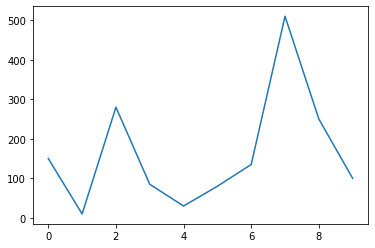

Epoch 1/32
128/128 [==============================] - 0s 583us/step - loss: 0.0034 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.0034 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 611us/step - loss: 0.0033 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.0032 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 592us/step - loss: 0.0030 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 584us/step - loss: 0.0029 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.0027 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 611us/step - loss: 0.0026 - acc: 0.9062
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 0.0025 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 603us/step - loss: 0.0024 - acc: 0.9062
Epoch 11/32
128/128 [========

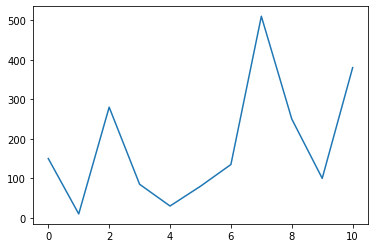

Epoch 1/32
128/128 [==============================] - 0s 572us/step - loss: 0.6905 - acc: 0.8516
Epoch 2/32
128/128 [==============================] - 0s 604us/step - loss: 0.6855 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 0.6793 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 0.6741 - acc: 0.7656
Epoch 5/32
128/128 [==============================] - 0s 596us/step - loss: 0.6708 - acc: 0.7500
Epoch 6/32
128/128 [==============================] - 0s 611us/step - loss: 0.6687 - acc: 0.7266
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.6672 - acc: 0.7188
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.6661 - acc: 0.7188
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.6654 - acc: 0.6875
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.6648 - acc: 0.6719
Epoch 11/32
128/128 [========

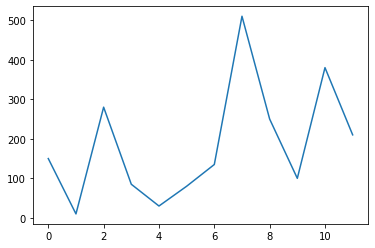

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 1.2398 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 1.2389 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 604us/step - loss: 1.2373 - acc: 0.9219
Epoch 4/32
128/128 [==============================] - 0s 594us/step - loss: 1.2352 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 1.2329 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 1.2308 - acc: 0.9062
Epoch 7/32
128/128 [==============================] - 0s 609us/step - loss: 1.2289 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 594us/step - loss: 1.2275 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.2263 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 1.2254 - acc: 0.8750
Epoch 11/32
128/128 [========

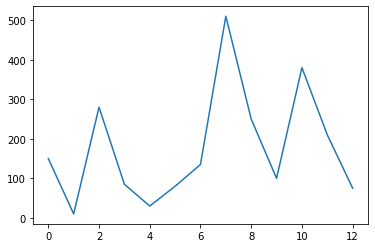

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 53.5474 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 616us/step - loss: 53.4772 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 601us/step - loss: 53.4406 - acc: 0.8516
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 53.4233 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 53.4110 - acc: 0.8125
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 53.4044 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 53.4011 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 53.3988 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 590us/step - loss: 53.3971 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 596us/step - loss: 53.3960 - acc: 0.7812
Epoch 11/32
128/128

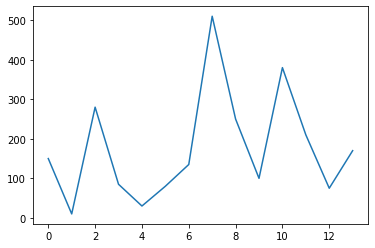

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.8088 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 613us/step - loss: 0.8044 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 597us/step - loss: 0.7991 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.7964 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 599us/step - loss: 0.7957 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.7955 - acc: 0.8438
Epoch 7/32
128/128 [==============================] - 0s 618us/step - loss: 0.7953 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.7951 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 597us/step - loss: 0.7948 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 624us/step - loss: 0.7945 - acc: 0.8750
Epoch 11/32
128/128 [========

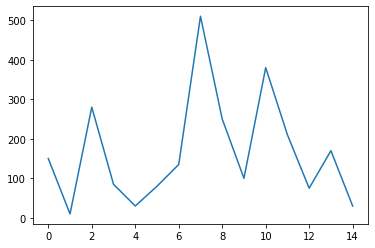

Epoch 1/32
128/128 [==============================] - 0s 578us/step - loss: 0.0045 - acc: 0.8906
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 0.0045 - acc: 0.8906
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 0.0045 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.0044 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.0044 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 618us/step - loss: 0.0043 - acc: 0.8828
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.0042 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 587us/step - loss: 0.0042 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 603us/step - loss: 0.0041 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 584us/step - loss: 0.0040 - acc: 0.8906
Epoch 11/32
128/128 [========

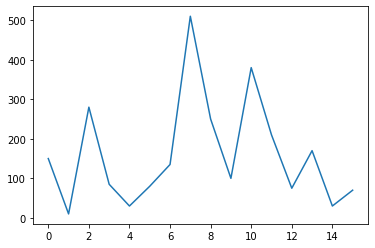

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.3140 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 600us/step - loss: 0.3134 - acc: 0.8047
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.3127 - acc: 0.8047
Epoch 4/32
128/128 [==============================] - 0s 615us/step - loss: 0.3119 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.3114 - acc: 0.7969
Epoch 6/32
128/128 [==============================] - 0s 622us/step - loss: 0.3109 - acc: 0.7812
Epoch 7/32
128/128 [==============================] - 0s 600us/step - loss: 0.3106 - acc: 0.7812
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.3104 - acc: 0.7812
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.3103 - acc: 0.7812
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.3101 - acc: 0.7812
Epoch 11/32
128/128 [========

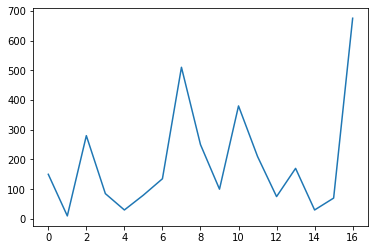

Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.0325 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.0324 - acc: 0.8359
Epoch 3/32
128/128 [==============================] - 0s 598us/step - loss: 0.0323 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.0322 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.0321 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 591us/step - loss: 0.0319 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 603us/step - loss: 0.0318 - acc: 0.8281
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.0317 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.0316 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.0316 - acc: 0.8359
Epoch 11/32
128/128 [========

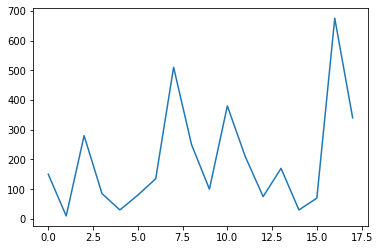

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.2927 - acc: 0.8828
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.2927 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.2926 - acc: 0.8828
Epoch 4/32
128/128 [==============================] - 0s 608us/step - loss: 0.2926 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.2925 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.2924 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.2923 - acc: 0.8984
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 0.2922 - acc: 0.8984
Epoch 9/32
128/128 [==============================] - 0s 599us/step - loss: 0.2921 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 609us/step - loss: 0.2920 - acc: 0.8906
Epoch 11/32
128/128 [========

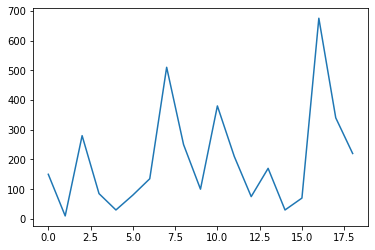

Epoch 1/32
128/128 [==============================] - 0s 604us/step - loss: 1.1833 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 1.1730 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 586us/step - loss: 1.1613 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 584us/step - loss: 1.1537 - acc: 0.8359
Epoch 5/32
128/128 [==============================] - 0s 589us/step - loss: 1.1505 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.1493 - acc: 0.7969
Epoch 7/32
128/128 [==============================] - 0s 584us/step - loss: 1.1489 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 1.1488 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 605us/step - loss: 1.1487 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 1.1485 - acc: 0.7812
Epoch 11/32
128/128 [========

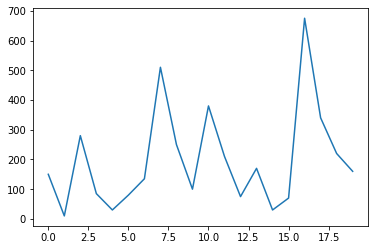

We are in the epoc:  39 Epsilon:  0.1423957413463749
Epoch 1/32
128/128 [==============================] - 0s 589us/step - loss: 0.5478 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 605us/step - loss: 0.5441 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.5379 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 582us/step - loss: 0.5312 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 0.5258 - acc: 0.9062
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 0.5225 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 612us/step - loss: 0.5208 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 591us/step - loss: 0.5200 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 609us/step - loss: 0.5195 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 598us/step - los

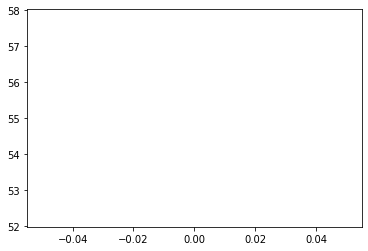

Epoch 1/32
128/128 [==============================] - 0s 598us/step - loss: 0.1288 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 0.1282 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 588us/step - loss: 0.1272 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 600us/step - loss: 0.1261 - acc: 0.8672
Epoch 5/32
128/128 [==============================] - 0s 619us/step - loss: 0.1251 - acc: 0.8594
Epoch 6/32
128/128 [==============================] - 0s 614us/step - loss: 0.1243 - acc: 0.8594
Epoch 7/32
128/128 [==============================] - 0s 626us/step - loss: 0.1237 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 606us/step - loss: 0.1232 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 595us/step - loss: 0.1229 - acc: 0.8984
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 0.1227 - acc: 0.8984
Epoch 11/32
128/128 [========

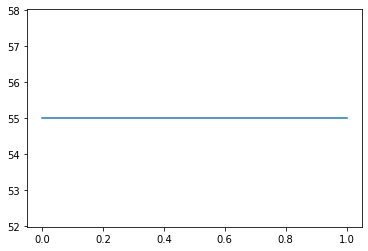

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 1.2677 - acc: 0.9453
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 1.2581 - acc: 0.9453
Epoch 3/32
128/128 [==============================] - 0s 595us/step - loss: 1.2477 - acc: 0.9297
Epoch 4/32
128/128 [==============================] - 0s 587us/step - loss: 1.2410 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 613us/step - loss: 1.2378 - acc: 0.8047
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 1.2366 - acc: 0.7656
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 1.2363 - acc: 0.7422
Epoch 8/32
128/128 [==============================] - 0s 597us/step - loss: 1.2362 - acc: 0.7031
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 1.2360 - acc: 0.7031
Epoch 10/32
128/128 [==============================] - 0s 601us/step - loss: 1.2358 - acc: 0.6953
Epoch 11/32
128/128 [========

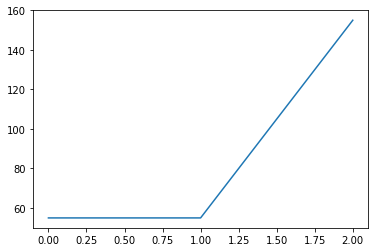

Epoch 1/32
128/128 [==============================] - 0s 603us/step - loss: 1.1700 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 612us/step - loss: 1.1670 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 1.1641 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 1.1621 - acc: 0.9062
Epoch 5/32
128/128 [==============================] - 0s 603us/step - loss: 1.1611 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 610us/step - loss: 1.1605 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 1.1602 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 575us/step - loss: 1.1601 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 1.1600 - acc: 0.8594
Epoch 10/32
128/128 [==============================] - 0s 607us/step - loss: 1.1599 - acc: 0.8750
Epoch 11/32
128/128 [========

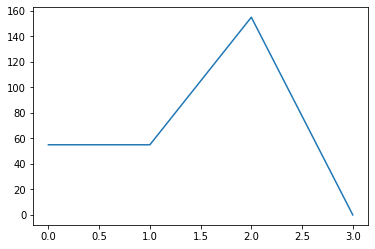

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.0035 - acc: 0.9141
Epoch 2/32
128/128 [==============================] - 0s 614us/step - loss: 0.0035 - acc: 0.9141
Epoch 3/32
128/128 [==============================] - 0s 596us/step - loss: 0.0034 - acc: 0.9141
Epoch 4/32
128/128 [==============================] - 0s 593us/step - loss: 0.0033 - acc: 0.9141
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.0032 - acc: 0.9219
Epoch 6/32
128/128 [==============================] - 0s 589us/step - loss: 0.0031 - acc: 0.9219
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.0029 - acc: 0.9297
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0028 - acc: 0.9297
Epoch 9/32
128/128 [==============================] - 0s 607us/step - loss: 0.0027 - acc: 0.9297
Epoch 10/32
128/128 [==============================] - 0s 593us/step - loss: 0.0025 - acc: 0.9219
Epoch 11/32
128/128 [========

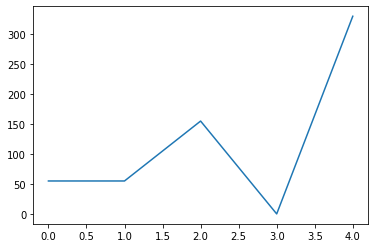

Epoch 1/32
128/128 [==============================] - 0s 593us/step - loss: 1.3040 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 598us/step - loss: 1.3027 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 1.3006 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 1.2982 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 593us/step - loss: 1.2959 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 1.2940 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 610us/step - loss: 1.2927 - acc: 0.9062
Epoch 8/32
128/128 [==============================] - 0s 613us/step - loss: 1.2918 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 619us/step - loss: 1.2913 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 1.2910 - acc: 0.8750
Epoch 11/32
128/128 [========

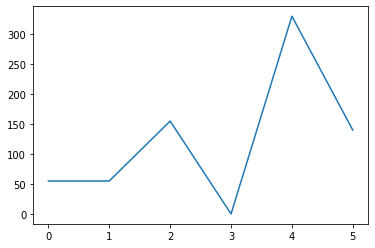

Epoch 1/32
128/128 [==============================] - 0s 617us/step - loss: 0.4131 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 599us/step - loss: 0.4117 - acc: 0.8438
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.4093 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 598us/step - loss: 0.4063 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 606us/step - loss: 0.4030 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 607us/step - loss: 0.3995 - acc: 0.8125
Epoch 7/32
128/128 [==============================] - 0s 587us/step - loss: 0.3961 - acc: 0.8203
Epoch 8/32
128/128 [==============================] - 0s 589us/step - loss: 0.3929 - acc: 0.8281
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.3898 - acc: 0.8203
Epoch 10/32
128/128 [==============================] - 0s 592us/step - loss: 0.3872 - acc: 0.8359
Epoch 11/32
128/128 [========

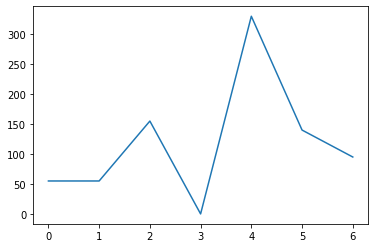

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.2942 - acc: 0.8281
Epoch 2/32
128/128 [==============================] - 0s 602us/step - loss: 0.2941 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 591us/step - loss: 0.2939 - acc: 0.8281
Epoch 4/32
128/128 [==============================] - 0s 606us/step - loss: 0.2938 - acc: 0.8203
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.2935 - acc: 0.8203
Epoch 6/32
128/128 [==============================] - 0s 608us/step - loss: 0.2933 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 608us/step - loss: 0.2931 - acc: 0.8438
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.2929 - acc: 0.8438
Epoch 9/32
128/128 [==============================] - 0s 621us/step - loss: 0.2928 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.2926 - acc: 0.8438
Epoch 11/32
128/128 [========

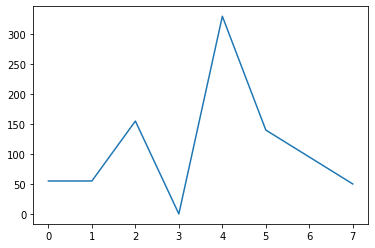

Epoch 1/32
128/128 [==============================] - 0s 602us/step - loss: 0.4509 - acc: 0.8984
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 0.4503 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 592us/step - loss: 0.4494 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 611us/step - loss: 0.4486 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 612us/step - loss: 0.4479 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.4473 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 604us/step - loss: 0.4468 - acc: 0.8594
Epoch 8/32
128/128 [==============================] - 0s 599us/step - loss: 0.4465 - acc: 0.8672
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.4462 - acc: 0.8438
Epoch 10/32
128/128 [==============================] - 0s 600us/step - loss: 0.4461 - acc: 0.8281
Epoch 11/32
128/128 [========

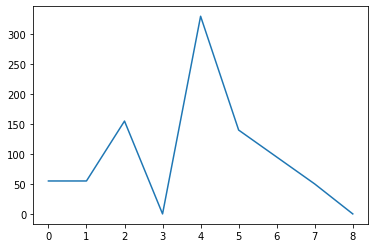

Epoch 1/32
128/128 [==============================] - 0s 609us/step - loss: 1.9588 - acc: 0.8203
Epoch 2/32
128/128 [==============================] - 0s 592us/step - loss: 1.9574 - acc: 0.8203
Epoch 3/32
128/128 [==============================] - 0s 599us/step - loss: 1.9557 - acc: 0.8125
Epoch 4/32
128/128 [==============================] - 0s 602us/step - loss: 1.9543 - acc: 0.8047
Epoch 5/32
128/128 [==============================] - 0s 590us/step - loss: 1.9534 - acc: 0.7812
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 1.9527 - acc: 0.7734
Epoch 7/32
128/128 [==============================] - 0s 601us/step - loss: 1.9523 - acc: 0.7891
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 1.9519 - acc: 0.7969
Epoch 9/32
128/128 [==============================] - 0s 606us/step - loss: 1.9517 - acc: 0.8047
Epoch 10/32
128/128 [==============================] - 0s 610us/step - loss: 1.9514 - acc: 0.8203
Epoch 11/32
128/128 [========

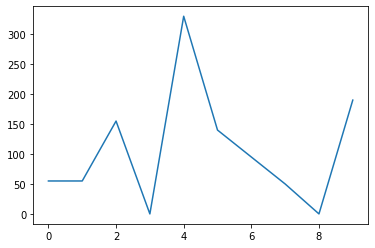

Epoch 1/32
128/128 [==============================] - 0s 599us/step - loss: 0.1866 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 630us/step - loss: 0.1841 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 614us/step - loss: 0.1825 - acc: 0.8984
Epoch 4/32
128/128 [==============================] - 0s 617us/step - loss: 0.1815 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 616us/step - loss: 0.1808 - acc: 0.8906
Epoch 6/32
128/128 [==============================] - 0s 625us/step - loss: 0.1804 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 615us/step - loss: 0.1801 - acc: 0.8828
Epoch 8/32
128/128 [==============================] - 0s 607us/step - loss: 0.1799 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 610us/step - loss: 0.1798 - acc: 0.8906
Epoch 10/32
128/128 [==============================] - 0s 599us/step - loss: 0.1796 - acc: 0.8906
Epoch 11/32
128/128 [========

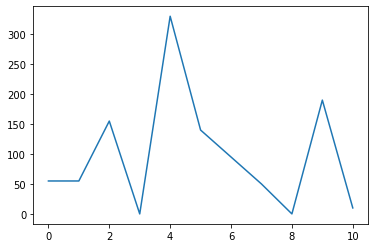

Epoch 1/32
128/128 [==============================] - 0s 580us/step - loss: 0.1905 - acc: 0.8750
Epoch 2/32
128/128 [==============================] - 0s 619us/step - loss: 0.1899 - acc: 0.8828
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.1890 - acc: 0.8906
Epoch 4/32
128/128 [==============================] - 0s 607us/step - loss: 0.1880 - acc: 0.8906
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.1872 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 605us/step - loss: 0.1866 - acc: 0.8906
Epoch 7/32
128/128 [==============================] - 0s 611us/step - loss: 0.1861 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.1859 - acc: 0.8828
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.1857 - acc: 0.8672
Epoch 10/32
128/128 [==============================] - 0s 605us/step - loss: 0.1856 - acc: 0.8672
Epoch 11/32
128/128 [========

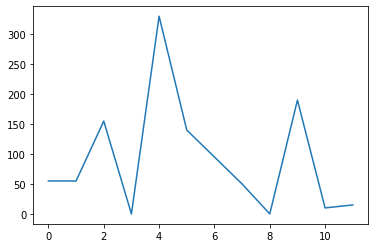

Epoch 1/32
128/128 [==============================] - 0s 587us/step - loss: 0.0324 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 603us/step - loss: 0.0324 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.0324 - acc: 0.8750
Epoch 4/32
128/128 [==============================] - 0s 589us/step - loss: 0.0323 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 594us/step - loss: 0.0322 - acc: 0.8750
Epoch 6/32
128/128 [==============================] - 0s 594us/step - loss: 0.0321 - acc: 0.8750
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.0321 - acc: 0.8906
Epoch 8/32
128/128 [==============================] - 0s 592us/step - loss: 0.0320 - acc: 0.8906
Epoch 9/32
128/128 [==============================] - 0s 601us/step - loss: 0.0319 - acc: 0.8828
Epoch 10/32
128/128 [==============================] - 0s 608us/step - loss: 0.0319 - acc: 0.8984
Epoch 11/32
128/128 [========

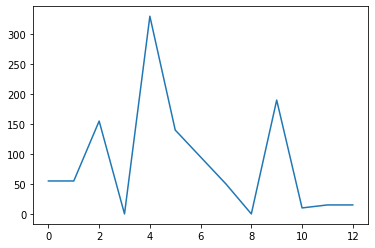

Epoch 1/32
128/128 [==============================] - 0s 582us/step - loss: 0.0040 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 591us/step - loss: 0.0039 - acc: 0.8984
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.0038 - acc: 0.9062
Epoch 4/32
128/128 [==============================] - 0s 613us/step - loss: 0.0037 - acc: 0.8984
Epoch 5/32
128/128 [==============================] - 0s 617us/step - loss: 0.0036 - acc: 0.8984
Epoch 6/32
128/128 [==============================] - 0s 602us/step - loss: 0.0034 - acc: 0.8984
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.0033 - acc: 0.9141
Epoch 8/32
128/128 [==============================] - 0s 604us/step - loss: 0.0031 - acc: 0.9141
Epoch 9/32
128/128 [==============================] - 0s 613us/step - loss: 0.0030 - acc: 0.9141
Epoch 10/32
128/128 [==============================] - 0s 613us/step - loss: 0.0029 - acc: 0.9219
Epoch 11/32
128/128 [========

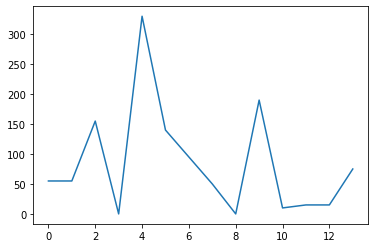

Epoch 1/32
128/128 [==============================] - 0s 590us/step - loss: 0.0031 - acc: 0.8047
Epoch 2/32
128/128 [==============================] - 0s 609us/step - loss: 0.0030 - acc: 0.8125
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.0029 - acc: 0.8203
Epoch 4/32
128/128 [==============================] - 0s 588us/step - loss: 0.0028 - acc: 0.8281
Epoch 5/32
128/128 [==============================] - 0s 608us/step - loss: 0.0026 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 604us/step - loss: 0.0024 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 594us/step - loss: 0.0023 - acc: 0.8359
Epoch 8/32
128/128 [==============================] - 0s 605us/step - loss: 0.0022 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.0021 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.0020 - acc: 0.8750
Epoch 11/32
128/128 [========

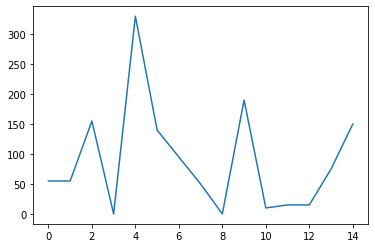

Epoch 1/32
128/128 [==============================] - 0s 594us/step - loss: 0.2922 - acc: 0.8594
Epoch 2/32
128/128 [==============================] - 0s 606us/step - loss: 0.2921 - acc: 0.8672
Epoch 3/32
128/128 [==============================] - 0s 593us/step - loss: 0.2919 - acc: 0.8359
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.2918 - acc: 0.8438
Epoch 5/32
128/128 [==============================] - 0s 601us/step - loss: 0.2916 - acc: 0.8438
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.2914 - acc: 0.8516
Epoch 7/32
128/128 [==============================] - 0s 593us/step - loss: 0.2912 - acc: 0.8516
Epoch 8/32
128/128 [==============================] - 0s 585us/step - loss: 0.2910 - acc: 0.8516
Epoch 9/32
128/128 [==============================] - 0s 598us/step - loss: 0.2908 - acc: 0.8516
Epoch 10/32
128/128 [==============================] - 0s 594us/step - loss: 0.2907 - acc: 0.8672
Epoch 11/32
128/128 [========

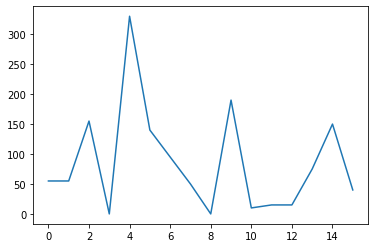

Epoch 1/32
128/128 [==============================] - 0s 577us/step - loss: 0.2679 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 595us/step - loss: 0.2632 - acc: 0.8750
Epoch 3/32
128/128 [==============================] - 0s 600us/step - loss: 0.2571 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 599us/step - loss: 0.2518 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 609us/step - loss: 0.2483 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 601us/step - loss: 0.2463 - acc: 0.8359
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.2452 - acc: 0.7969
Epoch 8/32
128/128 [==============================] - 0s 590us/step - loss: 0.2446 - acc: 0.8047
Epoch 9/32
128/128 [==============================] - 0s 584us/step - loss: 0.2443 - acc: 0.7969
Epoch 10/32
128/128 [==============================] - 0s 590us/step - loss: 0.2440 - acc: 0.7969
Epoch 11/32
128/128 [========

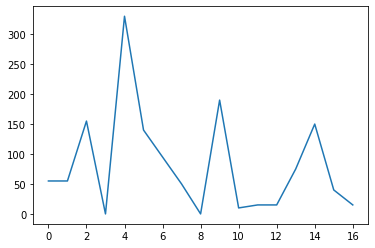

Epoch 1/32
128/128 [==============================] - 0s 581us/step - loss: 0.2911 - acc: 0.8672
Epoch 2/32
128/128 [==============================] - 0s 597us/step - loss: 0.2906 - acc: 0.8594
Epoch 3/32
128/128 [==============================] - 0s 594us/step - loss: 0.2898 - acc: 0.8594
Epoch 4/32
128/128 [==============================] - 0s 596us/step - loss: 0.2890 - acc: 0.8594
Epoch 5/32
128/128 [==============================] - 0s 595us/step - loss: 0.2881 - acc: 0.8516
Epoch 6/32
128/128 [==============================] - 0s 599us/step - loss: 0.2873 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 591us/step - loss: 0.2866 - acc: 0.8672
Epoch 8/32
128/128 [==============================] - 0s 596us/step - loss: 0.2861 - acc: 0.8203
Epoch 9/32
128/128 [==============================] - 0s 604us/step - loss: 0.2857 - acc: 0.8281
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.2854 - acc: 0.8359
Epoch 11/32
128/128 [========

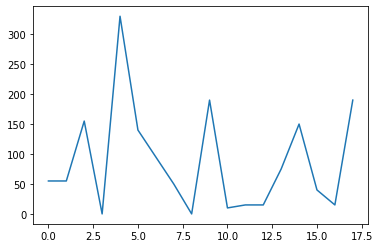

Epoch 1/32
128/128 [==============================] - 0s 595us/step - loss: 0.5200 - acc: 0.8438
Epoch 2/32
128/128 [==============================] - 0s 589us/step - loss: 0.5200 - acc: 0.8281
Epoch 3/32
128/128 [==============================] - 0s 603us/step - loss: 0.5198 - acc: 0.8438
Epoch 4/32
128/128 [==============================] - 0s 604us/step - loss: 0.5197 - acc: 0.8750
Epoch 5/32
128/128 [==============================] - 0s 600us/step - loss: 0.5195 - acc: 0.8828
Epoch 6/32
128/128 [==============================] - 0s 596us/step - loss: 0.5193 - acc: 0.8672
Epoch 7/32
128/128 [==============================] - 0s 606us/step - loss: 0.5191 - acc: 0.8750
Epoch 8/32
128/128 [==============================] - 0s 600us/step - loss: 0.5190 - acc: 0.8750
Epoch 9/32
128/128 [==============================] - 0s 611us/step - loss: 0.5189 - acc: 0.8750
Epoch 10/32
128/128 [==============================] - 0s 602us/step - loss: 0.5188 - acc: 0.8984
Epoch 11/32
128/128 [========

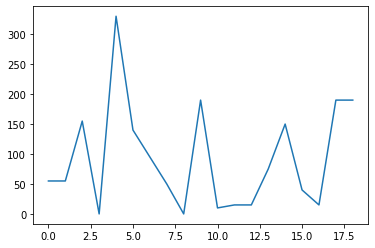

Epoch 1/32
128/128 [==============================] - 0s 576us/step - loss: 0.9755 - acc: 0.9062
Epoch 2/32
128/128 [==============================] - 0s 596us/step - loss: 0.9739 - acc: 0.9062
Epoch 3/32
128/128 [==============================] - 0s 612us/step - loss: 0.9712 - acc: 0.8672
Epoch 4/32
128/128 [==============================] - 0s 595us/step - loss: 0.9677 - acc: 0.8516
Epoch 5/32
128/128 [==============================] - 0s 581us/step - loss: 0.9636 - acc: 0.8359
Epoch 6/32
128/128 [==============================] - 0s 587us/step - loss: 0.9594 - acc: 0.8281
Epoch 7/32
128/128 [==============================] - 0s 590us/step - loss: 0.9556 - acc: 0.8047
Epoch 8/32
128/128 [==============================] - 0s 602us/step - loss: 0.9529 - acc: 0.7891
Epoch 9/32
128/128 [==============================] - 0s 602us/step - loss: 0.9513 - acc: 0.7578
Epoch 10/32
128/128 [==============================] - 0s 588us/step - loss: 0.9505 - acc: 0.7422
Epoch 11/32
128/128 [========

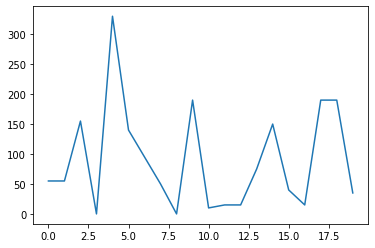

We are in the epoc:  40 Epsilon:  0.13527595427905614


KeyboardInterrupt: ignored

In [7]:
from numpy import expand_dims, copy, mean
from keras.losses import mean_squared_error
import gym
from skimage.color import rgb2gray


env = gym.make('SpaceInvaders-v0')

TRAINING_BATCH = 128
TRAINING_EPOCHS = 32

ALPHA = 0.1
GAMMA = 0.9
EPSILON = 1
EPSILON_DECAY = 0.05
EPSILON_MIN = 0.01

SIMULATION_EPOCHS = 50
SIMULATION_EPISODES = 20

local_network = q_network()
target_network = q_network()

memory = memory_reply(20000)

training_rew=[]

for epocs in range(SIMULATION_EPOCHS):
  print('We are in the epoc: ', epocs+1, 'Epsilon: ', EPSILON)
  if EPSILON > EPSILON_MIN:
    EPSILON -= (EPSILON*EPSILON_DECAY)

  memory.reset()
  epoc_rewards=[]
  

  for episode in range(SIMULATION_EPISODES):

    actual_state  = env.reset()    
    actual_state = normalize_frame(actual_state)

    done = False 
    episode_reward = 0

    while not done:
      actual_state_batch = expand_dims(actual_state, 0)
      q_values = local_network.predict(actual_state_batch)[0]
    
      selected_action, action_q_values = get_best_action_and_value(q_values=q_values)
      next_state, rew, done, _ = env.step(selected_action)
      next_state = normalize_frame(next_state)
      
      memory.memorize(actual_state, selected_action, next_state, rew, done)
      actual_state = next_state
      episode_reward += rew


    if memory.memory_size() >= TRAINING_BATCH:

      batch = memory.get_bacth(TRAINING_BATCH)
      actual_states = batch.actual_states
      actions = batch.actions
      next_states= batch.next_states  
      rewards = batch.rewards
      dones = batch.dones
      
      
      q_estimate = local_network.predict(actual_states)
      q_target =  target_network.predict(next_states)
      q_target = q_target.max(1)
      
    
      target = rewards + (q_target*GAMMA)
      Y = copy(q_estimate)
      

      for index, action in enumerate(actions):
        Y[index,action] = target[index]

      local_network.fit(actual_states, Y, TRAINING_BATCH, TRAINING_EPOCHS)
      target_network.set_weights(local_network.get_weights())
      _rew = reward_from_greedy_episode(local_network)
      epoc_rewards.append(_rew)

      plt.plot(epoc_rewards)
      plt.show()
